In [1]:
#Importing Libraries
import pandas as pd
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
import sklearn
from google.colab import drive
from sklearn.preprocessing import StandardScaler

In [2]:
drive.mount('/content/drive')
os.chdir('/content/drive/My Drive/Hyperparameter_Prediction/Dataset_hyperEarlyStop')#Where the data is stored

Mounted at /content/drive


In [3]:
os.listdir()

['HP_space.csv',
 'train_loss.csv',
 'eval_loss.csv',
 'eval_acc.csv',
 '.DS_Store',
 'dataPartition.txt',
 'README.md',
 'final_model',
 'final_modelv2']

In [4]:
df=pd.read_csv('train_loss.csv')

<ipython-input-4-14bee444911a>:1: DtypeWarning: Columns (0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,2

In [5]:
df

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,epoch_1,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 7494,Unnamed: 7495,Unnamed: 7496,Unnamed: 7497,Unnamed: 7498,Unnamed: 7499,Unnamed: 7500,Unnamed: 7501,Unnamed: 7502,Unnamed: 7503
0,L1,H1,L2,H2,batch_1,batch_2,batch_3,batch_4,batch_5,batch_6,...,batch_41,batch_42,batch_43,batch_44,batch_45,batch_46,batch_47,batch_48,batch_49,batch_50
1,3,4,0,0,2.285,2.254,2.168,2.103,2.075,1.998,...,0.598,0.601,0.619,0.577,0.592,0.59,0.614,0.638,0.634,0.644
2,3,5,0,0,2.283,2.187,2.093,2.061,2.015,1.988,...,0.505,0.448,0.469,0.541,0.48,0.523,0.49,0.514,0.462,0.485
3,3,6,0,0,2.285,2.231,2.13,2.086,2.082,2.011,...,0.549,0.533,0.539,0.572,0.577,0.568,0.565,0.565,0.552,0.579
4,3,7,0,0,2.297,2.209,2.147,2.095,1.992,2.026,...,0.559,0.547,0.534,0.557,0.536,0.532,0.547,0.533,0.569,0.518
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
198,3,4,8,6,2.295,2.202,2.143,2.1,2.083,2.042,...,0.805,0.849,0.793,0.743,0.816,0.752,0.788,0.81,0.797,0.829
199,3,4,8,8,2.295,2.226,2.16,2.1,2.096,2.059,...,0.825,0.774,0.815,0.787,0.841,0.857,0.862,0.836,0.803,0.8
200,3,4,8,10,2.3,2.23,2.18,2.145,2.111,2.027,...,0.69,0.639,0.687,0.674,0.705,0.727,0.704,0.658,0.697,0.692
201,3,4,8,12,2.307,2.231,2.175,2.132,2.065,2.046,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
#We will pick the training loss of last batch at each epoch.
df_hyperparameters=df.iloc[:,:4]

In [7]:
df_train_loss=df.iloc[:,53::50]

In [8]:
df_train_loss=df_train_loss.iloc[1:,]

In [9]:
df_hyperparameters=df_hyperparameters.iloc[1:,]

In [10]:
df_train_loss

,Unnamed: 53,Unnamed: 103,Unnamed: 153,Unnamed: 203,Unnamed: 253,Unnamed: 303,Unnamed: 353,Unnamed: 403,Unnamed: 453,Unnamed: 503,...,Unnamed: 7053,Unnamed: 7103,Unnamed: 7153,Unnamed: 7203,Unnamed: 7253,Unnamed: 7303,Unnamed: 7353,Unnamed: 7403,Unnamed: 7453,Unnamed: 7503
1,1.617,1.469,1.393,1.296,1.215,1.195,1.167,1.146,1.105,1.067,...,0.573,0.651,0.68,0.631,0.671,0.647,0.563,0.559,0.643,0.644
2,1.54,1.379,1.35,1.196,1.147,1.104,1.024,0.999,0.95,0.895,...,0.495,0.432,0.492,0.528,0.507,0.481,0.499,0.433,0.536,0.485
3,1.685,1.369,1.34,1.308,1.225,1.154,1.117,1.093,1.084,1.011,...,0.581,0.528,0.563,0.594,0.586,0.557,0.544,0.577,0.587,0.579
4,1.553,1.439,1.329,1.221,1.187,1.12,1.048,1.07,1,0.949,...,0.563,0.54,0.514,0.554,0.519,0.531,0.525,0.529,0.551,0.518
5,1.546,1.429,1.254,1.165,1.113,1.108,1.035,0.988,0.945,0.928,...,0.495,0.511,0.528,0.494,0.491,0.553,0.499,0.502,0.501,0.49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
198,1.707,1.494,1.446,1.415,1.28,1.297,1.182,1.196,1.194,1.168,...,0.833,0.815,0.791,0.8,0.805,0.805,0.83,0.806,0.79,0.829
199,1.726,1.542,1.453,1.393,1.413,1.319,1.3,1.2,1.213,1.184,...,0.807,0.811,0.804,0.847,0.835,0.819,0.844,0.851,0.794,0.8
200,1.699,1.505,1.398,1.259,1.263,1.2,1.181,1.181,1.111,1.109,...,0.615,0.637,0.678,0.669,0.69,0.701,0.686,0.699,0.653,0.692
201,1.703,1.522,1.434,1.385,1.324,1.279,1.235,1.257,1.201,1.153,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
df_hyperparameters

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3
1,3,4,0,0
2,3,5,0,0
3,3,6,0,0
4,3,7,0,0
5,3,8,0,0
...,...,...,...,...
198,3,4,8,6
199,3,4,8,8
200,3,4,8,10
201,3,4,8,12


In [12]:
hp_train_loss_df=pd.concat([df_hyperparameters, df_train_loss], axis=1)

In [13]:
hp_train_loss_df

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 53,Unnamed: 103,Unnamed: 153,Unnamed: 203,Unnamed: 253,Unnamed: 303,...,Unnamed: 7053,Unnamed: 7103,Unnamed: 7153,Unnamed: 7203,Unnamed: 7253,Unnamed: 7303,Unnamed: 7353,Unnamed: 7403,Unnamed: 7453,Unnamed: 7503
1,3,4,0,0,1.617,1.469,1.393,1.296,1.215,1.195,...,0.573,0.651,0.68,0.631,0.671,0.647,0.563,0.559,0.643,0.644
2,3,5,0,0,1.54,1.379,1.35,1.196,1.147,1.104,...,0.495,0.432,0.492,0.528,0.507,0.481,0.499,0.433,0.536,0.485
3,3,6,0,0,1.685,1.369,1.34,1.308,1.225,1.154,...,0.581,0.528,0.563,0.594,0.586,0.557,0.544,0.577,0.587,0.579
4,3,7,0,0,1.553,1.439,1.329,1.221,1.187,1.12,...,0.563,0.54,0.514,0.554,0.519,0.531,0.525,0.529,0.551,0.518
5,3,8,0,0,1.546,1.429,1.254,1.165,1.113,1.108,...,0.495,0.511,0.528,0.494,0.491,0.553,0.499,0.502,0.501,0.49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
198,3,4,8,6,1.707,1.494,1.446,1.415,1.28,1.297,...,0.833,0.815,0.791,0.8,0.805,0.805,0.83,0.806,0.79,0.829
199,3,4,8,8,1.726,1.542,1.453,1.393,1.413,1.319,...,0.807,0.811,0.804,0.847,0.835,0.819,0.844,0.851,0.794,0.8
200,3,4,8,10,1.699,1.505,1.398,1.259,1.263,1.2,...,0.615,0.637,0.678,0.669,0.69,0.701,0.686,0.699,0.653,0.692
201,3,4,8,12,1.703,1.522,1.434,1.385,1.324,1.279,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
df_eval_loss=pd.read_csv('eval_loss.csv')

In [15]:
df_eval_loss

,L1,H1,L2,H2,epoch_1,epoch_2,epoch_3,epoch_4,epoch_5,epoch_6,...,epoch_141,epoch_142,epoch_143,epoch_144,epoch_145,epoch_146,epoch_147,epoch_148,epoch_149,epoch_150
0,3,4,0,0,1.52332,1.33248,1.27089,1.21834,1.20135,1.14159,...,1.02031,1.02160,1.02284,1.02495,1.04469,1.03849,1.02693,1.02176,1.02810,1.00954
1,3,5,0,0,1.42391,1.31039,1.14298,1.15141,1.05960,1.10058,...,0.90324,0.89469,0.90203,0.90636,0.89365,0.89999,0.91248,0.89115,0.89431,0.91435
2,3,6,0,0,1.51030,1.35697,1.24436,1.19246,1.16901,1.09636,...,0.98321,0.98734,0.99506,0.99040,0.98634,0.98861,0.98281,0.96875,0.98039,0.97649
3,3,7,0,0,1.49031,1.28391,1.21113,1.19441,1.09927,1.07175,...,0.92473,0.91630,0.90956,0.90825,0.92119,0.91781,0.91272,0.91210,0.91290,0.91833
4,3,8,0,0,1.42823,1.25468,1.18538,1.09234,1.04129,1.00743,...,0.88154,0.87421,0.87666,0.86612,0.86576,0.86915,0.87428,0.87241,0.88057,0.87955
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199,3,4,8,6,1.71504,1.58522,1.58067,1.51313,1.50656,1.43416,...,1.42088,1.40040,1.44347,1.51914,1.48245,1.38967,1.41427,1.38796,1.42785,1.50478
200,3,4,8,8,1.76575,1.59649,1.63956,1.52799,1.47745,1.41070,...,1.34234,1.32800,1.32745,1.31901,1.33631,1.31591,1.35848,1.33216,1.31453,1.33992
201,3,4,8,10,1.64943,1.51078,1.42041,1.33133,1.31672,1.32507,...,1.16164,1.17042,1.18172,1.19754,1.21205,1.15806,1.18568,1.13320,1.18360,1.19546
202,3,4,8,12,1.63926,1.55053,1.46117,1.41512,1.38881,1.31677,...,1.12982,1.14530,1.12501,1.13264,1.14269,1.13442,1.13576,1.15576,1.15447,1.13650


In [16]:
hp_train_loss_df.columns=['L1', 'H1', 'L2', 'H2'] + list(hp_train_loss_df.columns[4:])

In [17]:
hp_train_loss_df

,L1,H1,L2,H2,Unnamed: 53,Unnamed: 103,Unnamed: 153,Unnamed: 203,Unnamed: 253,Unnamed: 303,...,Unnamed: 7053,Unnamed: 7103,Unnamed: 7153,Unnamed: 7203,Unnamed: 7253,Unnamed: 7303,Unnamed: 7353,Unnamed: 7403,Unnamed: 7453,Unnamed: 7503
1,3,4,0,0,1.617,1.469,1.393,1.296,1.215,1.195,...,0.573,0.651,0.68,0.631,0.671,0.647,0.563,0.559,0.643,0.644
2,3,5,0,0,1.54,1.379,1.35,1.196,1.147,1.104,...,0.495,0.432,0.492,0.528,0.507,0.481,0.499,0.433,0.536,0.485
3,3,6,0,0,1.685,1.369,1.34,1.308,1.225,1.154,...,0.581,0.528,0.563,0.594,0.586,0.557,0.544,0.577,0.587,0.579
4,3,7,0,0,1.553,1.439,1.329,1.221,1.187,1.12,...,0.563,0.54,0.514,0.554,0.519,0.531,0.525,0.529,0.551,0.518
5,3,8,0,0,1.546,1.429,1.254,1.165,1.113,1.108,...,0.495,0.511,0.528,0.494,0.491,0.553,0.499,0.502,0.501,0.49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
198,3,4,8,6,1.707,1.494,1.446,1.415,1.28,1.297,...,0.833,0.815,0.791,0.8,0.805,0.805,0.83,0.806,0.79,0.829
199,3,4,8,8,1.726,1.542,1.453,1.393,1.413,1.319,...,0.807,0.811,0.804,0.847,0.835,0.819,0.844,0.851,0.794,0.8
200,3,4,8,10,1.699,1.505,1.398,1.259,1.263,1.2,...,0.615,0.637,0.678,0.669,0.69,0.701,0.686,0.699,0.653,0.692
201,3,4,8,12,1.703,1.522,1.434,1.385,1.324,1.279,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [18]:
df_eval_loss

,L1,H1,L2,H2,epoch_1,epoch_2,epoch_3,epoch_4,epoch_5,epoch_6,...,epoch_141,epoch_142,epoch_143,epoch_144,epoch_145,epoch_146,epoch_147,epoch_148,epoch_149,epoch_150
0,3,4,0,0,1.52332,1.33248,1.27089,1.21834,1.20135,1.14159,...,1.02031,1.02160,1.02284,1.02495,1.04469,1.03849,1.02693,1.02176,1.02810,1.00954
1,3,5,0,0,1.42391,1.31039,1.14298,1.15141,1.05960,1.10058,...,0.90324,0.89469,0.90203,0.90636,0.89365,0.89999,0.91248,0.89115,0.89431,0.91435
2,3,6,0,0,1.51030,1.35697,1.24436,1.19246,1.16901,1.09636,...,0.98321,0.98734,0.99506,0.99040,0.98634,0.98861,0.98281,0.96875,0.98039,0.97649
3,3,7,0,0,1.49031,1.28391,1.21113,1.19441,1.09927,1.07175,...,0.92473,0.91630,0.90956,0.90825,0.92119,0.91781,0.91272,0.91210,0.91290,0.91833
4,3,8,0,0,1.42823,1.25468,1.18538,1.09234,1.04129,1.00743,...,0.88154,0.87421,0.87666,0.86612,0.86576,0.86915,0.87428,0.87241,0.88057,0.87955
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199,3,4,8,6,1.71504,1.58522,1.58067,1.51313,1.50656,1.43416,...,1.42088,1.40040,1.44347,1.51914,1.48245,1.38967,1.41427,1.38796,1.42785,1.50478
200,3,4,8,8,1.76575,1.59649,1.63956,1.52799,1.47745,1.41070,...,1.34234,1.32800,1.32745,1.31901,1.33631,1.31591,1.35848,1.33216,1.31453,1.33992
201,3,4,8,10,1.64943,1.51078,1.42041,1.33133,1.31672,1.32507,...,1.16164,1.17042,1.18172,1.19754,1.21205,1.15806,1.18568,1.13320,1.18360,1.19546
202,3,4,8,12,1.63926,1.55053,1.46117,1.41512,1.38881,1.31677,...,1.12982,1.14530,1.12501,1.13264,1.14269,1.13442,1.13576,1.15576,1.15447,1.13650


In [19]:
hp_train_loss_df.iloc[:, :4] = hp_train_loss_df.iloc[:, :4].astype(int)

<ipython-input-19-0e8295c8a034>:1: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  hp_train_loss_df.iloc[:, :4] = hp_train_loss_df.iloc[:, :4].astype(int)


Joining the train and eval loss

In [20]:
df_merged = pd.merge(hp_train_loss_df, df_eval_loss, on=['L1', 'H1', 'L2', 'H2'], how='left')

In [21]:
df_merged

,L1,H1,L2,H2,Unnamed: 53,Unnamed: 103,Unnamed: 153,Unnamed: 203,Unnamed: 253,Unnamed: 303,...,epoch_141,epoch_142,epoch_143,epoch_144,epoch_145,epoch_146,epoch_147,epoch_148,epoch_149,epoch_150
0,3,4,0,0,1.617,1.469,1.393,1.296,1.215,1.195,...,1.02031,1.02160,1.02284,1.02495,1.04469,1.03849,1.02693,1.02176,1.02810,1.00954
1,3,5,0,0,1.54,1.379,1.35,1.196,1.147,1.104,...,0.90324,0.89469,0.90203,0.90636,0.89365,0.89999,0.91248,0.89115,0.89431,0.91435
2,3,6,0,0,1.685,1.369,1.34,1.308,1.225,1.154,...,0.98321,0.98734,0.99506,0.99040,0.98634,0.98861,0.98281,0.96875,0.98039,0.97649
3,3,7,0,0,1.553,1.439,1.329,1.221,1.187,1.12,...,0.92473,0.91630,0.90956,0.90825,0.92119,0.91781,0.91272,0.91210,0.91290,0.91833
4,3,8,0,0,1.546,1.429,1.254,1.165,1.113,1.108,...,0.88154,0.87421,0.87666,0.86612,0.86576,0.86915,0.87428,0.87241,0.88057,0.87955
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197,3,4,8,6,1.707,1.494,1.446,1.415,1.28,1.297,...,1.42088,1.40040,1.44347,1.51914,1.48245,1.38967,1.41427,1.38796,1.42785,1.50478
198,3,4,8,8,1.726,1.542,1.453,1.393,1.413,1.319,...,1.34234,1.32800,1.32745,1.31901,1.33631,1.31591,1.35848,1.33216,1.31453,1.33992
199,3,4,8,10,1.699,1.505,1.398,1.259,1.263,1.2,...,1.16164,1.17042,1.18172,1.19754,1.21205,1.15806,1.18568,1.13320,1.18360,1.19546
200,3,4,8,12,1.703,1.522,1.434,1.385,1.324,1.279,...,1.12982,1.14530,1.12501,1.13264,1.14269,1.13442,1.13576,1.15576,1.15447,1.13650


In [22]:
print(hp_train_loss_df.columns[:4])

Index(['L1', 'H1', 'L2', 'H2'], dtype='object')


In [23]:
print(df_eval_loss.columns[:4])

Index(['L1', 'H1', 'L2', 'H2'], dtype='object')


In [24]:
df_eval_loss.dtypes

L1             int64
H1             int64
L2             int64
H2             int64
epoch_1      float64
              ...   
epoch_146    float64
epoch_147    float64
epoch_148    float64
epoch_149    float64
epoch_150    float64
Length: 154, dtype: object

In [25]:
hp_train_loss_df.dtypes

L1                int64
H1                int64
L2                int64
H2                int64
Unnamed: 53      object
                  ...  
Unnamed: 7303    object
Unnamed: 7353    object
Unnamed: 7403    object
Unnamed: 7453    object
Unnamed: 7503    object
Length: 154, dtype: object

In [26]:
df_merged.isna().sum(axis=1).astype(bool).sum()

2

In [27]:
df_merged.isnull().any(axis=1)

0      False
1      False
2      False
3      False
4      False
       ...  
197    False
198    False
199    False
200     True
201     True
Length: 202, dtype: bool

In [28]:
df_merged.dropna(inplace=True)

In [29]:
df_merged

,L1,H1,L2,H2,Unnamed: 53,Unnamed: 103,Unnamed: 153,Unnamed: 203,Unnamed: 253,Unnamed: 303,...,epoch_141,epoch_142,epoch_143,epoch_144,epoch_145,epoch_146,epoch_147,epoch_148,epoch_149,epoch_150
0,3,4,0,0,1.617,1.469,1.393,1.296,1.215,1.195,...,1.02031,1.02160,1.02284,1.02495,1.04469,1.03849,1.02693,1.02176,1.02810,1.00954
1,3,5,0,0,1.54,1.379,1.35,1.196,1.147,1.104,...,0.90324,0.89469,0.90203,0.90636,0.89365,0.89999,0.91248,0.89115,0.89431,0.91435
2,3,6,0,0,1.685,1.369,1.34,1.308,1.225,1.154,...,0.98321,0.98734,0.99506,0.99040,0.98634,0.98861,0.98281,0.96875,0.98039,0.97649
3,3,7,0,0,1.553,1.439,1.329,1.221,1.187,1.12,...,0.92473,0.91630,0.90956,0.90825,0.92119,0.91781,0.91272,0.91210,0.91290,0.91833
4,3,8,0,0,1.546,1.429,1.254,1.165,1.113,1.108,...,0.88154,0.87421,0.87666,0.86612,0.86576,0.86915,0.87428,0.87241,0.88057,0.87955
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,3,4,5,14,1.661,1.515,1.504,1.364,1.325,1.268,...,1.21572,1.18474,1.18069,1.21480,1.17933,1.18535,1.17846,1.18477,1.16816,1.17029
196,3,4,8,4,1.723,1.626,1.544,1.444,1.454,1.38,...,1.38236,1.44047,1.43346,1.40450,1.50218,1.43136,1.43735,1.40470,1.41873,1.44541
197,3,4,8,6,1.707,1.494,1.446,1.415,1.28,1.297,...,1.42088,1.40040,1.44347,1.51914,1.48245,1.38967,1.41427,1.38796,1.42785,1.50478
198,3,4,8,8,1.726,1.542,1.453,1.393,1.413,1.319,...,1.34234,1.32800,1.32745,1.31901,1.33631,1.31591,1.35848,1.33216,1.31453,1.33992


In [30]:
eval_acc=pd.read_csv('eval_acc.csv')

In [31]:
eval_acc

,L1,H1,L2,H2,epoch_1,epoch_2,epoch_3,epoch_4,epoch_5,epoch_6,...,epoch_141,epoch_142,epoch_143,epoch_144,epoch_145,epoch_146,epoch_147,epoch_148,epoch_149,epoch_150
0,3,4,0,0,0.4406,0.5187,0.5408,0.5667,0.5715,0.5954,...,0.6747,0.6711,0.6728,0.6693,0.6741,0.6778,0.6755,0.6765,0.6723,0.6712
1,3,5,0,0,0.4840,0.5188,0.5925,0.5950,0.6226,0.6209,...,0.7244,0.7220,0.7242,0.7213,0.7223,0.7243,0.7227,0.7230,0.7225,0.7228
2,3,6,0,0,0.4502,0.5097,0.5534,0.5717,0.5885,0.6129,...,0.6907,0.6872,0.6890,0.6874,0.6894,0.6884,0.6908,0.6875,0.6884,0.6903
3,3,7,0,0,0.4642,0.5356,0.5693,0.5785,0.6153,0.6260,...,0.7106,0.7103,0.7139,0.7145,0.7118,0.7117,0.7124,0.7111,0.7121,0.7133
4,3,8,0,0,0.4891,0.5453,0.5748,0.6139,0.6328,0.6514,...,0.7258,0.7287,0.7271,0.7307,0.7285,0.7293,0.7269,0.7275,0.7269,0.7289
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199,3,4,8,6,0.3824,0.4322,0.4656,0.4692,0.4921,0.5248,...,0.5811,0.5490,0.5802,0.5846,0.5748,0.5767,0.5671,0.5741,0.5644,0.5731
200,3,4,8,8,0.3723,0.4261,0.4466,0.4691,0.4793,0.5119,...,0.5728,0.5782,0.5674,0.5821,0.5930,0.5742,0.5602,0.5917,0.5815,0.5809
201,3,4,8,10,0.3998,0.4579,0.5098,0.5353,0.5305,0.5560,...,0.6320,0.6391,0.6345,0.6382,0.6403,0.6283,0.6342,0.6381,0.6399,0.6359
202,3,4,8,12,0.4094,0.4536,0.4823,0.4930,0.5193,0.5381,...,0.6413,0.6455,0.6371,0.6467,0.6488,0.6422,0.6432,0.6397,0.6399,0.6375


Adding eval accuracy to the dataframe

In [32]:
df_merged=pd.merge(df_merged,eval_acc,on=['L1', 'H1', 'L2', 'H2'], how='left')

In [33]:
df_merged

,L1,H1,L2,H2,Unnamed: 53,Unnamed: 103,Unnamed: 153,Unnamed: 203,Unnamed: 253,Unnamed: 303,...,epoch_141_y,epoch_142_y,epoch_143_y,epoch_144_y,epoch_145_y,epoch_146_y,epoch_147_y,epoch_148_y,epoch_149_y,epoch_150_y
0,3,4,0,0,1.617,1.469,1.393,1.296,1.215,1.195,...,0.6747,0.6711,0.6728,0.6693,0.6741,0.6778,0.6755,0.6765,0.6723,0.6712
1,3,5,0,0,1.54,1.379,1.35,1.196,1.147,1.104,...,0.7244,0.7220,0.7242,0.7213,0.7223,0.7243,0.7227,0.7230,0.7225,0.7228
2,3,6,0,0,1.685,1.369,1.34,1.308,1.225,1.154,...,0.6907,0.6872,0.6890,0.6874,0.6894,0.6884,0.6908,0.6875,0.6884,0.6903
3,3,7,0,0,1.553,1.439,1.329,1.221,1.187,1.12,...,0.7106,0.7103,0.7139,0.7145,0.7118,0.7117,0.7124,0.7111,0.7121,0.7133
4,3,8,0,0,1.546,1.429,1.254,1.165,1.113,1.108,...,0.7258,0.7287,0.7271,0.7307,0.7285,0.7293,0.7269,0.7275,0.7269,0.7289
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,3,4,5,14,1.661,1.515,1.504,1.364,1.325,1.268,...,0.6329,0.6329,0.6298,0.6377,0.6323,0.6387,0.6273,0.6373,0.6300,0.6305
196,3,4,8,4,1.723,1.626,1.544,1.444,1.454,1.38,...,0.5427,0.5509,0.5555,0.5505,0.5435,0.5504,0.5530,0.5585,0.5589,0.5531
197,3,4,8,6,1.707,1.494,1.446,1.415,1.28,1.297,...,0.5811,0.5490,0.5802,0.5846,0.5748,0.5767,0.5671,0.5741,0.5644,0.5731
198,3,4,8,8,1.726,1.542,1.453,1.393,1.413,1.319,...,0.5728,0.5782,0.5674,0.5821,0.5930,0.5742,0.5602,0.5917,0.5815,0.5809


In [34]:
df_merged.columns=list(df_merged.columns[:4])+['train_loss_epoch_'+str(i) for i in range(1,151)]+list(df_merged.columns[154:])

In [35]:
df_merged.columns[:156]

Index(['L1', 'H1', 'L2', 'H2', 'train_loss_epoch_1', 'train_loss_epoch_2',
       'train_loss_epoch_3', 'train_loss_epoch_4', 'train_loss_epoch_5',
       'train_loss_epoch_6',
       ...
       'train_loss_epoch_143', 'train_loss_epoch_144', 'train_loss_epoch_145',
       'train_loss_epoch_146', 'train_loss_epoch_147', 'train_loss_epoch_148',
       'train_loss_epoch_149', 'train_loss_epoch_150', 'epoch_1_x',
       'epoch_2_x'],
      dtype='object', length=156)

In [36]:
df_merged

,L1,H1,L2,H2,train_loss_epoch_1,train_loss_epoch_2,train_loss_epoch_3,train_loss_epoch_4,train_loss_epoch_5,train_loss_epoch_6,...,epoch_141_y,epoch_142_y,epoch_143_y,epoch_144_y,epoch_145_y,epoch_146_y,epoch_147_y,epoch_148_y,epoch_149_y,epoch_150_y
0,3,4,0,0,1.617,1.469,1.393,1.296,1.215,1.195,...,0.6747,0.6711,0.6728,0.6693,0.6741,0.6778,0.6755,0.6765,0.6723,0.6712
1,3,5,0,0,1.54,1.379,1.35,1.196,1.147,1.104,...,0.7244,0.7220,0.7242,0.7213,0.7223,0.7243,0.7227,0.7230,0.7225,0.7228
2,3,6,0,0,1.685,1.369,1.34,1.308,1.225,1.154,...,0.6907,0.6872,0.6890,0.6874,0.6894,0.6884,0.6908,0.6875,0.6884,0.6903
3,3,7,0,0,1.553,1.439,1.329,1.221,1.187,1.12,...,0.7106,0.7103,0.7139,0.7145,0.7118,0.7117,0.7124,0.7111,0.7121,0.7133
4,3,8,0,0,1.546,1.429,1.254,1.165,1.113,1.108,...,0.7258,0.7287,0.7271,0.7307,0.7285,0.7293,0.7269,0.7275,0.7269,0.7289
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,3,4,5,14,1.661,1.515,1.504,1.364,1.325,1.268,...,0.6329,0.6329,0.6298,0.6377,0.6323,0.6387,0.6273,0.6373,0.6300,0.6305
196,3,4,8,4,1.723,1.626,1.544,1.444,1.454,1.38,...,0.5427,0.5509,0.5555,0.5505,0.5435,0.5504,0.5530,0.5585,0.5589,0.5531
197,3,4,8,6,1.707,1.494,1.446,1.415,1.28,1.297,...,0.5811,0.5490,0.5802,0.5846,0.5748,0.5767,0.5671,0.5741,0.5644,0.5731
198,3,4,8,8,1.726,1.542,1.453,1.393,1.413,1.319,...,0.5728,0.5782,0.5674,0.5821,0.5930,0.5742,0.5602,0.5917,0.5815,0.5809


In [37]:
window_size=4 #setting window size

In [38]:
df_merged.columns[308]

'epoch_5_y'

In [39]:
'''
This function takes a row of the dataframe as input and adds to the X and y arrays the different samples.
Each sample in X-array will be 4 timesteps(i-4 to i) of <L1,H1,L2,H2,train_loss,eval_loss>
Each sample in Y-array will have the output <eval accuracy of i-th epoch, train_loss of i+1-th epoch, val_loss of i+1-th epoch>

'''
def add_new_hyper_parameters(row,X_hyperparameters,y_hyperparameters):
  hyperparameters=np.array(row[:4])
  # print(hyperparameters)
  current_epoch=window_size
  i=0
  while current_epoch<150:
    print(i,current_epoch)
    y=[row[303+current_epoch],row[3+current_epoch+1],row[153+current_epoch+1]] #[y is eval acc,train loss, eval loss]
    X=[]
    for step in range(window_size):
      train_loss=np.array(row[4+i+step])
      eval_loss=np.array(row[154+i+step])
      X_step=np.append(hyperparameters,[train_loss,eval_loss])
      X.append(X_step)
    X_array=np.array(X).astype(float)
    y_array=np.array(y).astype(float)
    X_hyperparameters.append(X_array)
    y_hyperparameters.append(y_array)
    current_epoch+=1
    i+=1
  # return X_hyperparameters,y_hyperparameters


In [40]:
#using the indices in text file to segregate data into train, test and validation
train=[2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48, 50, 52, 54, 56, 58, 60, 62, 64, 66, 68, 70, 72, 74, 76, 78, 80, 82, 84, 86, 88, 90, 92, 94, 96, 98, 100, 102, 104, 106, 108, 110, 112, 114, 116, 118, 120, 122, 124, 126, 128, 130, 132, 134, 136, 138, 140, 142, 144, 146, 148, 150, 152, 154, 156, 158, 160, 162, 164, 166, 168, 170, 172, 174, 176, 178, 180, 182, 184, 186, 188, 190, 192, 194, 196, 198, 200, 202]
val=[3, 7, 11, 15, 19, 23, 27, 31, 35, 39, 43, 47, 51, 55, 59, 63, 67, 71, 75, 79, 83, 87, 91, 95, 99, 103, 107, 111, 115, 119, 123, 127, 131, 135, 139, 143, 147, 151, 155, 159, 163, 167, 171, 175, 179, 183, 187, 191, 195, 199]
test=[5, 9, 13, 17, 21, 25, 29, 33, 37, 41, 45, 49, 53, 57, 61, 65, 69, 73, 77, 81, 85, 89, 93, 97, 101, 105, 109, 113, 117, 121, 125, 129, 133, 137, 141, 145, 149, 153, 157, 161, 165, 169, 173, 177, 181, 185, 189, 193, 197, 201]

In [41]:
train_df = df_merged[df_merged.index.isin(train)]
val_df = df_merged[df_merged.index.isin(val)]
test_df = df_merged[df_merged.index.isin(test)]

In [42]:
'''
This function creates the different X and y arrays for the train, test and validation data


'''
def createData(df):
  X_hyperparameters=[]
  y_hyperparameters=[]
  for index,row in df.iterrows():
    add_new_hyper_parameters(row,X_hyperparameters,y_hyperparameters)
    # print(X_hyperparameters,y_hyperparameters)
    # print(np.array(X_hyperparameters).shape)
    # print(np.array(y_hyperparameters).shape)
    # break
  X=np.array(X_hyperparameters)
  y=np.array(y_hyperparameters)
  return X,y

In [43]:
len(train_df)

99

In [44]:
len(test_df)

49

In [45]:

len(val_df)

50

In [46]:
len(df_merged)

200

In [47]:
X_train,y_train=createData(train_df)
X_val,y_val=createData(val_df)
X_test,y_test=createData(test_df) #we do not use this test data

Streaming output truncated to the last 5000 lines.
110 114
111 115
112 116
113 117
114 118
115 119
116 120
117 121
118 122
119 123
120 124
121 125
122 126
123 127
124 128
125 129
126 130
127 131
128 132
129 133
130 134
131 135
132 136
133 137
134 138
135 139
136 140
137 141
138 142
139 143
140 144
141 145
142 146
143 147
144 148
145 149
0 4
1 5
2 6
3 7
4 8
5 9
6 10
7 11
8 12
9 13
10 14
11 15
12 16
13 17
14 18
15 19
16 20
17 21
18 22
19 23
20 24
21 25
22 26
23 27
24 28
25 29
26 30
27 31
28 32
29 33
30 34
31 35
32 36
33 37
34 38
35 39
36 40
37 41
38 42
39 43
40 44
41 45
42 46
43 47
44 48
45 49
46 50
47 51
48 52
49 53
50 54
51 55
52 56
53 57
54 58
55 59
56 60
57 61
58 62
59 63
60 64
61 65
62 66
63 67
64 68
65 69
66 70
67 71
68 72
69 73
70 74
71 75
72 76
73 77
74 78
75 79
76 80
77 81
78 82
79 83
80 84
81 85
82 86
83 87
84 88
85 89
86 90
87 91
88 92
89 93
90 94
91 95
92 96
93 97
94 98
95 99
96 100
97 101
98 102
99 103
100 104
101 105
102 106
103 107
104 108
105 109
106 110
107 111
108 112
1

In [48]:
X_train.shape

(14454, 4, 6)

In [49]:
y_train.shape

(14454, 3)

Scaling the data by fitting on X_train

In [50]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
X_2d = X_train.reshape((-1, 6))
print(X_2d.shape)
sc.fit(X_2d)
X_train_scaled=sc.transform(X_train.reshape((-1,6)))
X_train_3d=X_train_scaled.reshape(X_train.shape[0],X_train.shape[1],X_train.shape[2])
X_val_scaled=sc.transform(X_val.reshape((-1,6)))
X_val_3d=X_val_scaled.reshape(X_val.shape[0],X_val.shape[1],X_val.shape[2])
X_test_scaled=sc.transform(X_test.reshape((-1,6)))
X_test_3d=X_test_scaled.reshape(X_test.shape[0],X_test.shape[1],X_test.shape[2])

(57816, 6)


In [51]:
print("X-train Shape",X_train_3d.shape," Y-train Shape",y_train.shape)
print("X-val Shape",X_val_3d.shape," Y-val Shape",y_val.shape)
print("X-test Shape",X_test_3d.shape," Y-test Shape",y_test.shape)

X-train Shape (14454, 4, 6)  Y-train Shape (14454, 3)
X-val Shape (7300, 4, 6)  Y-val Shape (7300, 3)
X-test Shape (7154, 4, 6)  Y-test Shape (7154, 3)


In [52]:
from keras.models import Sequential
from keras.layers import Dense, Bidirectional, LSTM, Dropout

In [53]:
input_shape=(window_size,6)

In [54]:
'''
Function to create LSTM models

'''
def get_model(input_shape,dropout):
  model=Sequential()
  model.add(LSTM(128,input_shape=input_shape,return_sequences=True))
  model.add(Dropout(dropout))
  model.add(LSTM(64))
  model.add(Dropout(dropout))
  model.add(Dense(32))
  model.add(Dense(16))
  model.add(Dense(8))
  model.add(Dense(3))
  return model

In [55]:
models=[]
dropouts=[0.5,0.8]
lrs=[0.01,0.1,0.001]

In [56]:
from tensorflow.keras import backend as K

def rmseval(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

In [57]:
X_val_3d.shape

(7300, 4, 6)

In [58]:
from tensorflow.keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10,restore_best_weights=True)

In [60]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [61]:
#Tuning hyperparameters
for dropout in dropouts:
  for lr in lrs:
    model=get_model(input_shape,dropout)
    optimizer = tf.keras.optimizers.Adam(lr=lr)
    model.compile(loss='mse',
              optimizer=optimizer,
              metrics=[rmseval])
    # model.summary()
    history=model.fit(X_train_3d,y_train,validation_data=(X_val_3d,y_val),epochs=200,shuffle=True,batch_size=32,verbose=1,callbacks=[early_stopping])
    val_loss = min(history.history['val_loss'])
    print("Val Loss=>",val_loss)
    models.append({'model':model,'history':history,'val_loss':val_loss,'dropout':dropout,'lr':lr})

Epoch 1/200
452/452 [==============================] - 16s 11ms/step - loss: 0.0401 - rmseval: 0.1529 - val_loss: 0.0018 - val_rmseval: 0.0378
Epoch 2/200
452/452 [==============================] - 7s 16ms/step - loss: 0.0069 - rmseval: 0.0799 - val_loss: 0.0015 - val_rmseval: 0.0335
Epoch 3/200
452/452 [==============================] - 6s 14ms/step - loss: 0.0065 - rmseval: 0.0769 - val_loss: 0.0015 - val_rmseval: 0.0329
Epoch 4/200
452/452 [==============================] - 7s 16ms/step - loss: 0.0062 - rmseval: 0.0755 - val_loss: 0.0017 - val_rmseval: 0.0354
Epoch 5/200
452/452 [==============================] - 4s 9ms/step - loss: 0.0059 - rmseval: 0.0730 - val_loss: 0.0016 - val_rmseval: 0.0346
Epoch 6/200
452/452 [==============================] - 4s 9ms/step - loss: 0.0061 - rmseval: 0.0749 - val_loss: 0.0018 - val_rmseval: 0.0389
Epoch 7/200
452/452 [==============================] - 5s 10ms/step - loss: 0.0058 - rmseval: 0.0724 - val_loss: 0.0016 - val_rmseval: 0.0345
Epoch 8

Epoch 1/200
452/452 [==============================] - 10s 10ms/step - loss: 0.0364 - rmseval: 0.1444 - val_loss: 0.0017 - val_rmseval: 0.0369
Epoch 2/200
452/452 [==============================] - 4s 8ms/step - loss: 0.0068 - rmseval: 0.0789 - val_loss: 0.0016 - val_rmseval: 0.0351
Epoch 3/200
452/452 [==============================] - 4s 9ms/step - loss: 0.0064 - rmseval: 0.0762 - val_loss: 0.0018 - val_rmseval: 0.0371
Epoch 4/200
452/452 [==============================] - 4s 9ms/step - loss: 0.0061 - rmseval: 0.0744 - val_loss: 0.0016 - val_rmseval: 0.0339
Epoch 5/200
452/452 [==============================] - 4s 8ms/step - loss: 0.0060 - rmseval: 0.0741 - val_loss: 0.0016 - val_rmseval: 0.0360
Epoch 6/200
452/452 [==============================] - 4s 8ms/step - loss: 0.0060 - rmseval: 0.0741 - val_loss: 0.0017 - val_rmseval: 0.0370
Epoch 7/200
452/452 [==============================] - 5s 11ms/step - loss: 0.0058 - rmseval: 0.0728 - val_loss: 0.0014 - val_rmseval: 0.0323
Epoch 8/20

Epoch 1/200
452/452 [==============================] - 10s 12ms/step - loss: 0.0371 - rmseval: 0.1491 - val_loss: 0.0017 - val_rmseval: 0.0359
Epoch 2/200
452/452 [==============================] - 4s 8ms/step - loss: 0.0071 - rmseval: 0.0813 - val_loss: 0.0017 - val_rmseval: 0.0353
Epoch 3/200
452/452 [==============================] - 4s 8ms/step - loss: 0.0062 - rmseval: 0.0754 - val_loss: 0.0015 - val_rmseval: 0.0333
Epoch 4/200
452/452 [==============================] - 4s 10ms/step - loss: 0.0060 - rmseval: 0.0743 - val_loss: 0.0017 - val_rmseval: 0.0367
Epoch 5/200
452/452 [==============================] - 4s 9ms/step - loss: 0.0061 - rmseval: 0.0742 - val_loss: 0.0017 - val_rmseval: 0.0350
Epoch 6/200
452/452 [==============================] - 4s 8ms/step - loss: 0.0060 - rmseval: 0.0741 - val_loss: 0.0015 - val_rmseval: 0.0336
Epoch 7/200
452/452 [==============================] - 3s 8ms/step - loss: 0.0059 - rmseval: 0.0728 - val_loss: 0.0015 - val_rmseval: 0.0333
Epoch 8/20

Epoch 1/200
452/452 [==============================] - 9s 9ms/step - loss: 0.0680 - rmseval: 0.2084 - val_loss: 0.0026 - val_rmseval: 0.0456
Epoch 2/200
452/452 [==============================] - 4s 9ms/step - loss: 0.0139 - rmseval: 0.1146 - val_loss: 0.0022 - val_rmseval: 0.0411
Epoch 3/200
452/452 [==============================] - 4s 10ms/step - loss: 0.0131 - rmseval: 0.1106 - val_loss: 0.0022 - val_rmseval: 0.0415
Epoch 4/200
452/452 [==============================] - 4s 8ms/step - loss: 0.0122 - rmseval: 0.1071 - val_loss: 0.0023 - val_rmseval: 0.0430
Epoch 5/200
452/452 [==============================] - 4s 8ms/step - loss: 0.0120 - rmseval: 0.1058 - val_loss: 0.0019 - val_rmseval: 0.0392
Epoch 6/200
452/452 [==============================] - 4s 10ms/step - loss: 0.0123 - rmseval: 0.1073 - val_loss: 0.0026 - val_rmseval: 0.0447
Epoch 7/200
452/452 [==============================] - 4s 8ms/step - loss: 0.0117 - rmseval: 0.1049 - val_loss: 0.0024 - val_rmseval: 0.0455
Epoch 8/200

Epoch 1/200
452/452 [==============================] - 10s 12ms/step - loss: 0.0602 - rmseval: 0.1974 - val_loss: 0.0035 - val_rmseval: 0.0533
Epoch 2/200
452/452 [==============================] - 4s 8ms/step - loss: 0.0138 - rmseval: 0.1141 - val_loss: 0.0023 - val_rmseval: 0.0434
Epoch 3/200
452/452 [==============================] - 4s 8ms/step - loss: 0.0129 - rmseval: 0.1101 - val_loss: 0.0021 - val_rmseval: 0.0419
Epoch 4/200
452/452 [==============================] - 4s 9ms/step - loss: 0.0122 - rmseval: 0.1072 - val_loss: 0.0021 - val_rmseval: 0.0406
Epoch 5/200
452/452 [==============================] - 4s 9ms/step - loss: 0.0121 - rmseval: 0.1064 - val_loss: 0.0020 - val_rmseval: 0.0397
Epoch 6/200
452/452 [==============================] - 4s 8ms/step - loss: 0.0119 - rmseval: 0.1058 - val_loss: 0.0025 - val_rmseval: 0.0446
Epoch 7/200
452/452 [==============================] - 4s 8ms/step - loss: 0.0121 - rmseval: 0.1065 - val_loss: 0.0019 - val_rmseval: 0.0389
Epoch 8/200

Epoch 1/200
452/452 [==============================] - 10s 11ms/step - loss: 0.0598 - rmseval: 0.1989 - val_loss: 0.0029 - val_rmseval: 0.0497
Epoch 2/200
452/452 [==============================] - 4s 9ms/step - loss: 0.0139 - rmseval: 0.1144 - val_loss: 0.0019 - val_rmseval: 0.0386
Epoch 3/200
452/452 [==============================] - 5s 12ms/step - loss: 0.0130 - rmseval: 0.1105 - val_loss: 0.0022 - val_rmseval: 0.0414
Epoch 4/200
452/452 [==============================] - 4s 8ms/step - loss: 0.0125 - rmseval: 0.1085 - val_loss: 0.0026 - val_rmseval: 0.0461
Epoch 5/200
452/452 [==============================] - 4s 8ms/step - loss: 0.0123 - rmseval: 0.1077 - val_loss: 0.0019 - val_rmseval: 0.0380
Epoch 6/200
452/452 [==============================] - 4s 9ms/step - loss: 0.0121 - rmseval: 0.1068 - val_loss: 0.0022 - val_rmseval: 0.0407
Epoch 7/200
452/452 [==============================] - 4s 9ms/step - loss: 0.0118 - rmseval: 0.1054 - val_loss: 0.0021 - val_rmseval: 0.0412
Epoch 8/20

In [62]:
print(models)

[{'model': <keras.engine.sequential.Sequential object at 0x7fd8127dd750>, 'history': <keras.callbacks.History object at 0x7fd8152b9b70>, 'val_loss': 0.0014567147009074688, 'dropout': 0.5, 'lr': 0.01}, {'model': <keras.engine.sequential.Sequential object at 0x7fd815313d90>, 'history': <keras.callbacks.History object at 0x7fd780f8f010>, 'val_loss': 0.001353199826553464, 'dropout': 0.5, 'lr': 0.1}, {'model': <keras.engine.sequential.Sequential object at 0x7fd780f21c90>, 'history': <keras.callbacks.History object at 0x7fd7801f11b0>, 'val_loss': 0.0013886181404814124, 'dropout': 0.5, 'lr': 0.001}, {'model': <keras.engine.sequential.Sequential object at 0x7fd7801f2080>, 'history': <keras.callbacks.History object at 0x7fd776feb460>, 'val_loss': 0.0019341474398970604, 'dropout': 0.8, 'lr': 0.01}, {'model': <keras.engine.sequential.Sequential object at 0x7fd776fe9c00>, 'history': <keras.callbacks.History object at 0x7fd779f435e0>, 'val_loss': 0.0016599261434748769, 'dropout': 0.8, 'lr': 0.1}, {

In [63]:
X_test_3d.shape

(7154, 4, 6)

In [64]:
df_merged.columns[309]

'epoch_6_y'

In [65]:
from sklearn.metrics import mean_squared_error

In [66]:
#Pick the model with the minimum value for validation loss
loaded_model=None
current_val_loss=float('inf')
for model in models:
  if model['val_loss']<current_val_loss:
    loaded_model=model['model']
    current_val_loss=model['val_loss']
print(current_val_loss)

0.001353199826553464


In [67]:
loaded_model.save("/content/drive/My Drive/Hyperparameter_Prediction/Dataset_hyperEarlyStop/final_modelv3")

In [70]:
'''
In this function, we take a row from the test data as input. It takes the E epochs for which training is done, M epochs for which we want to predict the training accuracy as inputs.
The first step is to create an initial window from E-4 to E epochs. 
This window will be used to predict the train and eval loss for E+1 epoch and the train acuracy for E-th epoch.
We remove the E-4th observation from the window and add the E+1th observation that we predicted and use this to predict the E+2th train and eval loss
We do this till we predict the Mth train accuracy
The function will return how much the prediction of the Mth epoch train accuracy deviates from the actual value


'''
def create_test_data(E,M,row,model):
  train_loss_col=3+E
  eval_loss_col=153+E
  current=E
  hyperparameters=np.array(row[:4])
  X=[]
  for i in range(window_size-1,-1,-1):
    train_loss=row[train_loss_col-i]
    eval_loss=row[eval_loss_col-i]
    X_step=np.append(hyperparameters,[train_loss,eval_loss])
    X.append(X_step)
  print(np.array(X).shape)
  X_array=np.array(X).astype(float)
  y_true=[]
  y_pred=[]
  while current<=M:
    # print(X_array,X_array.shape)
    print(current)
    X_test_row_scaled=sc.transform(X_array)
    # X_test_row_3d=X_test_row_scaled.reshape(X_array.shape[0],X_array.shape[1],X_array.shape[2])
    inter=model.predict(np.array(X_test_row_scaled.reshape(1,window_size,6)))  #[y is eval acc,train loss, eval loss]
    # print('inter',inter)
    eval_acc,train_loss,eval_loss=inter[0]
    y_true.append(row[303+current])
    y_pred.append(eval_acc)
    X_array=X_array[1:]                   
    new_step=np.append(hyperparameters,[train_loss,eval_loss])
    # print(X_array)
    X_array=np.append(X_array,[new_step],axis=0)
    current+=1
    # print(new_step)
    # print(X_array)
  print(len(y_true),len(y_pred))
  X_label=[i for i in range(E,M+1,1)]
  plt.plot(X_label, y_true, label='Line 1')
  plt.plot(X_label, y_pred, label='Line 2')

  # Add labels and title
  plt.xlabel('X-axis')
  plt.ylabel('Y-axis')
  plt.title('Line Plot')
  plt.show()
  return abs(y_true[-1]-y_pred[-1])

(4, 6)
5
1/1 [==============================] - 0s 22ms/step
6
1/1 [==============================] - 0s 20ms/step
7
1/1 [==============================] - 0s 22ms/step
8
1/1 [==============================] - 0s 23ms/step
9
1/1 [==============================] - 0s 23ms/step
10
1/1 [==============================] - 0s 21ms/step
11
1/1 [==============================] - 0s 22ms/step
12
1/1 [==============================] - 0s 21ms/step
13
1/1 [==============================] - 0s 21ms/step
14
1/1 [==============================] - 0s 22ms/step
15
1/1 [==============================] - 0s 24ms/step
16
1/1 [==============================] - 0s 22ms/step
17
1/1 [==============================] - 0s 21ms/step
18
1/1 [==============================] - 0s 21ms/step
19
1/1 [==============================] - 0s 22ms/step
20
1/1 [==============================] - 0s 27ms/step
21
1/1 [==============================] - 0s 19ms/step
22
1/1 [==============================] - 0s 22ms/step
23
1/1 [

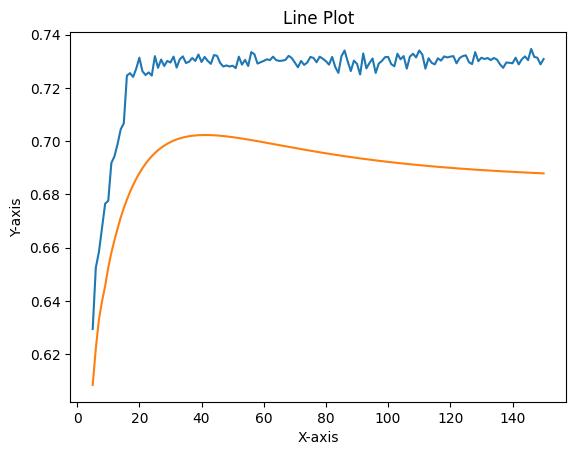

(4, 6)
5
1/1 [==============================] - 0s 29ms/step
6
1/1 [==============================] - 0s 19ms/step
7
1/1 [==============================] - 0s 20ms/step
8
1/1 [==============================] - 0s 22ms/step
9
1/1 [==============================] - 0s 22ms/step
10
1/1 [==============================] - 0s 23ms/step
11
1/1 [==============================] - 0s 19ms/step
12
1/1 [==============================] - 0s 22ms/step
13
1/1 [==============================] - 0s 28ms/step
14
1/1 [==============================] - 0s 21ms/step
15
1/1 [==============================] - 0s 22ms/step
16
1/1 [==============================] - 0s 22ms/step
17
1/1 [==============================] - 0s 22ms/step
18
1/1 [==============================] - 0s 24ms/step
19
1/1 [==============================] - 0s 23ms/step
20
1/1 [==============================] - 0s 21ms/step
21
1/1 [==============================] - 0s 21ms/step
22
1/1 [==============================] - 0s 19ms/step
23
1/1 [

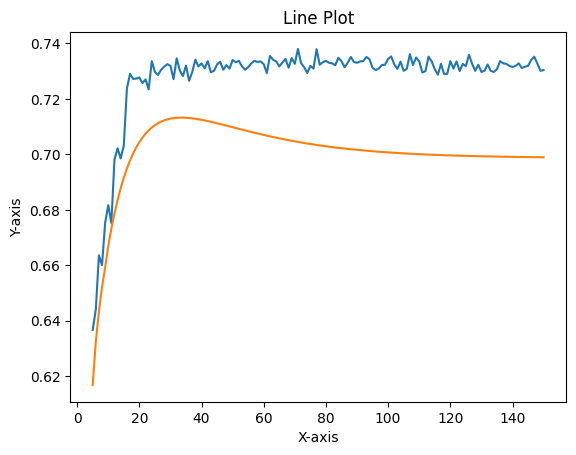

(4, 6)
5
1/1 [==============================] - 0s 23ms/step
6
1/1 [==============================] - 0s 20ms/step
7
1/1 [==============================] - 0s 19ms/step
8
1/1 [==============================] - 0s 23ms/step
9
1/1 [==============================] - 0s 21ms/step
10
1/1 [==============================] - 0s 21ms/step
11
1/1 [==============================] - 0s 21ms/step
12
1/1 [==============================] - 0s 24ms/step
13
1/1 [==============================] - 0s 31ms/step
14
1/1 [==============================] - 0s 21ms/step
15
1/1 [==============================] - 0s 24ms/step
16
1/1 [==============================] - 0s 22ms/step
17
1/1 [==============================] - 0s 23ms/step
18
1/1 [==============================] - 0s 22ms/step
19
1/1 [==============================] - 0s 21ms/step
20
1/1 [==============================] - 0s 20ms/step
21
1/1 [==============================] - 0s 24ms/step
22
1/1 [==============================] - 0s 22ms/step
23
1/1 [

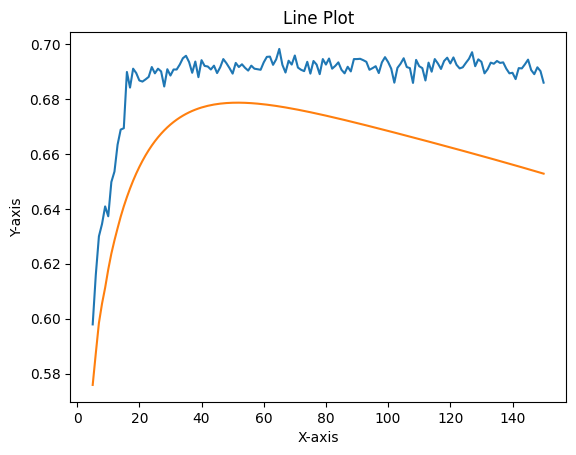

(4, 6)
5
1/1 [==============================] - 0s 40ms/step
6
1/1 [==============================] - 0s 36ms/step
7
1/1 [==============================] - 0s 33ms/step
8
1/1 [==============================] - 0s 39ms/step
9
1/1 [==============================] - 0s 29ms/step
10
1/1 [==============================] - 0s 28ms/step
11
1/1 [==============================] - 0s 30ms/step
12
1/1 [==============================] - 0s 30ms/step
13
1/1 [==============================] - 0s 29ms/step
14
1/1 [==============================] - 0s 35ms/step
15
1/1 [==============================] - 0s 32ms/step
16
1/1 [==============================] - 0s 40ms/step
17
1/1 [==============================] - 0s 29ms/step
18
1/1 [==============================] - 0s 31ms/step
19
1/1 [==============================] - 0s 29ms/step
20
1/1 [==============================] - 0s 29ms/step
21
1/1 [==============================] - 0s 31ms/step
22
1/1 [==============================] - 0s 37ms/step
23
1/1 [

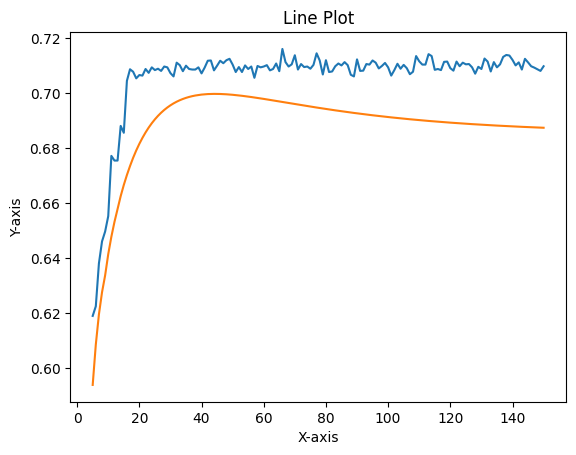

(4, 6)
5
1/1 [==============================] - 0s 23ms/step
6
1/1 [==============================] - 0s 31ms/step
7
1/1 [==============================] - 0s 21ms/step
8
1/1 [==============================] - 0s 25ms/step
9
1/1 [==============================] - 0s 21ms/step
10
1/1 [==============================] - 0s 23ms/step
11
1/1 [==============================] - 0s 20ms/step
12
1/1 [==============================] - 0s 111ms/step
13
1/1 [==============================] - 0s 118ms/step
14
1/1 [==============================] - 0s 43ms/step
15
1/1 [==============================] - 0s 41ms/step
16
1/1 [==============================] - 0s 37ms/step
17
1/1 [==============================] - 0s 31ms/step
18
1/1 [==============================] - 0s 35ms/step
19
1/1 [==============================] - 0s 30ms/step
20
1/1 [==============================] - 0s 32ms/step
21
1/1 [==============================] - 0s 32ms/step
22
1/1 [==============================] - 0s 30ms/step
23
1/1

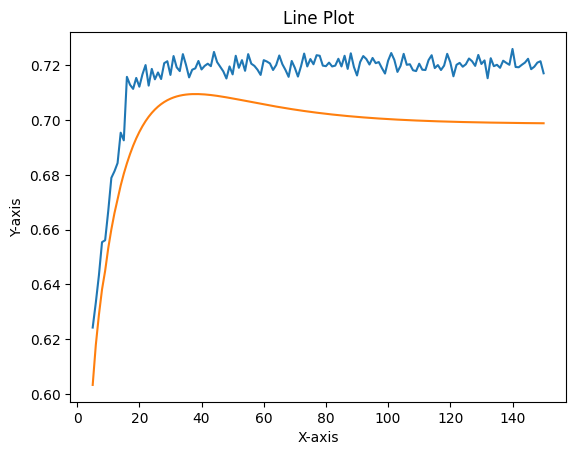

(4, 6)
5
1/1 [==============================] - 0s 22ms/step
6
1/1 [==============================] - 0s 21ms/step
7
1/1 [==============================] - 0s 19ms/step
8
1/1 [==============================] - 0s 20ms/step
9
1/1 [==============================] - 0s 20ms/step
10
1/1 [==============================] - 0s 28ms/step
11
1/1 [==============================] - 0s 22ms/step
12
1/1 [==============================] - 0s 22ms/step
13
1/1 [==============================] - 0s 21ms/step
14
1/1 [==============================] - 0s 26ms/step
15
1/1 [==============================] - 0s 24ms/step
16
1/1 [==============================] - 0s 23ms/step
17
1/1 [==============================] - 0s 23ms/step
18
1/1 [==============================] - 0s 24ms/step
19
1/1 [==============================] - 0s 21ms/step
20
1/1 [==============================] - 0s 26ms/step
21
1/1 [==============================] - 0s 22ms/step
22
1/1 [==============================] - 0s 20ms/step
23
1/1 [

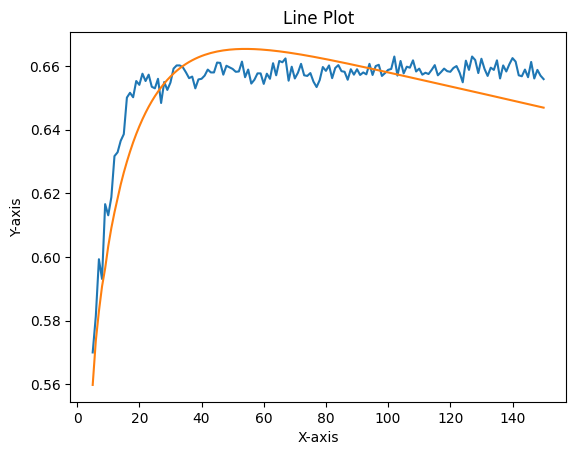

(4, 6)
5
1/1 [==============================] - 0s 24ms/step
6
1/1 [==============================] - 0s 26ms/step
7
1/1 [==============================] - 0s 22ms/step
8
1/1 [==============================] - 0s 23ms/step
9
1/1 [==============================] - 0s 23ms/step
10
1/1 [==============================] - 0s 25ms/step
11
1/1 [==============================] - 0s 28ms/step
12
1/1 [==============================] - 0s 27ms/step
13
1/1 [==============================] - 0s 25ms/step
14
1/1 [==============================] - 0s 23ms/step
15
1/1 [==============================] - 0s 38ms/step
16
1/1 [==============================] - 0s 24ms/step
17
1/1 [==============================] - 0s 26ms/step
18
1/1 [==============================] - 0s 29ms/step
19
1/1 [==============================] - 0s 28ms/step
20
1/1 [==============================] - 0s 25ms/step
21
1/1 [==============================] - 0s 29ms/step
22
1/1 [==============================] - 0s 24ms/step
23
1/1 [

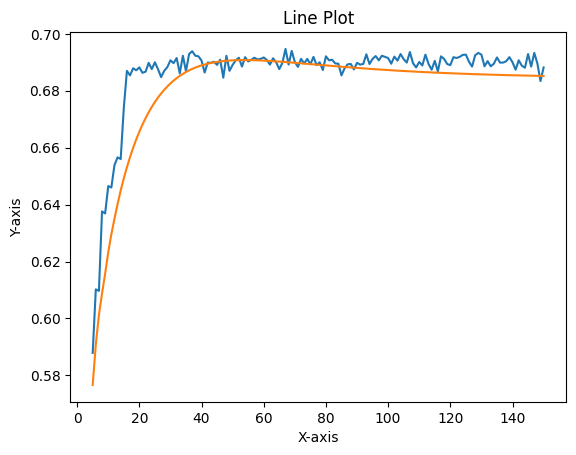

(4, 6)
5
1/1 [==============================] - 0s 22ms/step
6
1/1 [==============================] - 0s 22ms/step
7
1/1 [==============================] - 0s 25ms/step
8
1/1 [==============================] - 0s 20ms/step
9
1/1 [==============================] - 0s 20ms/step
10
1/1 [==============================] - 0s 30ms/step
11
1/1 [==============================] - 0s 27ms/step
12
1/1 [==============================] - 0s 27ms/step
13
1/1 [==============================] - 0s 27ms/step
14
1/1 [==============================] - 0s 28ms/step
15
1/1 [==============================] - 0s 26ms/step
16
1/1 [==============================] - 0s 25ms/step
17
1/1 [==============================] - 0s 19ms/step
18
1/1 [==============================] - 0s 20ms/step
19
1/1 [==============================] - 0s 22ms/step
20
1/1 [==============================] - 0s 20ms/step
21
1/1 [==============================] - 0s 20ms/step
22
1/1 [==============================] - 0s 22ms/step
23
1/1 [

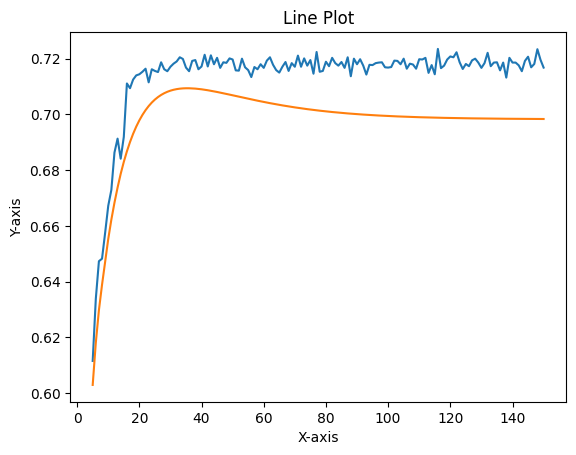

(4, 6)
5
1/1 [==============================] - 0s 24ms/step
6
1/1 [==============================] - 0s 19ms/step
7
1/1 [==============================] - 0s 21ms/step
8
1/1 [==============================] - 0s 20ms/step
9
1/1 [==============================] - 0s 21ms/step
10
1/1 [==============================] - 0s 23ms/step
11
1/1 [==============================] - 0s 25ms/step
12
1/1 [==============================] - 0s 27ms/step
13
1/1 [==============================] - 0s 25ms/step
14
1/1 [==============================] - 0s 27ms/step
15
1/1 [==============================] - 0s 24ms/step
16
1/1 [==============================] - 0s 24ms/step
17
1/1 [==============================] - 0s 27ms/step
18
1/1 [==============================] - 0s 26ms/step
19
1/1 [==============================] - 0s 24ms/step
20
1/1 [==============================] - 0s 26ms/step
21
1/1 [==============================] - 0s 22ms/step
22
1/1 [==============================] - 0s 22ms/step
23
1/1 [

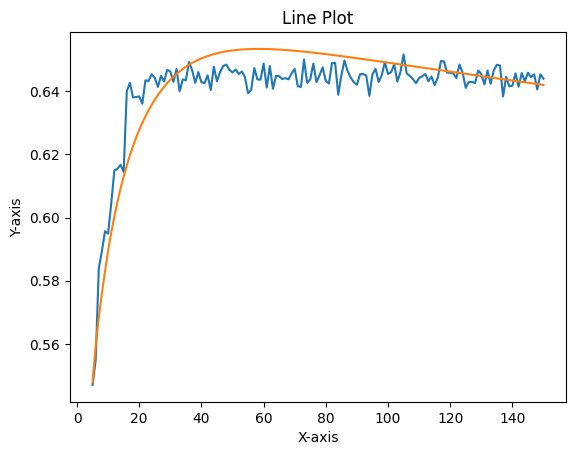

(4, 6)
5
1/1 [==============================] - 0s 28ms/step
6
1/1 [==============================] - 0s 29ms/step
7
1/1 [==============================] - 0s 28ms/step
8
1/1 [==============================] - 0s 33ms/step
9
1/1 [==============================] - 0s 34ms/step
10
1/1 [==============================] - 0s 32ms/step
11
1/1 [==============================] - 0s 36ms/step
12
1/1 [==============================] - 0s 32ms/step
13
1/1 [==============================] - 0s 29ms/step
14
1/1 [==============================] - 0s 29ms/step
15
1/1 [==============================] - 0s 30ms/step
16
1/1 [==============================] - 0s 31ms/step
17
1/1 [==============================] - 0s 28ms/step
18
1/1 [==============================] - 0s 28ms/step
19
1/1 [==============================] - 0s 42ms/step
20
1/1 [==============================] - 0s 42ms/step
21
1/1 [==============================] - 0s 30ms/step
22
1/1 [==============================] - 0s 37ms/step
23
1/1 [

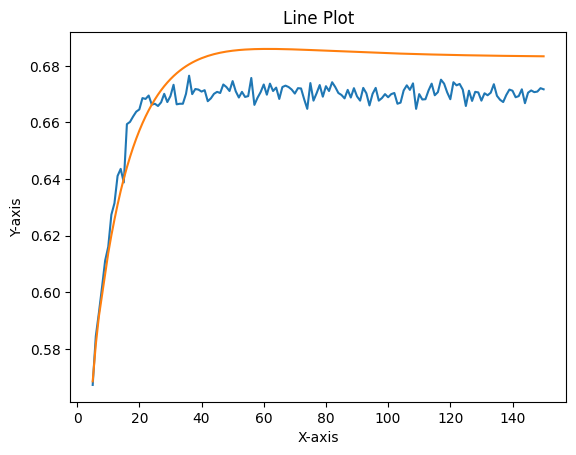

(4, 6)
5
1/1 [==============================] - 0s 21ms/step
6
1/1 [==============================] - 0s 31ms/step
7
1/1 [==============================] - 0s 24ms/step
8
1/1 [==============================] - 0s 23ms/step
9
1/1 [==============================] - 0s 34ms/step
10
1/1 [==============================] - 0s 26ms/step
11
1/1 [==============================] - 0s 30ms/step
12
1/1 [==============================] - 0s 32ms/step
13
1/1 [==============================] - 0s 36ms/step
14
1/1 [==============================] - 0s 30ms/step
15
1/1 [==============================] - 0s 33ms/step
16
1/1 [==============================] - 0s 31ms/step
17
1/1 [==============================] - 0s 33ms/step
18
1/1 [==============================] - 0s 30ms/step
19
1/1 [==============================] - 0s 27ms/step
20
1/1 [==============================] - 0s 43ms/step
21
1/1 [==============================] - 0s 40ms/step
22
1/1 [==============================] - 0s 32ms/step
23
1/1 [

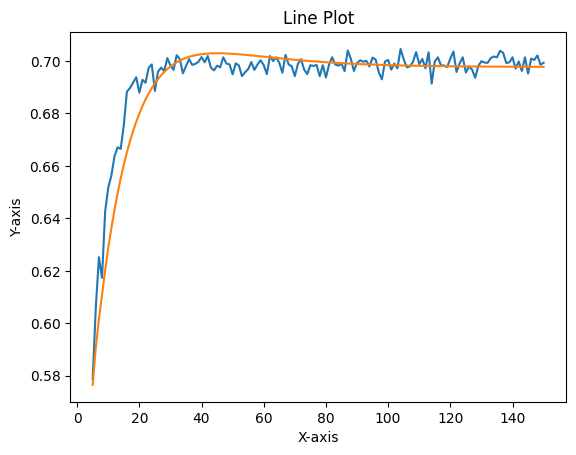

(4, 6)
5
1/1 [==============================] - 0s 23ms/step
6
1/1 [==============================] - 0s 19ms/step
7
1/1 [==============================] - 0s 28ms/step
8
1/1 [==============================] - 0s 25ms/step
9
1/1 [==============================] - 0s 23ms/step
10
1/1 [==============================] - 0s 25ms/step
11
1/1 [==============================] - 0s 23ms/step
12
1/1 [==============================] - 0s 20ms/step
13
1/1 [==============================] - 0s 22ms/step
14
1/1 [==============================] - 0s 23ms/step
15
1/1 [==============================] - 0s 20ms/step
16
1/1 [==============================] - 0s 19ms/step
17
1/1 [==============================] - 0s 23ms/step
18
1/1 [==============================] - 0s 21ms/step
19
1/1 [==============================] - 0s 21ms/step
20
1/1 [==============================] - 0s 21ms/step
21
1/1 [==============================] - 0s 20ms/step
22
1/1 [==============================] - 0s 19ms/step
23
1/1 [

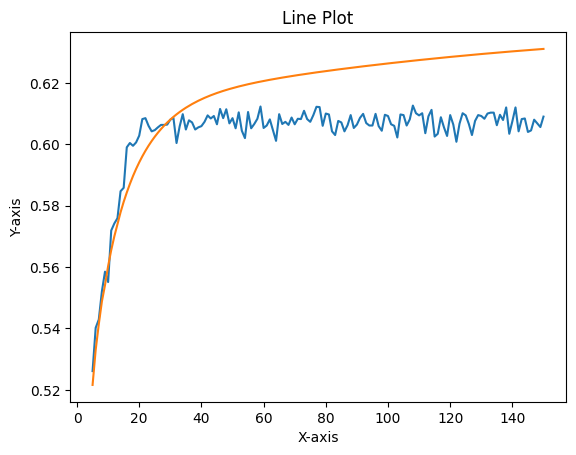

(4, 6)
5
1/1 [==============================] - 0s 22ms/step
6
1/1 [==============================] - 0s 24ms/step
7
1/1 [==============================] - 0s 20ms/step
8
1/1 [==============================] - 0s 25ms/step
9
1/1 [==============================] - 0s 25ms/step
10
1/1 [==============================] - 0s 25ms/step
11
1/1 [==============================] - 0s 21ms/step
12
1/1 [==============================] - 0s 26ms/step
13
1/1 [==============================] - 0s 26ms/step
14
1/1 [==============================] - 0s 27ms/step
15
1/1 [==============================] - 0s 22ms/step
16
1/1 [==============================] - 0s 22ms/step
17
1/1 [==============================] - 0s 20ms/step
18
1/1 [==============================] - 0s 27ms/step
19
1/1 [==============================] - 0s 26ms/step
20
1/1 [==============================] - 0s 24ms/step
21
1/1 [==============================] - 0s 33ms/step
22
1/1 [==============================] - 0s 28ms/step
23
1/1 [

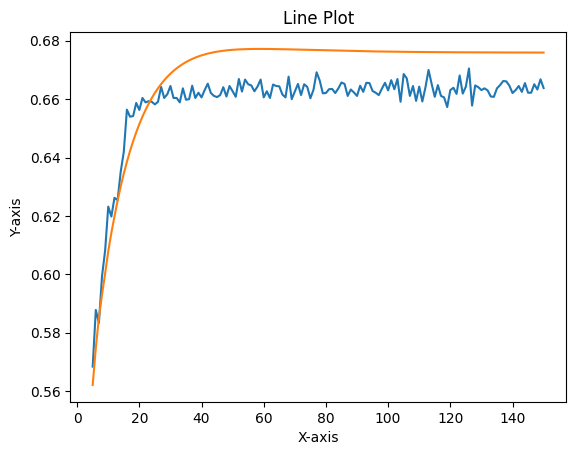

(4, 6)
5
1/1 [==============================] - 0s 24ms/step
6
1/1 [==============================] - 0s 22ms/step
7
1/1 [==============================] - 0s 19ms/step
8
1/1 [==============================] - 0s 30ms/step
9
1/1 [==============================] - 0s 27ms/step
10
1/1 [==============================] - 0s 27ms/step
11
1/1 [==============================] - 0s 26ms/step
12
1/1 [==============================] - 0s 26ms/step
13
1/1 [==============================] - 0s 25ms/step
14
1/1 [==============================] - 0s 34ms/step
15
1/1 [==============================] - 0s 25ms/step
16
1/1 [==============================] - 0s 26ms/step
17
1/1 [==============================] - 0s 23ms/step
18
1/1 [==============================] - 0s 22ms/step
19
1/1 [==============================] - 0s 26ms/step
20
1/1 [==============================] - 0s 29ms/step
21
1/1 [==============================] - 0s 27ms/step
22
1/1 [==============================] - 0s 29ms/step
23
1/1 [

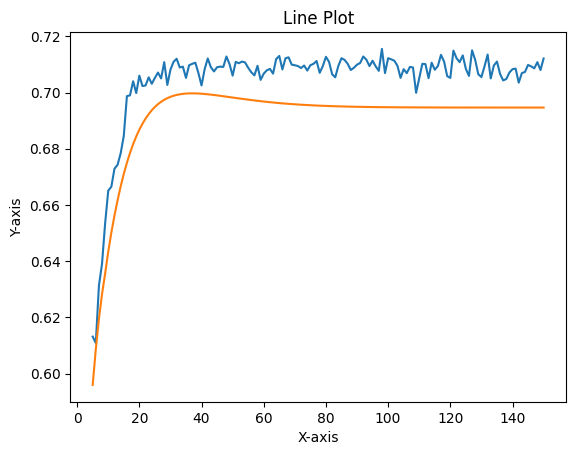

(4, 6)
5
1/1 [==============================] - 0s 31ms/step
6
1/1 [==============================] - 0s 29ms/step
7
1/1 [==============================] - 0s 30ms/step
8
1/1 [==============================] - 0s 31ms/step
9
1/1 [==============================] - 0s 31ms/step
10
1/1 [==============================] - 0s 31ms/step
11
1/1 [==============================] - 0s 27ms/step
12
1/1 [==============================] - 0s 22ms/step
13
1/1 [==============================] - 0s 26ms/step
14
1/1 [==============================] - 0s 27ms/step
15
1/1 [==============================] - 0s 32ms/step
16
1/1 [==============================] - 0s 19ms/step
17
1/1 [==============================] - 0s 21ms/step
18
1/1 [==============================] - 0s 23ms/step
19
1/1 [==============================] - 0s 28ms/step
20
1/1 [==============================] - 0s 25ms/step
21
1/1 [==============================] - 0s 25ms/step
22
1/1 [==============================] - 0s 20ms/step
23
1/1 [

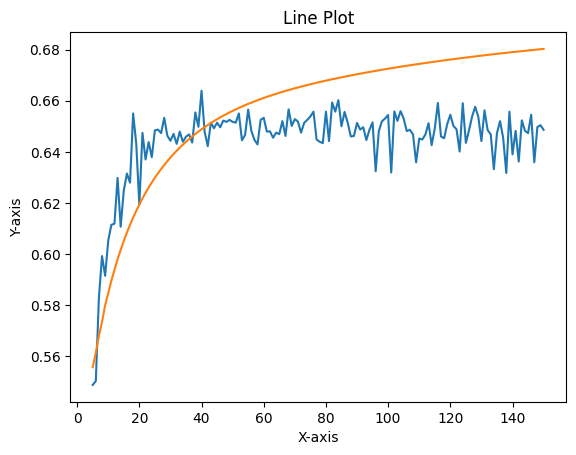

(4, 6)
5
1/1 [==============================] - 0s 37ms/step
6
1/1 [==============================] - 0s 33ms/step
7
1/1 [==============================] - 0s 30ms/step
8
1/1 [==============================] - 0s 34ms/step
9
1/1 [==============================] - 0s 41ms/step
10
1/1 [==============================] - 0s 49ms/step
11
1/1 [==============================] - 0s 52ms/step
12
1/1 [==============================] - 0s 49ms/step
13
1/1 [==============================] - 0s 45ms/step
14
1/1 [==============================] - 0s 42ms/step
15
1/1 [==============================] - 0s 51ms/step
16
1/1 [==============================] - 0s 49ms/step
17
1/1 [==============================] - 0s 52ms/step
18
1/1 [==============================] - 0s 39ms/step
19
1/1 [==============================] - 0s 49ms/step
20
1/1 [==============================] - 0s 36ms/step
21
1/1 [==============================] - 0s 34ms/step
22
1/1 [==============================] - 0s 49ms/step
23
1/1 [

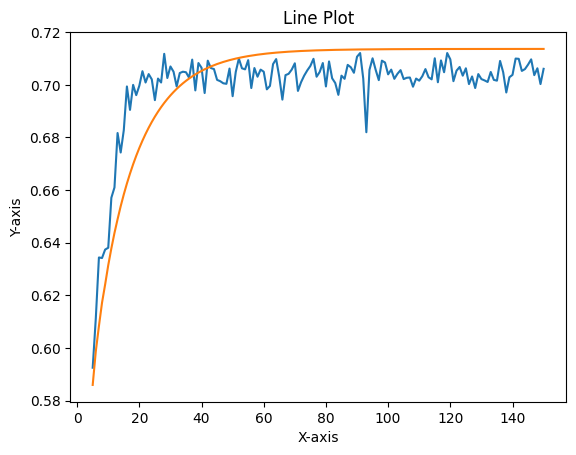

(4, 6)
5
1/1 [==============================] - 0s 39ms/step
6
1/1 [==============================] - 0s 30ms/step
7
1/1 [==============================] - 0s 32ms/step
8
1/1 [==============================] - 0s 38ms/step
9
1/1 [==============================] - 0s 31ms/step
10
1/1 [==============================] - 0s 44ms/step
11
1/1 [==============================] - 0s 30ms/step
12
1/1 [==============================] - 0s 46ms/step
13
1/1 [==============================] - 0s 41ms/step
14
1/1 [==============================] - 0s 47ms/step
15
1/1 [==============================] - 0s 31ms/step
16
1/1 [==============================] - 0s 43ms/step
17
1/1 [==============================] - 0s 38ms/step
18
1/1 [==============================] - 0s 39ms/step
19
1/1 [==============================] - 0s 37ms/step
20
1/1 [==============================] - 0s 41ms/step
21
1/1 [==============================] - 0s 46ms/step
22
1/1 [==============================] - 0s 29ms/step
23
1/1 [

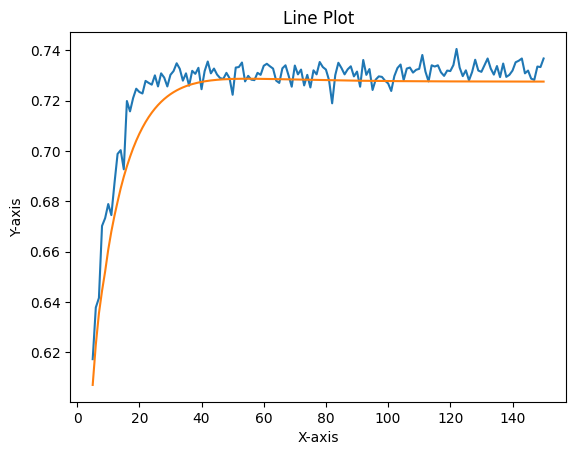

(4, 6)
5
1/1 [==============================] - 0s 23ms/step
6
1/1 [==============================] - 0s 21ms/step
7
1/1 [==============================] - 0s 27ms/step
8
1/1 [==============================] - 0s 29ms/step
9
1/1 [==============================] - 0s 24ms/step
10
1/1 [==============================] - 0s 25ms/step
11
1/1 [==============================] - 0s 24ms/step
12
1/1 [==============================] - 0s 24ms/step
13
1/1 [==============================] - 0s 22ms/step
14
1/1 [==============================] - 0s 27ms/step
15
1/1 [==============================] - 0s 24ms/step
16
1/1 [==============================] - 0s 25ms/step
17
1/1 [==============================] - 0s 33ms/step
18
1/1 [==============================] - 0s 24ms/step
19
1/1 [==============================] - 0s 20ms/step
20
1/1 [==============================] - 0s 27ms/step
21
1/1 [==============================] - 0s 27ms/step
22
1/1 [==============================] - 0s 20ms/step
23
1/1 [

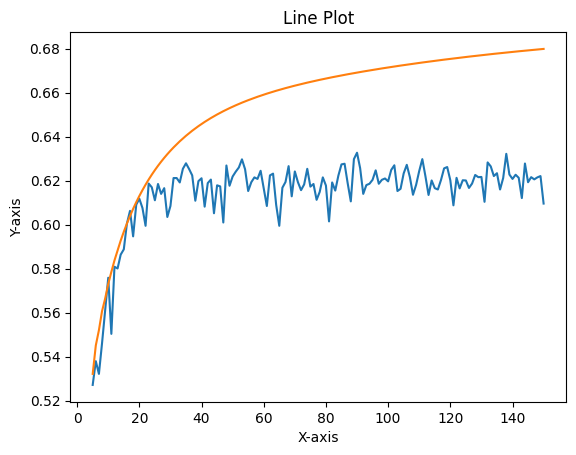

(4, 6)
5
1/1 [==============================] - 0s 21ms/step
6
1/1 [==============================] - 0s 22ms/step
7
1/1 [==============================] - 0s 21ms/step
8
1/1 [==============================] - 0s 26ms/step
9
1/1 [==============================] - 0s 29ms/step
10
1/1 [==============================] - 0s 24ms/step
11
1/1 [==============================] - 0s 25ms/step
12
1/1 [==============================] - 0s 22ms/step
13
1/1 [==============================] - 0s 27ms/step
14
1/1 [==============================] - 0s 31ms/step
15
1/1 [==============================] - 0s 26ms/step
16
1/1 [==============================] - 0s 32ms/step
17
1/1 [==============================] - 0s 25ms/step
18
1/1 [==============================] - 0s 29ms/step
19
1/1 [==============================] - 0s 28ms/step
20
1/1 [==============================] - 0s 20ms/step
21
1/1 [==============================] - 0s 24ms/step
22
1/1 [==============================] - 0s 21ms/step
23
1/1 [

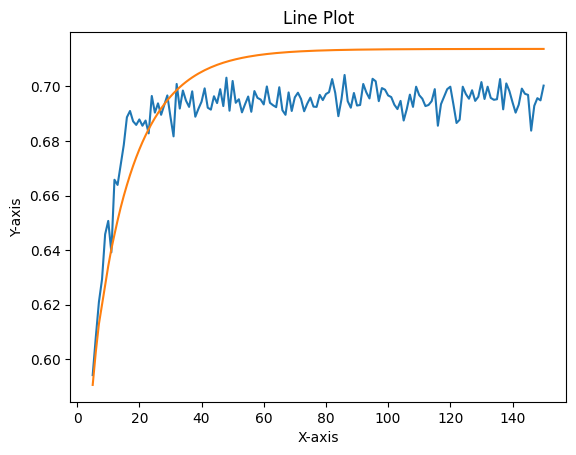

(4, 6)
5
1/1 [==============================] - 0s 23ms/step
6
1/1 [==============================] - 0s 23ms/step
7
1/1 [==============================] - 0s 27ms/step
8
1/1 [==============================] - 0s 27ms/step
9
1/1 [==============================] - 0s 30ms/step
10
1/1 [==============================] - 0s 28ms/step
11
1/1 [==============================] - 0s 28ms/step
12
1/1 [==============================] - 0s 21ms/step
13
1/1 [==============================] - 0s 22ms/step
14
1/1 [==============================] - 0s 20ms/step
15
1/1 [==============================] - 0s 30ms/step
16
1/1 [==============================] - 0s 22ms/step
17
1/1 [==============================] - 0s 23ms/step
18
1/1 [==============================] - 0s 23ms/step
19
1/1 [==============================] - 0s 20ms/step
20
1/1 [==============================] - 0s 28ms/step
21
1/1 [==============================] - 0s 25ms/step
22
1/1 [==============================] - 0s 26ms/step
23
1/1 [

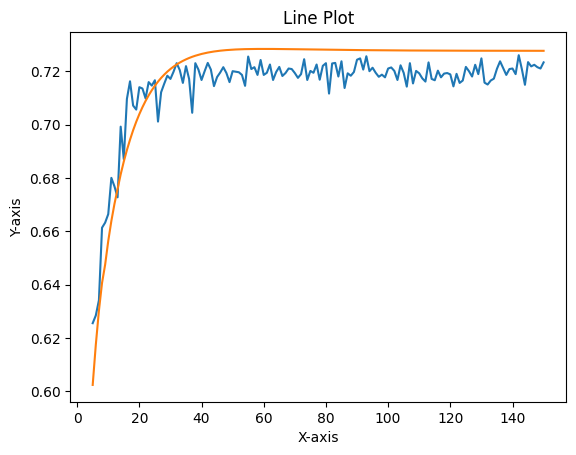

(4, 6)
5
1/1 [==============================] - 0s 23ms/step
6
1/1 [==============================] - 0s 22ms/step
7
1/1 [==============================] - 0s 27ms/step
8
1/1 [==============================] - 0s 21ms/step
9
1/1 [==============================] - 0s 24ms/step
10
1/1 [==============================] - 0s 27ms/step
11
1/1 [==============================] - 0s 25ms/step
12
1/1 [==============================] - 0s 23ms/step
13
1/1 [==============================] - 0s 30ms/step
14
1/1 [==============================] - 0s 22ms/step
15
1/1 [==============================] - 0s 21ms/step
16
1/1 [==============================] - 0s 24ms/step
17
1/1 [==============================] - 0s 23ms/step
18
1/1 [==============================] - 0s 22ms/step
19
1/1 [==============================] - 0s 23ms/step
20
1/1 [==============================] - 0s 25ms/step
21
1/1 [==============================] - 0s 22ms/step
22
1/1 [==============================] - 0s 28ms/step
23
1/1 [

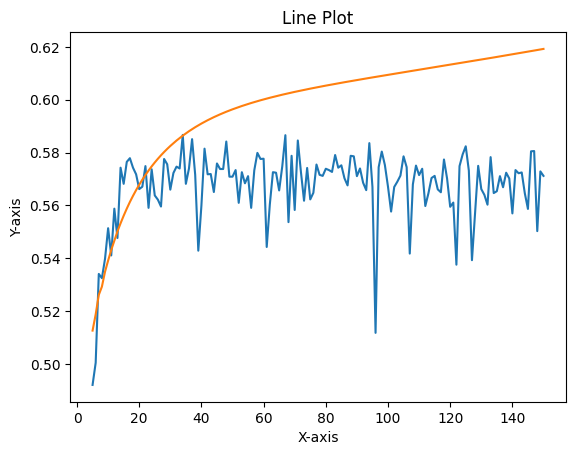

(4, 6)
5
1/1 [==============================] - 0s 35ms/step
6
1/1 [==============================] - 0s 48ms/step
7
1/1 [==============================] - 0s 41ms/step
8
1/1 [==============================] - 0s 20ms/step
9
1/1 [==============================] - 0s 23ms/step
10
1/1 [==============================] - 0s 27ms/step
11
1/1 [==============================] - 0s 29ms/step
12
1/1 [==============================] - 0s 23ms/step
13
1/1 [==============================] - 0s 22ms/step
14
1/1 [==============================] - 0s 22ms/step
15
1/1 [==============================] - 0s 22ms/step
16
1/1 [==============================] - 0s 24ms/step
17
1/1 [==============================] - 0s 21ms/step
18
1/1 [==============================] - 0s 24ms/step
19
1/1 [==============================] - 0s 24ms/step
20
1/1 [==============================] - 0s 25ms/step
21
1/1 [==============================] - 0s 22ms/step
22
1/1 [==============================] - 0s 24ms/step
23
1/1 [

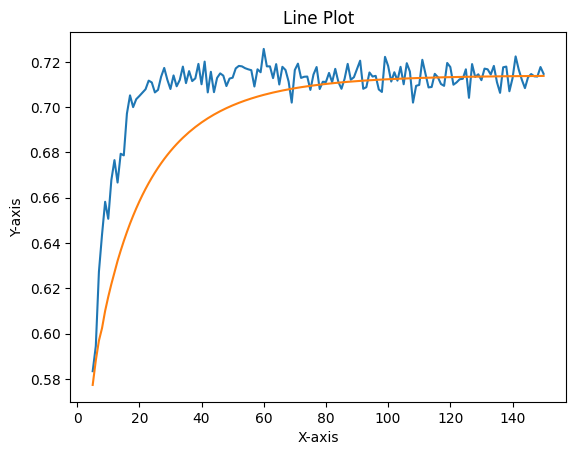

(4, 6)
5
1/1 [==============================] - 0s 32ms/step
6
1/1 [==============================] - 0s 29ms/step
7
1/1 [==============================] - 0s 30ms/step
8
1/1 [==============================] - 0s 31ms/step
9
1/1 [==============================] - 0s 66ms/step
10
1/1 [==============================] - 0s 31ms/step
11
1/1 [==============================] - 0s 35ms/step
12
1/1 [==============================] - 0s 31ms/step
13
1/1 [==============================] - 0s 64ms/step
14
1/1 [==============================] - 0s 49ms/step
15
1/1 [==============================] - 0s 38ms/step
16
1/1 [==============================] - 0s 47ms/step
17
1/1 [==============================] - 0s 42ms/step
18
1/1 [==============================] - 0s 54ms/step
19
1/1 [==============================] - 0s 44ms/step
20
1/1 [==============================] - 0s 47ms/step
21
1/1 [==============================] - 0s 67ms/step
22
1/1 [==============================] - 0s 61ms/step
23
1/1 [

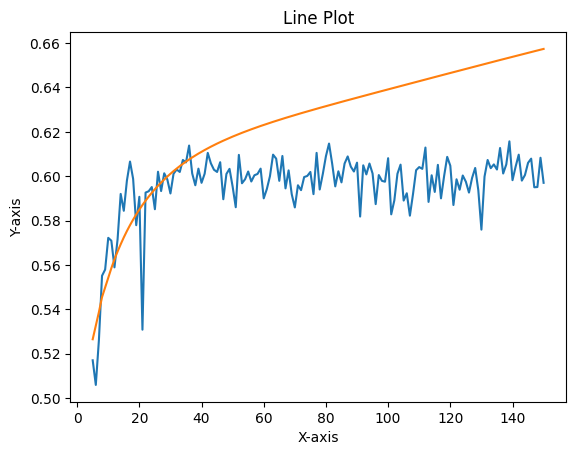

(4, 6)
5
1/1 [==============================] - 0s 23ms/step
6
1/1 [==============================] - 0s 33ms/step
7
1/1 [==============================] - 0s 29ms/step
8
1/1 [==============================] - 0s 45ms/step
9
1/1 [==============================] - 0s 57ms/step
10
1/1 [==============================] - 0s 33ms/step
11
1/1 [==============================] - 0s 33ms/step
12
1/1 [==============================] - 0s 35ms/step
13
1/1 [==============================] - 0s 43ms/step
14
1/1 [==============================] - 0s 65ms/step
15
1/1 [==============================] - 0s 62ms/step
16
1/1 [==============================] - 0s 48ms/step
17
1/1 [==============================] - 0s 39ms/step
18
1/1 [==============================] - 0s 29ms/step
19
1/1 [==============================] - 0s 32ms/step
20
1/1 [==============================] - 0s 28ms/step
21
1/1 [==============================] - 0s 53ms/step
22
1/1 [==============================] - 0s 46ms/step
23
1/1 [

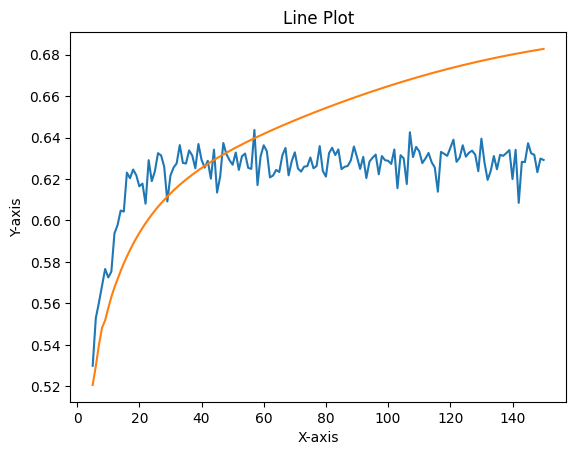

(4, 6)
5
1/1 [==============================] - 0s 21ms/step
6
1/1 [==============================] - 0s 22ms/step
7
1/1 [==============================] - 0s 22ms/step
8
1/1 [==============================] - 0s 26ms/step
9
1/1 [==============================] - 0s 30ms/step
10
1/1 [==============================] - 0s 28ms/step
11
1/1 [==============================] - 0s 24ms/step
12
1/1 [==============================] - 0s 24ms/step
13
1/1 [==============================] - 0s 28ms/step
14
1/1 [==============================] - 0s 21ms/step
15
1/1 [==============================] - 0s 32ms/step
16
1/1 [==============================] - 0s 27ms/step
17
1/1 [==============================] - 0s 22ms/step
18
1/1 [==============================] - 0s 23ms/step
19
1/1 [==============================] - 0s 23ms/step
20
1/1 [==============================] - 0s 23ms/step
21
1/1 [==============================] - 0s 28ms/step
22
1/1 [==============================] - 0s 28ms/step
23
1/1 [

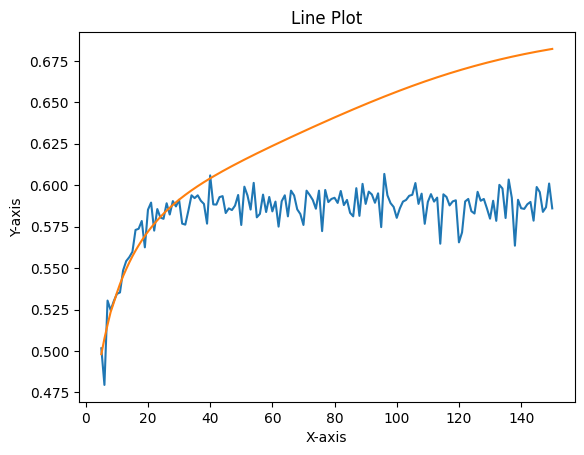

(4, 6)
5
1/1 [==============================] - 0s 28ms/step
6
1/1 [==============================] - 0s 30ms/step
7
1/1 [==============================] - 0s 28ms/step
8
1/1 [==============================] - 0s 34ms/step
9
1/1 [==============================] - 0s 28ms/step
10
1/1 [==============================] - 0s 44ms/step
11
1/1 [==============================] - 0s 32ms/step
12
1/1 [==============================] - 0s 30ms/step
13
1/1 [==============================] - 0s 29ms/step
14
1/1 [==============================] - 0s 34ms/step
15
1/1 [==============================] - 0s 29ms/step
16
1/1 [==============================] - 0s 25ms/step
17
1/1 [==============================] - 0s 27ms/step
18
1/1 [==============================] - 0s 29ms/step
19
1/1 [==============================] - 0s 28ms/step
20
1/1 [==============================] - 0s 27ms/step
21
1/1 [==============================] - 0s 29ms/step
22
1/1 [==============================] - 0s 29ms/step
23
1/1 [

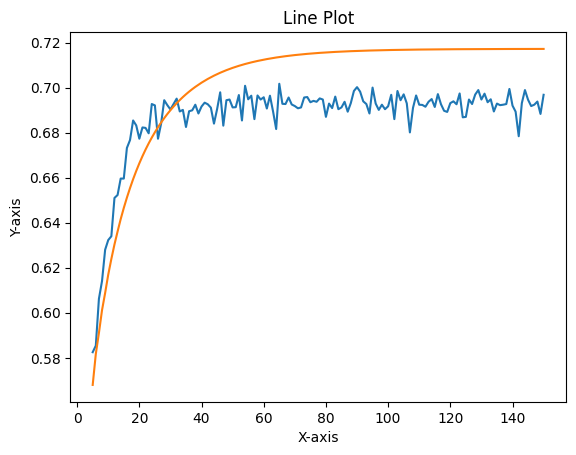

(4, 6)
5
1/1 [==============================] - 0s 25ms/step
6
1/1 [==============================] - 0s 22ms/step
7
1/1 [==============================] - 0s 41ms/step
8
1/1 [==============================] - 0s 32ms/step
9
1/1 [==============================] - 0s 28ms/step
10
1/1 [==============================] - 0s 24ms/step
11
1/1 [==============================] - 0s 30ms/step
12
1/1 [==============================] - 0s 20ms/step
13
1/1 [==============================] - 0s 23ms/step
14
1/1 [==============================] - 0s 27ms/step
15
1/1 [==============================] - 0s 24ms/step
16
1/1 [==============================] - 0s 22ms/step
17
1/1 [==============================] - 0s 28ms/step
18
1/1 [==============================] - 0s 28ms/step
19
1/1 [==============================] - 0s 26ms/step
20
1/1 [==============================] - 0s 30ms/step
21
1/1 [==============================] - 0s 25ms/step
22
1/1 [==============================] - 0s 27ms/step
23
1/1 [

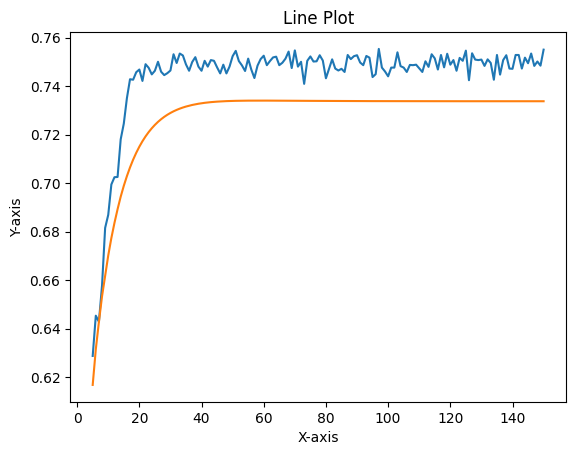

(4, 6)
5
1/1 [==============================] - 0s 21ms/step
6
1/1 [==============================] - 0s 23ms/step
7
1/1 [==============================] - 0s 26ms/step
8
1/1 [==============================] - 0s 28ms/step
9
1/1 [==============================] - 0s 22ms/step
10
1/1 [==============================] - 0s 30ms/step
11
1/1 [==============================] - 0s 29ms/step
12
1/1 [==============================] - 0s 27ms/step
13
1/1 [==============================] - 0s 25ms/step
14
1/1 [==============================] - 0s 36ms/step
15
1/1 [==============================] - 0s 25ms/step
16
1/1 [==============================] - 0s 25ms/step
17
1/1 [==============================] - 0s 26ms/step
18
1/1 [==============================] - 0s 30ms/step
19
1/1 [==============================] - 0s 26ms/step
20
1/1 [==============================] - 0s 29ms/step
21
1/1 [==============================] - 0s 26ms/step
22
1/1 [==============================] - 0s 22ms/step
23
1/1 [

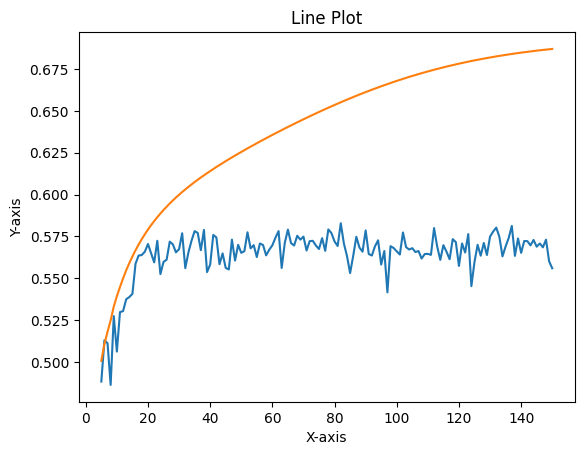

(4, 6)
5
1/1 [==============================] - 0s 21ms/step
6
1/1 [==============================] - 0s 20ms/step
7
1/1 [==============================] - 0s 24ms/step
8
1/1 [==============================] - 0s 30ms/step
9
1/1 [==============================] - 0s 27ms/step
10
1/1 [==============================] - 0s 28ms/step
11
1/1 [==============================] - 0s 25ms/step
12
1/1 [==============================] - 0s 27ms/step
13
1/1 [==============================] - 0s 28ms/step
14
1/1 [==============================] - 0s 27ms/step
15
1/1 [==============================] - 0s 21ms/step
16
1/1 [==============================] - 0s 27ms/step
17
1/1 [==============================] - 0s 27ms/step
18
1/1 [==============================] - 0s 27ms/step
19
1/1 [==============================] - 0s 28ms/step
20
1/1 [==============================] - 0s 28ms/step
21
1/1 [==============================] - 0s 34ms/step
22
1/1 [==============================] - 0s 26ms/step
23
1/1 [

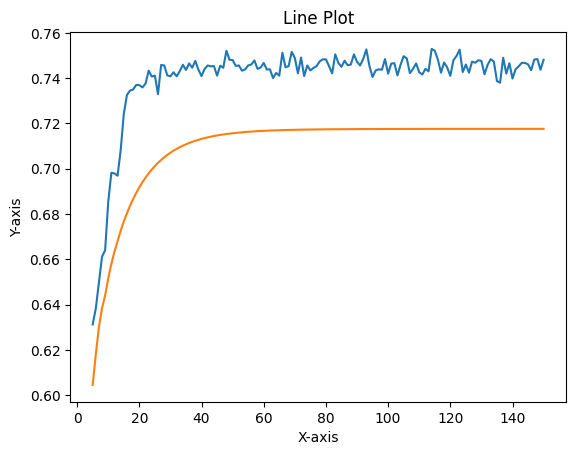

(4, 6)
5
1/1 [==============================] - 0s 26ms/step
6
1/1 [==============================] - 0s 28ms/step
7
1/1 [==============================] - 0s 28ms/step
8
1/1 [==============================] - 0s 31ms/step
9
1/1 [==============================] - 0s 29ms/step
10
1/1 [==============================] - 0s 39ms/step
11
1/1 [==============================] - 0s 33ms/step
12
1/1 [==============================] - 0s 28ms/step
13
1/1 [==============================] - 0s 29ms/step
14
1/1 [==============================] - 0s 30ms/step
15
1/1 [==============================] - 0s 27ms/step
16
1/1 [==============================] - 0s 28ms/step
17
1/1 [==============================] - 0s 26ms/step
18
1/1 [==============================] - 0s 27ms/step
19
1/1 [==============================] - 0s 26ms/step
20
1/1 [==============================] - 0s 30ms/step
21
1/1 [==============================] - 0s 27ms/step
22
1/1 [==============================] - 0s 24ms/step
23
1/1 [

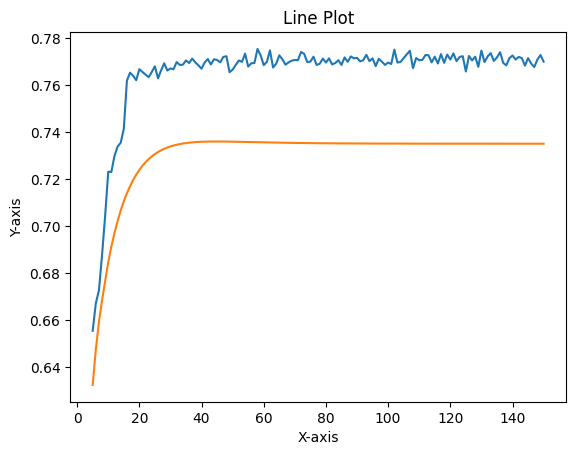

(4, 6)
5
1/1 [==============================] - 0s 28ms/step
6
1/1 [==============================] - 0s 29ms/step
7
1/1 [==============================] - 0s 32ms/step
8
1/1 [==============================] - 0s 30ms/step
9
1/1 [==============================] - 0s 30ms/step
10
1/1 [==============================] - 0s 28ms/step
11
1/1 [==============================] - 0s 32ms/step
12
1/1 [==============================] - 0s 27ms/step
13
1/1 [==============================] - 0s 29ms/step
14
1/1 [==============================] - 0s 34ms/step
15
1/1 [==============================] - 0s 31ms/step
16
1/1 [==============================] - 0s 32ms/step
17
1/1 [==============================] - 0s 30ms/step
18
1/1 [==============================] - 0s 31ms/step
19
1/1 [==============================] - 0s 30ms/step
20
1/1 [==============================] - 0s 31ms/step
21
1/1 [==============================] - 0s 30ms/step
22
1/1 [==============================] - 0s 30ms/step
23
1/1 [

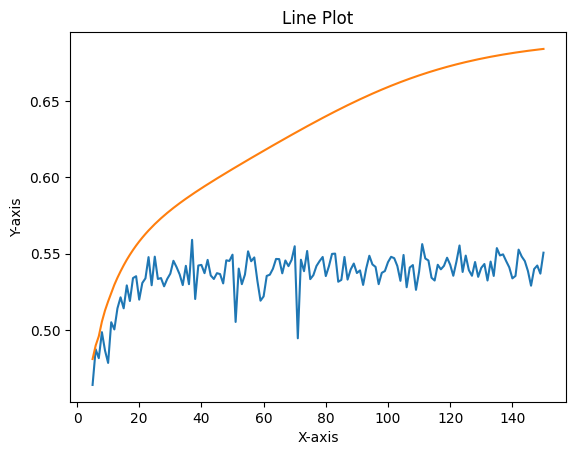

(4, 6)
5
1/1 [==============================] - 0s 33ms/step
6
1/1 [==============================] - 0s 30ms/step
7
1/1 [==============================] - 0s 30ms/step
8
1/1 [==============================] - 0s 30ms/step
9
1/1 [==============================] - 0s 26ms/step
10
1/1 [==============================] - 0s 30ms/step
11
1/1 [==============================] - 0s 33ms/step
12
1/1 [==============================] - 0s 40ms/step
13
1/1 [==============================] - 0s 31ms/step
14
1/1 [==============================] - 0s 28ms/step
15
1/1 [==============================] - 0s 30ms/step
16
1/1 [==============================] - 0s 28ms/step
17
1/1 [==============================] - 0s 39ms/step
18
1/1 [==============================] - 0s 29ms/step
19
1/1 [==============================] - 0s 29ms/step
20
1/1 [==============================] - 0s 27ms/step
21
1/1 [==============================] - 0s 30ms/step
22
1/1 [==============================] - 0s 30ms/step
23
1/1 [

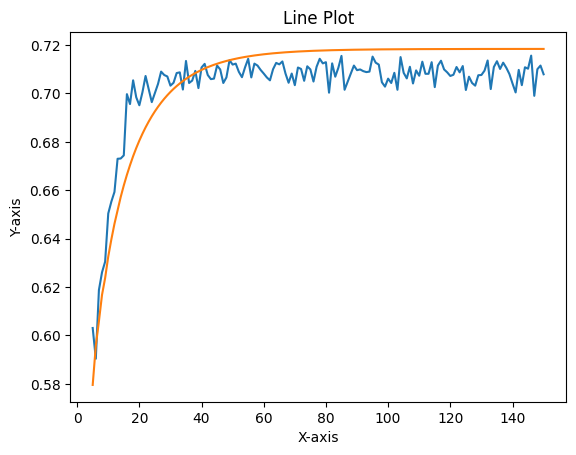

(4, 6)
5
1/1 [==============================] - 0s 78ms/step
6
1/1 [==============================] - 0s 29ms/step
7
1/1 [==============================] - 0s 35ms/step
8
1/1 [==============================] - 0s 35ms/step
9
1/1 [==============================] - 0s 34ms/step
10
1/1 [==============================] - 0s 45ms/step
11
1/1 [==============================] - 0s 49ms/step
12
1/1 [==============================] - 0s 48ms/step
13
1/1 [==============================] - 0s 63ms/step
14
1/1 [==============================] - 0s 62ms/step
15
1/1 [==============================] - 0s 66ms/step
16
1/1 [==============================] - 0s 56ms/step
17
1/1 [==============================] - 0s 41ms/step
18
1/1 [==============================] - 0s 41ms/step
19
1/1 [==============================] - 0s 40ms/step
20
1/1 [==============================] - 0s 27ms/step
21
1/1 [==============================] - 0s 33ms/step
22
1/1 [==============================] - 0s 27ms/step
23
1/1 [

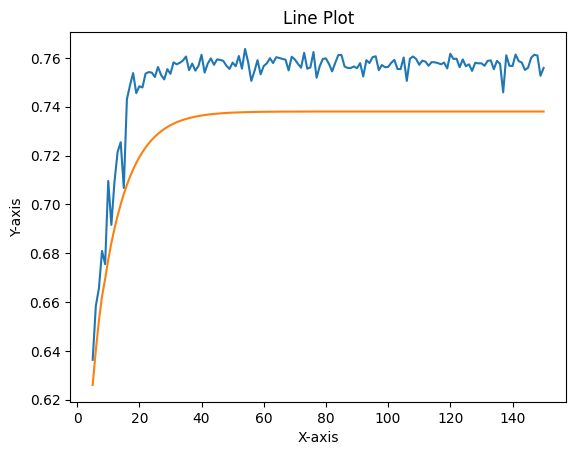

(4, 6)
5
1/1 [==============================] - 0s 37ms/step
6
1/1 [==============================] - 0s 37ms/step
7
1/1 [==============================] - 0s 32ms/step
8
1/1 [==============================] - 0s 28ms/step
9
1/1 [==============================] - 0s 29ms/step
10
1/1 [==============================] - 0s 29ms/step
11
1/1 [==============================] - 0s 28ms/step
12
1/1 [==============================] - 0s 30ms/step
13
1/1 [==============================] - 0s 31ms/step
14
1/1 [==============================] - 0s 32ms/step
15
1/1 [==============================] - 0s 38ms/step
16
1/1 [==============================] - 0s 73ms/step
17
1/1 [==============================] - 0s 33ms/step
18
1/1 [==============================] - 0s 38ms/step
19
1/1 [==============================] - 0s 30ms/step
20
1/1 [==============================] - 0s 27ms/step
21
1/1 [==============================] - 0s 30ms/step
22
1/1 [==============================] - 0s 33ms/step
23
1/1 [

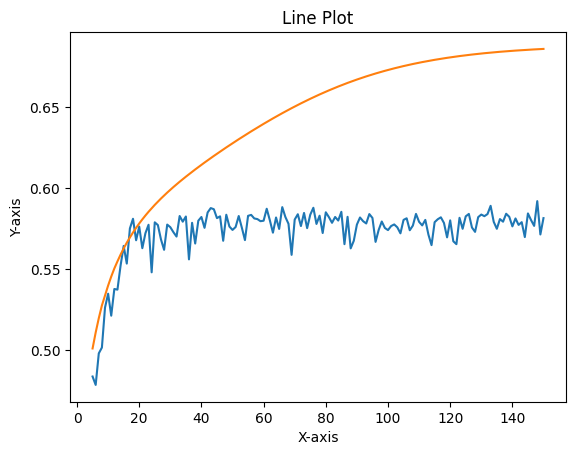

(4, 6)
5
1/1 [==============================] - 0s 51ms/step
6
1/1 [==============================] - 0s 47ms/step
7
1/1 [==============================] - 0s 44ms/step
8
1/1 [==============================] - 0s 33ms/step
9
1/1 [==============================] - 0s 29ms/step
10
1/1 [==============================] - 0s 52ms/step
11
1/1 [==============================] - 0s 59ms/step
12
1/1 [==============================] - 0s 46ms/step
13
1/1 [==============================] - 0s 57ms/step
14
1/1 [==============================] - 0s 65ms/step
15
1/1 [==============================] - 0s 54ms/step
16
1/1 [==============================] - 0s 41ms/step
17
1/1 [==============================] - 0s 45ms/step
18
1/1 [==============================] - 0s 60ms/step
19
1/1 [==============================] - 0s 58ms/step
20
1/1 [==============================] - 0s 54ms/step
21
1/1 [==============================] - 0s 67ms/step
22
1/1 [==============================] - 0s 45ms/step
23
1/1 [

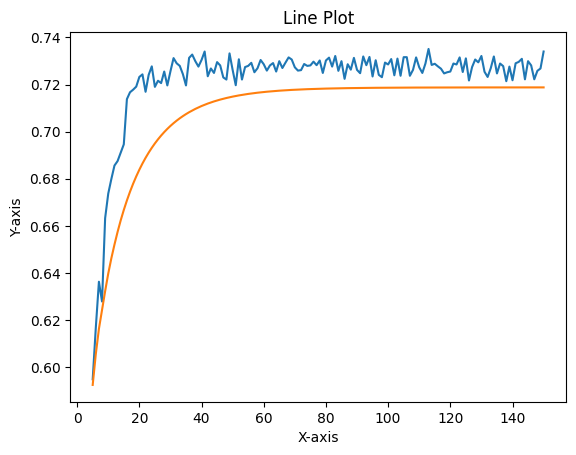

(4, 6)
5
1/1 [==============================] - 0s 33ms/step
6
1/1 [==============================] - 0s 34ms/step
7
1/1 [==============================] - 0s 28ms/step
8
1/1 [==============================] - 0s 30ms/step
9
1/1 [==============================] - 0s 30ms/step
10
1/1 [==============================] - 0s 30ms/step
11
1/1 [==============================] - 0s 29ms/step
12
1/1 [==============================] - 0s 28ms/step
13
1/1 [==============================] - 0s 32ms/step
14
1/1 [==============================] - 0s 55ms/step
15
1/1 [==============================] - 0s 45ms/step
16
1/1 [==============================] - 0s 33ms/step
17
1/1 [==============================] - 0s 37ms/step
18
1/1 [==============================] - 0s 39ms/step
19
1/1 [==============================] - 0s 33ms/step
20
1/1 [==============================] - 0s 34ms/step
21
1/1 [==============================] - 0s 35ms/step
22
1/1 [==============================] - 0s 54ms/step
23
1/1 [

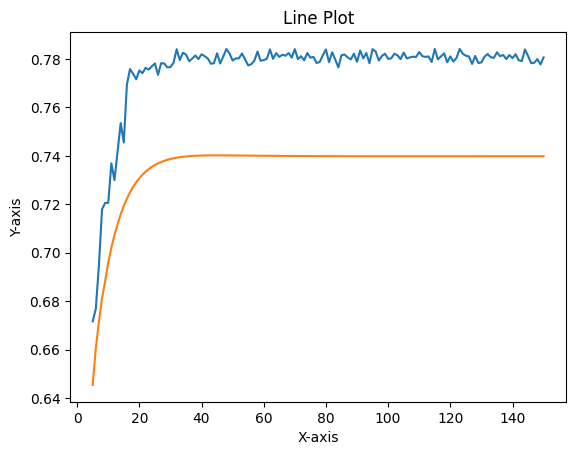

(4, 6)
5
1/1 [==============================] - 0s 45ms/step
6
1/1 [==============================] - 0s 43ms/step
7
1/1 [==============================] - 0s 43ms/step
8
1/1 [==============================] - 0s 68ms/step
9
1/1 [==============================] - 0s 70ms/step
10
1/1 [==============================] - 0s 68ms/step
11
1/1 [==============================] - 0s 47ms/step
12
1/1 [==============================] - 0s 49ms/step
13
1/1 [==============================] - 0s 71ms/step
14
1/1 [==============================] - 0s 48ms/step
15
1/1 [==============================] - 0s 74ms/step
16
1/1 [==============================] - 0s 44ms/step
17
1/1 [==============================] - 0s 58ms/step
18
1/1 [==============================] - 0s 66ms/step
19
1/1 [==============================] - 0s 47ms/step
20
1/1 [==============================] - 0s 49ms/step
21
1/1 [==============================] - 0s 49ms/step
22
1/1 [==============================] - 0s 31ms/step
23
1/1 [

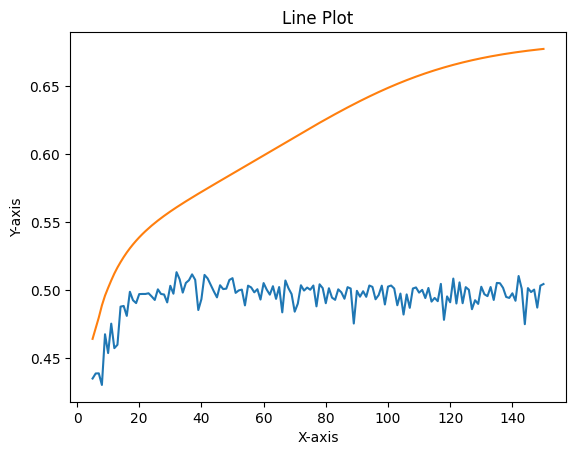

(4, 6)
5
1/1 [==============================] - 0s 27ms/step
6
1/1 [==============================] - 0s 30ms/step
7
1/1 [==============================] - 0s 28ms/step
8
1/1 [==============================] - 0s 32ms/step
9
1/1 [==============================] - 0s 30ms/step
10
1/1 [==============================] - 0s 28ms/step
11
1/1 [==============================] - 0s 28ms/step
12
1/1 [==============================] - 0s 28ms/step
13
1/1 [==============================] - 0s 29ms/step
14
1/1 [==============================] - 0s 29ms/step
15
1/1 [==============================] - 0s 31ms/step
16
1/1 [==============================] - 0s 29ms/step
17
1/1 [==============================] - 0s 26ms/step
18
1/1 [==============================] - 0s 31ms/step
19
1/1 [==============================] - 0s 41ms/step
20
1/1 [==============================] - 0s 33ms/step
21
1/1 [==============================] - 0s 54ms/step
22
1/1 [==============================] - 0s 40ms/step
23
1/1 [

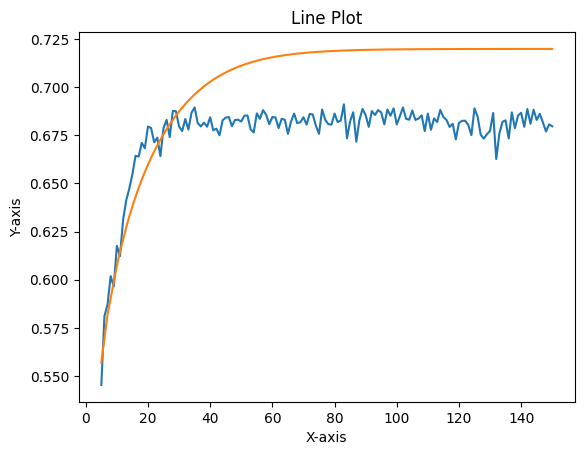

(4, 6)
5
1/1 [==============================] - 0s 55ms/step
6
1/1 [==============================] - 0s 64ms/step
7
1/1 [==============================] - 0s 57ms/step
8
1/1 [==============================] - 0s 57ms/step
9
1/1 [==============================] - 0s 41ms/step
10
1/1 [==============================] - 0s 57ms/step
11
1/1 [==============================] - 0s 44ms/step
12
1/1 [==============================] - 0s 54ms/step
13
1/1 [==============================] - 0s 55ms/step
14
1/1 [==============================] - 0s 41ms/step
15
1/1 [==============================] - 0s 41ms/step
16
1/1 [==============================] - 0s 34ms/step
17
1/1 [==============================] - 0s 36ms/step
18
1/1 [==============================] - 0s 60ms/step
19
1/1 [==============================] - 0s 53ms/step
20
1/1 [==============================] - 0s 48ms/step
21
1/1 [==============================] - 0s 44ms/step
22
1/1 [==============================] - 0s 49ms/step
23
1/1 [

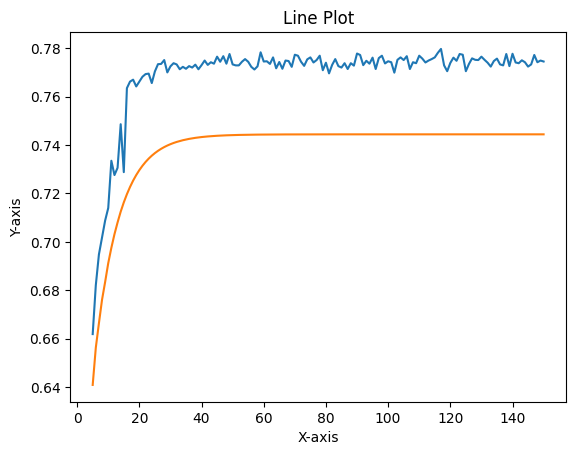

(4, 6)
5
1/1 [==============================] - 0s 28ms/step
6
1/1 [==============================] - 0s 30ms/step
7
1/1 [==============================] - 0s 40ms/step
8
1/1 [==============================] - 0s 32ms/step
9
1/1 [==============================] - 0s 32ms/step
10
1/1 [==============================] - 0s 47ms/step
11
1/1 [==============================] - 0s 62ms/step
12
1/1 [==============================] - 0s 67ms/step
13
1/1 [==============================] - 0s 45ms/step
14
1/1 [==============================] - 0s 61ms/step
15
1/1 [==============================] - 0s 68ms/step
16
1/1 [==============================] - 0s 46ms/step
17
1/1 [==============================] - 0s 62ms/step
18
1/1 [==============================] - 0s 66ms/step
19
1/1 [==============================] - 0s 46ms/step
20
1/1 [==============================] - 0s 65ms/step
21
1/1 [==============================] - 0s 52ms/step
22
1/1 [==============================] - 0s 68ms/step
23
1/1 [

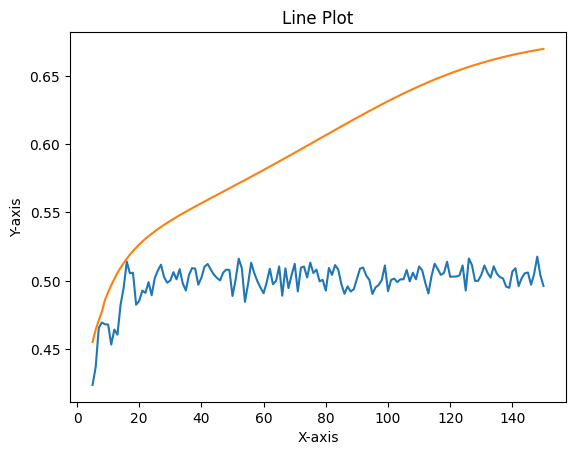

(4, 6)
5
1/1 [==============================] - 0s 34ms/step
6
1/1 [==============================] - 0s 27ms/step
7
1/1 [==============================] - 0s 32ms/step
8
1/1 [==============================] - 0s 29ms/step
9
1/1 [==============================] - 0s 35ms/step
10
1/1 [==============================] - 0s 30ms/step
11
1/1 [==============================] - 0s 30ms/step
12
1/1 [==============================] - 0s 28ms/step
13
1/1 [==============================] - 0s 28ms/step
14
1/1 [==============================] - 0s 28ms/step
15
1/1 [==============================] - 0s 29ms/step
16
1/1 [==============================] - 0s 31ms/step
17
1/1 [==============================] - 0s 27ms/step
18
1/1 [==============================] - 0s 29ms/step
19
1/1 [==============================] - 0s 29ms/step
20
1/1 [==============================] - 0s 37ms/step
21
1/1 [==============================] - 0s 38ms/step
22
1/1 [==============================] - 0s 32ms/step
23
1/1 [

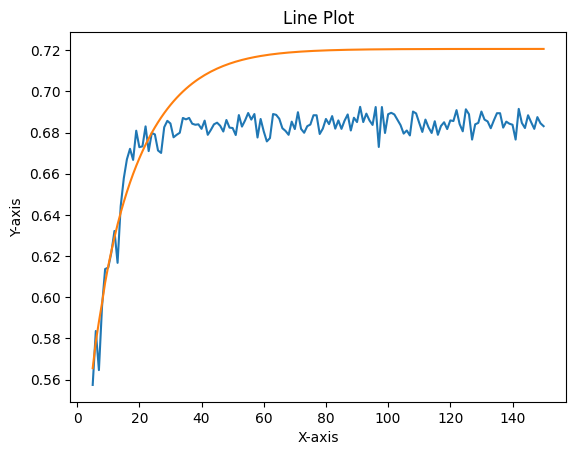

(4, 6)
5
1/1 [==============================] - 0s 28ms/step
6
1/1 [==============================] - 0s 27ms/step
7
1/1 [==============================] - 0s 34ms/step
8
1/1 [==============================] - 0s 27ms/step
9
1/1 [==============================] - 0s 32ms/step
10
1/1 [==============================] - 0s 29ms/step
11
1/1 [==============================] - 0s 28ms/step
12
1/1 [==============================] - 0s 26ms/step
13
1/1 [==============================] - 0s 31ms/step
14
1/1 [==============================] - 0s 29ms/step
15
1/1 [==============================] - 0s 27ms/step
16
1/1 [==============================] - 0s 27ms/step
17
1/1 [==============================] - 0s 32ms/step
18
1/1 [==============================] - 0s 41ms/step
19
1/1 [==============================] - 0s 30ms/step
20
1/1 [==============================] - 0s 29ms/step
21
1/1 [==============================] - 0s 31ms/step
22
1/1 [==============================] - 0s 33ms/step
23
1/1 [

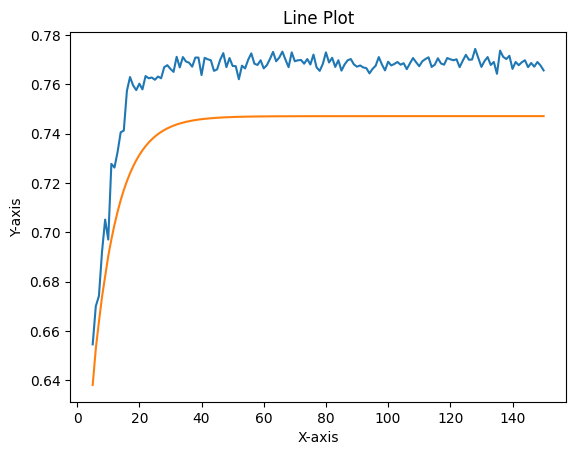

(4, 6)
5
1/1 [==============================] - 0s 30ms/step
6
1/1 [==============================] - 0s 28ms/step
7
1/1 [==============================] - 0s 28ms/step
8
1/1 [==============================] - 0s 29ms/step
9
1/1 [==============================] - 0s 31ms/step
10
1/1 [==============================] - 0s 35ms/step
11
1/1 [==============================] - 0s 31ms/step
12
1/1 [==============================] - 0s 28ms/step
13
1/1 [==============================] - 0s 31ms/step
14
1/1 [==============================] - 0s 42ms/step
15
1/1 [==============================] - 0s 35ms/step
16
1/1 [==============================] - 0s 30ms/step
17
1/1 [==============================] - 0s 30ms/step
18
1/1 [==============================] - 0s 29ms/step
19
1/1 [==============================] - 0s 34ms/step
20
1/1 [==============================] - 0s 29ms/step
21
1/1 [==============================] - 0s 28ms/step
22
1/1 [==============================] - 0s 26ms/step
23
1/1 [

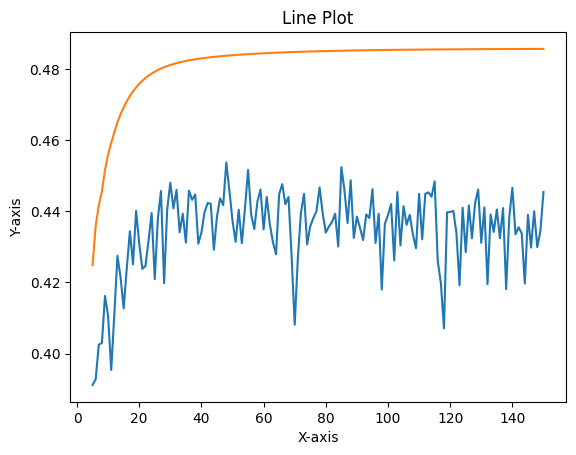

(4, 6)
5
1/1 [==============================] - 0s 28ms/step
6
1/1 [==============================] - 0s 28ms/step
7
1/1 [==============================] - 0s 30ms/step
8
1/1 [==============================] - 0s 28ms/step
9
1/1 [==============================] - 0s 27ms/step
10
1/1 [==============================] - 0s 26ms/step
11
1/1 [==============================] - 0s 28ms/step
12
1/1 [==============================] - 0s 28ms/step
13
1/1 [==============================] - 0s 33ms/step
14
1/1 [==============================] - 0s 31ms/step
15
1/1 [==============================] - 0s 33ms/step
16
1/1 [==============================] - 0s 28ms/step
17
1/1 [==============================] - 0s 28ms/step
18
1/1 [==============================] - 0s 29ms/step
19
1/1 [==============================] - 0s 28ms/step
20
1/1 [==============================] - 0s 26ms/step
21
1/1 [==============================] - 0s 30ms/step
22
1/1 [==============================] - 0s 29ms/step
23
1/1 [

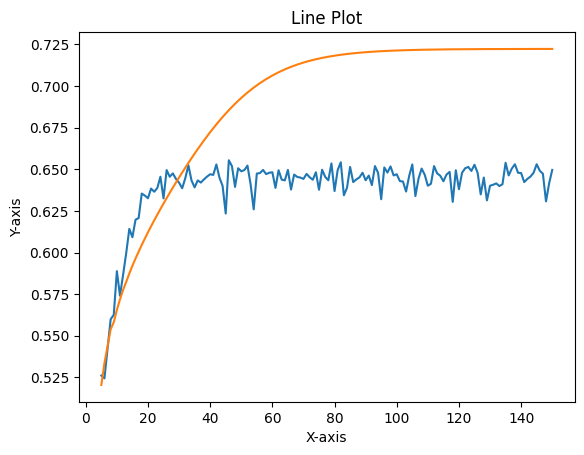

(4, 6)
5
1/1 [==============================] - 0s 33ms/step
6
1/1 [==============================] - 0s 31ms/step
7
1/1 [==============================] - 0s 30ms/step
8
1/1 [==============================] - 0s 31ms/step
9
1/1 [==============================] - 0s 32ms/step
10
1/1 [==============================] - 0s 28ms/step
11
1/1 [==============================] - 0s 34ms/step
12
1/1 [==============================] - 0s 31ms/step
13
1/1 [==============================] - 0s 27ms/step
14
1/1 [==============================] - 0s 28ms/step
15
1/1 [==============================] - 0s 30ms/step
16
1/1 [==============================] - 0s 28ms/step
17
1/1 [==============================] - 0s 29ms/step
18
1/1 [==============================] - 0s 30ms/step
19
1/1 [==============================] - 0s 29ms/step
20
1/1 [==============================] - 0s 30ms/step
21
1/1 [==============================] - 0s 30ms/step
22
1/1 [==============================] - 0s 26ms/step
23
1/1 [

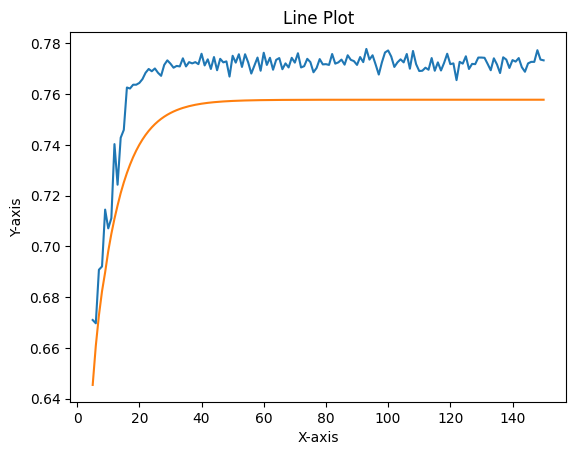

(4, 6)
5
1/1 [==============================] - 0s 33ms/step
6
1/1 [==============================] - 0s 43ms/step
7
1/1 [==============================] - 0s 33ms/step
8
1/1 [==============================] - 0s 34ms/step
9
1/1 [==============================] - 0s 39ms/step
10
1/1 [==============================] - 0s 44ms/step
11
1/1 [==============================] - 0s 48ms/step
12
1/1 [==============================] - 0s 38ms/step
13
1/1 [==============================] - 0s 39ms/step
14
1/1 [==============================] - 0s 40ms/step
15
1/1 [==============================] - 0s 35ms/step
16
1/1 [==============================] - 0s 37ms/step
17
1/1 [==============================] - 0s 47ms/step
18
1/1 [==============================] - 0s 35ms/step
19
1/1 [==============================] - 0s 44ms/step
20
1/1 [==============================] - 0s 37ms/step
21
1/1 [==============================] - 0s 37ms/step
22
1/1 [==============================] - 0s 36ms/step
23
1/1 [

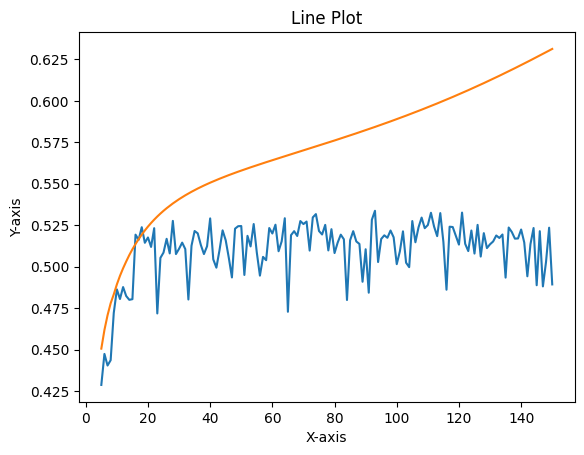

(4, 6)
5
1/1 [==============================] - 0s 40ms/step
6
1/1 [==============================] - 0s 31ms/step
7
1/1 [==============================] - 0s 29ms/step
8
1/1 [==============================] - 0s 34ms/step
9
1/1 [==============================] - 0s 28ms/step
10
1/1 [==============================] - 0s 28ms/step
11
1/1 [==============================] - 0s 37ms/step
12
1/1 [==============================] - 0s 29ms/step
13
1/1 [==============================] - 0s 32ms/step
14
1/1 [==============================] - 0s 31ms/step
15
1/1 [==============================] - 0s 29ms/step
16
1/1 [==============================] - 0s 43ms/step
17
1/1 [==============================] - 0s 28ms/step
18
1/1 [==============================] - 0s 27ms/step
19
1/1 [==============================] - 0s 27ms/step
20
1/1 [==============================] - 0s 28ms/step
21
1/1 [==============================] - 0s 30ms/step
22
1/1 [==============================] - 0s 30ms/step
23
1/1 [

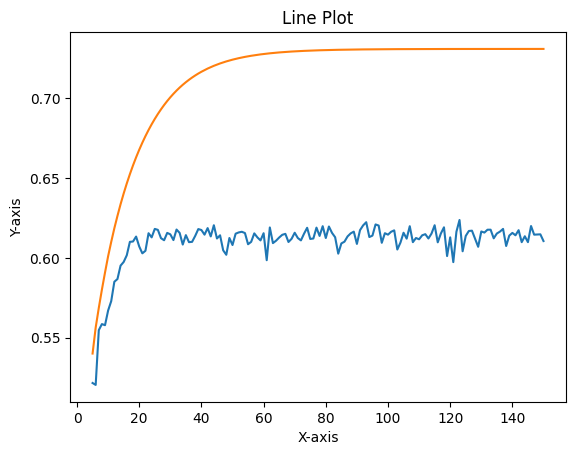

(4, 6)
5
1/1 [==============================] - 0s 39ms/step
6
1/1 [==============================] - 0s 32ms/step
7
1/1 [==============================] - 0s 26ms/step
8
1/1 [==============================] - 0s 27ms/step
9
1/1 [==============================] - 0s 33ms/step
10
1/1 [==============================] - 0s 31ms/step
11
1/1 [==============================] - 0s 26ms/step
12
1/1 [==============================] - 0s 27ms/step
13
1/1 [==============================] - 0s 27ms/step
14
1/1 [==============================] - 0s 31ms/step
15
1/1 [==============================] - 0s 27ms/step
16
1/1 [==============================] - 0s 30ms/step
17
1/1 [==============================] - 0s 34ms/step
18
1/1 [==============================] - 0s 32ms/step
19
1/1 [==============================] - 0s 30ms/step
20
1/1 [==============================] - 0s 27ms/step
21
1/1 [==============================] - 0s 27ms/step
22
1/1 [==============================] - 0s 30ms/step
23
1/1 [

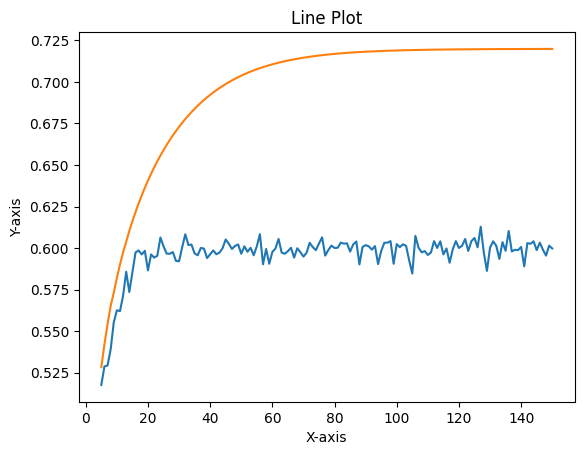

(4, 6)
5
1/1 [==============================] - 0s 30ms/step
6
1/1 [==============================] - 0s 34ms/step
7
1/1 [==============================] - 0s 36ms/step
8
1/1 [==============================] - 0s 27ms/step
9
1/1 [==============================] - 0s 39ms/step
10
1/1 [==============================] - 0s 29ms/step
11
1/1 [==============================] - 0s 34ms/step
12
1/1 [==============================] - 0s 28ms/step
13
1/1 [==============================] - 0s 29ms/step
14
1/1 [==============================] - 0s 32ms/step
15
1/1 [==============================] - 0s 27ms/step
16
1/1 [==============================] - 0s 32ms/step
17
1/1 [==============================] - 0s 28ms/step
18
1/1 [==============================] - 0s 30ms/step
19
1/1 [==============================] - 0s 30ms/step
20
1/1 [==============================] - 0s 31ms/step
21
1/1 [==============================] - 0s 28ms/step
22
1/1 [==============================] - 0s 31ms/step
23
1/1 [

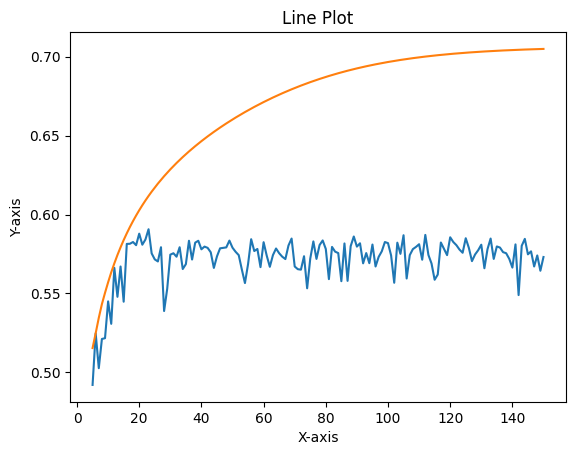

(4, 6)
10
1/1 [==============================] - 0s 28ms/step
11
1/1 [==============================] - 0s 29ms/step
12
1/1 [==============================] - 0s 29ms/step
13
1/1 [==============================] - 0s 29ms/step
14
1/1 [==============================] - 0s 33ms/step
15
1/1 [==============================] - 0s 36ms/step
16
1/1 [==============================] - 0s 28ms/step
17
1/1 [==============================] - 0s 29ms/step
18
1/1 [==============================] - 0s 37ms/step
19
1/1 [==============================] - 0s 29ms/step
20
1/1 [==============================] - 0s 27ms/step
21
1/1 [==============================] - 0s 32ms/step
22
1/1 [==============================] - 0s 26ms/step
23
1/1 [==============================] - 0s 28ms/step
24
1/1 [==============================] - 0s 27ms/step
25
1/1 [==============================] - 0s 30ms/step
26
1/1 [==============================] - 0s 32ms/step
27
1/1 [==============================] - 0s 28ms/step
28


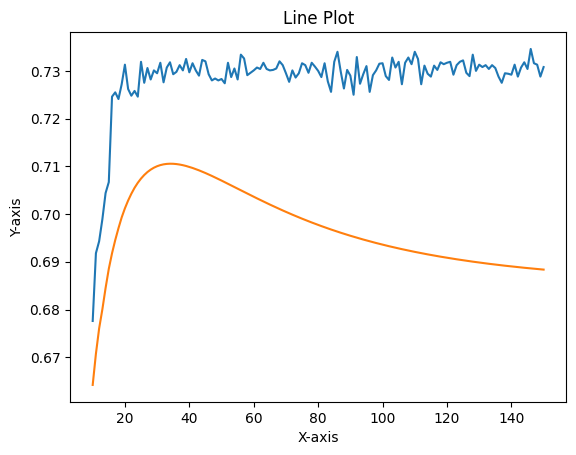

(4, 6)
10
1/1 [==============================] - 0s 63ms/step
11
1/1 [==============================] - 0s 52ms/step
12
1/1 [==============================] - 0s 61ms/step
13
1/1 [==============================] - 0s 70ms/step
14
1/1 [==============================] - 0s 67ms/step
15
1/1 [==============================] - 0s 65ms/step
16
1/1 [==============================] - 0s 46ms/step
17
1/1 [==============================] - 0s 44ms/step
18
1/1 [==============================] - 0s 61ms/step
19
1/1 [==============================] - 0s 63ms/step
20
1/1 [==============================] - 0s 46ms/step
21
1/1 [==============================] - 0s 45ms/step
22
1/1 [==============================] - 0s 36ms/step
23
1/1 [==============================] - 0s 28ms/step
24
1/1 [==============================] - 0s 43ms/step
25
1/1 [==============================] - 0s 30ms/step
26
1/1 [==============================] - 0s 30ms/step
27
1/1 [==============================] - 0s 27ms/step
28


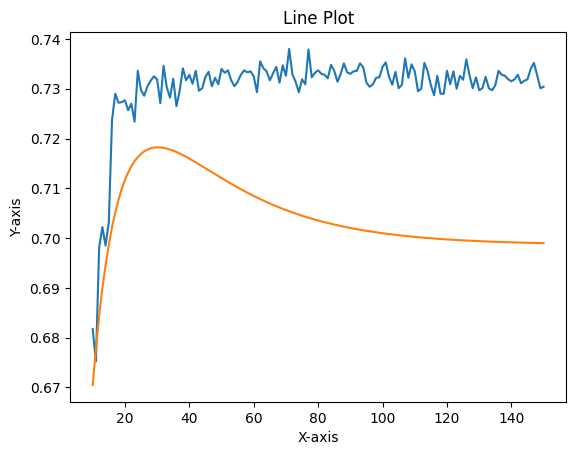

(4, 6)
10
1/1 [==============================] - 0s 61ms/step
11
1/1 [==============================] - 0s 38ms/step
12
1/1 [==============================] - 0s 50ms/step
13
1/1 [==============================] - 0s 63ms/step
14
1/1 [==============================] - 0s 62ms/step
15
1/1 [==============================] - 0s 62ms/step
16
1/1 [==============================] - 0s 49ms/step
17
1/1 [==============================] - 0s 47ms/step
18
1/1 [==============================] - 0s 63ms/step
19
1/1 [==============================] - 0s 52ms/step
20
1/1 [==============================] - 0s 40ms/step
21
1/1 [==============================] - 0s 34ms/step
22
1/1 [==============================] - 0s 44ms/step
23
1/1 [==============================] - 0s 41ms/step
24
1/1 [==============================] - 0s 53ms/step
25
1/1 [==============================] - 0s 42ms/step
26
1/1 [==============================] - 0s 52ms/step
27
1/1 [==============================] - 0s 59ms/step
28


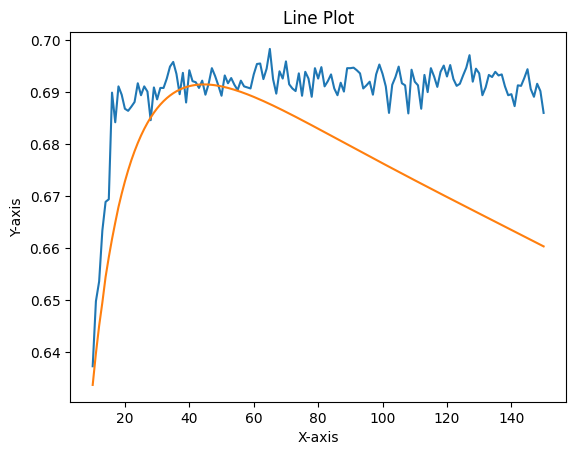

(4, 6)
10
1/1 [==============================] - 0s 36ms/step
11
1/1 [==============================] - 0s 39ms/step
12
1/1 [==============================] - 0s 38ms/step
13
1/1 [==============================] - 0s 36ms/step
14
1/1 [==============================] - 0s 55ms/step
15
1/1 [==============================] - 0s 56ms/step
16
1/1 [==============================] - 0s 59ms/step
17
1/1 [==============================] - 0s 45ms/step
18
1/1 [==============================] - 0s 64ms/step
19
1/1 [==============================] - 0s 58ms/step
20
1/1 [==============================] - 0s 44ms/step
21
1/1 [==============================] - 0s 69ms/step
22
1/1 [==============================] - 0s 59ms/step
23
1/1 [==============================] - 0s 67ms/step
24
1/1 [==============================] - 0s 63ms/step
25
1/1 [==============================] - 0s 38ms/step
26
1/1 [==============================] - 0s 41ms/step
27
1/1 [==============================] - 0s 59ms/step
28


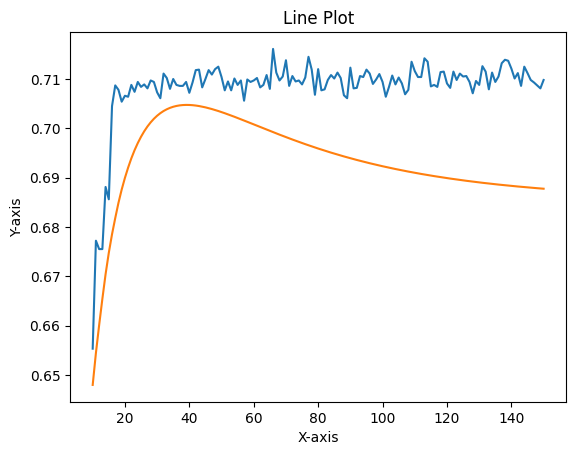

(4, 6)
10
1/1 [==============================] - 0s 38ms/step
11
1/1 [==============================] - 0s 33ms/step
12
1/1 [==============================] - 0s 31ms/step
13
1/1 [==============================] - 0s 38ms/step
14
1/1 [==============================] - 0s 28ms/step
15
1/1 [==============================] - 0s 31ms/step
16
1/1 [==============================] - 0s 38ms/step
17
1/1 [==============================] - 0s 29ms/step
18
1/1 [==============================] - 0s 28ms/step
19
1/1 [==============================] - 0s 30ms/step
20
1/1 [==============================] - 0s 28ms/step
21
1/1 [==============================] - 0s 29ms/step
22
1/1 [==============================] - 0s 30ms/step
23
1/1 [==============================] - 0s 34ms/step
24
1/1 [==============================] - 0s 45ms/step
25
1/1 [==============================] - 0s 45ms/step
26
1/1 [==============================] - 0s 35ms/step
27
1/1 [==============================] - 0s 45ms/step
28


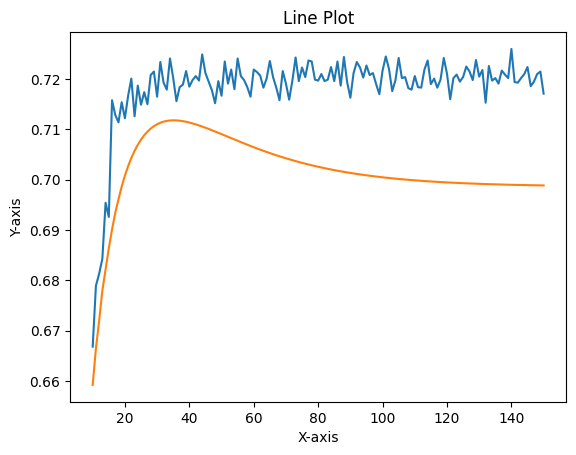

(4, 6)
10
1/1 [==============================] - 0s 30ms/step
11
1/1 [==============================] - 0s 28ms/step
12
1/1 [==============================] - 0s 29ms/step
13
1/1 [==============================] - 0s 34ms/step
14
1/1 [==============================] - 0s 31ms/step
15
1/1 [==============================] - 0s 29ms/step
16
1/1 [==============================] - 0s 27ms/step
17
1/1 [==============================] - 0s 31ms/step
18
1/1 [==============================] - 0s 29ms/step
19
1/1 [==============================] - 0s 31ms/step
20
1/1 [==============================] - 0s 29ms/step
21
1/1 [==============================] - 0s 34ms/step
22
1/1 [==============================] - 0s 30ms/step
23
1/1 [==============================] - 0s 42ms/step
24
1/1 [==============================] - 0s 30ms/step
25
1/1 [==============================] - 0s 30ms/step
26
1/1 [==============================] - 0s 30ms/step
27
1/1 [==============================] - 0s 28ms/step
28


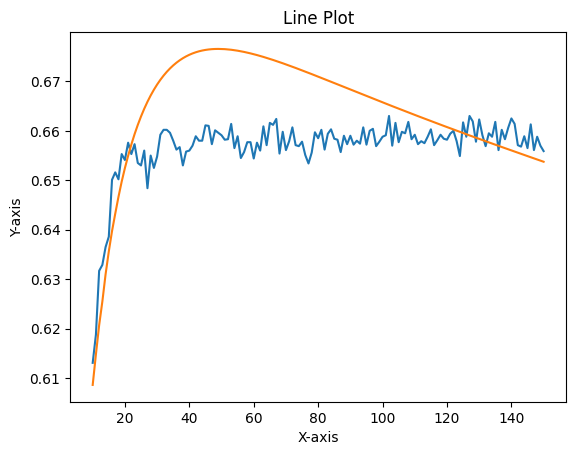

(4, 6)
10
1/1 [==============================] - 0s 35ms/step
11
1/1 [==============================] - 0s 44ms/step
12
1/1 [==============================] - 0s 32ms/step
13
1/1 [==============================] - 0s 38ms/step
14
1/1 [==============================] - 0s 48ms/step
15
1/1 [==============================] - 0s 35ms/step
16
1/1 [==============================] - 0s 32ms/step
17
1/1 [==============================] - 0s 37ms/step
18
1/1 [==============================] - 0s 35ms/step
19
1/1 [==============================] - 0s 34ms/step
20
1/1 [==============================] - 0s 47ms/step
21
1/1 [==============================] - 0s 34ms/step
22
1/1 [==============================] - 0s 35ms/step
23
1/1 [==============================] - 0s 37ms/step
24
1/1 [==============================] - 0s 33ms/step
25
1/1 [==============================] - 0s 33ms/step
26
1/1 [==============================] - 0s 43ms/step
27
1/1 [==============================] - 0s 35ms/step
28


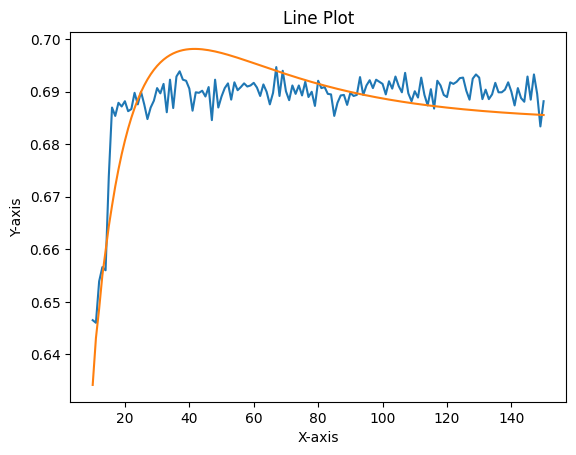

(4, 6)
10
1/1 [==============================] - 0s 49ms/step
11
1/1 [==============================] - 0s 30ms/step
12
1/1 [==============================] - 0s 32ms/step
13
1/1 [==============================] - 0s 31ms/step
14
1/1 [==============================] - 0s 33ms/step
15
1/1 [==============================] - 0s 32ms/step
16
1/1 [==============================] - 0s 29ms/step
17
1/1 [==============================] - 0s 27ms/step
18
1/1 [==============================] - 0s 30ms/step
19
1/1 [==============================] - 0s 28ms/step
20
1/1 [==============================] - 0s 27ms/step
21
1/1 [==============================] - 0s 30ms/step
22
1/1 [==============================] - 0s 36ms/step
23
1/1 [==============================] - 0s 29ms/step
24
1/1 [==============================] - 0s 30ms/step
25
1/1 [==============================] - 0s 32ms/step
26
1/1 [==============================] - 0s 29ms/step
27
1/1 [==============================] - 0s 30ms/step
28


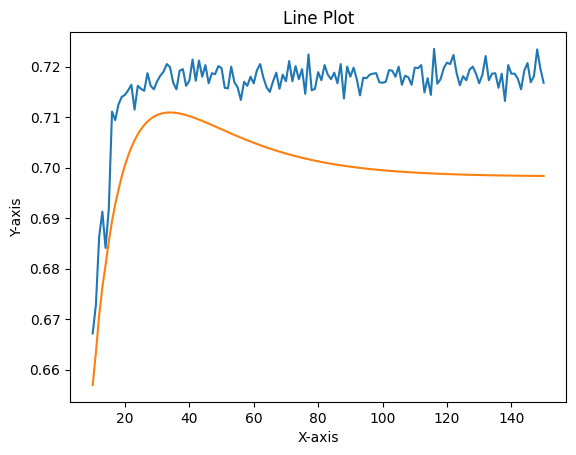

(4, 6)
10
1/1 [==============================] - 0s 30ms/step
11
1/1 [==============================] - 0s 30ms/step
12
1/1 [==============================] - 0s 32ms/step
13
1/1 [==============================] - 0s 33ms/step
14
1/1 [==============================] - 0s 32ms/step
15
1/1 [==============================] - 0s 43ms/step
16
1/1 [==============================] - 0s 30ms/step
17
1/1 [==============================] - 0s 26ms/step
18
1/1 [==============================] - 0s 32ms/step
19
1/1 [==============================] - 0s 31ms/step
20
1/1 [==============================] - 0s 29ms/step
21
1/1 [==============================] - 0s 33ms/step
22
1/1 [==============================] - 0s 38ms/step
23
1/1 [==============================] - 0s 28ms/step
24
1/1 [==============================] - 0s 30ms/step
25
1/1 [==============================] - 0s 34ms/step
26
1/1 [==============================] - 0s 43ms/step
27
1/1 [==============================] - 0s 32ms/step
28


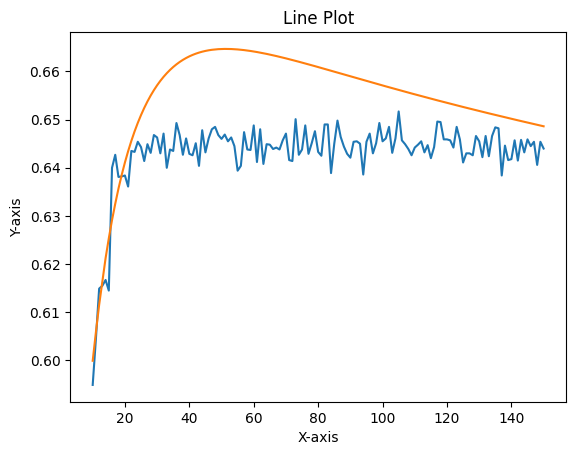

(4, 6)
10
1/1 [==============================] - 0s 28ms/step
11
1/1 [==============================] - 0s 27ms/step
12
1/1 [==============================] - 0s 30ms/step
13
1/1 [==============================] - 0s 46ms/step
14
1/1 [==============================] - 0s 29ms/step
15
1/1 [==============================] - 0s 27ms/step
16
1/1 [==============================] - 0s 28ms/step
17
1/1 [==============================] - 0s 30ms/step
18
1/1 [==============================] - 0s 28ms/step
19
1/1 [==============================] - 0s 27ms/step
20
1/1 [==============================] - 0s 28ms/step
21
1/1 [==============================] - 0s 30ms/step
22
1/1 [==============================] - 0s 32ms/step
23
1/1 [==============================] - 0s 28ms/step
24
1/1 [==============================] - 0s 29ms/step
25
1/1 [==============================] - 0s 29ms/step
26
1/1 [==============================] - 0s 31ms/step
27
1/1 [==============================] - 0s 27ms/step
28


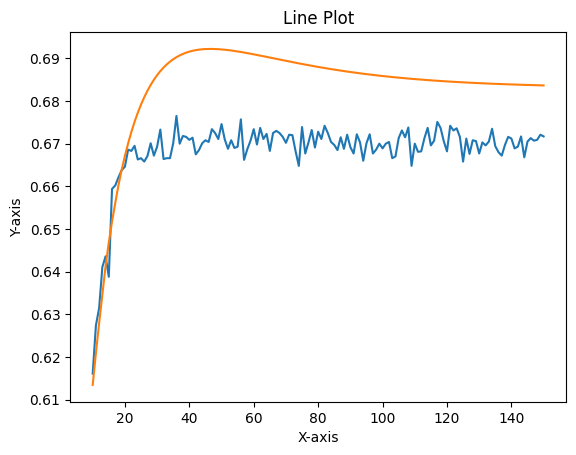

(4, 6)
10
1/1 [==============================] - 0s 34ms/step
11
1/1 [==============================] - 0s 27ms/step
12
1/1 [==============================] - 0s 30ms/step
13
1/1 [==============================] - 0s 28ms/step
14
1/1 [==============================] - 0s 40ms/step
15
1/1 [==============================] - 0s 29ms/step
16
1/1 [==============================] - 0s 31ms/step
17
1/1 [==============================] - 0s 32ms/step
18
1/1 [==============================] - 0s 29ms/step
19
1/1 [==============================] - 0s 26ms/step
20
1/1 [==============================] - 0s 32ms/step
21
1/1 [==============================] - 0s 30ms/step
22
1/1 [==============================] - 0s 27ms/step
23
1/1 [==============================] - 0s 29ms/step
24
1/1 [==============================] - 0s 32ms/step
25
1/1 [==============================] - 0s 44ms/step
26
1/1 [==============================] - 0s 33ms/step
27
1/1 [==============================] - 0s 28ms/step
28


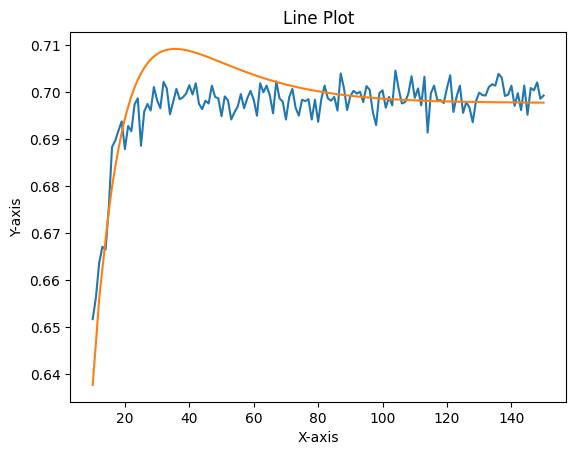

(4, 6)
10
1/1 [==============================] - 0s 45ms/step
11
1/1 [==============================] - 0s 42ms/step
12
1/1 [==============================] - 0s 45ms/step
13
1/1 [==============================] - 0s 38ms/step
14
1/1 [==============================] - 0s 29ms/step
15
1/1 [==============================] - 0s 27ms/step
16
1/1 [==============================] - 0s 28ms/step
17
1/1 [==============================] - 0s 29ms/step
18
1/1 [==============================] - 0s 31ms/step
19
1/1 [==============================] - 0s 26ms/step
20
1/1 [==============================] - 0s 28ms/step
21
1/1 [==============================] - 0s 33ms/step
22
1/1 [==============================] - 0s 32ms/step
23
1/1 [==============================] - 0s 31ms/step
24
1/1 [==============================] - 0s 33ms/step
25
1/1 [==============================] - 0s 30ms/step
26
1/1 [==============================] - 0s 30ms/step
27
1/1 [==============================] - 0s 30ms/step
28


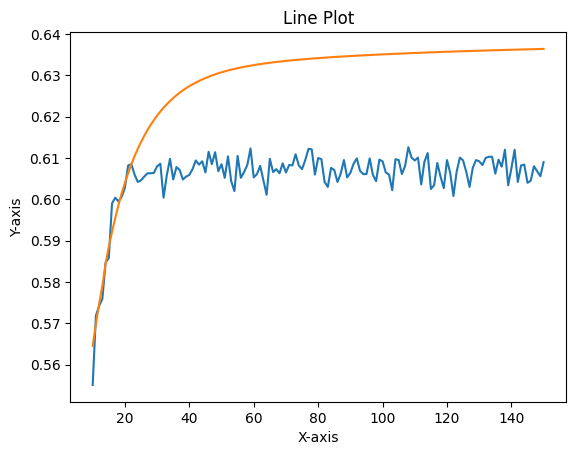

(4, 6)
10
1/1 [==============================] - 0s 48ms/step
11
1/1 [==============================] - 0s 48ms/step
12
1/1 [==============================] - 0s 42ms/step
13
1/1 [==============================] - 0s 60ms/step
14
1/1 [==============================] - 0s 62ms/step
15
1/1 [==============================] - 0s 45ms/step
16
1/1 [==============================] - 0s 52ms/step
17
1/1 [==============================] - 0s 36ms/step
18
1/1 [==============================] - 0s 39ms/step
19
1/1 [==============================] - 0s 60ms/step
20
1/1 [==============================] - 0s 61ms/step
21
1/1 [==============================] - 0s 43ms/step
22
1/1 [==============================] - 0s 48ms/step
23
1/1 [==============================] - 0s 34ms/step
24
1/1 [==============================] - 0s 55ms/step
25
1/1 [==============================] - 0s 61ms/step
26
1/1 [==============================] - 0s 39ms/step
27
1/1 [==============================] - 0s 56ms/step
28


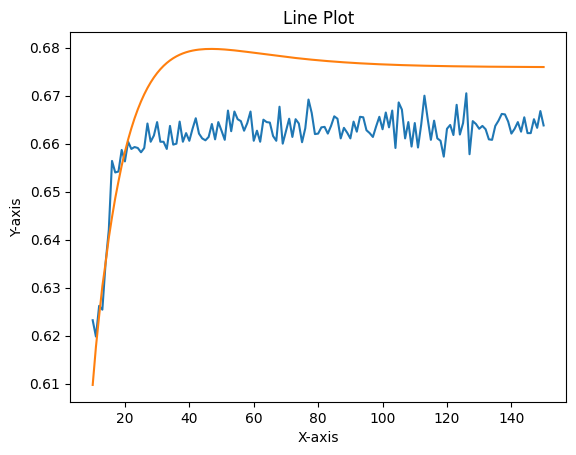

(4, 6)
10
1/1 [==============================] - 0s 44ms/step
11
1/1 [==============================] - 0s 51ms/step
12
1/1 [==============================] - 0s 57ms/step
13
1/1 [==============================] - 0s 50ms/step
14
1/1 [==============================] - 0s 54ms/step
15
1/1 [==============================] - 0s 35ms/step
16
1/1 [==============================] - 0s 59ms/step
17
1/1 [==============================] - 0s 52ms/step
18
1/1 [==============================] - 0s 35ms/step
19
1/1 [==============================] - 0s 45ms/step
20
1/1 [==============================] - 0s 55ms/step
21
1/1 [==============================] - 0s 67ms/step
22
1/1 [==============================] - 0s 64ms/step
23
1/1 [==============================] - 0s 66ms/step
24
1/1 [==============================] - 0s 44ms/step
25
1/1 [==============================] - 0s 39ms/step
26
1/1 [==============================] - 0s 34ms/step
27
1/1 [==============================] - 0s 44ms/step
28


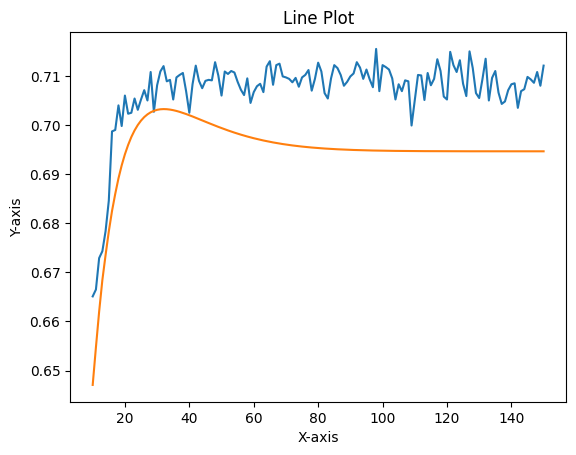

(4, 6)
10
1/1 [==============================] - 0s 35ms/step
11
1/1 [==============================] - 0s 26ms/step
12
1/1 [==============================] - 0s 28ms/step
13
1/1 [==============================] - 0s 28ms/step
14
1/1 [==============================] - 0s 28ms/step
15
1/1 [==============================] - 0s 59ms/step
16
1/1 [==============================] - 0s 50ms/step
17
1/1 [==============================] - 0s 36ms/step
18
1/1 [==============================] - 0s 49ms/step
19
1/1 [==============================] - 0s 37ms/step
20
1/1 [==============================] - 0s 44ms/step
21
1/1 [==============================] - 0s 55ms/step
22
1/1 [==============================] - 0s 41ms/step
23
1/1 [==============================] - 0s 30ms/step
24
1/1 [==============================] - 0s 33ms/step
25
1/1 [==============================] - 0s 34ms/step
26
1/1 [==============================] - 0s 33ms/step
27
1/1 [==============================] - 0s 33ms/step
28


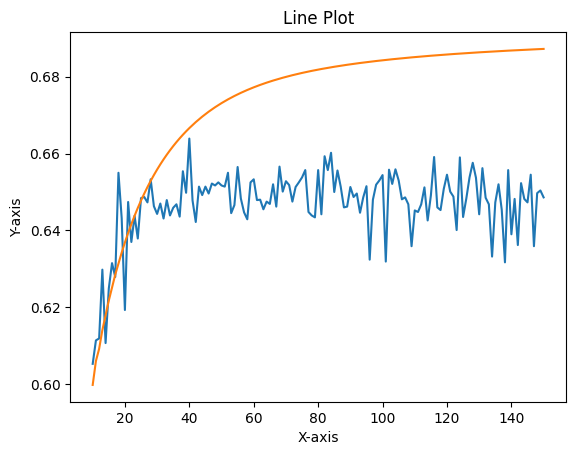

(4, 6)
10
1/1 [==============================] - 0s 30ms/step
11
1/1 [==============================] - 0s 34ms/step
12
1/1 [==============================] - 0s 26ms/step
13
1/1 [==============================] - 0s 27ms/step
14
1/1 [==============================] - 0s 28ms/step
15
1/1 [==============================] - 0s 41ms/step
16
1/1 [==============================] - 0s 28ms/step
17
1/1 [==============================] - 0s 29ms/step
18
1/1 [==============================] - 0s 28ms/step
19
1/1 [==============================] - 0s 26ms/step
20
1/1 [==============================] - 0s 39ms/step
21
1/1 [==============================] - 0s 32ms/step
22
1/1 [==============================] - 0s 28ms/step
23
1/1 [==============================] - 0s 28ms/step
24
1/1 [==============================] - 0s 26ms/step
25
1/1 [==============================] - 0s 26ms/step
26
1/1 [==============================] - 0s 34ms/step
27
1/1 [==============================] - 0s 32ms/step
28


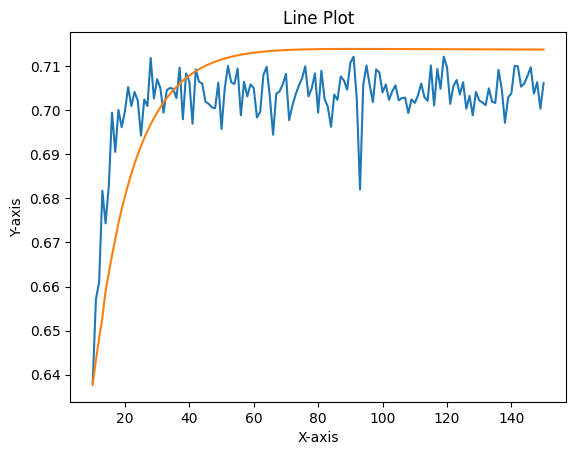

(4, 6)
10
1/1 [==============================] - 0s 46ms/step
11
1/1 [==============================] - 0s 34ms/step
12
1/1 [==============================] - 0s 34ms/step
13
1/1 [==============================] - 0s 50ms/step
14
1/1 [==============================] - 0s 40ms/step
15
1/1 [==============================] - 0s 40ms/step
16
1/1 [==============================] - 0s 39ms/step
17
1/1 [==============================] - 0s 32ms/step
18
1/1 [==============================] - 0s 34ms/step
19
1/1 [==============================] - 0s 34ms/step
20
1/1 [==============================] - 0s 38ms/step
21
1/1 [==============================] - 0s 41ms/step
22
1/1 [==============================] - 0s 41ms/step
23
1/1 [==============================] - 0s 40ms/step
24
1/1 [==============================] - 0s 49ms/step
25
1/1 [==============================] - 0s 37ms/step
26
1/1 [==============================] - 0s 33ms/step
27
1/1 [==============================] - 0s 42ms/step
28


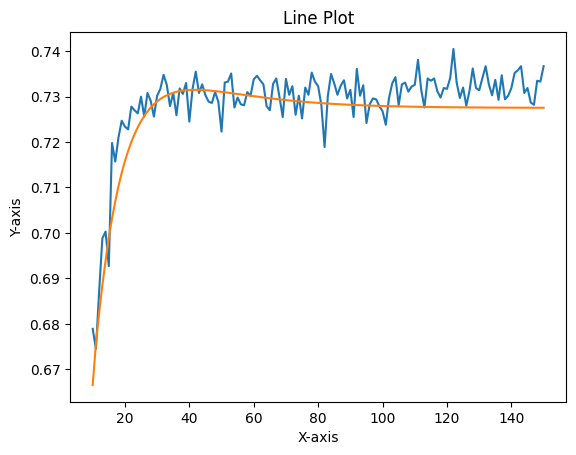

(4, 6)
10
1/1 [==============================] - 0s 27ms/step
11
1/1 [==============================] - 0s 29ms/step
12
1/1 [==============================] - 0s 34ms/step
13
1/1 [==============================] - 0s 26ms/step
14
1/1 [==============================] - 0s 27ms/step
15
1/1 [==============================] - 0s 27ms/step
16
1/1 [==============================] - 0s 32ms/step
17
1/1 [==============================] - 0s 27ms/step
18
1/1 [==============================] - 0s 28ms/step
19
1/1 [==============================] - 0s 32ms/step
20
1/1 [==============================] - 0s 31ms/step
21
1/1 [==============================] - 0s 30ms/step
22
1/1 [==============================] - 0s 30ms/step
23
1/1 [==============================] - 0s 36ms/step
24
1/1 [==============================] - 0s 29ms/step
25
1/1 [==============================] - 0s 30ms/step
26
1/1 [==============================] - 0s 29ms/step
27
1/1 [==============================] - 0s 30ms/step
28


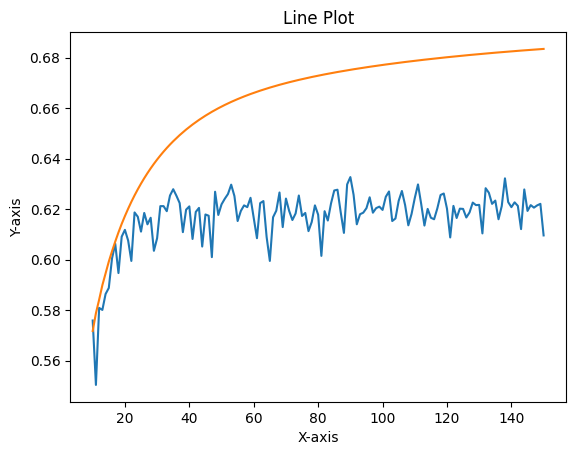

(4, 6)
10
1/1 [==============================] - 0s 32ms/step
11
1/1 [==============================] - 0s 33ms/step
12
1/1 [==============================] - 0s 32ms/step
13
1/1 [==============================] - 0s 31ms/step
14
1/1 [==============================] - 0s 28ms/step
15
1/1 [==============================] - 0s 27ms/step
16
1/1 [==============================] - 0s 29ms/step
17
1/1 [==============================] - 0s 43ms/step
18
1/1 [==============================] - 0s 28ms/step
19
1/1 [==============================] - 0s 28ms/step
20
1/1 [==============================] - 0s 27ms/step
21
1/1 [==============================] - 0s 31ms/step
22
1/1 [==============================] - 0s 40ms/step
23
1/1 [==============================] - 0s 28ms/step
24
1/1 [==============================] - 0s 27ms/step
25
1/1 [==============================] - 0s 38ms/step
26
1/1 [==============================] - 0s 28ms/step
27
1/1 [==============================] - 0s 26ms/step
28


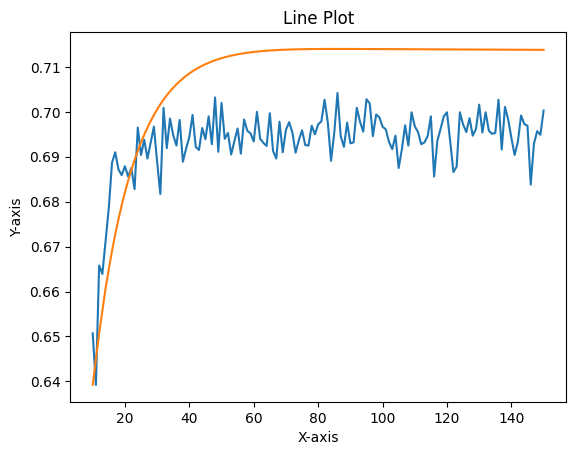

(4, 6)
10
1/1 [==============================] - 0s 30ms/step
11
1/1 [==============================] - 0s 27ms/step
12
1/1 [==============================] - 0s 32ms/step
13
1/1 [==============================] - 0s 28ms/step
14
1/1 [==============================] - 0s 28ms/step
15
1/1 [==============================] - 0s 37ms/step
16
1/1 [==============================] - 0s 32ms/step
17
1/1 [==============================] - 0s 28ms/step
18
1/1 [==============================] - 0s 33ms/step
19
1/1 [==============================] - 0s 29ms/step
20
1/1 [==============================] - 0s 27ms/step
21
1/1 [==============================] - 0s 29ms/step
22
1/1 [==============================] - 0s 26ms/step
23
1/1 [==============================] - 0s 28ms/step
24
1/1 [==============================] - 0s 31ms/step
25
1/1 [==============================] - 0s 28ms/step
26
1/1 [==============================] - 0s 36ms/step
27
1/1 [==============================] - 0s 28ms/step
28


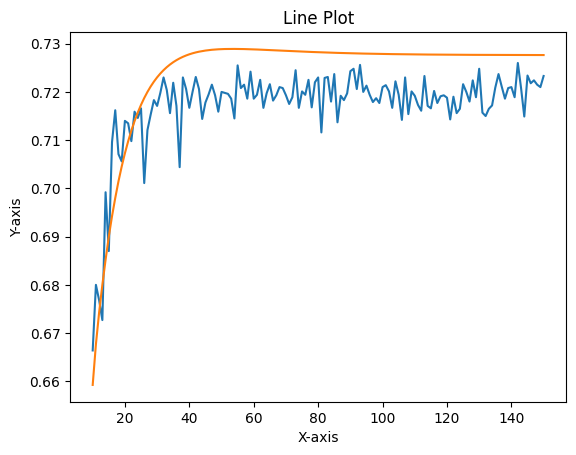

(4, 6)
10
1/1 [==============================] - 0s 41ms/step
11
1/1 [==============================] - 0s 26ms/step
12
1/1 [==============================] - 0s 27ms/step
13
1/1 [==============================] - 0s 28ms/step
14
1/1 [==============================] - 0s 30ms/step
15
1/1 [==============================] - 0s 31ms/step
16
1/1 [==============================] - 0s 27ms/step
17
1/1 [==============================] - 0s 29ms/step
18
1/1 [==============================] - 0s 41ms/step
19
1/1 [==============================] - 0s 30ms/step
20
1/1 [==============================] - 0s 29ms/step
21
1/1 [==============================] - 0s 32ms/step
22
1/1 [==============================] - 0s 35ms/step
23
1/1 [==============================] - 0s 27ms/step
24
1/1 [==============================] - 0s 27ms/step
25
1/1 [==============================] - 0s 29ms/step
26
1/1 [==============================] - 0s 29ms/step
27
1/1 [==============================] - 0s 31ms/step
28


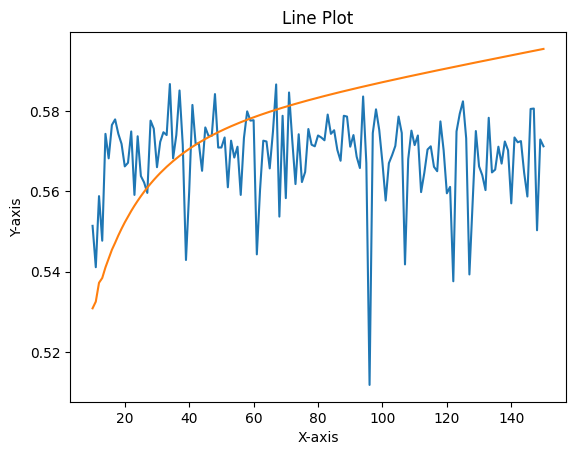

(4, 6)
10
1/1 [==============================] - 0s 27ms/step
11
1/1 [==============================] - 0s 29ms/step
12
1/1 [==============================] - 0s 29ms/step
13
1/1 [==============================] - 0s 26ms/step
14
1/1 [==============================] - 0s 28ms/step
15
1/1 [==============================] - 0s 28ms/step
16
1/1 [==============================] - 0s 40ms/step
17
1/1 [==============================] - 0s 30ms/step
18
1/1 [==============================] - 0s 28ms/step
19
1/1 [==============================] - 0s 41ms/step
20
1/1 [==============================] - 0s 29ms/step
21
1/1 [==============================] - 0s 33ms/step
22
1/1 [==============================] - 0s 28ms/step
23
1/1 [==============================] - 0s 26ms/step
24
1/1 [==============================] - 0s 29ms/step
25
1/1 [==============================] - 0s 31ms/step
26
1/1 [==============================] - 0s 28ms/step
27
1/1 [==============================] - 0s 33ms/step
28


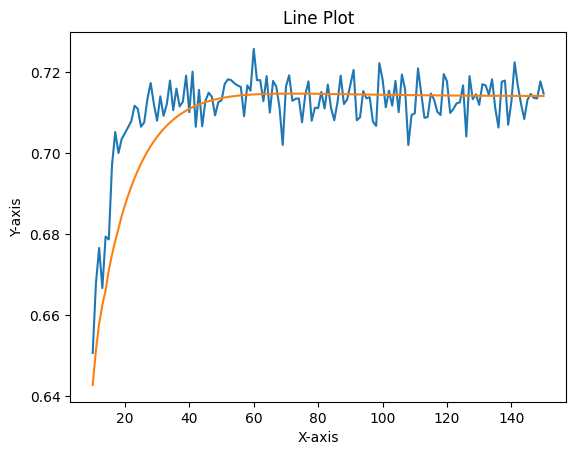

(4, 6)
10
1/1 [==============================] - 0s 61ms/step
11
1/1 [==============================] - 0s 48ms/step
12
1/1 [==============================] - 0s 42ms/step
13
1/1 [==============================] - 0s 60ms/step
14
1/1 [==============================] - 0s 66ms/step
15
1/1 [==============================] - 0s 46ms/step
16
1/1 [==============================] - 0s 51ms/step
17
1/1 [==============================] - 0s 51ms/step
18
1/1 [==============================] - 0s 40ms/step
19
1/1 [==============================] - 0s 31ms/step
20
1/1 [==============================] - 0s 32ms/step
21
1/1 [==============================] - 0s 27ms/step
22
1/1 [==============================] - 0s 32ms/step
23
1/1 [==============================] - 0s 30ms/step
24
1/1 [==============================] - 0s 37ms/step
25
1/1 [==============================] - 0s 28ms/step
26
1/1 [==============================] - 0s 30ms/step
27
1/1 [==============================] - 0s 36ms/step
28


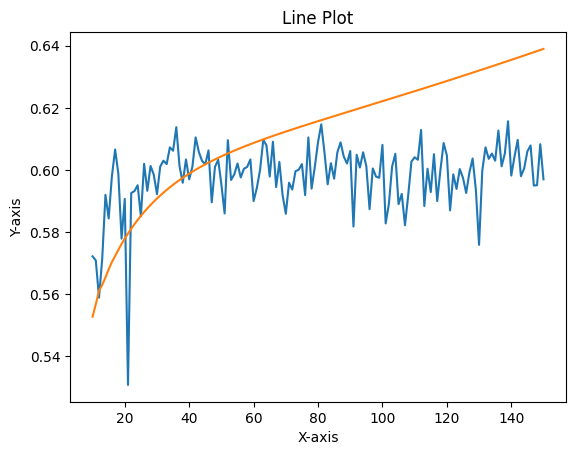

(4, 6)
10
1/1 [==============================] - 0s 53ms/step
11
1/1 [==============================] - 0s 40ms/step
12
1/1 [==============================] - 0s 62ms/step
13
1/1 [==============================] - 0s 54ms/step
14
1/1 [==============================] - 0s 40ms/step
15
1/1 [==============================] - 0s 36ms/step
16
1/1 [==============================] - 0s 67ms/step
17
1/1 [==============================] - 0s 62ms/step
18
1/1 [==============================] - 0s 65ms/step
19
1/1 [==============================] - 0s 60ms/step
20
1/1 [==============================] - 0s 50ms/step
21
1/1 [==============================] - 0s 67ms/step
22
1/1 [==============================] - 0s 43ms/step
23
1/1 [==============================] - 0s 58ms/step
24
1/1 [==============================] - 0s 51ms/step
25
1/1 [==============================] - 0s 44ms/step
26
1/1 [==============================] - 0s 34ms/step
27
1/1 [==============================] - 0s 36ms/step
28


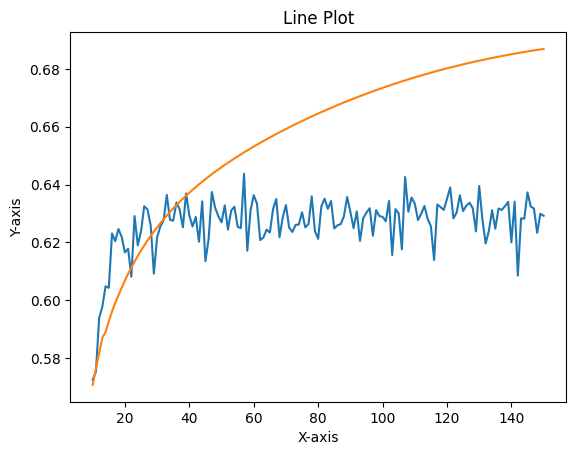

(4, 6)
10
1/1 [==============================] - 0s 67ms/step
11
1/1 [==============================] - 0s 46ms/step
12
1/1 [==============================] - 0s 33ms/step
13
1/1 [==============================] - 0s 62ms/step
14
1/1 [==============================] - 0s 40ms/step
15
1/1 [==============================] - 0s 42ms/step
16
1/1 [==============================] - 0s 34ms/step
17
1/1 [==============================] - 0s 30ms/step
18
1/1 [==============================] - 0s 57ms/step
19
1/1 [==============================] - 0s 35ms/step
20
1/1 [==============================] - 0s 37ms/step
21
1/1 [==============================] - 0s 34ms/step
22
1/1 [==============================] - 0s 55ms/step
23
1/1 [==============================] - 0s 51ms/step
24
1/1 [==============================] - 0s 31ms/step
25
1/1 [==============================] - 0s 57ms/step
26
1/1 [==============================] - 0s 41ms/step
27
1/1 [==============================] - 0s 47ms/step
28


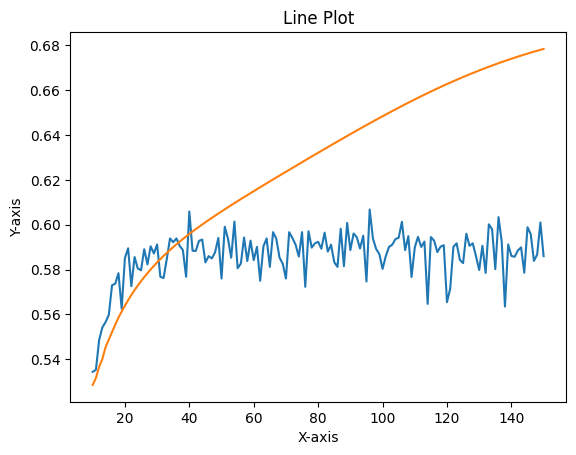

(4, 6)
10
1/1 [==============================] - 0s 32ms/step
11
1/1 [==============================] - 0s 31ms/step
12
1/1 [==============================] - 0s 28ms/step
13
1/1 [==============================] - 0s 31ms/step
14
1/1 [==============================] - 0s 27ms/step
15
1/1 [==============================] - 0s 36ms/step
16
1/1 [==============================] - 0s 69ms/step
17
1/1 [==============================] - 0s 66ms/step
18
1/1 [==============================] - 0s 48ms/step
19
1/1 [==============================] - 0s 47ms/step
20
1/1 [==============================] - 0s 68ms/step
21
1/1 [==============================] - 0s 79ms/step
22
1/1 [==============================] - 0s 71ms/step
23
1/1 [==============================] - 0s 77ms/step
24
1/1 [==============================] - 0s 58ms/step
25
1/1 [==============================] - 0s 56ms/step
26
1/1 [==============================] - 0s 63ms/step
27
1/1 [==============================] - 0s 59ms/step
28


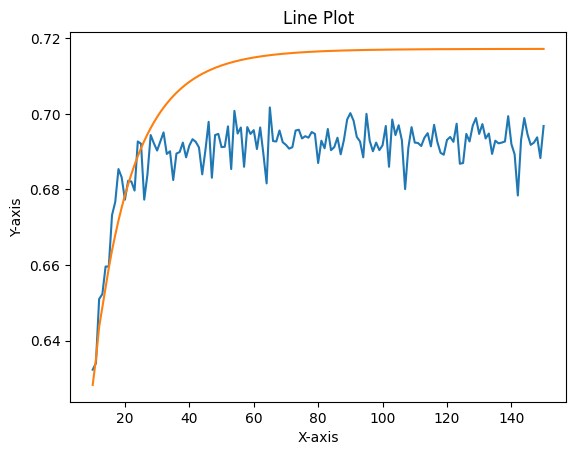

(4, 6)
10
1/1 [==============================] - 0s 42ms/step
11
1/1 [==============================] - 0s 33ms/step
12
1/1 [==============================] - 0s 30ms/step
13
1/1 [==============================] - 0s 48ms/step
14
1/1 [==============================] - 0s 54ms/step
15
1/1 [==============================] - 0s 68ms/step
16
1/1 [==============================] - 0s 58ms/step
17
1/1 [==============================] - 0s 38ms/step
18
1/1 [==============================] - 0s 37ms/step
19
1/1 [==============================] - 0s 46ms/step
20
1/1 [==============================] - 0s 61ms/step
21
1/1 [==============================] - 0s 60ms/step
22
1/1 [==============================] - 0s 43ms/step
23
1/1 [==============================] - 0s 42ms/step
24
1/1 [==============================] - 0s 52ms/step
25
1/1 [==============================] - 0s 42ms/step
26
1/1 [==============================] - 0s 68ms/step
27
1/1 [==============================] - 0s 66ms/step
28


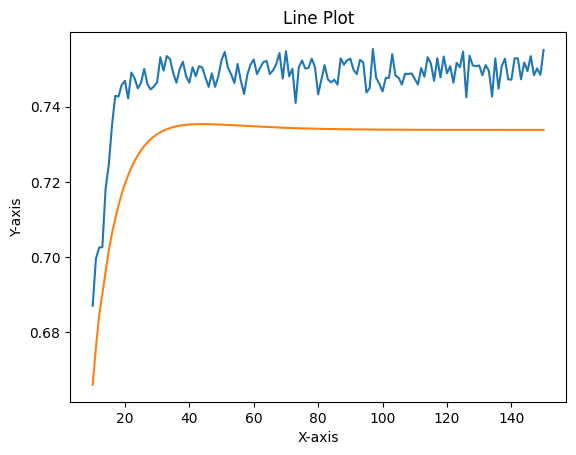

(4, 6)
10
1/1 [==============================] - 0s 28ms/step
11
1/1 [==============================] - 0s 28ms/step
12
1/1 [==============================] - 0s 28ms/step
13
1/1 [==============================] - 0s 33ms/step
14
1/1 [==============================] - 0s 27ms/step
15
1/1 [==============================] - 0s 33ms/step
16
1/1 [==============================] - 0s 38ms/step
17
1/1 [==============================] - 0s 32ms/step
18
1/1 [==============================] - 0s 27ms/step
19
1/1 [==============================] - 0s 31ms/step
20
1/1 [==============================] - 0s 29ms/step
21
1/1 [==============================] - 0s 30ms/step
22
1/1 [==============================] - 0s 38ms/step
23
1/1 [==============================] - 0s 30ms/step
24
1/1 [==============================] - 0s 31ms/step
25
1/1 [==============================] - 0s 30ms/step
26
1/1 [==============================] - 0s 30ms/step
27
1/1 [==============================] - 0s 45ms/step
28


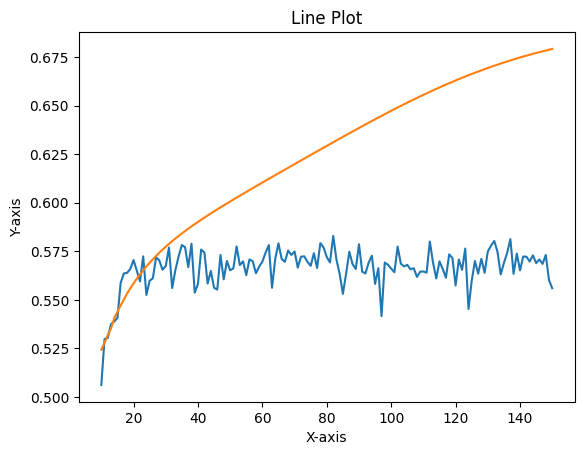

(4, 6)
10
1/1 [==============================] - 0s 32ms/step
11
1/1 [==============================] - 0s 29ms/step
12
1/1 [==============================] - 0s 37ms/step
13
1/1 [==============================] - 0s 28ms/step
14
1/1 [==============================] - 0s 30ms/step
15
1/1 [==============================] - 0s 30ms/step
16
1/1 [==============================] - 0s 32ms/step
17
1/1 [==============================] - 0s 26ms/step
18
1/1 [==============================] - 0s 38ms/step
19
1/1 [==============================] - 0s 27ms/step
20
1/1 [==============================] - 0s 28ms/step
21
1/1 [==============================] - 0s 29ms/step
22
1/1 [==============================] - 0s 31ms/step
23
1/1 [==============================] - 0s 30ms/step
24
1/1 [==============================] - 0s 30ms/step
25
1/1 [==============================] - 0s 47ms/step
26
1/1 [==============================] - 0s 28ms/step
27
1/1 [==============================] - 0s 28ms/step
28


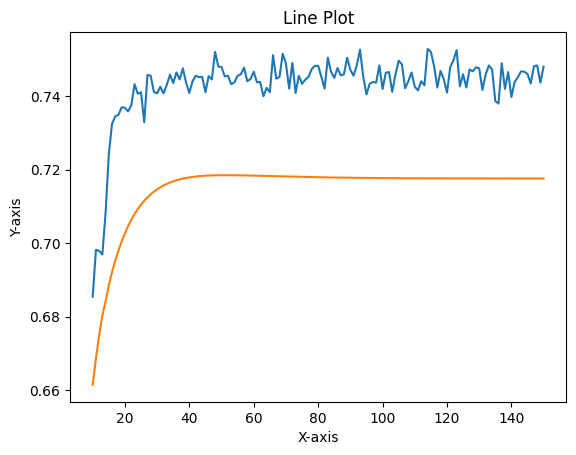

(4, 6)
10
1/1 [==============================] - 0s 27ms/step
11
1/1 [==============================] - 0s 30ms/step
12
1/1 [==============================] - 0s 27ms/step
13
1/1 [==============================] - 0s 28ms/step
14
1/1 [==============================] - 0s 34ms/step
15
1/1 [==============================] - 0s 27ms/step
16
1/1 [==============================] - 0s 29ms/step
17
1/1 [==============================] - 0s 27ms/step
18
1/1 [==============================] - 0s 26ms/step
19
1/1 [==============================] - 0s 27ms/step
20
1/1 [==============================] - 0s 44ms/step
21
1/1 [==============================] - 0s 28ms/step
22
1/1 [==============================] - 0s 27ms/step
23
1/1 [==============================] - 0s 29ms/step
24
1/1 [==============================] - 0s 31ms/step
25
1/1 [==============================] - 0s 31ms/step
26
1/1 [==============================] - 0s 27ms/step
27
1/1 [==============================] - 0s 33ms/step
28


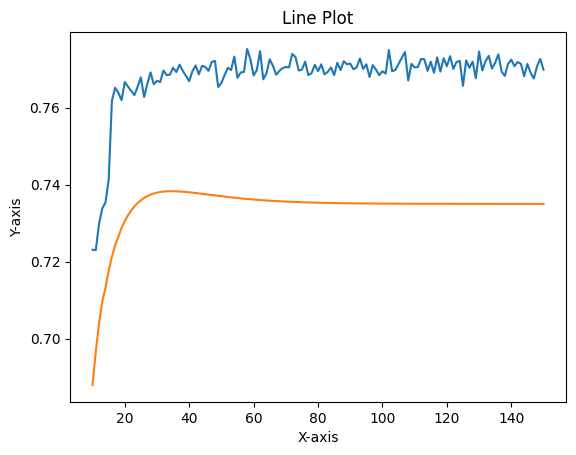

(4, 6)
10
1/1 [==============================] - 0s 32ms/step
11
1/1 [==============================] - 0s 28ms/step
12
1/1 [==============================] - 0s 26ms/step
13
1/1 [==============================] - 0s 33ms/step
14
1/1 [==============================] - 0s 30ms/step
15
1/1 [==============================] - 0s 27ms/step
16
1/1 [==============================] - 0s 33ms/step
17
1/1 [==============================] - 0s 28ms/step
18
1/1 [==============================] - 0s 27ms/step
19
1/1 [==============================] - 0s 36ms/step
20
1/1 [==============================] - 0s 27ms/step
21
1/1 [==============================] - 0s 35ms/step
22
1/1 [==============================] - 0s 30ms/step
23
1/1 [==============================] - 0s 36ms/step
24
1/1 [==============================] - 0s 29ms/step
25
1/1 [==============================] - 0s 29ms/step
26
1/1 [==============================] - 0s 28ms/step
27
1/1 [==============================] - 0s 34ms/step
28


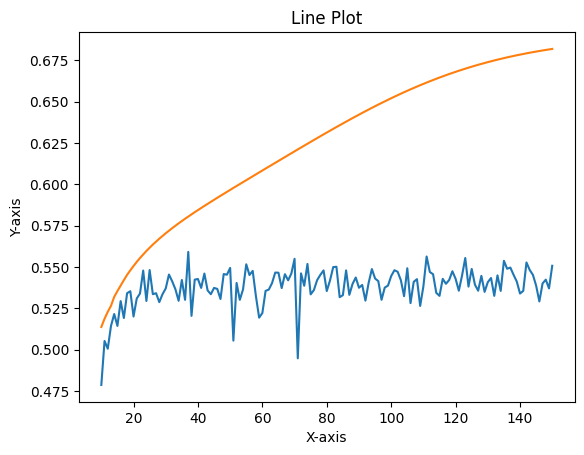

(4, 6)
10
1/1 [==============================] - 0s 47ms/step
11
1/1 [==============================] - 0s 31ms/step
12
1/1 [==============================] - 0s 27ms/step
13
1/1 [==============================] - 0s 29ms/step
14
1/1 [==============================] - 0s 28ms/step
15
1/1 [==============================] - 0s 40ms/step
16
1/1 [==============================] - 0s 28ms/step
17
1/1 [==============================] - 0s 30ms/step
18
1/1 [==============================] - 0s 48ms/step
19
1/1 [==============================] - 0s 31ms/step
20
1/1 [==============================] - 0s 45ms/step
21
1/1 [==============================] - 0s 33ms/step
22
1/1 [==============================] - 0s 28ms/step
23
1/1 [==============================] - 0s 29ms/step
24
1/1 [==============================] - 0s 30ms/step
25
1/1 [==============================] - 0s 31ms/step
26
1/1 [==============================] - 0s 29ms/step
27
1/1 [==============================] - 0s 39ms/step
28


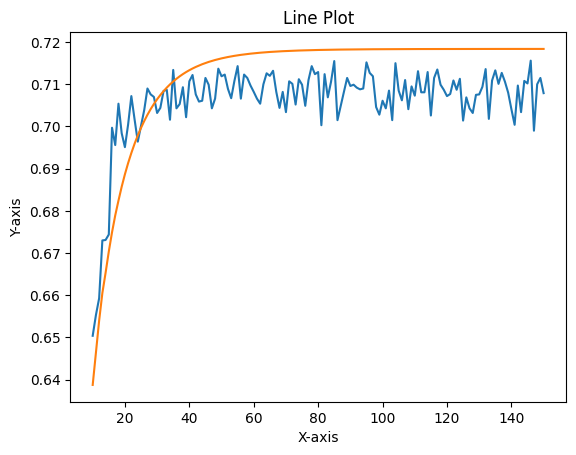

(4, 6)
10
1/1 [==============================] - 0s 29ms/step
11
1/1 [==============================] - 0s 34ms/step
12
1/1 [==============================] - 0s 29ms/step
13
1/1 [==============================] - 0s 53ms/step
14
1/1 [==============================] - 0s 30ms/step
15
1/1 [==============================] - 0s 27ms/step
16
1/1 [==============================] - 0s 29ms/step
17
1/1 [==============================] - 0s 40ms/step
18
1/1 [==============================] - 0s 31ms/step
19
1/1 [==============================] - 0s 37ms/step
20
1/1 [==============================] - 0s 37ms/step
21
1/1 [==============================] - 0s 27ms/step
22
1/1 [==============================] - 0s 28ms/step
23
1/1 [==============================] - 0s 29ms/step
24
1/1 [==============================] - 0s 30ms/step
25
1/1 [==============================] - 0s 28ms/step
26
1/1 [==============================] - 0s 29ms/step
27
1/1 [==============================] - 0s 32ms/step
28


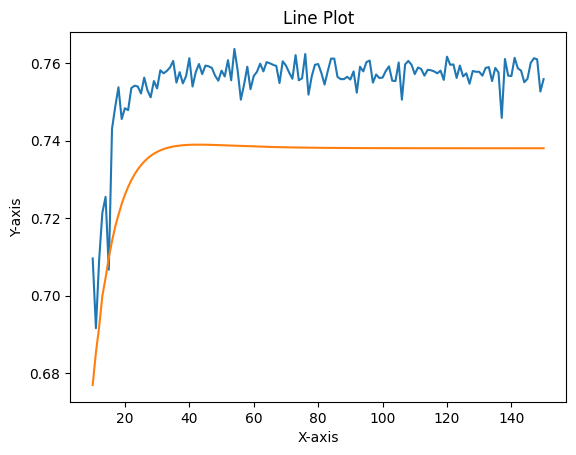

(4, 6)
10
1/1 [==============================] - 0s 28ms/step
11
1/1 [==============================] - 0s 29ms/step
12
1/1 [==============================] - 0s 28ms/step
13
1/1 [==============================] - 0s 32ms/step
14
1/1 [==============================] - 0s 29ms/step
15
1/1 [==============================] - 0s 33ms/step
16
1/1 [==============================] - 0s 40ms/step
17
1/1 [==============================] - 0s 30ms/step
18
1/1 [==============================] - 0s 31ms/step
19
1/1 [==============================] - 0s 27ms/step
20
1/1 [==============================] - 0s 30ms/step
21
1/1 [==============================] - 0s 28ms/step
22
1/1 [==============================] - 0s 30ms/step
23
1/1 [==============================] - 0s 36ms/step
24
1/1 [==============================] - 0s 41ms/step
25
1/1 [==============================] - 0s 31ms/step
26
1/1 [==============================] - 0s 31ms/step
27
1/1 [==============================] - 0s 33ms/step
28


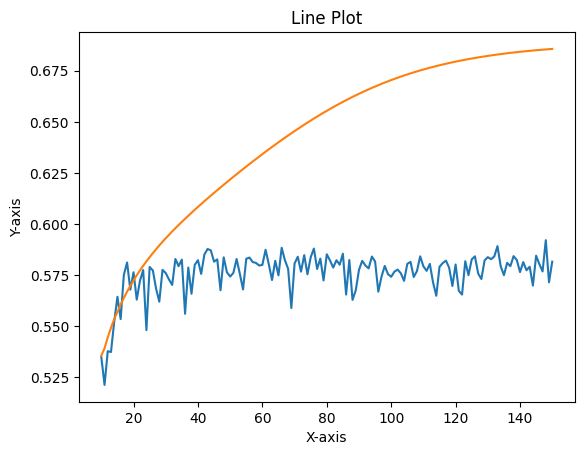

(4, 6)
10
1/1 [==============================] - 0s 60ms/step
11
1/1 [==============================] - 0s 47ms/step
12
1/1 [==============================] - 0s 61ms/step
13
1/1 [==============================] - 0s 47ms/step
14
1/1 [==============================] - 0s 37ms/step
15
1/1 [==============================] - 0s 31ms/step
16
1/1 [==============================] - 0s 56ms/step
17
1/1 [==============================] - 0s 39ms/step
18
1/1 [==============================] - 0s 64ms/step
19
1/1 [==============================] - 0s 63ms/step
20
1/1 [==============================] - 0s 45ms/step
21
1/1 [==============================] - 0s 43ms/step
22
1/1 [==============================] - 0s 36ms/step
23
1/1 [==============================] - 0s 30ms/step
24
1/1 [==============================] - 0s 26ms/step
25
1/1 [==============================] - 0s 28ms/step
26
1/1 [==============================] - 0s 28ms/step
27
1/1 [==============================] - 0s 28ms/step
28


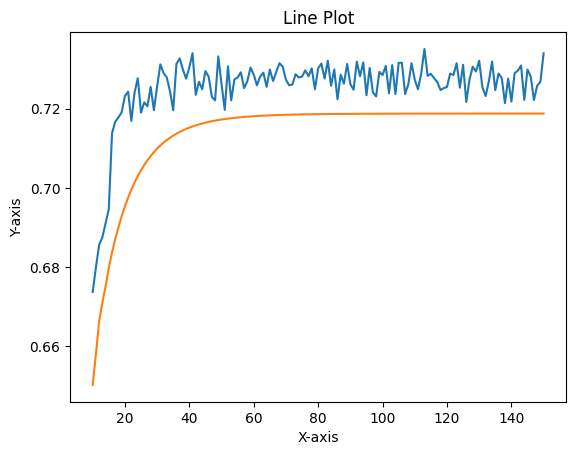

(4, 6)
10
1/1 [==============================] - 0s 61ms/step
11
1/1 [==============================] - 0s 57ms/step
12
1/1 [==============================] - 0s 63ms/step
13
1/1 [==============================] - 0s 49ms/step
14
1/1 [==============================] - 0s 43ms/step
15
1/1 [==============================] - 0s 62ms/step
16
1/1 [==============================] - 0s 55ms/step
17
1/1 [==============================] - 0s 56ms/step
18
1/1 [==============================] - 0s 63ms/step
19
1/1 [==============================] - 0s 64ms/step
20
1/1 [==============================] - 0s 75ms/step
21
1/1 [==============================] - 0s 75ms/step
22
1/1 [==============================] - 0s 74ms/step
23
1/1 [==============================] - 0s 39ms/step
24
1/1 [==============================] - 0s 32ms/step
25
1/1 [==============================] - 0s 49ms/step
26
1/1 [==============================] - 0s 33ms/step
27
1/1 [==============================] - 0s 42ms/step
28


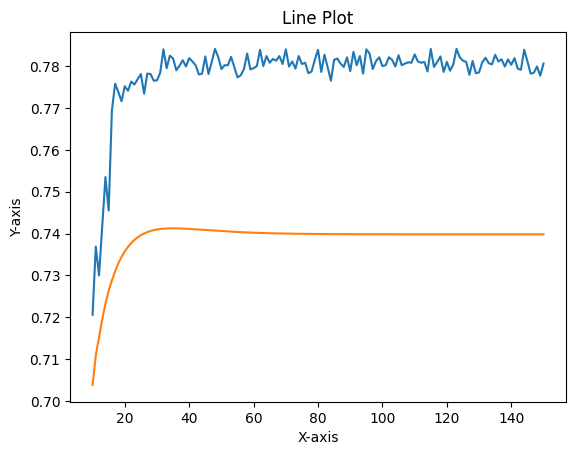

(4, 6)
10
1/1 [==============================] - 0s 51ms/step
11
1/1 [==============================] - 0s 51ms/step
12
1/1 [==============================] - 0s 55ms/step
13
1/1 [==============================] - 0s 34ms/step
14
1/1 [==============================] - 0s 72ms/step
15
1/1 [==============================] - 0s 32ms/step
16
1/1 [==============================] - 0s 57ms/step
17
1/1 [==============================] - 0s 54ms/step
18
1/1 [==============================] - 0s 71ms/step
19
1/1 [==============================] - 0s 53ms/step
20
1/1 [==============================] - 0s 49ms/step
21
1/1 [==============================] - 0s 51ms/step
22
1/1 [==============================] - 0s 32ms/step
23
1/1 [==============================] - 0s 35ms/step
24
1/1 [==============================] - 0s 36ms/step
25
1/1 [==============================] - 0s 32ms/step
26
1/1 [==============================] - 0s 33ms/step
27
1/1 [==============================] - 0s 34ms/step
28


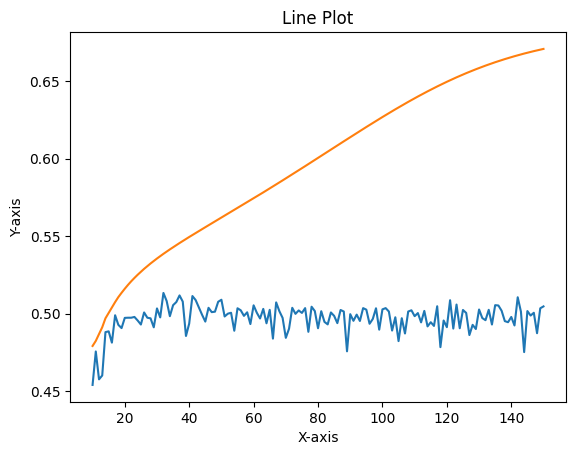

(4, 6)
10
1/1 [==============================] - 0s 33ms/step
11
1/1 [==============================] - 0s 56ms/step
12
1/1 [==============================] - 0s 51ms/step
13
1/1 [==============================] - 0s 43ms/step
14
1/1 [==============================] - 0s 69ms/step
15
1/1 [==============================] - 0s 65ms/step
16
1/1 [==============================] - 0s 55ms/step
17
1/1 [==============================] - 0s 64ms/step
18
1/1 [==============================] - 0s 51ms/step
19
1/1 [==============================] - 0s 62ms/step
20
1/1 [==============================] - 0s 38ms/step
21
1/1 [==============================] - 0s 48ms/step
22
1/1 [==============================] - 0s 38ms/step
23
1/1 [==============================] - 0s 61ms/step
24
1/1 [==============================] - 0s 47ms/step
25
1/1 [==============================] - 0s 66ms/step
26
1/1 [==============================] - 0s 48ms/step
27
1/1 [==============================] - 0s 53ms/step
28


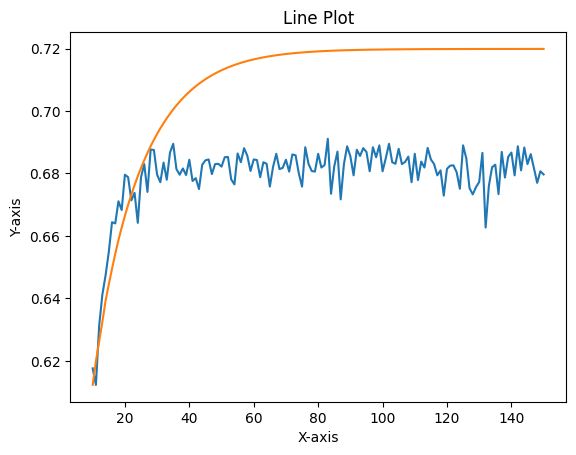

(4, 6)
10
1/1 [==============================] - 0s 66ms/step
11
1/1 [==============================] - 0s 52ms/step
12
1/1 [==============================] - 0s 57ms/step
13
1/1 [==============================] - 0s 55ms/step
14
1/1 [==============================] - 0s 55ms/step
15
1/1 [==============================] - 0s 44ms/step
16
1/1 [==============================] - 0s 40ms/step
17
1/1 [==============================] - 0s 39ms/step
18
1/1 [==============================] - 0s 61ms/step
19
1/1 [==============================] - 0s 46ms/step
20
1/1 [==============================] - 0s 58ms/step
21
1/1 [==============================] - 0s 56ms/step
22
1/1 [==============================] - 0s 48ms/step
23
1/1 [==============================] - 0s 59ms/step
24
1/1 [==============================] - 0s 47ms/step
25
1/1 [==============================] - 0s 38ms/step
26
1/1 [==============================] - 0s 59ms/step
27
1/1 [==============================] - 0s 41ms/step
28


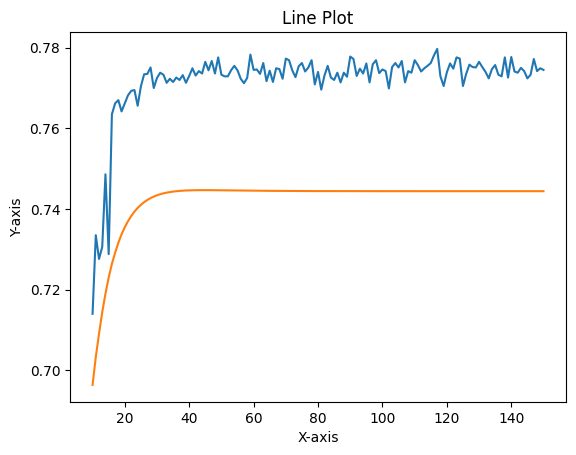

(4, 6)
10
1/1 [==============================] - 0s 30ms/step
11
1/1 [==============================] - 0s 29ms/step
12
1/1 [==============================] - 0s 45ms/step
13
1/1 [==============================] - 0s 29ms/step
14
1/1 [==============================] - 0s 31ms/step
15
1/1 [==============================] - 0s 28ms/step
16
1/1 [==============================] - 0s 41ms/step
17
1/1 [==============================] - 0s 43ms/step
18
1/1 [==============================] - 0s 39ms/step
19
1/1 [==============================] - 0s 41ms/step
20
1/1 [==============================] - 0s 58ms/step
21
1/1 [==============================] - 0s 47ms/step
22
1/1 [==============================] - 0s 44ms/step
23
1/1 [==============================] - 0s 36ms/step
24
1/1 [==============================] - 0s 58ms/step
25
1/1 [==============================] - 0s 37ms/step
26
1/1 [==============================] - 0s 49ms/step
27
1/1 [==============================] - 0s 58ms/step
28


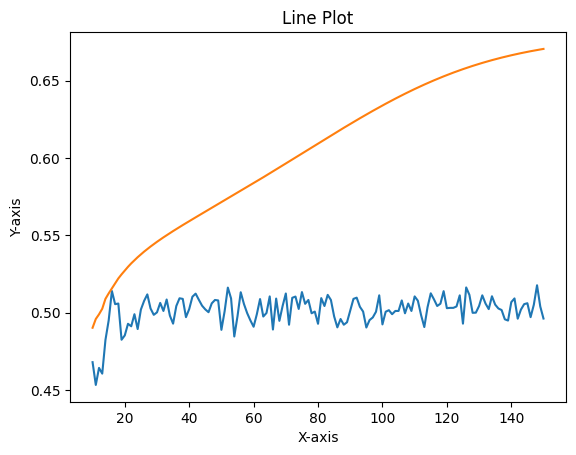

(4, 6)
10
1/1 [==============================] - 0s 29ms/step
11
1/1 [==============================] - 0s 42ms/step
12
1/1 [==============================] - 0s 30ms/step
13
1/1 [==============================] - 0s 28ms/step
14
1/1 [==============================] - 0s 27ms/step
15
1/1 [==============================] - 0s 36ms/step
16
1/1 [==============================] - 0s 29ms/step
17
1/1 [==============================] - 0s 28ms/step
18
1/1 [==============================] - 0s 43ms/step
19
1/1 [==============================] - 0s 38ms/step
20
1/1 [==============================] - 0s 28ms/step
21
1/1 [==============================] - 0s 28ms/step
22
1/1 [==============================] - 0s 28ms/step
23
1/1 [==============================] - 0s 27ms/step
24
1/1 [==============================] - 0s 34ms/step
25
1/1 [==============================] - 0s 36ms/step
26
1/1 [==============================] - 0s 29ms/step
27
1/1 [==============================] - 0s 27ms/step
28


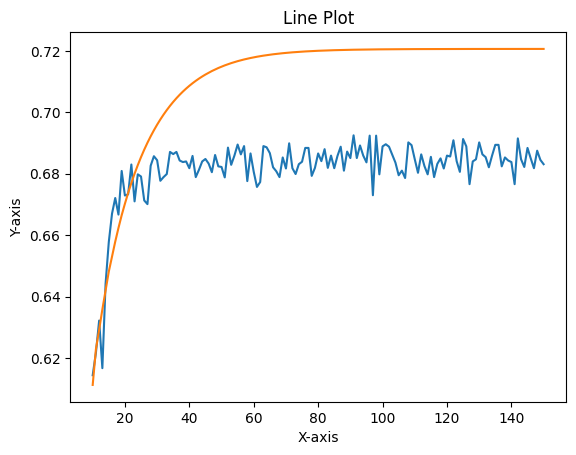

(4, 6)
10
1/1 [==============================] - 0s 29ms/step
11
1/1 [==============================] - 0s 31ms/step
12
1/1 [==============================] - 0s 30ms/step
13
1/1 [==============================] - 0s 26ms/step
14
1/1 [==============================] - 0s 27ms/step
15
1/1 [==============================] - 0s 28ms/step
16
1/1 [==============================] - 0s 31ms/step
17
1/1 [==============================] - 0s 38ms/step
18
1/1 [==============================] - 0s 30ms/step
19
1/1 [==============================] - 0s 26ms/step
20
1/1 [==============================] - 0s 29ms/step
21
1/1 [==============================] - 0s 29ms/step
22
1/1 [==============================] - 0s 26ms/step
23
1/1 [==============================] - 0s 32ms/step
24
1/1 [==============================] - 0s 29ms/step
25
1/1 [==============================] - 0s 28ms/step
26
1/1 [==============================] - 0s 33ms/step
27
1/1 [==============================] - 0s 32ms/step
28


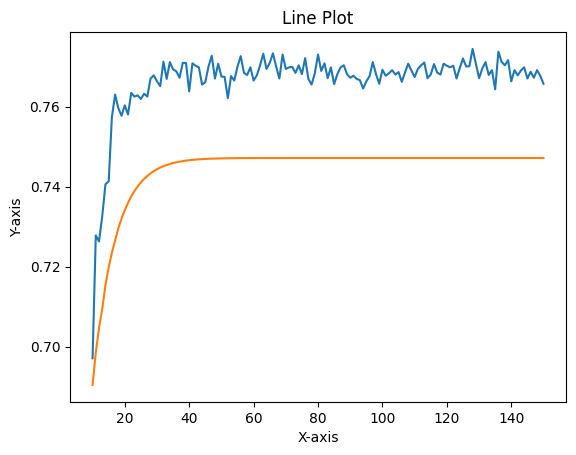

(4, 6)
10
1/1 [==============================] - 0s 30ms/step
11
1/1 [==============================] - 0s 27ms/step
12
1/1 [==============================] - 0s 44ms/step
13
1/1 [==============================] - 0s 36ms/step
14
1/1 [==============================] - 0s 31ms/step
15
1/1 [==============================] - 0s 28ms/step
16
1/1 [==============================] - 0s 30ms/step
17
1/1 [==============================] - 0s 34ms/step
18
1/1 [==============================] - 0s 32ms/step
19
1/1 [==============================] - 0s 57ms/step
20
1/1 [==============================] - 0s 31ms/step
21
1/1 [==============================] - 0s 32ms/step
22
1/1 [==============================] - 0s 31ms/step
23
1/1 [==============================] - 0s 33ms/step
24
1/1 [==============================] - 0s 38ms/step
25
1/1 [==============================] - 0s 31ms/step
26
1/1 [==============================] - 0s 29ms/step
27
1/1 [==============================] - 0s 30ms/step
28


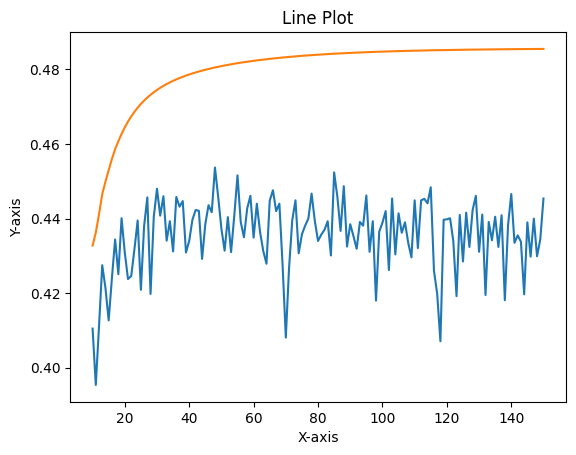

(4, 6)
10
1/1 [==============================] - 0s 37ms/step
11
1/1 [==============================] - 0s 32ms/step
12
1/1 [==============================] - 0s 30ms/step
13
1/1 [==============================] - 0s 27ms/step
14
1/1 [==============================] - 0s 38ms/step
15
1/1 [==============================] - 0s 30ms/step
16
1/1 [==============================] - 0s 29ms/step
17
1/1 [==============================] - 0s 27ms/step
18
1/1 [==============================] - 0s 37ms/step
19
1/1 [==============================] - 0s 34ms/step
20
1/1 [==============================] - 0s 30ms/step
21
1/1 [==============================] - 0s 38ms/step
22
1/1 [==============================] - 0s 29ms/step
23
1/1 [==============================] - 0s 41ms/step
24
1/1 [==============================] - 0s 27ms/step
25
1/1 [==============================] - 0s 31ms/step
26
1/1 [==============================] - 0s 29ms/step
27
1/1 [==============================] - 0s 28ms/step
28


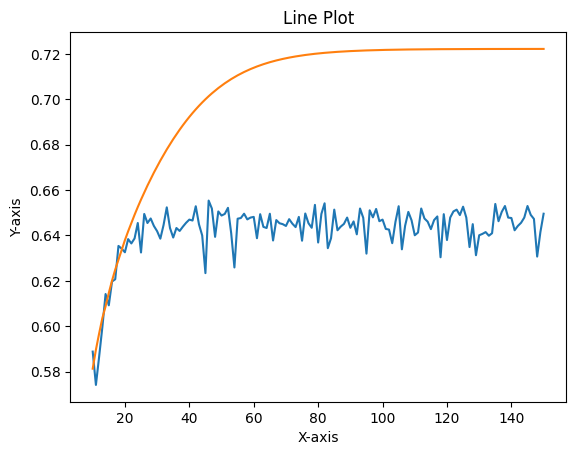

(4, 6)
10
1/1 [==============================] - 0s 31ms/step
11
1/1 [==============================] - 0s 32ms/step
12
1/1 [==============================] - 0s 45ms/step
13
1/1 [==============================] - 0s 30ms/step
14
1/1 [==============================] - 0s 28ms/step
15
1/1 [==============================] - 0s 29ms/step
16
1/1 [==============================] - 0s 33ms/step
17
1/1 [==============================] - 0s 29ms/step
18
1/1 [==============================] - 0s 30ms/step
19
1/1 [==============================] - 0s 35ms/step
20
1/1 [==============================] - 0s 31ms/step
21
1/1 [==============================] - 0s 27ms/step
22
1/1 [==============================] - 0s 29ms/step
23
1/1 [==============================] - 0s 29ms/step
24
1/1 [==============================] - 0s 29ms/step
25
1/1 [==============================] - 0s 28ms/step
26
1/1 [==============================] - 0s 30ms/step
27
1/1 [==============================] - 0s 38ms/step
28


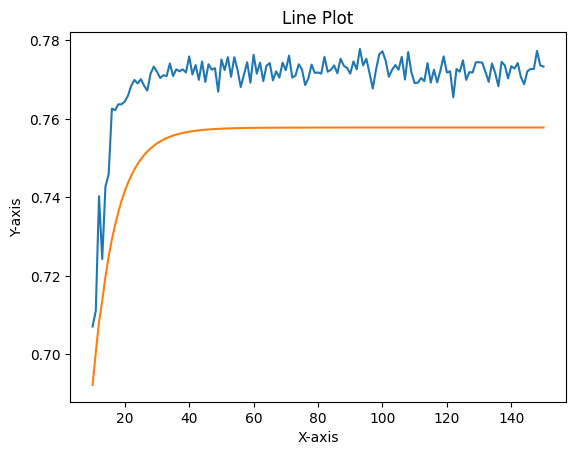

(4, 6)
10
1/1 [==============================] - 0s 32ms/step
11
1/1 [==============================] - 0s 37ms/step
12
1/1 [==============================] - 0s 29ms/step
13
1/1 [==============================] - 0s 31ms/step
14
1/1 [==============================] - 0s 31ms/step
15
1/1 [==============================] - 0s 29ms/step
16
1/1 [==============================] - 0s 29ms/step
17
1/1 [==============================] - 0s 28ms/step
18
1/1 [==============================] - 0s 29ms/step
19
1/1 [==============================] - 0s 29ms/step
20
1/1 [==============================] - 0s 32ms/step
21
1/1 [==============================] - 0s 32ms/step
22
1/1 [==============================] - 0s 34ms/step
23
1/1 [==============================] - 0s 54ms/step
24
1/1 [==============================] - 0s 42ms/step
25
1/1 [==============================] - 0s 37ms/step
26
1/1 [==============================] - 0s 38ms/step
27
1/1 [==============================] - 0s 41ms/step
28


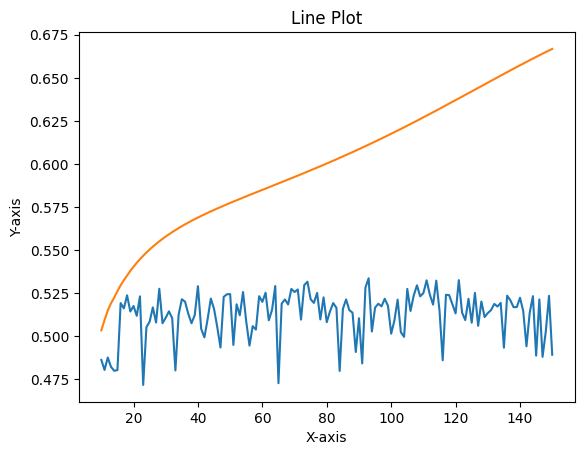

(4, 6)
10
1/1 [==============================] - 0s 34ms/step
11
1/1 [==============================] - 0s 31ms/step
12
1/1 [==============================] - 0s 30ms/step
13
1/1 [==============================] - 0s 32ms/step
14
1/1 [==============================] - 0s 39ms/step
15
1/1 [==============================] - 0s 33ms/step
16
1/1 [==============================] - 0s 31ms/step
17
1/1 [==============================] - 0s 30ms/step
18
1/1 [==============================] - 0s 41ms/step
19
1/1 [==============================] - 0s 31ms/step
20
1/1 [==============================] - 0s 33ms/step
21
1/1 [==============================] - 0s 32ms/step
22
1/1 [==============================] - 0s 40ms/step
23
1/1 [==============================] - 0s 40ms/step
24
1/1 [==============================] - 0s 35ms/step
25
1/1 [==============================] - 0s 31ms/step
26
1/1 [==============================] - 0s 30ms/step
27
1/1 [==============================] - 0s 33ms/step
28


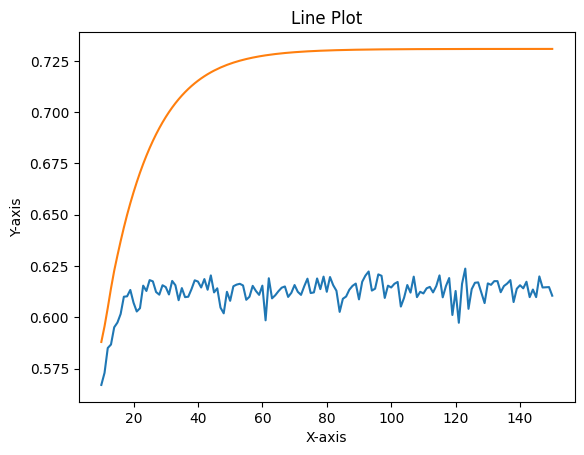

(4, 6)
10
1/1 [==============================] - 0s 30ms/step
11
1/1 [==============================] - 0s 28ms/step
12
1/1 [==============================] - 0s 34ms/step
13
1/1 [==============================] - 0s 30ms/step
14
1/1 [==============================] - 0s 31ms/step
15
1/1 [==============================] - 0s 29ms/step
16
1/1 [==============================] - 0s 25ms/step
17
1/1 [==============================] - 0s 29ms/step
18
1/1 [==============================] - 0s 30ms/step
19
1/1 [==============================] - 0s 29ms/step
20
1/1 [==============================] - 0s 27ms/step
21
1/1 [==============================] - 0s 38ms/step
22
1/1 [==============================] - 0s 29ms/step
23
1/1 [==============================] - 0s 33ms/step
24
1/1 [==============================] - 0s 28ms/step
25
1/1 [==============================] - 0s 28ms/step
26
1/1 [==============================] - 0s 30ms/step
27
1/1 [==============================] - 0s 27ms/step
28


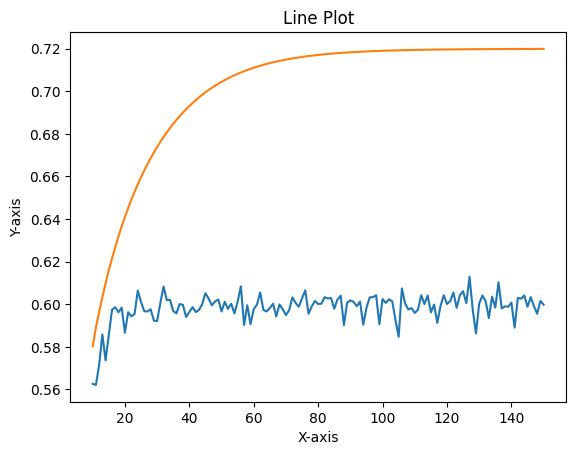

(4, 6)
10
1/1 [==============================] - 0s 43ms/step
11
1/1 [==============================] - 0s 50ms/step
12
1/1 [==============================] - 0s 46ms/step
13
1/1 [==============================] - 0s 38ms/step
14
1/1 [==============================] - 0s 29ms/step
15
1/1 [==============================] - 0s 32ms/step
16
1/1 [==============================] - 0s 38ms/step
17
1/1 [==============================] - 0s 32ms/step
18
1/1 [==============================] - 0s 26ms/step
19
1/1 [==============================] - 0s 27ms/step
20
1/1 [==============================] - 0s 31ms/step
21
1/1 [==============================] - 0s 27ms/step
22
1/1 [==============================] - 0s 26ms/step
23
1/1 [==============================] - 0s 41ms/step
24
1/1 [==============================] - 0s 31ms/step
25
1/1 [==============================] - 0s 29ms/step
26
1/1 [==============================] - 0s 35ms/step
27
1/1 [==============================] - 0s 28ms/step
28


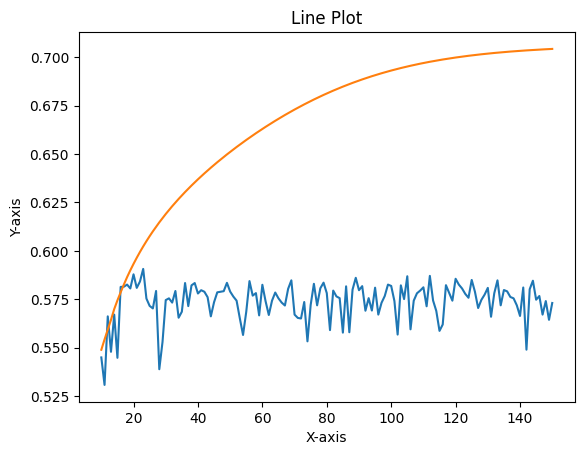

(4, 6)
20
1/1 [==============================] - 0s 40ms/step
21
1/1 [==============================] - 0s 47ms/step
22
1/1 [==============================] - 0s 56ms/step
23
1/1 [==============================] - 0s 56ms/step
24
1/1 [==============================] - 0s 65ms/step
25
1/1 [==============================] - 0s 60ms/step
26
1/1 [==============================] - 0s 35ms/step
27
1/1 [==============================] - 0s 61ms/step
28
1/1 [==============================] - 0s 41ms/step
29
1/1 [==============================] - 0s 36ms/step
30
1/1 [==============================] - 0s 35ms/step
31
1/1 [==============================] - 0s 47ms/step
32
1/1 [==============================] - 0s 41ms/step
33
1/1 [==============================] - 0s 44ms/step
34
1/1 [==============================] - 0s 53ms/step
35
1/1 [==============================] - 0s 46ms/step
36
1/1 [==============================] - 0s 31ms/step
37
1/1 [==============================] - 0s 31ms/step
38


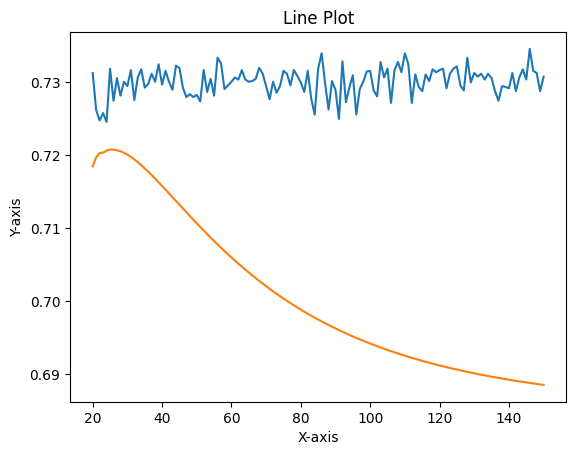

(4, 6)
20
1/1 [==============================] - 0s 38ms/step
21
1/1 [==============================] - 0s 47ms/step
22
1/1 [==============================] - 0s 35ms/step
23
1/1 [==============================] - 0s 60ms/step
24
1/1 [==============================] - 0s 31ms/step
25
1/1 [==============================] - 0s 68ms/step
26
1/1 [==============================] - 0s 49ms/step
27
1/1 [==============================] - 0s 33ms/step
28
1/1 [==============================] - 0s 37ms/step
29
1/1 [==============================] - 0s 59ms/step
30
1/1 [==============================] - 0s 46ms/step
31
1/1 [==============================] - 0s 43ms/step
32
1/1 [==============================] - 0s 47ms/step
33
1/1 [==============================] - 0s 65ms/step
34
1/1 [==============================] - 0s 57ms/step
35
1/1 [==============================] - 0s 54ms/step
36
1/1 [==============================] - 0s 62ms/step
37
1/1 [==============================] - 0s 43ms/step
38


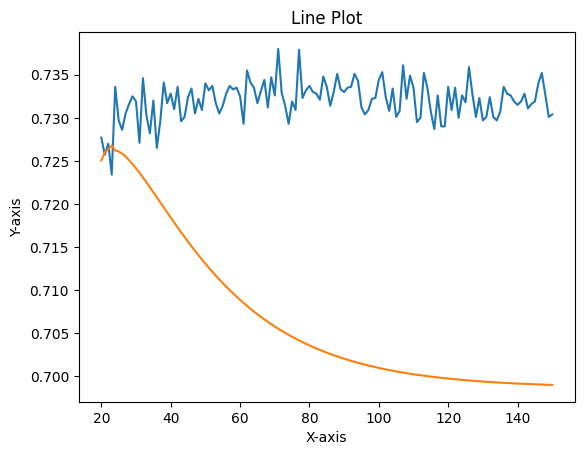

(4, 6)
20
1/1 [==============================] - 0s 29ms/step
21
1/1 [==============================] - 0s 29ms/step
22
1/1 [==============================] - 0s 43ms/step
23
1/1 [==============================] - 0s 31ms/step
24
1/1 [==============================] - 0s 43ms/step
25
1/1 [==============================] - 0s 28ms/step
26
1/1 [==============================] - 0s 30ms/step
27
1/1 [==============================] - 0s 29ms/step
28
1/1 [==============================] - 0s 31ms/step
29
1/1 [==============================] - 0s 28ms/step
30
1/1 [==============================] - 0s 28ms/step
31
1/1 [==============================] - 0s 56ms/step
32
1/1 [==============================] - 0s 30ms/step
33
1/1 [==============================] - 0s 37ms/step
34
1/1 [==============================] - 0s 27ms/step
35
1/1 [==============================] - 0s 28ms/step
36
1/1 [==============================] - 0s 28ms/step
37
1/1 [==============================] - 0s 31ms/step
38


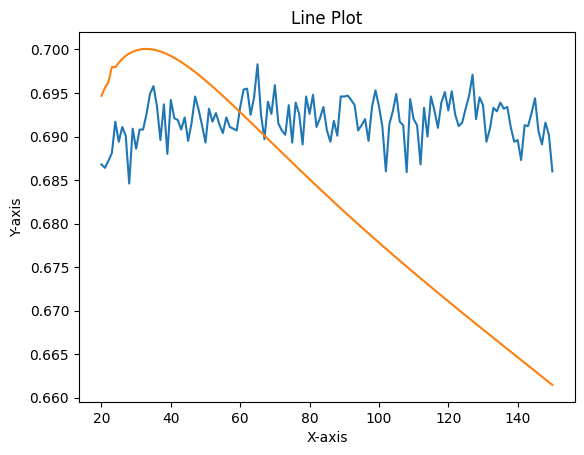

(4, 6)
20
1/1 [==============================] - 0s 31ms/step
21
1/1 [==============================] - 0s 43ms/step
22
1/1 [==============================] - 0s 30ms/step
23
1/1 [==============================] - 0s 27ms/step
24
1/1 [==============================] - 0s 28ms/step
25
1/1 [==============================] - 0s 27ms/step
26
1/1 [==============================] - 0s 29ms/step
27
1/1 [==============================] - 0s 27ms/step
28
1/1 [==============================] - 0s 34ms/step
29
1/1 [==============================] - 0s 30ms/step
30
1/1 [==============================] - 0s 64ms/step
31
1/1 [==============================] - 0s 32ms/step
32
1/1 [==============================] - 0s 41ms/step
33
1/1 [==============================] - 0s 28ms/step
34
1/1 [==============================] - 0s 28ms/step
35
1/1 [==============================] - 0s 29ms/step
36
1/1 [==============================] - 0s 31ms/step
37
1/1 [==============================] - 0s 30ms/step
38


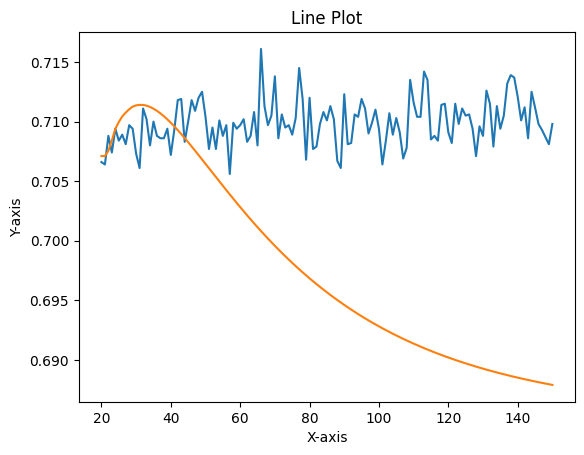

(4, 6)
20
1/1 [==============================] - 0s 32ms/step
21
1/1 [==============================] - 0s 35ms/step
22
1/1 [==============================] - 0s 29ms/step
23
1/1 [==============================] - 0s 27ms/step
24
1/1 [==============================] - 0s 31ms/step
25
1/1 [==============================] - 0s 30ms/step
26
1/1 [==============================] - 0s 29ms/step
27
1/1 [==============================] - 0s 29ms/step
28
1/1 [==============================] - 0s 30ms/step
29
1/1 [==============================] - 0s 31ms/step
30
1/1 [==============================] - 0s 42ms/step
31
1/1 [==============================] - 0s 28ms/step
32
1/1 [==============================] - 0s 30ms/step
33
1/1 [==============================] - 0s 30ms/step
34
1/1 [==============================] - 0s 30ms/step
35
1/1 [==============================] - 0s 29ms/step
36
1/1 [==============================] - 0s 38ms/step
37
1/1 [==============================] - 0s 28ms/step
38


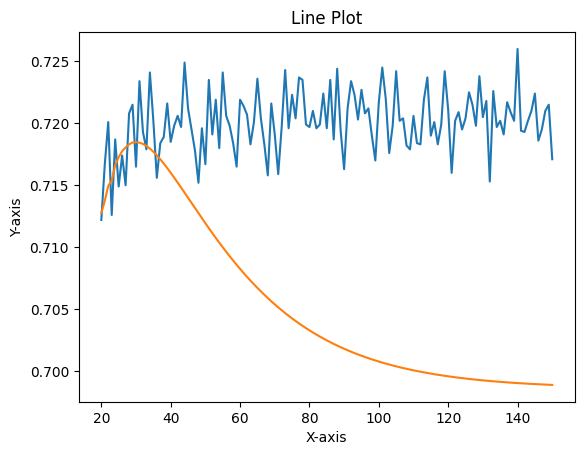

(4, 6)
20
1/1 [==============================] - 0s 27ms/step
21
1/1 [==============================] - 0s 26ms/step
22
1/1 [==============================] - 0s 26ms/step
23
1/1 [==============================] - 0s 58ms/step
24
1/1 [==============================] - 0s 30ms/step
25
1/1 [==============================] - 0s 29ms/step
26
1/1 [==============================] - 0s 29ms/step
27
1/1 [==============================] - 0s 28ms/step
28
1/1 [==============================] - 0s 27ms/step
29
1/1 [==============================] - 0s 29ms/step
30
1/1 [==============================] - 0s 28ms/step
31
1/1 [==============================] - 0s 41ms/step
32
1/1 [==============================] - 0s 26ms/step
33
1/1 [==============================] - 0s 29ms/step
34
1/1 [==============================] - 0s 29ms/step
35
1/1 [==============================] - 0s 29ms/step
36
1/1 [==============================] - 0s 29ms/step
37
1/1 [==============================] - 0s 32ms/step
38


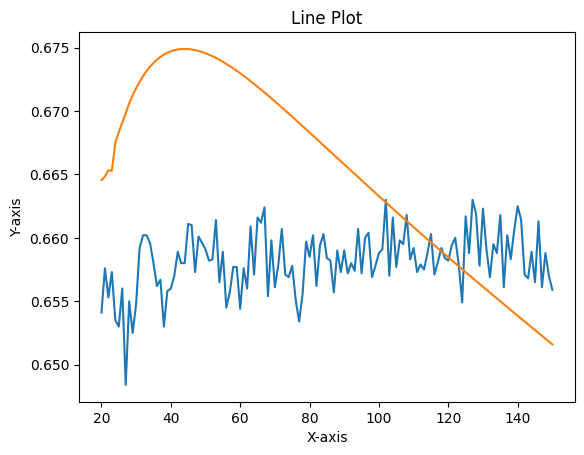

(4, 6)
20
1/1 [==============================] - 0s 47ms/step
21
1/1 [==============================] - 0s 50ms/step
22
1/1 [==============================] - 0s 62ms/step
23
1/1 [==============================] - 0s 70ms/step
24
1/1 [==============================] - 0s 48ms/step
25
1/1 [==============================] - 0s 51ms/step
26
1/1 [==============================] - 0s 64ms/step
27
1/1 [==============================] - 0s 46ms/step
28
1/1 [==============================] - 0s 59ms/step
29
1/1 [==============================] - 0s 40ms/step
30
1/1 [==============================] - 0s 48ms/step
31
1/1 [==============================] - 0s 30ms/step
32
1/1 [==============================] - 0s 27ms/step
33
1/1 [==============================] - 0s 31ms/step
34
1/1 [==============================] - 0s 27ms/step
35
1/1 [==============================] - 0s 26ms/step
36
1/1 [==============================] - 0s 28ms/step
37
1/1 [==============================] - 0s 30ms/step
38


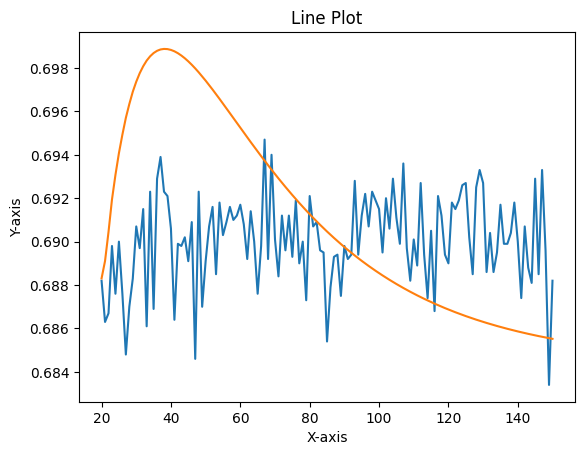

(4, 6)
20
1/1 [==============================] - 0s 60ms/step
21
1/1 [==============================] - 0s 67ms/step
22
1/1 [==============================] - 0s 68ms/step
23
1/1 [==============================] - 0s 57ms/step
24
1/1 [==============================] - 0s 77ms/step
25
1/1 [==============================] - 0s 55ms/step
26
1/1 [==============================] - 0s 42ms/step
27
1/1 [==============================] - 0s 61ms/step
28
1/1 [==============================] - 0s 36ms/step
29
1/1 [==============================] - 0s 48ms/step
30
1/1 [==============================] - 0s 72ms/step
31
1/1 [==============================] - 0s 38ms/step
32
1/1 [==============================] - 0s 48ms/step
33
1/1 [==============================] - 0s 43ms/step
34
1/1 [==============================] - 0s 82ms/step
35
1/1 [==============================] - 0s 75ms/step
36
1/1 [==============================] - 0s 74ms/step
37
1/1 [==============================] - 0s 36ms/step
38


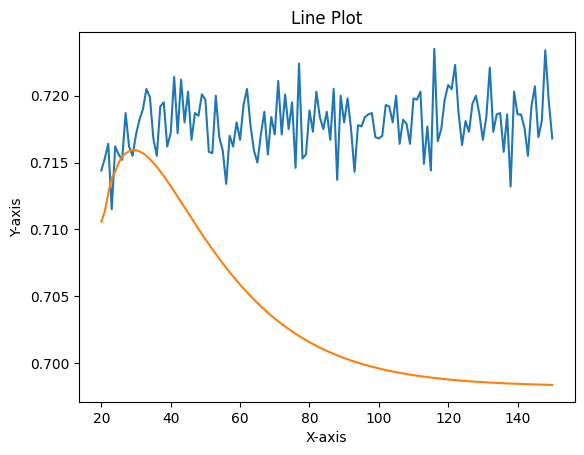

(4, 6)
20
1/1 [==============================] - 0s 43ms/step
21
1/1 [==============================] - 0s 56ms/step
22
1/1 [==============================] - 0s 41ms/step
23
1/1 [==============================] - 0s 45ms/step
24
1/1 [==============================] - 0s 56ms/step
25
1/1 [==============================] - 0s 46ms/step
26
1/1 [==============================] - 0s 38ms/step
27
1/1 [==============================] - 0s 38ms/step
28
1/1 [==============================] - 0s 42ms/step
29
1/1 [==============================] - 0s 48ms/step
30
1/1 [==============================] - 0s 59ms/step
31
1/1 [==============================] - 0s 47ms/step
32
1/1 [==============================] - 0s 41ms/step
33
1/1 [==============================] - 0s 45ms/step
34
1/1 [==============================] - 0s 64ms/step
35
1/1 [==============================] - 0s 50ms/step
36
1/1 [==============================] - 0s 44ms/step
37
1/1 [==============================] - 0s 40ms/step
38


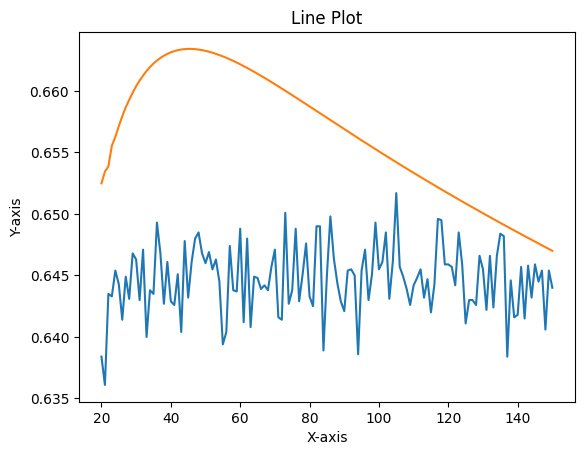

(4, 6)
20
1/1 [==============================] - 0s 28ms/step
21
1/1 [==============================] - 0s 27ms/step
22
1/1 [==============================] - 0s 32ms/step
23
1/1 [==============================] - 0s 30ms/step
24
1/1 [==============================] - 0s 30ms/step
25
1/1 [==============================] - 0s 34ms/step
26
1/1 [==============================] - 0s 38ms/step
27
1/1 [==============================] - 0s 36ms/step
28
1/1 [==============================] - 0s 31ms/step
29
1/1 [==============================] - 0s 28ms/step
30
1/1 [==============================] - 0s 46ms/step
31
1/1 [==============================] - 0s 45ms/step
32
1/1 [==============================] - 0s 44ms/step
33
1/1 [==============================] - 0s 39ms/step
34
1/1 [==============================] - 0s 45ms/step
35
1/1 [==============================] - 0s 57ms/step
36
1/1 [==============================] - 0s 60ms/step
37
1/1 [==============================] - 0s 50ms/step
38


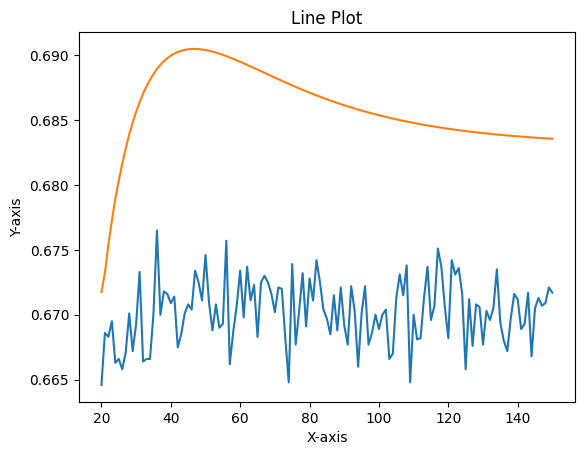

(4, 6)
20
1/1 [==============================] - 0s 29ms/step
21
1/1 [==============================] - 0s 28ms/step
22
1/1 [==============================] - 0s 29ms/step
23
1/1 [==============================] - 0s 27ms/step
24
1/1 [==============================] - 0s 28ms/step
25
1/1 [==============================] - 0s 25ms/step
26
1/1 [==============================] - 0s 28ms/step
27
1/1 [==============================] - 0s 38ms/step
28
1/1 [==============================] - 0s 30ms/step
29
1/1 [==============================] - 0s 29ms/step
30
1/1 [==============================] - 0s 34ms/step
31
1/1 [==============================] - 0s 29ms/step
32
1/1 [==============================] - 0s 29ms/step
33
1/1 [==============================] - 0s 29ms/step
34
1/1 [==============================] - 0s 28ms/step
35
1/1 [==============================] - 0s 28ms/step
36
1/1 [==============================] - 0s 60ms/step
37
1/1 [==============================] - 0s 29ms/step
38


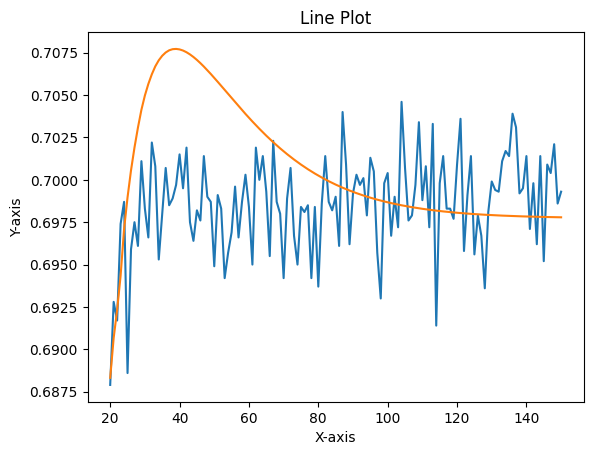

(4, 6)
20
1/1 [==============================] - 0s 32ms/step
21
1/1 [==============================] - 0s 27ms/step
22
1/1 [==============================] - 0s 38ms/step
23
1/1 [==============================] - 0s 44ms/step
24
1/1 [==============================] - 0s 27ms/step
25
1/1 [==============================] - 0s 31ms/step
26
1/1 [==============================] - 0s 34ms/step
27
1/1 [==============================] - 0s 27ms/step
28
1/1 [==============================] - 0s 29ms/step
29
1/1 [==============================] - 0s 26ms/step
30
1/1 [==============================] - 0s 27ms/step
31
1/1 [==============================] - 0s 30ms/step
32
1/1 [==============================] - 0s 26ms/step
33
1/1 [==============================] - 0s 27ms/step
34
1/1 [==============================] - 0s 50ms/step
35
1/1 [==============================] - 0s 29ms/step
36
1/1 [==============================] - 0s 27ms/step
37
1/1 [==============================] - 0s 30ms/step
38


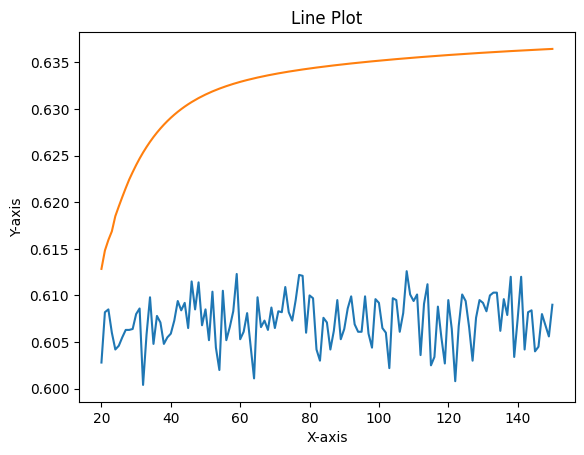

(4, 6)
20
1/1 [==============================] - 0s 29ms/step
21
1/1 [==============================] - 0s 31ms/step
22
1/1 [==============================] - 0s 64ms/step
23
1/1 [==============================] - 0s 33ms/step
24
1/1 [==============================] - 0s 27ms/step
25
1/1 [==============================] - 0s 29ms/step
26
1/1 [==============================] - 0s 31ms/step
27
1/1 [==============================] - 0s 30ms/step
28
1/1 [==============================] - 0s 29ms/step
29
1/1 [==============================] - 0s 41ms/step
30
1/1 [==============================] - 0s 31ms/step
31
1/1 [==============================] - 0s 31ms/step
32
1/1 [==============================] - 0s 29ms/step
33
1/1 [==============================] - 0s 30ms/step
34
1/1 [==============================] - 0s 30ms/step
35
1/1 [==============================] - 0s 29ms/step
36
1/1 [==============================] - 0s 30ms/step
37
1/1 [==============================] - 0s 30ms/step
38


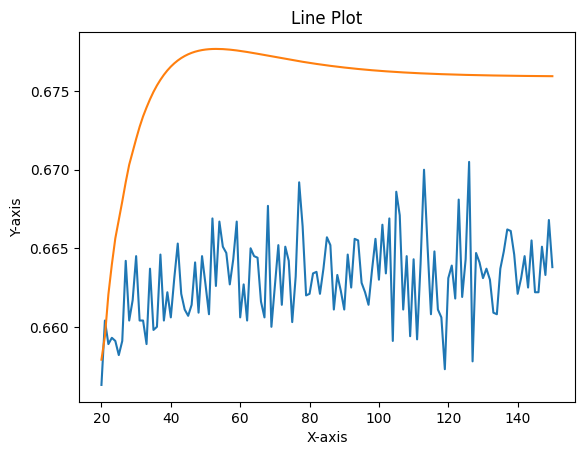

(4, 6)
20
1/1 [==============================] - 0s 37ms/step
21
1/1 [==============================] - 0s 46ms/step
22
1/1 [==============================] - 0s 31ms/step
23
1/1 [==============================] - 0s 30ms/step
24
1/1 [==============================] - 0s 41ms/step
25
1/1 [==============================] - 0s 54ms/step
26
1/1 [==============================] - 0s 32ms/step
27
1/1 [==============================] - 0s 32ms/step
28
1/1 [==============================] - 0s 31ms/step
29
1/1 [==============================] - 0s 33ms/step
30
1/1 [==============================] - 0s 52ms/step
31
1/1 [==============================] - 0s 27ms/step
32
1/1 [==============================] - 0s 27ms/step
33
1/1 [==============================] - 0s 29ms/step
34
1/1 [==============================] - 0s 30ms/step
35
1/1 [==============================] - 0s 30ms/step
36
1/1 [==============================] - 0s 28ms/step
37
1/1 [==============================] - 0s 27ms/step
38


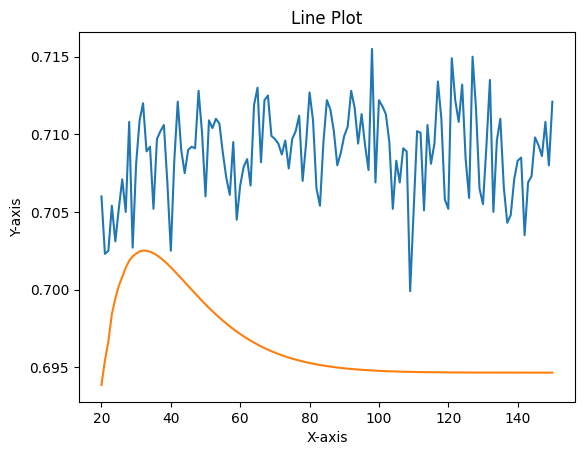

(4, 6)
20
1/1 [==============================] - 0s 52ms/step
21
1/1 [==============================] - 0s 64ms/step
22
1/1 [==============================] - 0s 61ms/step
23
1/1 [==============================] - 0s 35ms/step
24
1/1 [==============================] - 0s 56ms/step
25
1/1 [==============================] - 0s 59ms/step
26
1/1 [==============================] - 0s 61ms/step
27
1/1 [==============================] - 0s 53ms/step
28
1/1 [==============================] - 0s 52ms/step
29
1/1 [==============================] - 0s 53ms/step
30
1/1 [==============================] - 0s 35ms/step
31
1/1 [==============================] - 0s 33ms/step
32
1/1 [==============================] - 0s 38ms/step
33
1/1 [==============================] - 0s 36ms/step
34
1/1 [==============================] - 0s 64ms/step
35
1/1 [==============================] - 0s 45ms/step
36
1/1 [==============================] - 0s 35ms/step
37
1/1 [==============================] - 0s 54ms/step
38


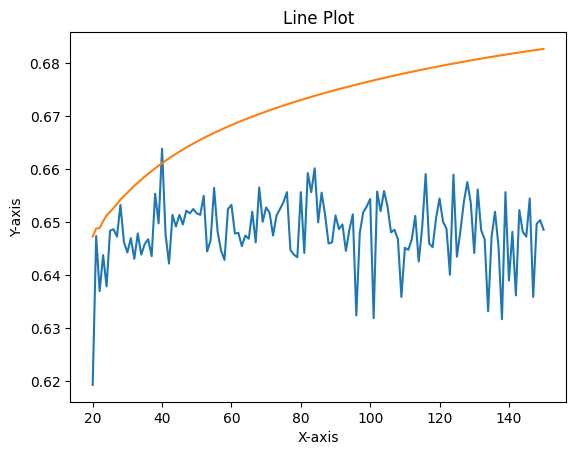

(4, 6)
20
1/1 [==============================] - 0s 32ms/step
21
1/1 [==============================] - 0s 26ms/step
22
1/1 [==============================] - 0s 26ms/step
23
1/1 [==============================] - 0s 28ms/step
24
1/1 [==============================] - 0s 29ms/step
25
1/1 [==============================] - 0s 29ms/step
26
1/1 [==============================] - 0s 31ms/step
27
1/1 [==============================] - 0s 31ms/step
28
1/1 [==============================] - 0s 40ms/step
29
1/1 [==============================] - 0s 38ms/step
30
1/1 [==============================] - 0s 55ms/step
31
1/1 [==============================] - 0s 47ms/step
32
1/1 [==============================] - 0s 58ms/step
33
1/1 [==============================] - 0s 45ms/step
34
1/1 [==============================] - 0s 59ms/step
35
1/1 [==============================] - 0s 64ms/step
36
1/1 [==============================] - 0s 61ms/step
37
1/1 [==============================] - 0s 62ms/step
38


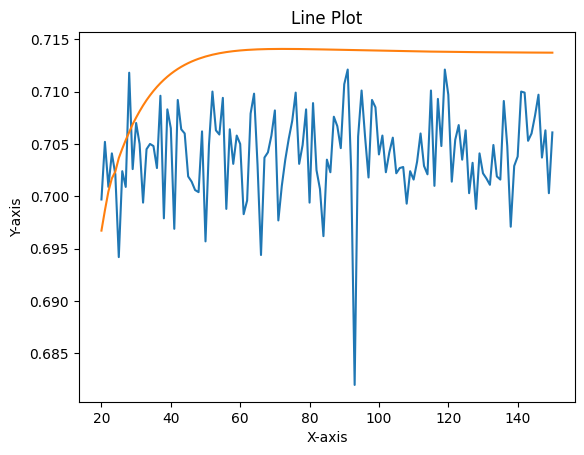

(4, 6)
20
1/1 [==============================] - 0s 28ms/step
21
1/1 [==============================] - 0s 27ms/step
22
1/1 [==============================] - 0s 29ms/step
23
1/1 [==============================] - 0s 29ms/step
24
1/1 [==============================] - 0s 32ms/step
25
1/1 [==============================] - 0s 29ms/step
26
1/1 [==============================] - 0s 31ms/step
27
1/1 [==============================] - 0s 30ms/step
28
1/1 [==============================] - 0s 37ms/step
29
1/1 [==============================] - 0s 30ms/step
30
1/1 [==============================] - 0s 29ms/step
31
1/1 [==============================] - 0s 30ms/step
32
1/1 [==============================] - 0s 28ms/step
33
1/1 [==============================] - 0s 29ms/step
34
1/1 [==============================] - 0s 31ms/step
35
1/1 [==============================] - 0s 29ms/step
36
1/1 [==============================] - 0s 27ms/step
37
1/1 [==============================] - 0s 29ms/step
38


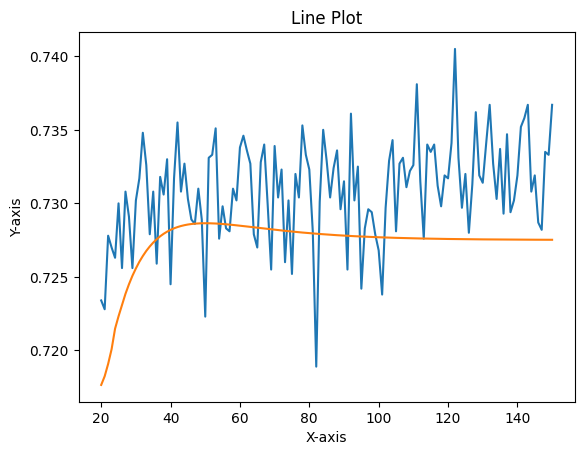

(4, 6)
20
1/1 [==============================] - 0s 29ms/step
21
1/1 [==============================] - 0s 29ms/step
22
1/1 [==============================] - 0s 32ms/step
23
1/1 [==============================] - 0s 31ms/step
24
1/1 [==============================] - 0s 29ms/step
25
1/1 [==============================] - 0s 29ms/step
26
1/1 [==============================] - 0s 31ms/step
27
1/1 [==============================] - 0s 34ms/step
28
1/1 [==============================] - 0s 30ms/step
29
1/1 [==============================] - 0s 61ms/step
30
1/1 [==============================] - 0s 31ms/step
31
1/1 [==============================] - 0s 28ms/step
32
1/1 [==============================] - 0s 27ms/step
33
1/1 [==============================] - 0s 31ms/step
34
1/1 [==============================] - 0s 28ms/step
35
1/1 [==============================] - 0s 30ms/step
36
1/1 [==============================] - 0s 27ms/step
37
1/1 [==============================] - 0s 29ms/step
38


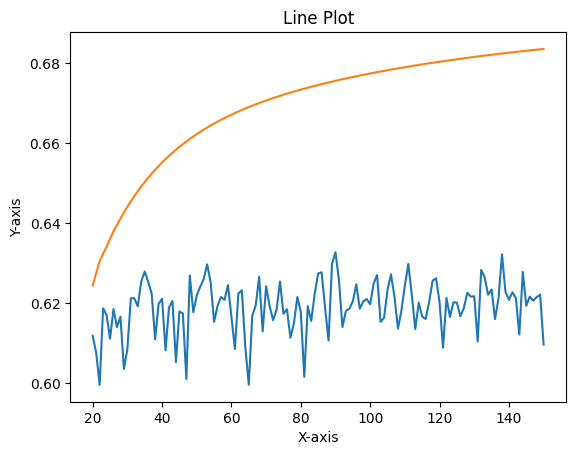

(4, 6)
20
1/1 [==============================] - 0s 37ms/step
21
1/1 [==============================] - 0s 36ms/step
22
1/1 [==============================] - 0s 35ms/step
23
1/1 [==============================] - 0s 37ms/step
24
1/1 [==============================] - 0s 36ms/step
25
1/1 [==============================] - 0s 35ms/step
26
1/1 [==============================] - 0s 55ms/step
27
1/1 [==============================] - 0s 35ms/step
28
1/1 [==============================] - 0s 35ms/step
29
1/1 [==============================] - 0s 41ms/step
30
1/1 [==============================] - 0s 38ms/step
31
1/1 [==============================] - 0s 35ms/step
32
1/1 [==============================] - 0s 38ms/step
33
1/1 [==============================] - 0s 36ms/step
34
1/1 [==============================] - 0s 48ms/step
35
1/1 [==============================] - 0s 34ms/step
36
1/1 [==============================] - 0s 35ms/step
37
1/1 [==============================] - 0s 34ms/step
38


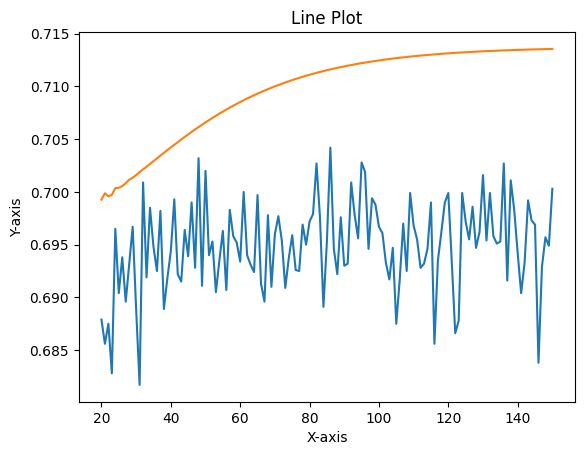

(4, 6)
20
1/1 [==============================] - 0s 29ms/step
21
1/1 [==============================] - 0s 32ms/step
22
1/1 [==============================] - 0s 31ms/step
23
1/1 [==============================] - 0s 30ms/step
24
1/1 [==============================] - 0s 32ms/step
25
1/1 [==============================] - 0s 33ms/step
26
1/1 [==============================] - 0s 29ms/step
27
1/1 [==============================] - 0s 31ms/step
28
1/1 [==============================] - 0s 46ms/step
29
1/1 [==============================] - 0s 32ms/step
30
1/1 [==============================] - 0s 29ms/step
31
1/1 [==============================] - 0s 29ms/step
32
1/1 [==============================] - 0s 32ms/step
33
1/1 [==============================] - 0s 49ms/step
34
1/1 [==============================] - 0s 31ms/step
35
1/1 [==============================] - 0s 30ms/step
36
1/1 [==============================] - 0s 31ms/step
37
1/1 [==============================] - 0s 27ms/step
38


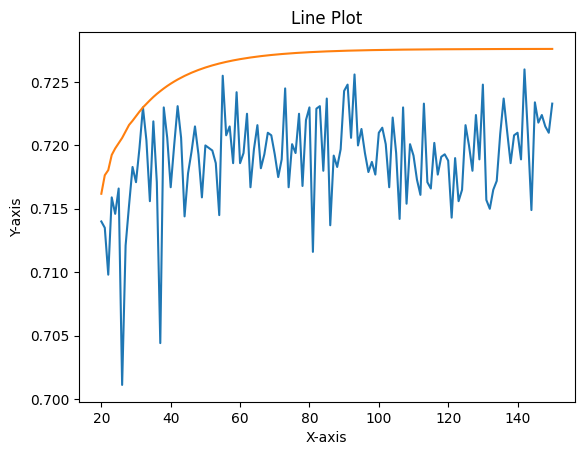

(4, 6)
20
1/1 [==============================] - 0s 28ms/step
21
1/1 [==============================] - 0s 27ms/step
22
1/1 [==============================] - 0s 31ms/step
23
1/1 [==============================] - 0s 27ms/step
24
1/1 [==============================] - 0s 28ms/step
25
1/1 [==============================] - 0s 62ms/step
26
1/1 [==============================] - 0s 26ms/step
27
1/1 [==============================] - 0s 29ms/step
28
1/1 [==============================] - 0s 30ms/step
29
1/1 [==============================] - 0s 31ms/step
30
1/1 [==============================] - 0s 29ms/step
31
1/1 [==============================] - 0s 32ms/step
32
1/1 [==============================] - 0s 31ms/step
33
1/1 [==============================] - 0s 29ms/step
34
1/1 [==============================] - 0s 31ms/step
35
1/1 [==============================] - 0s 34ms/step
36
1/1 [==============================] - 0s 59ms/step
37
1/1 [==============================] - 0s 31ms/step
38


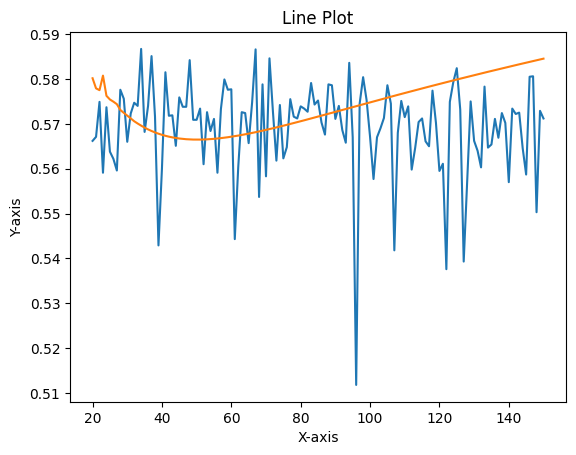

(4, 6)
20
1/1 [==============================] - 0s 59ms/step
21
1/1 [==============================] - 0s 29ms/step
22
1/1 [==============================] - 0s 29ms/step
23
1/1 [==============================] - 0s 56ms/step
24
1/1 [==============================] - 0s 40ms/step
25
1/1 [==============================] - 0s 43ms/step
26
1/1 [==============================] - 0s 43ms/step
27
1/1 [==============================] - 0s 68ms/step
28
1/1 [==============================] - 0s 59ms/step
29
1/1 [==============================] - 0s 63ms/step
30
1/1 [==============================] - 0s 38ms/step
31
1/1 [==============================] - 0s 57ms/step
32
1/1 [==============================] - 0s 48ms/step
33
1/1 [==============================] - 0s 29ms/step
34
1/1 [==============================] - 0s 28ms/step
35
1/1 [==============================] - 0s 40ms/step
36
1/1 [==============================] - 0s 27ms/step
37
1/1 [==============================] - 0s 40ms/step
38


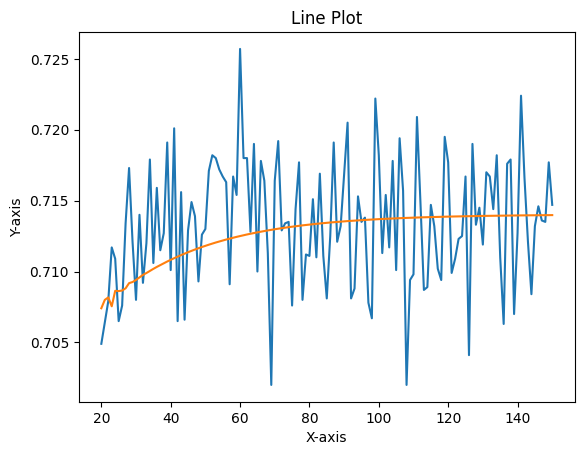

(4, 6)
20
1/1 [==============================] - 0s 60ms/step
21
1/1 [==============================] - 0s 50ms/step
22
1/1 [==============================] - 0s 48ms/step
23
1/1 [==============================] - 0s 66ms/step
24
1/1 [==============================] - 0s 63ms/step
25
1/1 [==============================] - 0s 65ms/step
26
1/1 [==============================] - 0s 35ms/step
27
1/1 [==============================] - 0s 56ms/step
28
1/1 [==============================] - 0s 38ms/step
29
1/1 [==============================] - 0s 39ms/step
30
1/1 [==============================] - 0s 50ms/step
31
1/1 [==============================] - 0s 43ms/step
32
1/1 [==============================] - 0s 47ms/step
33
1/1 [==============================] - 0s 44ms/step
34
1/1 [==============================] - 0s 54ms/step
35
1/1 [==============================] - 0s 51ms/step
36
1/1 [==============================] - 0s 65ms/step
37
1/1 [==============================] - 0s 33ms/step
38


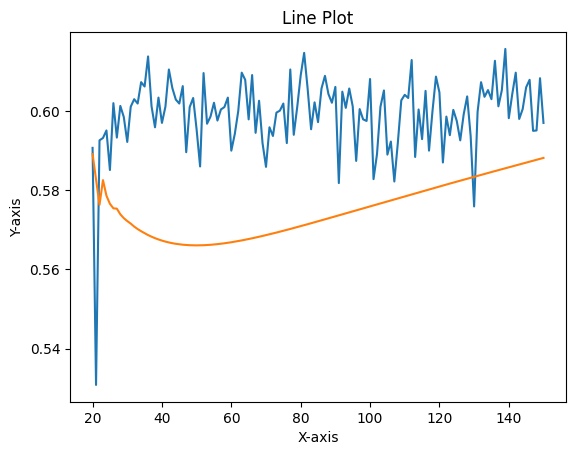

(4, 6)
20
1/1 [==============================] - 0s 49ms/step
21
1/1 [==============================] - 0s 28ms/step
22
1/1 [==============================] - 0s 27ms/step
23
1/1 [==============================] - 0s 30ms/step
24
1/1 [==============================] - 0s 30ms/step
25
1/1 [==============================] - 0s 39ms/step
26
1/1 [==============================] - 0s 27ms/step
27
1/1 [==============================] - 0s 26ms/step
28
1/1 [==============================] - 0s 35ms/step
29
1/1 [==============================] - 0s 27ms/step
30
1/1 [==============================] - 0s 27ms/step
31
1/1 [==============================] - 0s 27ms/step
32
1/1 [==============================] - 0s 63ms/step
33
1/1 [==============================] - 0s 37ms/step
34
1/1 [==============================] - 0s 66ms/step
35
1/1 [==============================] - 0s 67ms/step
36
1/1 [==============================] - 0s 44ms/step
37
1/1 [==============================] - 0s 59ms/step
38


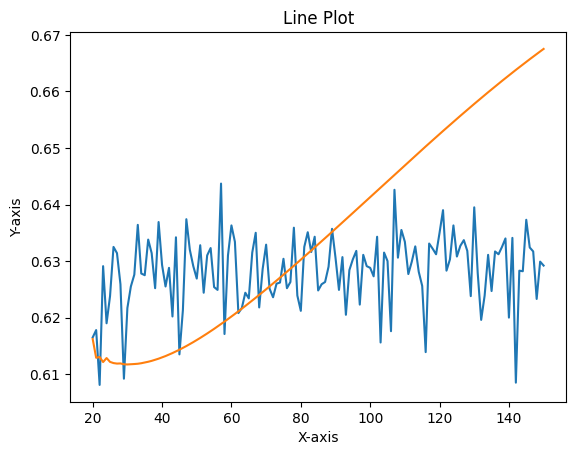

(4, 6)
20
1/1 [==============================] - 0s 43ms/step
21
1/1 [==============================] - 0s 44ms/step
22
1/1 [==============================] - 0s 29ms/step
23
1/1 [==============================] - 0s 28ms/step
24
1/1 [==============================] - 0s 31ms/step
25
1/1 [==============================] - 0s 29ms/step
26
1/1 [==============================] - 0s 27ms/step
27
1/1 [==============================] - 0s 27ms/step
28
1/1 [==============================] - 0s 29ms/step
29
1/1 [==============================] - 0s 31ms/step
30
1/1 [==============================] - 0s 29ms/step
31
1/1 [==============================] - 0s 39ms/step
32
1/1 [==============================] - 0s 42ms/step
33
1/1 [==============================] - 0s 28ms/step
34
1/1 [==============================] - 0s 29ms/step
35
1/1 [==============================] - 0s 32ms/step
36
1/1 [==============================] - 0s 30ms/step
37
1/1 [==============================] - 0s 28ms/step
38


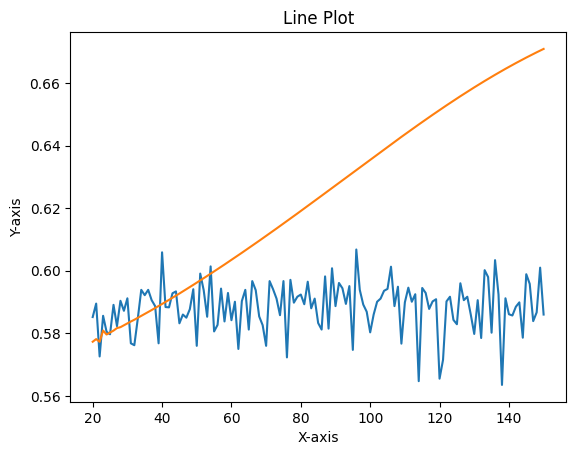

(4, 6)
20
1/1 [==============================] - 0s 35ms/step
21
1/1 [==============================] - 0s 31ms/step
22
1/1 [==============================] - 0s 28ms/step
23
1/1 [==============================] - 0s 31ms/step
24
1/1 [==============================] - 0s 61ms/step
25
1/1 [==============================] - 0s 34ms/step
26
1/1 [==============================] - 0s 37ms/step
27
1/1 [==============================] - 0s 42ms/step
28
1/1 [==============================] - 0s 32ms/step
29
1/1 [==============================] - 0s 29ms/step
30
1/1 [==============================] - 0s 28ms/step
31
1/1 [==============================] - 0s 29ms/step
32
1/1 [==============================] - 0s 30ms/step
33
1/1 [==============================] - 0s 46ms/step
34
1/1 [==============================] - 0s 41ms/step
35
1/1 [==============================] - 0s 36ms/step
36
1/1 [==============================] - 0s 32ms/step
37
1/1 [==============================] - 0s 29ms/step
38


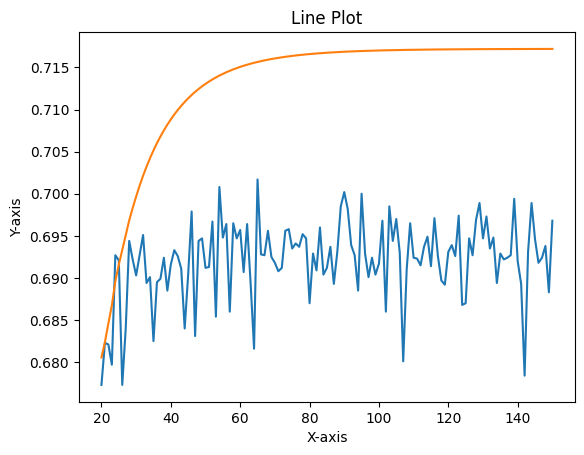

(4, 6)
20
1/1 [==============================] - 0s 31ms/step
21
1/1 [==============================] - 0s 69ms/step
22
1/1 [==============================] - 0s 33ms/step
23
1/1 [==============================] - 0s 29ms/step
24
1/1 [==============================] - 0s 27ms/step
25
1/1 [==============================] - 0s 27ms/step
26
1/1 [==============================] - 0s 31ms/step
27
1/1 [==============================] - 0s 27ms/step
28
1/1 [==============================] - 0s 28ms/step
29
1/1 [==============================] - 0s 29ms/step
30
1/1 [==============================] - 0s 39ms/step
31
1/1 [==============================] - 0s 49ms/step
32
1/1 [==============================] - 0s 29ms/step
33
1/1 [==============================] - 0s 30ms/step
34
1/1 [==============================] - 0s 40ms/step
35
1/1 [==============================] - 0s 30ms/step
36
1/1 [==============================] - 0s 46ms/step
37
1/1 [==============================] - 0s 30ms/step
38


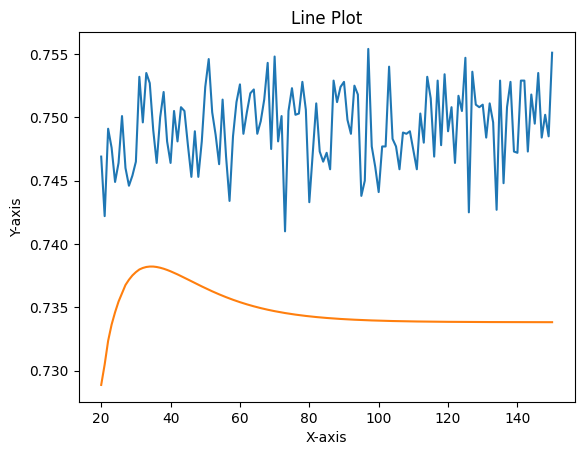

(4, 6)
20
1/1 [==============================] - 0s 28ms/step
21
1/1 [==============================] - 0s 28ms/step
22
1/1 [==============================] - 0s 30ms/step
23
1/1 [==============================] - 0s 31ms/step
24
1/1 [==============================] - 0s 29ms/step
25
1/1 [==============================] - 0s 30ms/step
26
1/1 [==============================] - 0s 31ms/step
27
1/1 [==============================] - 0s 29ms/step
28
1/1 [==============================] - 0s 42ms/step
29
1/1 [==============================] - 0s 36ms/step
30
1/1 [==============================] - 0s 31ms/step
31
1/1 [==============================] - 0s 40ms/step
32
1/1 [==============================] - 0s 30ms/step
33
1/1 [==============================] - 0s 29ms/step
34
1/1 [==============================] - 0s 30ms/step
35
1/1 [==============================] - 0s 28ms/step
36
1/1 [==============================] - 0s 29ms/step
37
1/1 [==============================] - 0s 29ms/step
38


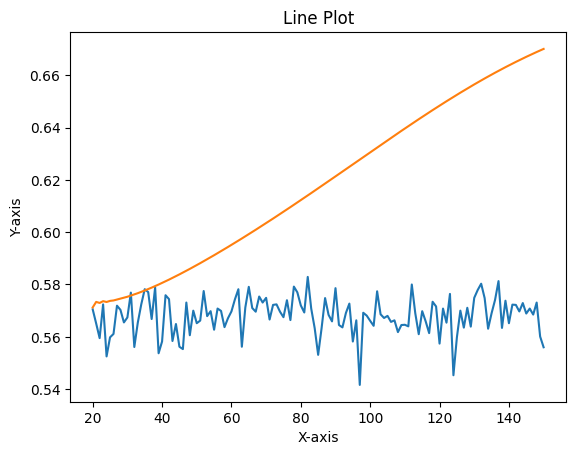

(4, 6)
20
1/1 [==============================] - 0s 77ms/step
21
1/1 [==============================] - 0s 62ms/step
22
1/1 [==============================] - 0s 53ms/step
23
1/1 [==============================] - 0s 65ms/step
24
1/1 [==============================] - 0s 82ms/step
25
1/1 [==============================] - 0s 55ms/step
26
1/1 [==============================] - 0s 63ms/step
27
1/1 [==============================] - 0s 40ms/step
28
1/1 [==============================] - 0s 41ms/step
29
1/1 [==============================] - 0s 38ms/step
30
1/1 [==============================] - 0s 55ms/step
31
1/1 [==============================] - 0s 40ms/step
32
1/1 [==============================] - 0s 44ms/step
33
1/1 [==============================] - 0s 34ms/step
34
1/1 [==============================] - 0s 35ms/step
35
1/1 [==============================] - 0s 33ms/step
36
1/1 [==============================] - 0s 40ms/step
37
1/1 [==============================] - 0s 52ms/step
38


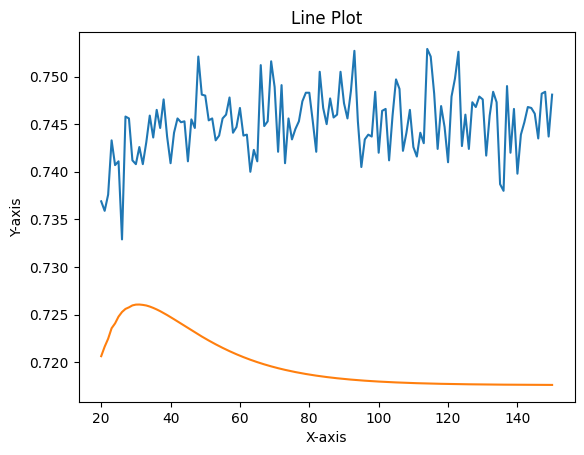

(4, 6)
20
1/1 [==============================] - 0s 69ms/step
21
1/1 [==============================] - 0s 70ms/step
22
1/1 [==============================] - 0s 63ms/step
23
1/1 [==============================] - 0s 47ms/step
24
1/1 [==============================] - 0s 70ms/step
25
1/1 [==============================] - 0s 55ms/step
26
1/1 [==============================] - 0s 60ms/step
27
1/1 [==============================] - 0s 68ms/step
28
1/1 [==============================] - 0s 30ms/step
29
1/1 [==============================] - 0s 34ms/step
30
1/1 [==============================] - 0s 32ms/step
31
1/1 [==============================] - 0s 31ms/step
32
1/1 [==============================] - 0s 32ms/step
33
1/1 [==============================] - 0s 31ms/step
34
1/1 [==============================] - 0s 39ms/step
35
1/1 [==============================] - 0s 29ms/step
36
1/1 [==============================] - 0s 29ms/step
37
1/1 [==============================] - 0s 37ms/step
38


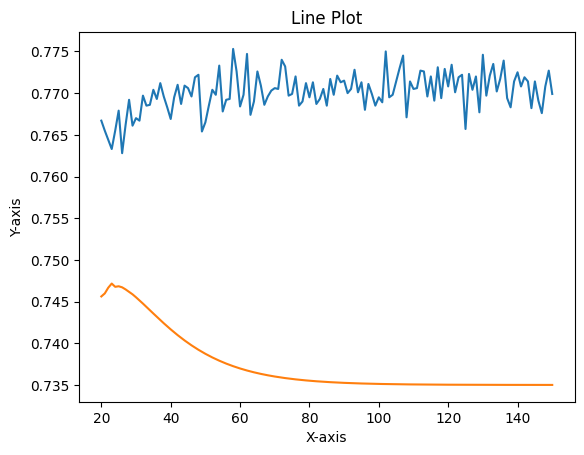

(4, 6)
20
1/1 [==============================] - 0s 57ms/step
21
1/1 [==============================] - 0s 63ms/step
22
1/1 [==============================] - 0s 55ms/step
23
1/1 [==============================] - 0s 49ms/step
24
1/1 [==============================] - 0s 60ms/step
25
1/1 [==============================] - 0s 50ms/step
26
1/1 [==============================] - 0s 30ms/step
27
1/1 [==============================] - 0s 46ms/step
28
1/1 [==============================] - 0s 45ms/step
29
1/1 [==============================] - 0s 37ms/step
30
1/1 [==============================] - 0s 51ms/step
31
1/1 [==============================] - 0s 41ms/step
32
1/1 [==============================] - 0s 64ms/step
33
1/1 [==============================] - 0s 69ms/step
34
1/1 [==============================] - 0s 33ms/step
35
1/1 [==============================] - 0s 47ms/step
36
1/1 [==============================] - 0s 41ms/step
37
1/1 [==============================] - 0s 30ms/step
38


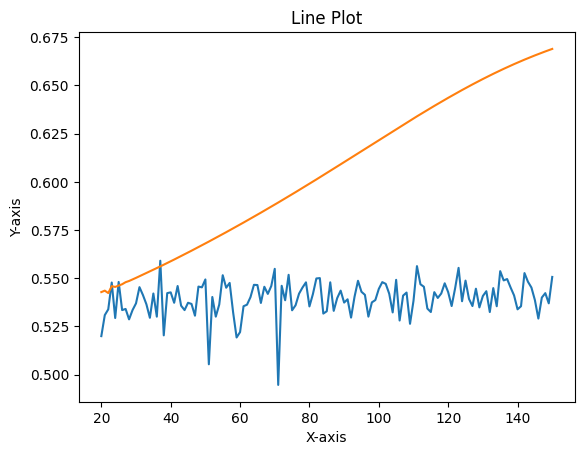

(4, 6)
20
1/1 [==============================] - 0s 41ms/step
21
1/1 [==============================] - 0s 32ms/step
22
1/1 [==============================] - 0s 40ms/step
23
1/1 [==============================] - 0s 29ms/step
24
1/1 [==============================] - 0s 30ms/step
25
1/1 [==============================] - 0s 31ms/step
26
1/1 [==============================] - 0s 29ms/step
27
1/1 [==============================] - 0s 26ms/step
28
1/1 [==============================] - 0s 27ms/step
29
1/1 [==============================] - 0s 44ms/step
30
1/1 [==============================] - 0s 35ms/step
31
1/1 [==============================] - 0s 36ms/step
32
1/1 [==============================] - 0s 49ms/step
33
1/1 [==============================] - 0s 45ms/step
34
1/1 [==============================] - 0s 56ms/step
35
1/1 [==============================] - 0s 58ms/step
36
1/1 [==============================] - 0s 43ms/step
37
1/1 [==============================] - 0s 59ms/step
38


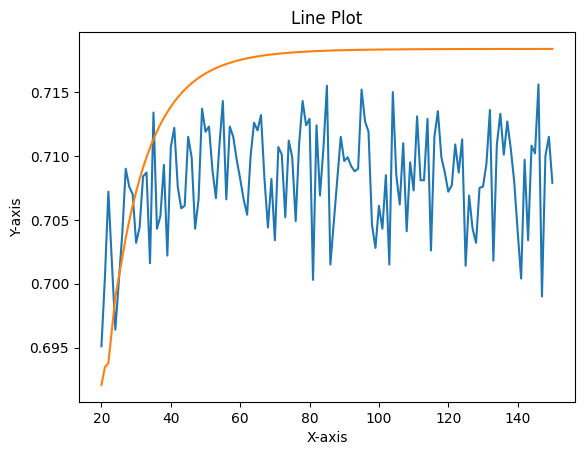

(4, 6)
20
1/1 [==============================] - 0s 29ms/step
21
1/1 [==============================] - 0s 28ms/step
22
1/1 [==============================] - 0s 30ms/step
23
1/1 [==============================] - 0s 41ms/step
24
1/1 [==============================] - 0s 31ms/step
25
1/1 [==============================] - 0s 28ms/step
26
1/1 [==============================] - 0s 33ms/step
27
1/1 [==============================] - 0s 67ms/step
28
1/1 [==============================] - 0s 34ms/step
29
1/1 [==============================] - 0s 28ms/step
30
1/1 [==============================] - 0s 40ms/step
31
1/1 [==============================] - 0s 30ms/step
32
1/1 [==============================] - 0s 29ms/step
33
1/1 [==============================] - 0s 29ms/step
34
1/1 [==============================] - 0s 28ms/step
35
1/1 [==============================] - 0s 40ms/step
36
1/1 [==============================] - 0s 35ms/step
37
1/1 [==============================] - 0s 41ms/step
38


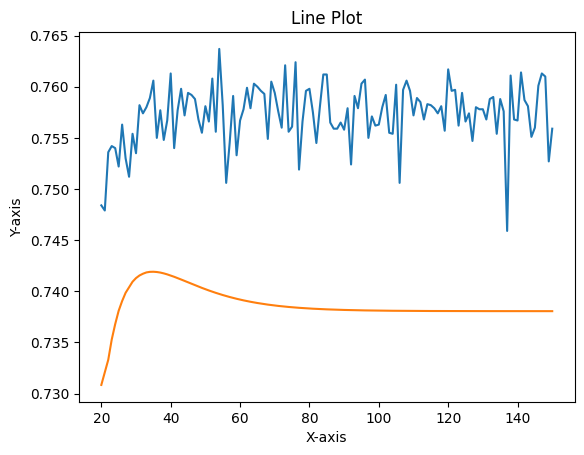

(4, 6)
20
1/1 [==============================] - 0s 30ms/step
21
1/1 [==============================] - 0s 38ms/step
22
1/1 [==============================] - 0s 54ms/step
23
1/1 [==============================] - 0s 31ms/step
24
1/1 [==============================] - 0s 37ms/step
25
1/1 [==============================] - 0s 26ms/step
26
1/1 [==============================] - 0s 28ms/step
27
1/1 [==============================] - 0s 28ms/step
28
1/1 [==============================] - 0s 29ms/step
29
1/1 [==============================] - 0s 29ms/step
30
1/1 [==============================] - 0s 28ms/step
31
1/1 [==============================] - 0s 31ms/step
32
1/1 [==============================] - 0s 43ms/step
33
1/1 [==============================] - 0s 34ms/step
34
1/1 [==============================] - 0s 26ms/step
35
1/1 [==============================] - 0s 28ms/step
36
1/1 [==============================] - 0s 32ms/step
37
1/1 [==============================] - 0s 31ms/step
38


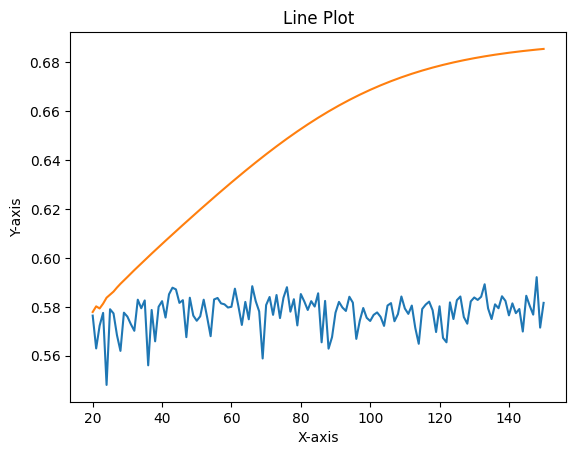

(4, 6)
20
1/1 [==============================] - 0s 29ms/step
21
1/1 [==============================] - 0s 39ms/step
22
1/1 [==============================] - 0s 27ms/step
23
1/1 [==============================] - 0s 31ms/step
24
1/1 [==============================] - 0s 31ms/step
25
1/1 [==============================] - 0s 29ms/step
26
1/1 [==============================] - 0s 43ms/step
27
1/1 [==============================] - 0s 33ms/step
28
1/1 [==============================] - 0s 28ms/step
29
1/1 [==============================] - 0s 28ms/step
30
1/1 [==============================] - 0s 27ms/step
31
1/1 [==============================] - 0s 30ms/step
32
1/1 [==============================] - 0s 29ms/step
33
1/1 [==============================] - 0s 27ms/step
34
1/1 [==============================] - 0s 29ms/step
35
1/1 [==============================] - 0s 29ms/step
36
1/1 [==============================] - 0s 29ms/step
37
1/1 [==============================] - 0s 31ms/step
38


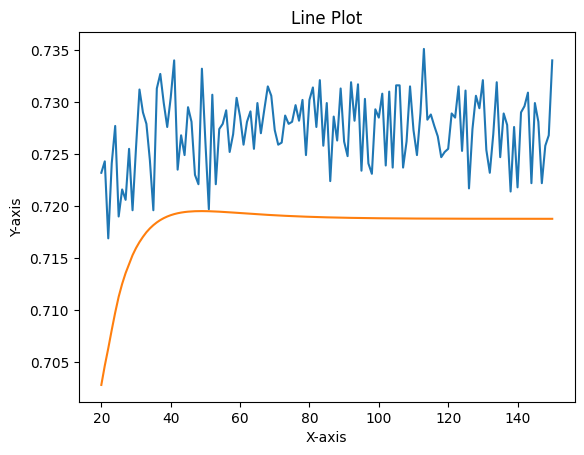

(4, 6)
20
1/1 [==============================] - 0s 42ms/step
21
1/1 [==============================] - 0s 35ms/step
22
1/1 [==============================] - 0s 31ms/step
23
1/1 [==============================] - 0s 31ms/step
24
1/1 [==============================] - 0s 28ms/step
25
1/1 [==============================] - 0s 29ms/step
26
1/1 [==============================] - 0s 27ms/step
27
1/1 [==============================] - 0s 28ms/step
28
1/1 [==============================] - 0s 30ms/step
29
1/1 [==============================] - 0s 31ms/step
30
1/1 [==============================] - 0s 28ms/step
31
1/1 [==============================] - 0s 31ms/step
32
1/1 [==============================] - 0s 33ms/step
33
1/1 [==============================] - 0s 29ms/step
34
1/1 [==============================] - 0s 30ms/step
35
1/1 [==============================] - 0s 29ms/step
36
1/1 [==============================] - 0s 28ms/step
37
1/1 [==============================] - 0s 30ms/step
38


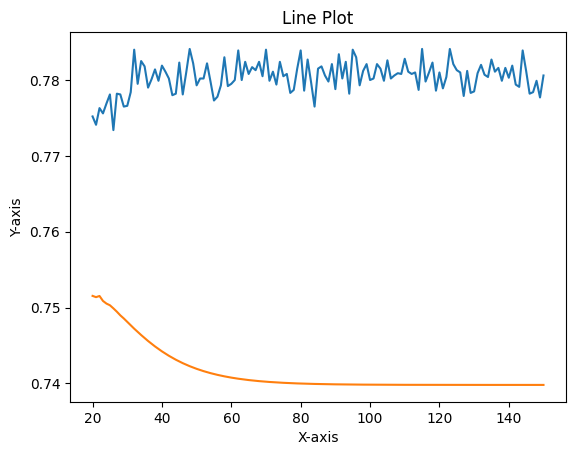

(4, 6)
20
1/1 [==============================] - 0s 35ms/step
21
1/1 [==============================] - 0s 43ms/step
22
1/1 [==============================] - 0s 63ms/step
23
1/1 [==============================] - 0s 39ms/step
24
1/1 [==============================] - 0s 36ms/step
25
1/1 [==============================] - 0s 33ms/step
26
1/1 [==============================] - 0s 36ms/step
27
1/1 [==============================] - 0s 34ms/step
28
1/1 [==============================] - 0s 64ms/step
29
1/1 [==============================] - 0s 46ms/step
30
1/1 [==============================] - 0s 58ms/step
31
1/1 [==============================] - 0s 57ms/step
32
1/1 [==============================] - 0s 66ms/step
33
1/1 [==============================] - 0s 56ms/step
34
1/1 [==============================] - 0s 58ms/step
35
1/1 [==============================] - 0s 49ms/step
36
1/1 [==============================] - 0s 37ms/step
37
1/1 [==============================] - 0s 47ms/step
38


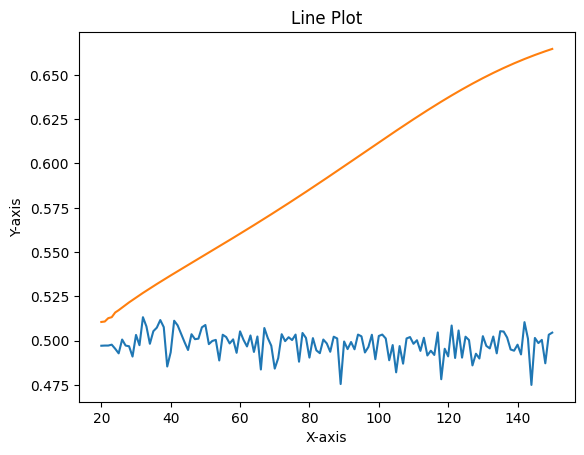

(4, 6)
20
1/1 [==============================] - 0s 56ms/step
21
1/1 [==============================] - 0s 48ms/step
22
1/1 [==============================] - 0s 44ms/step
23
1/1 [==============================] - 0s 36ms/step
24
1/1 [==============================] - 0s 31ms/step
25
1/1 [==============================] - 0s 36ms/step
26
1/1 [==============================] - 0s 53ms/step
27
1/1 [==============================] - 0s 58ms/step
28
1/1 [==============================] - 0s 45ms/step
29
1/1 [==============================] - 0s 59ms/step
30
1/1 [==============================] - 0s 37ms/step
31
1/1 [==============================] - 0s 63ms/step
32
1/1 [==============================] - 0s 46ms/step
33
1/1 [==============================] - 0s 64ms/step
34
1/1 [==============================] - 0s 50ms/step
35
1/1 [==============================] - 0s 51ms/step
36
1/1 [==============================] - 0s 47ms/step
37
1/1 [==============================] - 0s 44ms/step
38


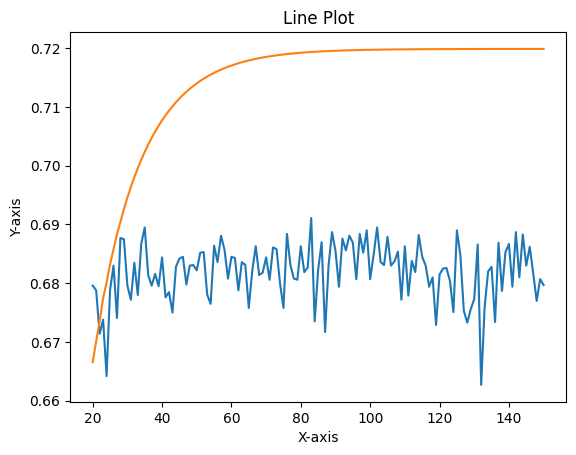

(4, 6)
20
1/1 [==============================] - 0s 30ms/step
21
1/1 [==============================] - 0s 29ms/step
22
1/1 [==============================] - 0s 29ms/step
23
1/1 [==============================] - 0s 32ms/step
24
1/1 [==============================] - 0s 26ms/step
25
1/1 [==============================] - 0s 27ms/step
26
1/1 [==============================] - 0s 26ms/step
27
1/1 [==============================] - 0s 31ms/step
28
1/1 [==============================] - 0s 28ms/step
29
1/1 [==============================] - 0s 29ms/step
30
1/1 [==============================] - 0s 28ms/step
31
1/1 [==============================] - 0s 32ms/step
32
1/1 [==============================] - 0s 29ms/step
33
1/1 [==============================] - 0s 28ms/step
34
1/1 [==============================] - 0s 29ms/step
35
1/1 [==============================] - 0s 29ms/step
36
1/1 [==============================] - 0s 29ms/step
37
1/1 [==============================] - 0s 55ms/step
38


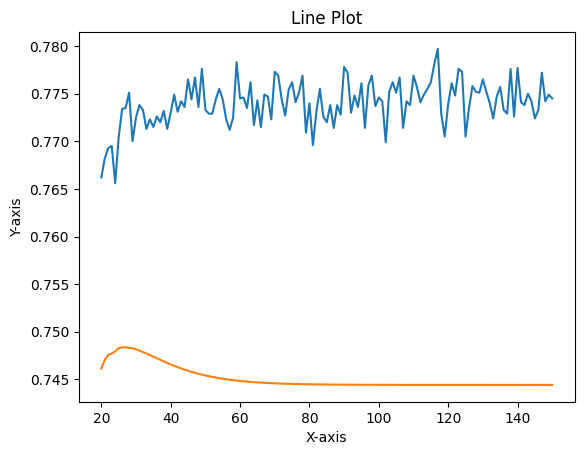

(4, 6)
20
1/1 [==============================] - 0s 36ms/step
21
1/1 [==============================] - 0s 58ms/step
22
1/1 [==============================] - 0s 44ms/step
23
1/1 [==============================] - 0s 39ms/step
24
1/1 [==============================] - 0s 41ms/step
25
1/1 [==============================] - 0s 35ms/step
26
1/1 [==============================] - 0s 34ms/step
27
1/1 [==============================] - 0s 39ms/step
28
1/1 [==============================] - 0s 35ms/step
29
1/1 [==============================] - 0s 41ms/step
30
1/1 [==============================] - 0s 45ms/step
31
1/1 [==============================] - 0s 42ms/step
32
1/1 [==============================] - 0s 35ms/step
33
1/1 [==============================] - 0s 32ms/step
34
1/1 [==============================] - 0s 35ms/step
35
1/1 [==============================] - 0s 32ms/step
36
1/1 [==============================] - 0s 39ms/step
37
1/1 [==============================] - 0s 34ms/step
38


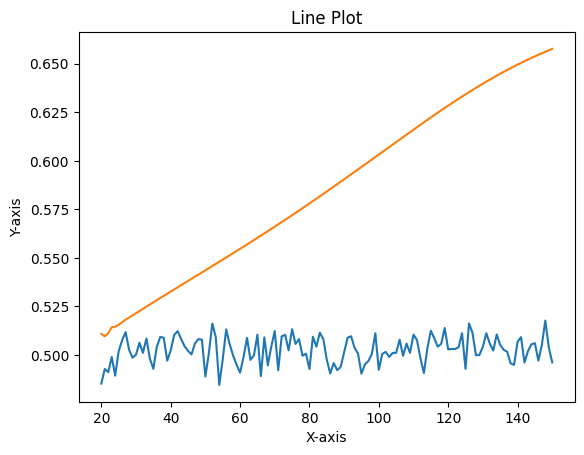

(4, 6)
20
1/1 [==============================] - 0s 30ms/step
21
1/1 [==============================] - 0s 30ms/step
22
1/1 [==============================] - 0s 28ms/step
23
1/1 [==============================] - 0s 32ms/step
24
1/1 [==============================] - 0s 28ms/step
25
1/1 [==============================] - 0s 29ms/step
26
1/1 [==============================] - 0s 31ms/step
27
1/1 [==============================] - 0s 41ms/step
28
1/1 [==============================] - 0s 29ms/step
29
1/1 [==============================] - 0s 30ms/step
30
1/1 [==============================] - 0s 30ms/step
31
1/1 [==============================] - 0s 27ms/step
32
1/1 [==============================] - 0s 28ms/step
33
1/1 [==============================] - 0s 38ms/step
34
1/1 [==============================] - 0s 31ms/step
35
1/1 [==============================] - 0s 32ms/step
36
1/1 [==============================] - 0s 30ms/step
37
1/1 [==============================] - 0s 38ms/step
38


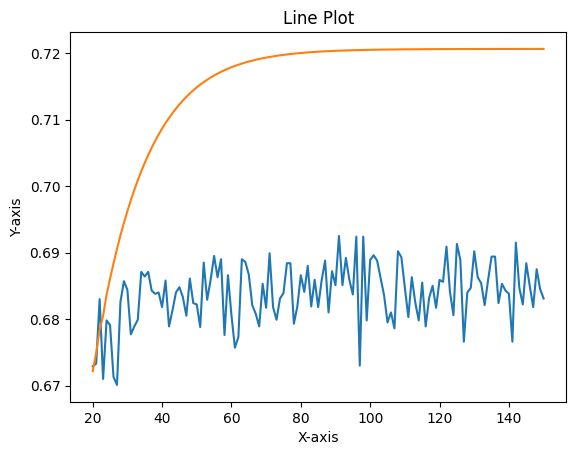

(4, 6)
20
1/1 [==============================] - 0s 28ms/step
21
1/1 [==============================] - 0s 26ms/step
22
1/1 [==============================] - 0s 28ms/step
23
1/1 [==============================] - 0s 35ms/step
24
1/1 [==============================] - 0s 28ms/step
25
1/1 [==============================] - 0s 28ms/step
26
1/1 [==============================] - 0s 29ms/step
27
1/1 [==============================] - 0s 30ms/step
28
1/1 [==============================] - 0s 40ms/step
29
1/1 [==============================] - 0s 28ms/step
30
1/1 [==============================] - 0s 32ms/step
31
1/1 [==============================] - 0s 28ms/step
32
1/1 [==============================] - 0s 29ms/step
33
1/1 [==============================] - 0s 31ms/step
34
1/1 [==============================] - 0s 27ms/step
35
1/1 [==============================] - 0s 36ms/step
36
1/1 [==============================] - 0s 28ms/step
37
1/1 [==============================] - 0s 29ms/step
38


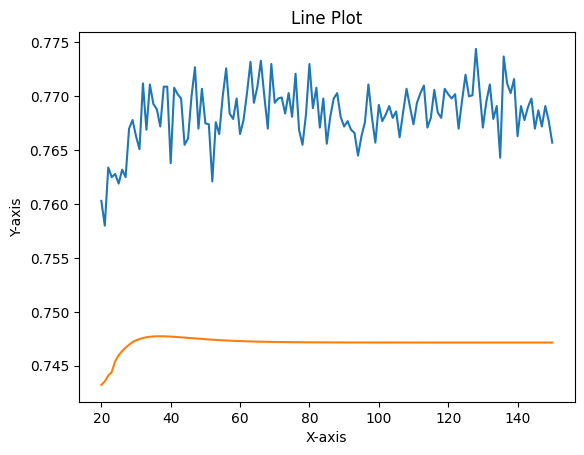

(4, 6)
20
1/1 [==============================] - 0s 29ms/step
21
1/1 [==============================] - 0s 28ms/step
22
1/1 [==============================] - 0s 28ms/step
23
1/1 [==============================] - 0s 28ms/step
24
1/1 [==============================] - 0s 29ms/step
25
1/1 [==============================] - 0s 33ms/step
26
1/1 [==============================] - 0s 43ms/step
27
1/1 [==============================] - 0s 28ms/step
28
1/1 [==============================] - 0s 27ms/step
29
1/1 [==============================] - 0s 29ms/step
30
1/1 [==============================] - 0s 28ms/step
31
1/1 [==============================] - 0s 29ms/step
32
1/1 [==============================] - 0s 29ms/step
33
1/1 [==============================] - 0s 29ms/step
34
1/1 [==============================] - 0s 29ms/step
35
1/1 [==============================] - 0s 29ms/step
36
1/1 [==============================] - 0s 32ms/step
37
1/1 [==============================] - 0s 28ms/step
38


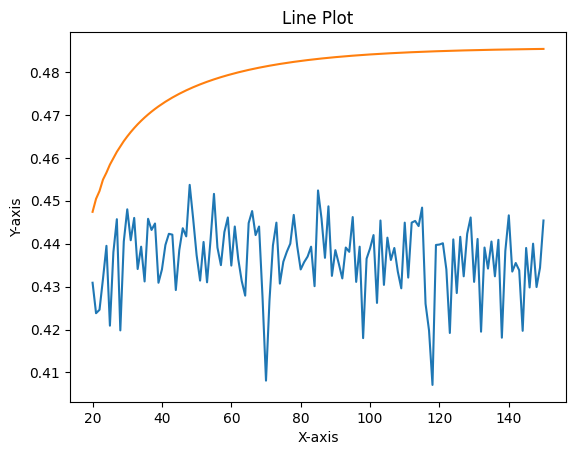

(4, 6)
20
1/1 [==============================] - 0s 33ms/step
21
1/1 [==============================] - 0s 43ms/step
22
1/1 [==============================] - 0s 53ms/step
23
1/1 [==============================] - 0s 51ms/step
24
1/1 [==============================] - 0s 39ms/step
25
1/1 [==============================] - 0s 45ms/step
26
1/1 [==============================] - 0s 43ms/step
27
1/1 [==============================] - 0s 39ms/step
28
1/1 [==============================] - 0s 41ms/step
29
1/1 [==============================] - 0s 45ms/step
30
1/1 [==============================] - 0s 47ms/step
31
1/1 [==============================] - 0s 48ms/step
32
1/1 [==============================] - 0s 62ms/step
33
1/1 [==============================] - 0s 60ms/step
34
1/1 [==============================] - 0s 28ms/step
35
1/1 [==============================] - 0s 29ms/step
36
1/1 [==============================] - 0s 29ms/step
37
1/1 [==============================] - 0s 29ms/step
38


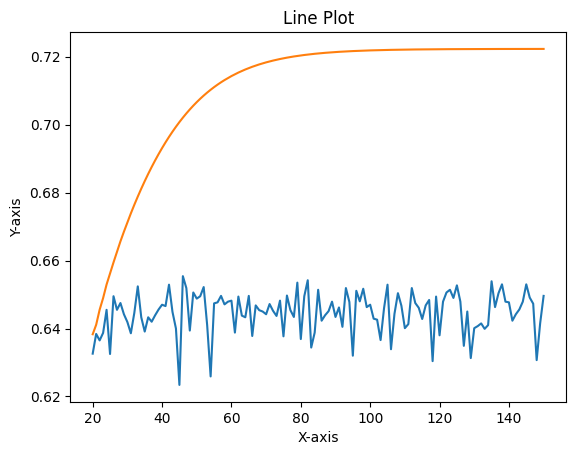

(4, 6)
20
1/1 [==============================] - 0s 41ms/step
21
1/1 [==============================] - 0s 50ms/step
22
1/1 [==============================] - 0s 40ms/step
23
1/1 [==============================] - 0s 57ms/step
24
1/1 [==============================] - 0s 60ms/step
25
1/1 [==============================] - 0s 40ms/step
26
1/1 [==============================] - 0s 35ms/step
27
1/1 [==============================] - 0s 37ms/step
28
1/1 [==============================] - 0s 34ms/step
29
1/1 [==============================] - 0s 35ms/step
30
1/1 [==============================] - 0s 48ms/step
31
1/1 [==============================] - 0s 58ms/step
32
1/1 [==============================] - 0s 54ms/step
33
1/1 [==============================] - 0s 50ms/step
34
1/1 [==============================] - 0s 37ms/step
35
1/1 [==============================] - 0s 52ms/step
36
1/1 [==============================] - 0s 43ms/step
37
1/1 [==============================] - 0s 40ms/step
38


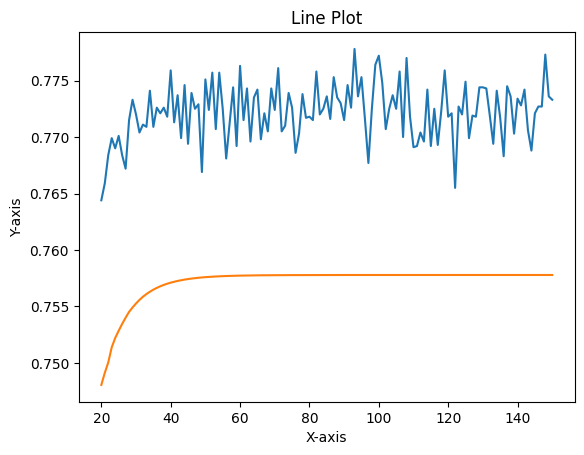

(4, 6)
20
1/1 [==============================] - 0s 34ms/step
21
1/1 [==============================] - 0s 28ms/step
22
1/1 [==============================] - 0s 29ms/step
23
1/1 [==============================] - 0s 29ms/step
24
1/1 [==============================] - 0s 31ms/step
25
1/1 [==============================] - 0s 29ms/step
26
1/1 [==============================] - 0s 29ms/step
27
1/1 [==============================] - 0s 27ms/step
28
1/1 [==============================] - 0s 29ms/step
29
1/1 [==============================] - 0s 41ms/step
30
1/1 [==============================] - 0s 66ms/step
31
1/1 [==============================] - 0s 38ms/step
32
1/1 [==============================] - 0s 30ms/step
33
1/1 [==============================] - 0s 29ms/step
34
1/1 [==============================] - 0s 30ms/step
35
1/1 [==============================] - 0s 32ms/step
36
1/1 [==============================] - 0s 45ms/step
37
1/1 [==============================] - 0s 51ms/step
38


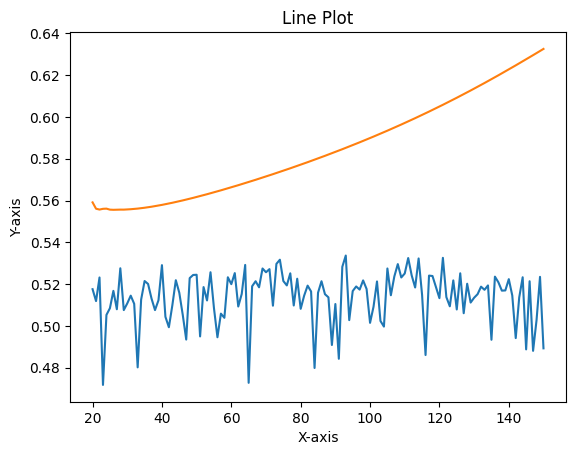

(4, 6)
20
1/1 [==============================] - 0s 43ms/step
21
1/1 [==============================] - 0s 28ms/step
22
1/1 [==============================] - 0s 28ms/step
23
1/1 [==============================] - 0s 27ms/step
24
1/1 [==============================] - 0s 57ms/step
25
1/1 [==============================] - 0s 30ms/step
26
1/1 [==============================] - 0s 33ms/step
27
1/1 [==============================] - 0s 28ms/step
28
1/1 [==============================] - 0s 30ms/step
29
1/1 [==============================] - 0s 32ms/step
30
1/1 [==============================] - 0s 29ms/step
31
1/1 [==============================] - 0s 29ms/step
32
1/1 [==============================] - 0s 30ms/step
33
1/1 [==============================] - 0s 29ms/step
34
1/1 [==============================] - 0s 27ms/step
35
1/1 [==============================] - 0s 28ms/step
36
1/1 [==============================] - 0s 36ms/step
37
1/1 [==============================] - 0s 30ms/step
38


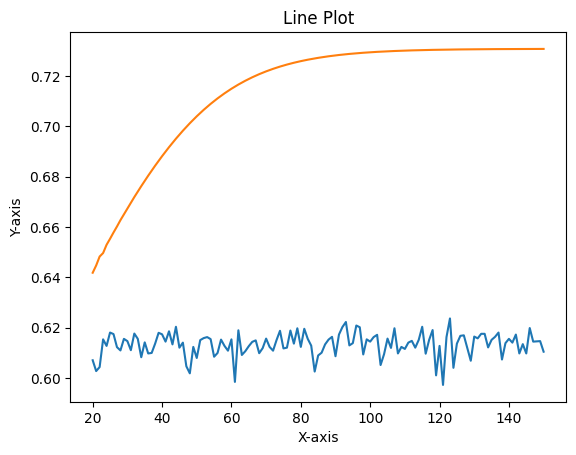

(4, 6)
20
1/1 [==============================] - 0s 28ms/step
21
1/1 [==============================] - 0s 27ms/step
22
1/1 [==============================] - 0s 29ms/step
23
1/1 [==============================] - 0s 27ms/step
24
1/1 [==============================] - 0s 29ms/step
25
1/1 [==============================] - 0s 33ms/step
26
1/1 [==============================] - 0s 26ms/step
27
1/1 [==============================] - 0s 28ms/step
28
1/1 [==============================] - 0s 62ms/step
29
1/1 [==============================] - 0s 26ms/step
30
1/1 [==============================] - 0s 31ms/step
31
1/1 [==============================] - 0s 29ms/step
32
1/1 [==============================] - 0s 29ms/step
33
1/1 [==============================] - 0s 27ms/step
34
1/1 [==============================] - 0s 27ms/step
35
1/1 [==============================] - 0s 27ms/step
36
1/1 [==============================] - 0s 32ms/step
37
1/1 [==============================] - 0s 28ms/step
38


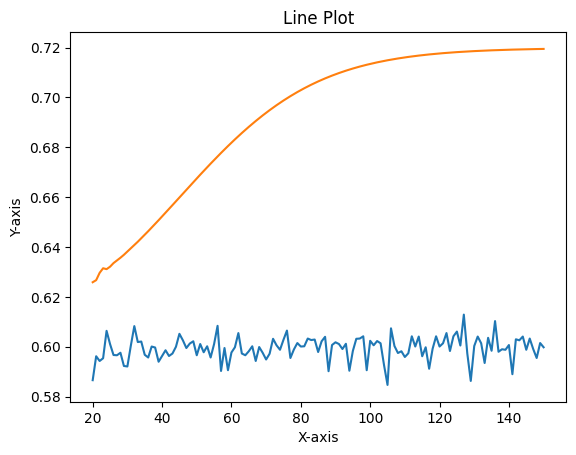

(4, 6)
20
1/1 [==============================] - 0s 29ms/step
21
1/1 [==============================] - 0s 39ms/step
22
1/1 [==============================] - 0s 29ms/step
23
1/1 [==============================] - 0s 33ms/step
24
1/1 [==============================] - 0s 32ms/step
25
1/1 [==============================] - 0s 30ms/step
26
1/1 [==============================] - 0s 29ms/step
27
1/1 [==============================] - 0s 31ms/step
28
1/1 [==============================] - 0s 32ms/step
29
1/1 [==============================] - 0s 54ms/step
30
1/1 [==============================] - 0s 29ms/step
31
1/1 [==============================] - 0s 29ms/step
32
1/1 [==============================] - 0s 26ms/step
33
1/1 [==============================] - 0s 31ms/step
34
1/1 [==============================] - 0s 28ms/step
35
1/1 [==============================] - 0s 30ms/step
36
1/1 [==============================] - 0s 30ms/step
37
1/1 [==============================] - 0s 29ms/step
38


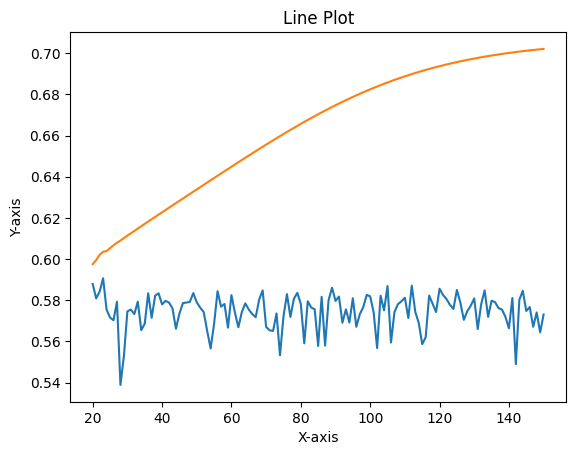

(4, 6)
30
1/1 [==============================] - 0s 33ms/step
31
1/1 [==============================] - 0s 34ms/step
32
1/1 [==============================] - 0s 32ms/step
33
1/1 [==============================] - 0s 42ms/step
34
1/1 [==============================] - 0s 33ms/step
35
1/1 [==============================] - 0s 57ms/step
36
1/1 [==============================] - 0s 60ms/step
37
1/1 [==============================] - 0s 36ms/step
38
1/1 [==============================] - 0s 61ms/step
39
1/1 [==============================] - 0s 45ms/step
40
1/1 [==============================] - 0s 64ms/step
41
1/1 [==============================] - 0s 45ms/step
42
1/1 [==============================] - 0s 39ms/step
43
1/1 [==============================] - 0s 61ms/step
44
1/1 [==============================] - 0s 51ms/step
45
1/1 [==============================] - 0s 31ms/step
46
1/1 [==============================] - 0s 29ms/step
47
1/1 [==============================] - 0s 28ms/step
48


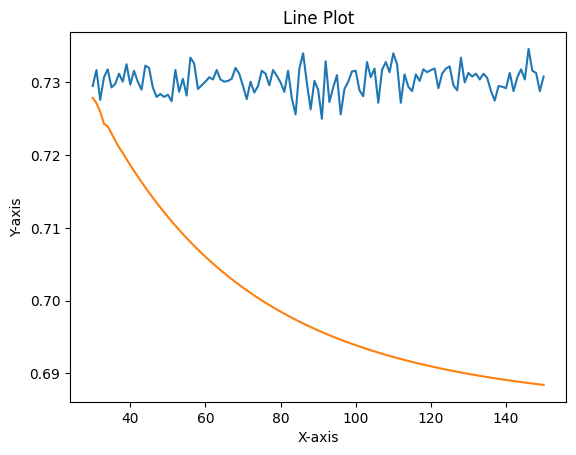

(4, 6)
30
1/1 [==============================] - 0s 45ms/step
31
1/1 [==============================] - 0s 59ms/step
32
1/1 [==============================] - 0s 83ms/step
33
1/1 [==============================] - 0s 63ms/step
34
1/1 [==============================] - 0s 54ms/step
35
1/1 [==============================] - 0s 61ms/step
36
1/1 [==============================] - 0s 75ms/step
37
1/1 [==============================] - 0s 75ms/step
38
1/1 [==============================] - 0s 60ms/step
39
1/1 [==============================] - 0s 57ms/step
40
1/1 [==============================] - 0s 76ms/step
41
1/1 [==============================] - 0s 69ms/step
42
1/1 [==============================] - 0s 61ms/step
43
1/1 [==============================] - 0s 51ms/step
44
1/1 [==============================] - 0s 51ms/step
45
1/1 [==============================] - 0s 56ms/step
46
1/1 [==============================] - 0s 73ms/step
47
1/1 [==============================] - 0s 74ms/step
48


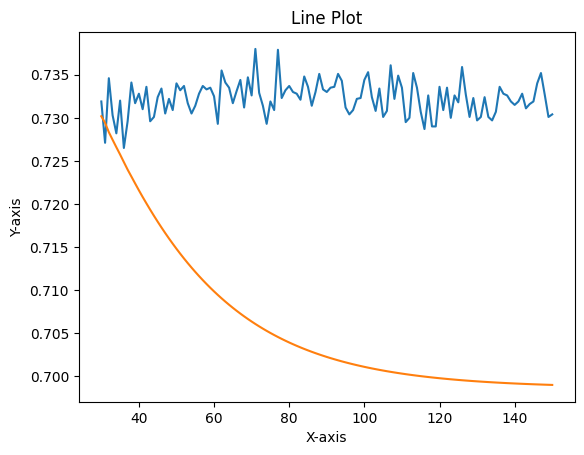

(4, 6)
30
1/1 [==============================] - 0s 52ms/step
31
1/1 [==============================] - 0s 36ms/step
32
1/1 [==============================] - 0s 32ms/step
33
1/1 [==============================] - 0s 28ms/step
34
1/1 [==============================] - 0s 30ms/step
35
1/1 [==============================] - 0s 29ms/step
36
1/1 [==============================] - 0s 33ms/step
37
1/1 [==============================] - 0s 34ms/step
38
1/1 [==============================] - 0s 56ms/step
39
1/1 [==============================] - 0s 30ms/step
40
1/1 [==============================] - 0s 31ms/step
41
1/1 [==============================] - 0s 32ms/step
42
1/1 [==============================] - 0s 61ms/step
43
1/1 [==============================] - 0s 67ms/step
44
1/1 [==============================] - 0s 51ms/step
45
1/1 [==============================] - 0s 39ms/step
46
1/1 [==============================] - 0s 51ms/step
47
1/1 [==============================] - 0s 40ms/step
48


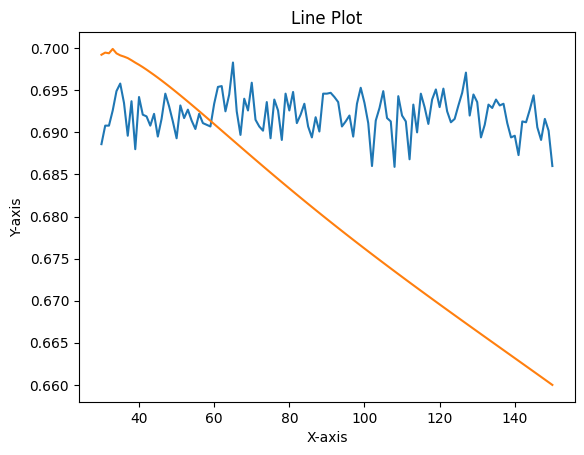

(4, 6)
30
1/1 [==============================] - 0s 29ms/step
31
1/1 [==============================] - 0s 28ms/step
32
1/1 [==============================] - 0s 42ms/step
33
1/1 [==============================] - 0s 39ms/step
34
1/1 [==============================] - 0s 30ms/step
35
1/1 [==============================] - 0s 27ms/step
36
1/1 [==============================] - 0s 28ms/step
37
1/1 [==============================] - 0s 28ms/step
38
1/1 [==============================] - 0s 29ms/step
39
1/1 [==============================] - 0s 28ms/step
40
1/1 [==============================] - 0s 30ms/step
41
1/1 [==============================] - 0s 42ms/step
42
1/1 [==============================] - 0s 50ms/step
43
1/1 [==============================] - 0s 30ms/step
44
1/1 [==============================] - 0s 31ms/step
45
1/1 [==============================] - 0s 32ms/step
46
1/1 [==============================] - 0s 27ms/step
47
1/1 [==============================] - 0s 32ms/step
48


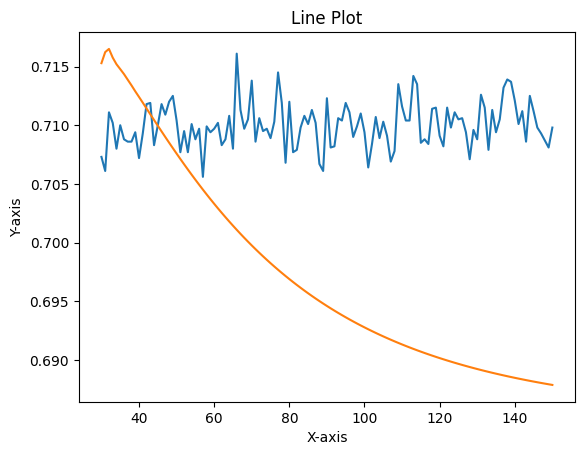

(4, 6)
30
1/1 [==============================] - 0s 64ms/step
31
1/1 [==============================] - 0s 44ms/step
32
1/1 [==============================] - 0s 27ms/step
33
1/1 [==============================] - 0s 32ms/step
34
1/1 [==============================] - 0s 28ms/step
35
1/1 [==============================] - 0s 31ms/step
36
1/1 [==============================] - 0s 29ms/step
37
1/1 [==============================] - 0s 30ms/step
38
1/1 [==============================] - 0s 31ms/step
39
1/1 [==============================] - 0s 29ms/step
40
1/1 [==============================] - 0s 38ms/step
41
1/1 [==============================] - 0s 29ms/step
42
1/1 [==============================] - 0s 29ms/step
43
1/1 [==============================] - 0s 36ms/step
44
1/1 [==============================] - 0s 35ms/step
45
1/1 [==============================] - 0s 32ms/step
46
1/1 [==============================] - 0s 29ms/step
47
1/1 [==============================] - 0s 28ms/step
48


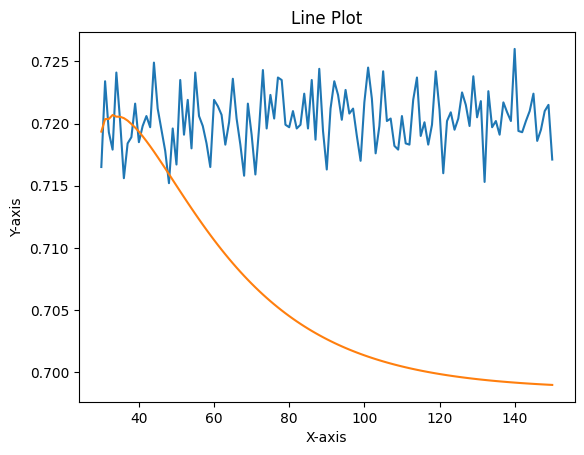

(4, 6)
30
1/1 [==============================] - 0s 33ms/step
31
1/1 [==============================] - 0s 42ms/step
32
1/1 [==============================] - 0s 60ms/step
33
1/1 [==============================] - 0s 31ms/step
34
1/1 [==============================] - 0s 26ms/step
35
1/1 [==============================] - 0s 27ms/step
36
1/1 [==============================] - 0s 39ms/step
37
1/1 [==============================] - 0s 30ms/step
38
1/1 [==============================] - 0s 27ms/step
39
1/1 [==============================] - 0s 27ms/step
40
1/1 [==============================] - 0s 29ms/step
41
1/1 [==============================] - 0s 32ms/step
42
1/1 [==============================] - 0s 41ms/step
43
1/1 [==============================] - 0s 45ms/step
44
1/1 [==============================] - 0s 31ms/step
45
1/1 [==============================] - 0s 27ms/step
46
1/1 [==============================] - 0s 28ms/step
47
1/1 [==============================] - 0s 28ms/step
48


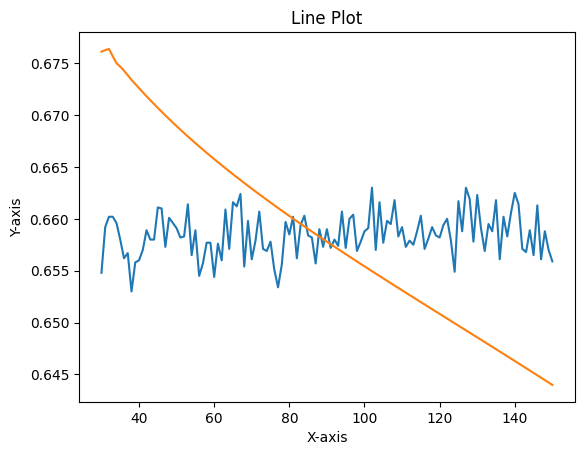

(4, 6)
30
1/1 [==============================] - 0s 57ms/step
31
1/1 [==============================] - 0s 47ms/step
32
1/1 [==============================] - 0s 43ms/step
33
1/1 [==============================] - 0s 56ms/step
34
1/1 [==============================] - 0s 60ms/step
35
1/1 [==============================] - 0s 43ms/step
36
1/1 [==============================] - 0s 43ms/step
37
1/1 [==============================] - 0s 48ms/step
38
1/1 [==============================] - 0s 47ms/step
39
1/1 [==============================] - 0s 45ms/step
40
1/1 [==============================] - 0s 63ms/step
41
1/1 [==============================] - 0s 50ms/step
42
1/1 [==============================] - 0s 48ms/step
43
1/1 [==============================] - 0s 64ms/step
44
1/1 [==============================] - 0s 65ms/step
45
1/1 [==============================] - 0s 66ms/step
46
1/1 [==============================] - 0s 34ms/step
47
1/1 [==============================] - 0s 31ms/step
48


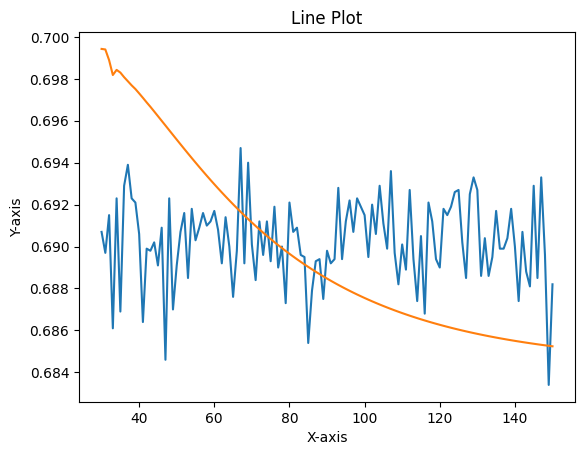

(4, 6)
30
1/1 [==============================] - 0s 43ms/step
31
1/1 [==============================] - 0s 29ms/step
32
1/1 [==============================] - 0s 30ms/step
33
1/1 [==============================] - 0s 30ms/step
34
1/1 [==============================] - 0s 32ms/step
35
1/1 [==============================] - 0s 27ms/step
36
1/1 [==============================] - 0s 27ms/step
37
1/1 [==============================] - 0s 62ms/step
38
1/1 [==============================] - 0s 34ms/step
39
1/1 [==============================] - 0s 27ms/step
40
1/1 [==============================] - 0s 28ms/step
41
1/1 [==============================] - 0s 28ms/step
42
1/1 [==============================] - 0s 26ms/step
43
1/1 [==============================] - 0s 30ms/step
44
1/1 [==============================] - 0s 28ms/step
45
1/1 [==============================] - 0s 33ms/step
46
1/1 [==============================] - 0s 30ms/step
47
1/1 [==============================] - 0s 27ms/step
48


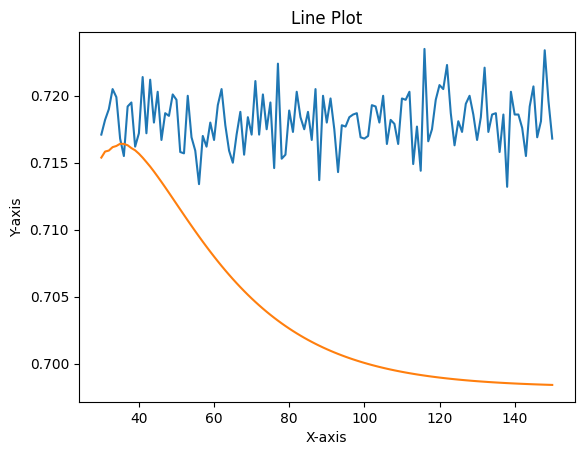

(4, 6)
30
1/1 [==============================] - 0s 32ms/step
31
1/1 [==============================] - 0s 29ms/step
32
1/1 [==============================] - 0s 28ms/step
33
1/1 [==============================] - 0s 59ms/step
34
1/1 [==============================] - 0s 43ms/step
35
1/1 [==============================] - 0s 27ms/step
36
1/1 [==============================] - 0s 27ms/step
37
1/1 [==============================] - 0s 32ms/step
38
1/1 [==============================] - 0s 29ms/step
39
1/1 [==============================] - 0s 28ms/step
40
1/1 [==============================] - 0s 32ms/step
41
1/1 [==============================] - 0s 28ms/step
42
1/1 [==============================] - 0s 28ms/step
43
1/1 [==============================] - 0s 28ms/step
44
1/1 [==============================] - 0s 28ms/step
45
1/1 [==============================] - 0s 29ms/step
46
1/1 [==============================] - 0s 28ms/step
47
1/1 [==============================] - 0s 29ms/step
48


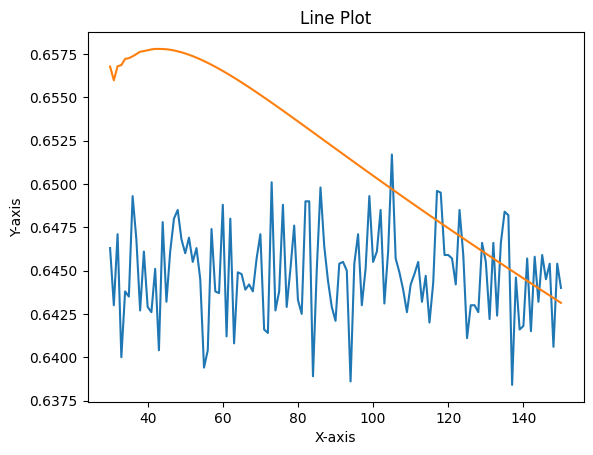

(4, 6)
30
1/1 [==============================] - 0s 31ms/step
31
1/1 [==============================] - 0s 31ms/step
32
1/1 [==============================] - 0s 28ms/step
33
1/1 [==============================] - 0s 39ms/step
34
1/1 [==============================] - 0s 40ms/step
35
1/1 [==============================] - 0s 27ms/step
36
1/1 [==============================] - 0s 29ms/step
37
1/1 [==============================] - 0s 27ms/step
38
1/1 [==============================] - 0s 28ms/step
39
1/1 [==============================] - 0s 38ms/step
40
1/1 [==============================] - 0s 29ms/step
41
1/1 [==============================] - 0s 35ms/step
42
1/1 [==============================] - 0s 31ms/step
43
1/1 [==============================] - 0s 33ms/step
44
1/1 [==============================] - 0s 32ms/step
45
1/1 [==============================] - 0s 32ms/step
46
1/1 [==============================] - 0s 26ms/step
47
1/1 [==============================] - 0s 62ms/step
48


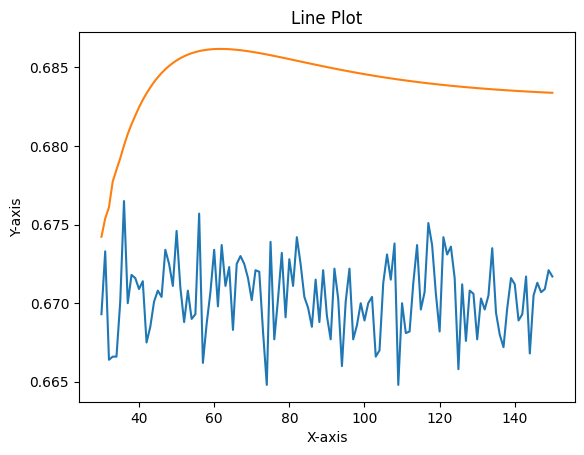

(4, 6)
30
1/1 [==============================] - 0s 63ms/step
31
1/1 [==============================] - 0s 56ms/step
32
1/1 [==============================] - 0s 62ms/step
33
1/1 [==============================] - 0s 59ms/step
34
1/1 [==============================] - 0s 55ms/step
35
1/1 [==============================] - 0s 60ms/step
36
1/1 [==============================] - 0s 28ms/step
37
1/1 [==============================] - 0s 71ms/step
38
1/1 [==============================] - 0s 29ms/step
39
1/1 [==============================] - 0s 29ms/step
40
1/1 [==============================] - 0s 63ms/step
41
1/1 [==============================] - 0s 47ms/step
42
1/1 [==============================] - 0s 61ms/step
43
1/1 [==============================] - 0s 35ms/step
44
1/1 [==============================] - 0s 29ms/step
45
1/1 [==============================] - 0s 50ms/step
46
1/1 [==============================] - 0s 44ms/step
47
1/1 [==============================] - 0s 35ms/step
48


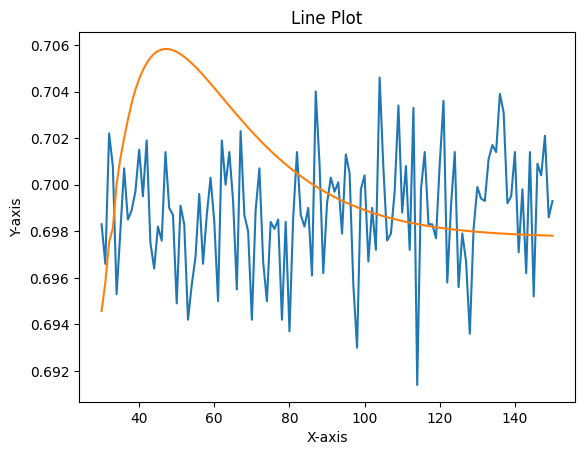

(4, 6)
30
1/1 [==============================] - 0s 31ms/step
31
1/1 [==============================] - 0s 27ms/step
32
1/1 [==============================] - 0s 33ms/step
33
1/1 [==============================] - 0s 27ms/step
34
1/1 [==============================] - 0s 27ms/step
35
1/1 [==============================] - 0s 30ms/step
36
1/1 [==============================] - 0s 45ms/step
37
1/1 [==============================] - 0s 50ms/step
38
1/1 [==============================] - 0s 47ms/step
39
1/1 [==============================] - 0s 37ms/step
40
1/1 [==============================] - 0s 38ms/step
41
1/1 [==============================] - 0s 40ms/step
42
1/1 [==============================] - 0s 42ms/step
43
1/1 [==============================] - 0s 43ms/step
44
1/1 [==============================] - 0s 48ms/step
45
1/1 [==============================] - 0s 62ms/step
46
1/1 [==============================] - 0s 34ms/step
47
1/1 [==============================] - 0s 43ms/step
48


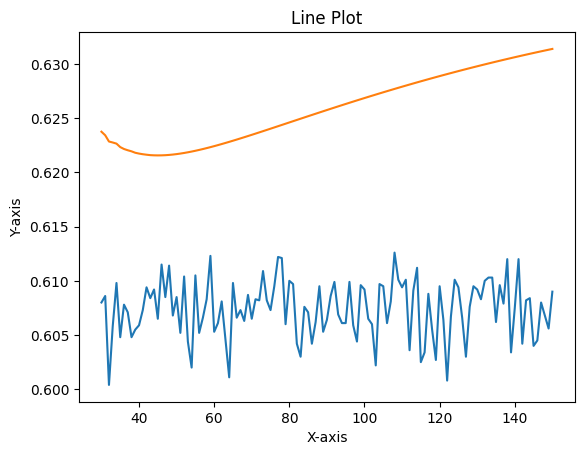

(4, 6)
30
1/1 [==============================] - 0s 27ms/step
31
1/1 [==============================] - 0s 33ms/step
32
1/1 [==============================] - 0s 28ms/step
33
1/1 [==============================] - 0s 32ms/step
34
1/1 [==============================] - 0s 33ms/step
35
1/1 [==============================] - 0s 35ms/step
36
1/1 [==============================] - 0s 38ms/step
37
1/1 [==============================] - 0s 34ms/step
38
1/1 [==============================] - 0s 36ms/step
39
1/1 [==============================] - 0s 35ms/step
40
1/1 [==============================] - 0s 38ms/step
41
1/1 [==============================] - 0s 36ms/step
42
1/1 [==============================] - 0s 33ms/step
43
1/1 [==============================] - 0s 73ms/step
44
1/1 [==============================] - 0s 38ms/step
45
1/1 [==============================] - 0s 37ms/step
46
1/1 [==============================] - 0s 40ms/step
47
1/1 [==============================] - 0s 32ms/step
48


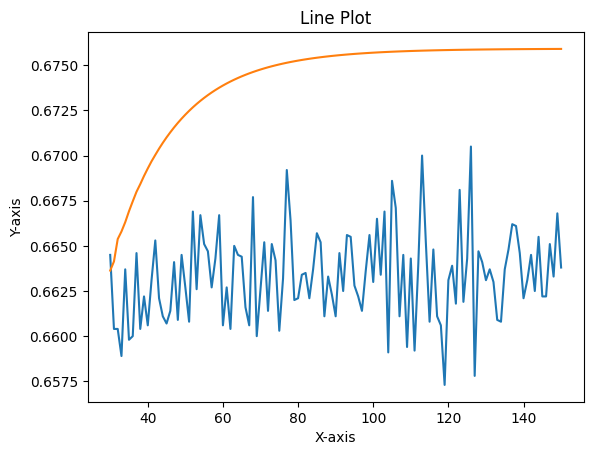

(4, 6)
30
1/1 [==============================] - 0s 39ms/step
31
1/1 [==============================] - 0s 34ms/step
32
1/1 [==============================] - 0s 41ms/step
33
1/1 [==============================] - 0s 38ms/step
34
1/1 [==============================] - 0s 38ms/step
35
1/1 [==============================] - 0s 40ms/step
36
1/1 [==============================] - 0s 37ms/step
37
1/1 [==============================] - 0s 33ms/step
38
1/1 [==============================] - 0s 54ms/step
39
1/1 [==============================] - 0s 41ms/step
40
1/1 [==============================] - 0s 54ms/step
41
1/1 [==============================] - 0s 37ms/step
42
1/1 [==============================] - 0s 37ms/step
43
1/1 [==============================] - 0s 33ms/step
44
1/1 [==============================] - 0s 37ms/step
45
1/1 [==============================] - 0s 35ms/step
46
1/1 [==============================] - 0s 34ms/step
47
1/1 [==============================] - 0s 33ms/step
48


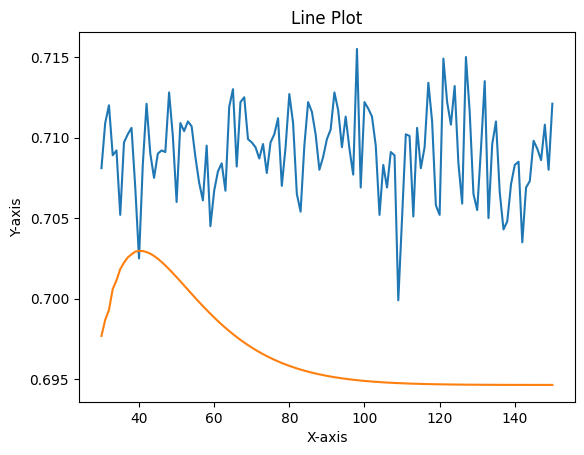

(4, 6)
30
1/1 [==============================] - 0s 29ms/step
31
1/1 [==============================] - 0s 32ms/step
32
1/1 [==============================] - 0s 42ms/step
33
1/1 [==============================] - 0s 58ms/step
34
1/1 [==============================] - 0s 27ms/step
35
1/1 [==============================] - 0s 31ms/step
36
1/1 [==============================] - 0s 27ms/step
37
1/1 [==============================] - 0s 28ms/step
38
1/1 [==============================] - 0s 29ms/step
39
1/1 [==============================] - 0s 29ms/step
40
1/1 [==============================] - 0s 31ms/step
41
1/1 [==============================] - 0s 30ms/step
42
1/1 [==============================] - 0s 31ms/step
43
1/1 [==============================] - 0s 31ms/step
44
1/1 [==============================] - 0s 30ms/step
45
1/1 [==============================] - 0s 40ms/step
46
1/1 [==============================] - 0s 43ms/step
47
1/1 [==============================] - 0s 42ms/step
48


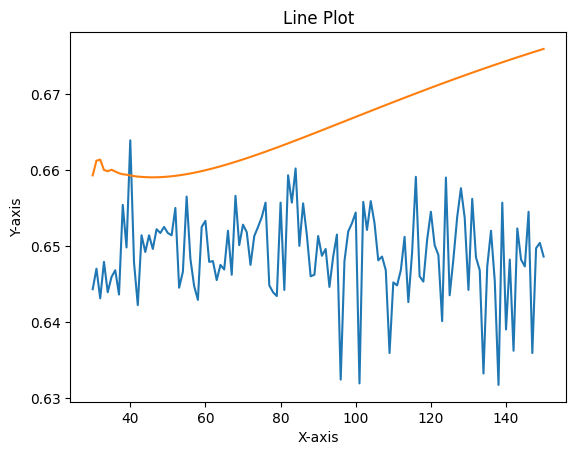

(4, 6)
30
1/1 [==============================] - 0s 35ms/step
31
1/1 [==============================] - 0s 33ms/step
32
1/1 [==============================] - 0s 34ms/step
33
1/1 [==============================] - 0s 35ms/step
34
1/1 [==============================] - 0s 53ms/step
35
1/1 [==============================] - 0s 51ms/step
36
1/1 [==============================] - 0s 39ms/step
37
1/1 [==============================] - 0s 43ms/step
38
1/1 [==============================] - 0s 46ms/step
39
1/1 [==============================] - 0s 48ms/step
40
1/1 [==============================] - 0s 31ms/step
41
1/1 [==============================] - 0s 32ms/step
42
1/1 [==============================] - 0s 29ms/step
43
1/1 [==============================] - 0s 29ms/step
44
1/1 [==============================] - 0s 36ms/step
45
1/1 [==============================] - 0s 29ms/step
46
1/1 [==============================] - 0s 30ms/step
47
1/1 [==============================] - 0s 28ms/step
48


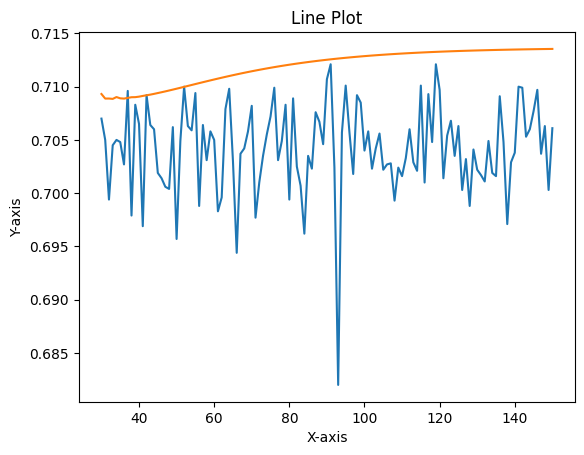

(4, 6)
30
1/1 [==============================] - 0s 30ms/step
31
1/1 [==============================] - 0s 28ms/step
32
1/1 [==============================] - 0s 29ms/step
33
1/1 [==============================] - 0s 27ms/step
34
1/1 [==============================] - 0s 64ms/step
35
1/1 [==============================] - 0s 28ms/step
36
1/1 [==============================] - 0s 27ms/step
37
1/1 [==============================] - 0s 28ms/step
38
1/1 [==============================] - 0s 29ms/step
39
1/1 [==============================] - 0s 65ms/step
40
1/1 [==============================] - 0s 46ms/step
41
1/1 [==============================] - 0s 43ms/step
42
1/1 [==============================] - 0s 50ms/step
43
1/1 [==============================] - 0s 57ms/step
44
1/1 [==============================] - 0s 51ms/step
45
1/1 [==============================] - 0s 31ms/step
46
1/1 [==============================] - 0s 28ms/step
47
1/1 [==============================] - 0s 41ms/step
48


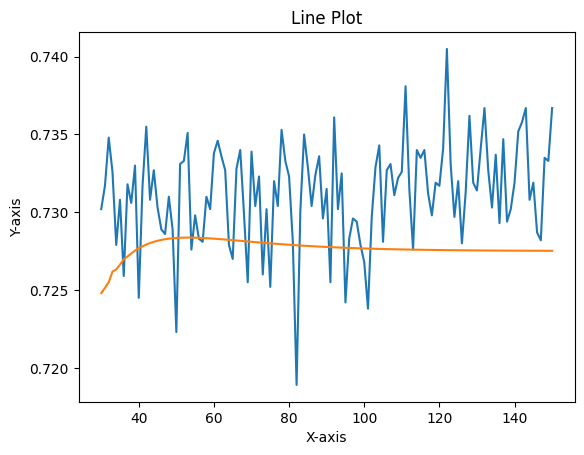

(4, 6)
30
1/1 [==============================] - 0s 36ms/step
31
1/1 [==============================] - 0s 29ms/step
32
1/1 [==============================] - 0s 29ms/step
33
1/1 [==============================] - 0s 30ms/step
34
1/1 [==============================] - 0s 27ms/step
35
1/1 [==============================] - 0s 37ms/step
36
1/1 [==============================] - 0s 31ms/step
37
1/1 [==============================] - 0s 27ms/step
38
1/1 [==============================] - 0s 42ms/step
39
1/1 [==============================] - 0s 45ms/step
40
1/1 [==============================] - 0s 43ms/step
41
1/1 [==============================] - 0s 31ms/step
42
1/1 [==============================] - 0s 29ms/step
43
1/1 [==============================] - 0s 28ms/step
44
1/1 [==============================] - 0s 29ms/step
45
1/1 [==============================] - 0s 28ms/step
46
1/1 [==============================] - 0s 42ms/step
47
1/1 [==============================] - 0s 29ms/step
48


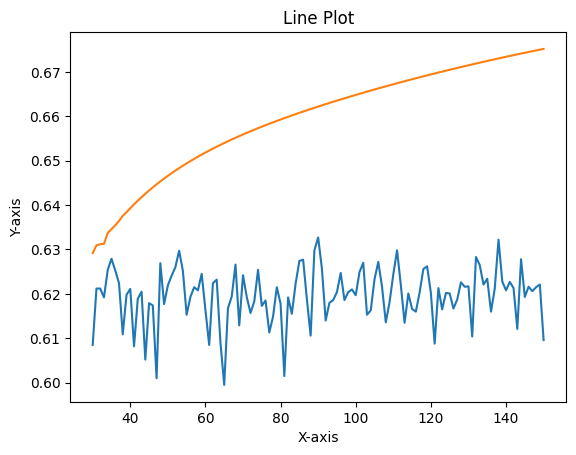

(4, 6)
30
1/1 [==============================] - 0s 65ms/step
31
1/1 [==============================] - 0s 34ms/step
32
1/1 [==============================] - 0s 29ms/step
33
1/1 [==============================] - 0s 34ms/step
34
1/1 [==============================] - 0s 28ms/step
35
1/1 [==============================] - 0s 29ms/step
36
1/1 [==============================] - 0s 28ms/step
37
1/1 [==============================] - 0s 28ms/step
38
1/1 [==============================] - 0s 35ms/step
39
1/1 [==============================] - 0s 31ms/step
40
1/1 [==============================] - 0s 27ms/step
41
1/1 [==============================] - 0s 29ms/step
42
1/1 [==============================] - 0s 28ms/step
43
1/1 [==============================] - 0s 29ms/step
44
1/1 [==============================] - 0s 30ms/step
45
1/1 [==============================] - 0s 52ms/step
46
1/1 [==============================] - 0s 41ms/step
47
1/1 [==============================] - 0s 29ms/step
48


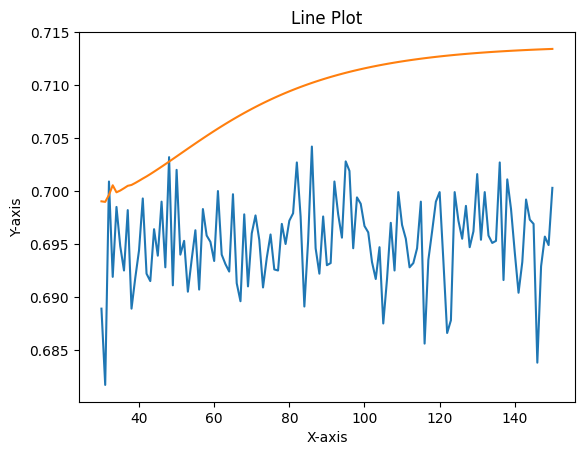

(4, 6)
30
1/1 [==============================] - 0s 34ms/step
31
1/1 [==============================] - 0s 29ms/step
32
1/1 [==============================] - 0s 30ms/step
33
1/1 [==============================] - 0s 29ms/step
34
1/1 [==============================] - 0s 28ms/step
35
1/1 [==============================] - 0s 28ms/step
36
1/1 [==============================] - 0s 29ms/step
37
1/1 [==============================] - 0s 66ms/step
38
1/1 [==============================] - 0s 39ms/step
39
1/1 [==============================] - 0s 26ms/step
40
1/1 [==============================] - 0s 27ms/step
41
1/1 [==============================] - 0s 26ms/step
42
1/1 [==============================] - 0s 27ms/step
43
1/1 [==============================] - 0s 27ms/step
44
1/1 [==============================] - 0s 29ms/step
45
1/1 [==============================] - 0s 29ms/step
46
1/1 [==============================] - 0s 27ms/step
47
1/1 [==============================] - 0s 29ms/step
48


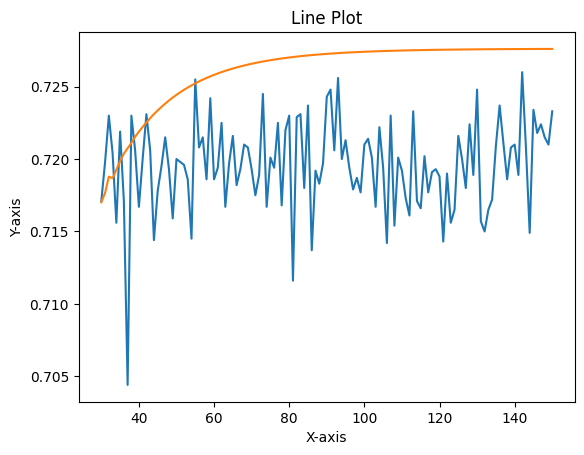

(4, 6)
30
1/1 [==============================] - 0s 65ms/step
31
1/1 [==============================] - 0s 61ms/step
32
1/1 [==============================] - 0s 53ms/step
33
1/1 [==============================] - 0s 50ms/step
34
1/1 [==============================] - 0s 47ms/step
35
1/1 [==============================] - 0s 46ms/step
36
1/1 [==============================] - 0s 60ms/step
37
1/1 [==============================] - 0s 46ms/step
38
1/1 [==============================] - 0s 61ms/step
39
1/1 [==============================] - 0s 60ms/step
40
1/1 [==============================] - 0s 56ms/step
41
1/1 [==============================] - 0s 59ms/step
42
1/1 [==============================] - 0s 59ms/step
43
1/1 [==============================] - 0s 42ms/step
44
1/1 [==============================] - 0s 63ms/step
45
1/1 [==============================] - 0s 41ms/step
46
1/1 [==============================] - 0s 42ms/step
47
1/1 [==============================] - 0s 61ms/step
48


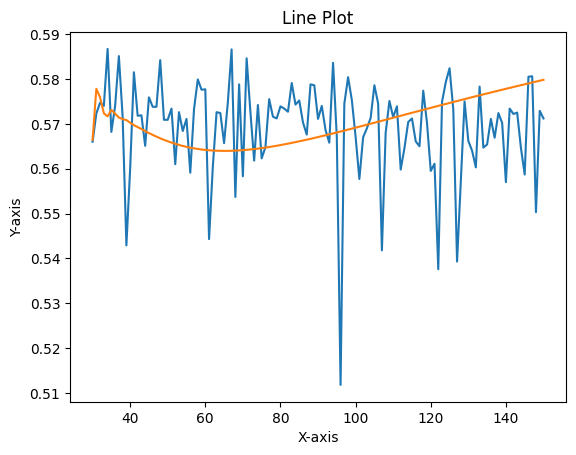

(4, 6)
30
1/1 [==============================] - 0s 31ms/step
31
1/1 [==============================] - 0s 27ms/step
32
1/1 [==============================] - 0s 39ms/step
33
1/1 [==============================] - 0s 26ms/step
34
1/1 [==============================] - 0s 28ms/step
35
1/1 [==============================] - 0s 28ms/step
36
1/1 [==============================] - 0s 30ms/step
37
1/1 [==============================] - 0s 40ms/step
38
1/1 [==============================] - 0s 39ms/step
39
1/1 [==============================] - 0s 35ms/step
40
1/1 [==============================] - 0s 38ms/step
41
1/1 [==============================] - 0s 50ms/step
42
1/1 [==============================] - 0s 49ms/step
43
1/1 [==============================] - 0s 60ms/step
44
1/1 [==============================] - 0s 63ms/step
45
1/1 [==============================] - 0s 40ms/step
46
1/1 [==============================] - 0s 41ms/step
47
1/1 [==============================] - 0s 44ms/step
48


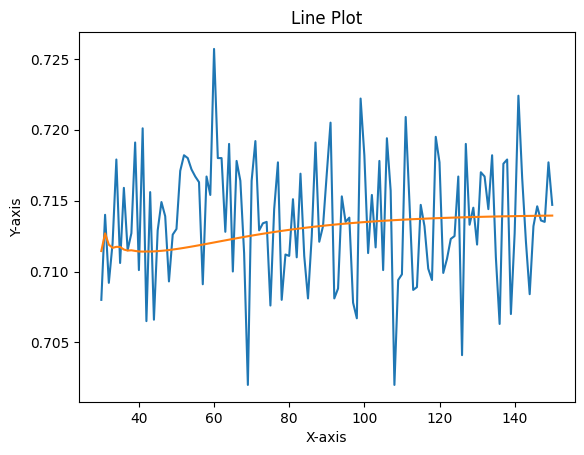

(4, 6)
30
1/1 [==============================] - 0s 27ms/step
31
1/1 [==============================] - 0s 37ms/step
32
1/1 [==============================] - 0s 46ms/step
33
1/1 [==============================] - 0s 31ms/step
34
1/1 [==============================] - 0s 35ms/step
35
1/1 [==============================] - 0s 27ms/step
36
1/1 [==============================] - 0s 30ms/step
37
1/1 [==============================] - 0s 36ms/step
38
1/1 [==============================] - 0s 58ms/step
39
1/1 [==============================] - 0s 33ms/step
40
1/1 [==============================] - 0s 34ms/step
41
1/1 [==============================] - 0s 28ms/step
42
1/1 [==============================] - 0s 33ms/step
43
1/1 [==============================] - 0s 41ms/step
44
1/1 [==============================] - 0s 29ms/step
45
1/1 [==============================] - 0s 30ms/step
46
1/1 [==============================] - 0s 30ms/step
47
1/1 [==============================] - 0s 29ms/step
48


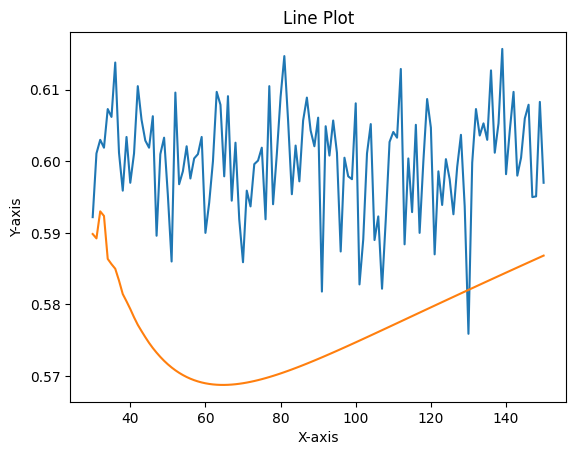

(4, 6)
30
1/1 [==============================] - 0s 27ms/step
31
1/1 [==============================] - 0s 26ms/step
32
1/1 [==============================] - 0s 27ms/step
33
1/1 [==============================] - 0s 27ms/step
34
1/1 [==============================] - 0s 26ms/step
35
1/1 [==============================] - 0s 43ms/step
36
1/1 [==============================] - 0s 56ms/step
37
1/1 [==============================] - 0s 53ms/step
38
1/1 [==============================] - 0s 33ms/step
39
1/1 [==============================] - 0s 29ms/step
40
1/1 [==============================] - 0s 28ms/step
41
1/1 [==============================] - 0s 32ms/step
42
1/1 [==============================] - 0s 28ms/step
43
1/1 [==============================] - 0s 29ms/step
44
1/1 [==============================] - 0s 28ms/step
45
1/1 [==============================] - 0s 28ms/step
46
1/1 [==============================] - 0s 46ms/step
47
1/1 [==============================] - 0s 28ms/step
48


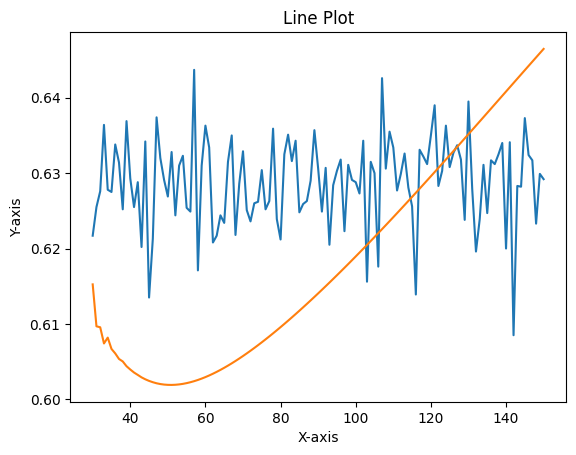

(4, 6)
30
1/1 [==============================] - 0s 54ms/step
31
1/1 [==============================] - 0s 38ms/step
32
1/1 [==============================] - 0s 41ms/step
33
1/1 [==============================] - 0s 37ms/step
34
1/1 [==============================] - 0s 52ms/step
35
1/1 [==============================] - 0s 46ms/step
36
1/1 [==============================] - 0s 74ms/step
37
1/1 [==============================] - 0s 35ms/step
38
1/1 [==============================] - 0s 37ms/step
39
1/1 [==============================] - 0s 34ms/step
40
1/1 [==============================] - 0s 39ms/step
41
1/1 [==============================] - 0s 37ms/step
42
1/1 [==============================] - 0s 39ms/step
43
1/1 [==============================] - 0s 39ms/step
44
1/1 [==============================] - 0s 37ms/step
45
1/1 [==============================] - 0s 37ms/step
46
1/1 [==============================] - 0s 42ms/step
47
1/1 [==============================] - 0s 42ms/step
48


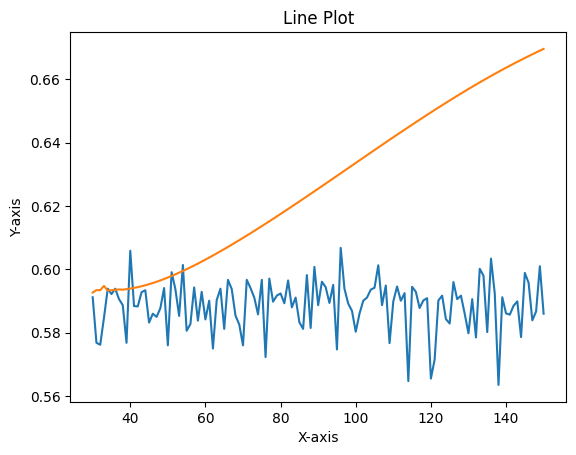

(4, 6)
30
1/1 [==============================] - 0s 69ms/step
31
1/1 [==============================] - 0s 50ms/step
32
1/1 [==============================] - 0s 55ms/step
33
1/1 [==============================] - 0s 38ms/step
34
1/1 [==============================] - 0s 74ms/step
35
1/1 [==============================] - 0s 64ms/step
36
1/1 [==============================] - 0s 69ms/step
37
1/1 [==============================] - 0s 70ms/step
38
1/1 [==============================] - 0s 66ms/step
39
1/1 [==============================] - 0s 60ms/step
40
1/1 [==============================] - 0s 70ms/step
41
1/1 [==============================] - 0s 45ms/step
42
1/1 [==============================] - 0s 37ms/step
43
1/1 [==============================] - 0s 50ms/step
44
1/1 [==============================] - 0s 66ms/step
45
1/1 [==============================] - 0s 70ms/step
46
1/1 [==============================] - 0s 60ms/step
47
1/1 [==============================] - 0s 36ms/step
48


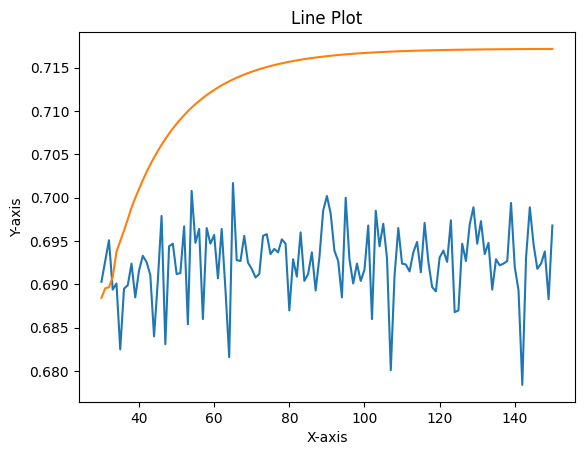

(4, 6)
30
1/1 [==============================] - 0s 44ms/step
31
1/1 [==============================] - 0s 44ms/step
32
1/1 [==============================] - 0s 39ms/step
33
1/1 [==============================] - 0s 37ms/step
34
1/1 [==============================] - 0s 61ms/step
35
1/1 [==============================] - 0s 64ms/step
36
1/1 [==============================] - 0s 46ms/step
37
1/1 [==============================] - 0s 46ms/step
38
1/1 [==============================] - 0s 69ms/step
39
1/1 [==============================] - 0s 45ms/step
40
1/1 [==============================] - 0s 52ms/step
41
1/1 [==============================] - 0s 43ms/step
42
1/1 [==============================] - 0s 43ms/step
43
1/1 [==============================] - 0s 56ms/step
44
1/1 [==============================] - 0s 40ms/step
45
1/1 [==============================] - 0s 29ms/step
46
1/1 [==============================] - 0s 57ms/step
47
1/1 [==============================] - 0s 61ms/step
48


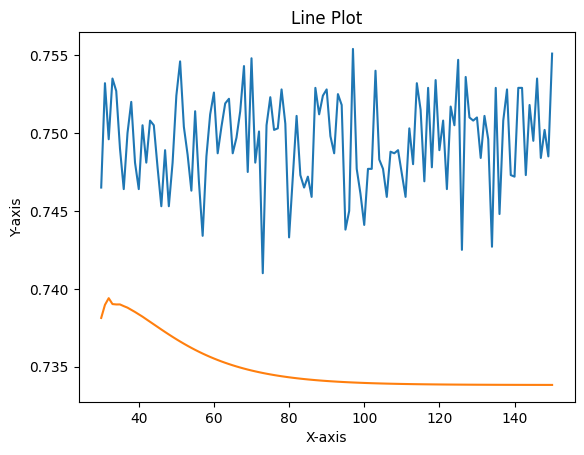

(4, 6)
30
1/1 [==============================] - 0s 30ms/step
31
1/1 [==============================] - 0s 29ms/step
32
1/1 [==============================] - 0s 40ms/step
33
1/1 [==============================] - 0s 29ms/step
34
1/1 [==============================] - 0s 30ms/step
35
1/1 [==============================] - 0s 48ms/step
36
1/1 [==============================] - 0s 49ms/step
37
1/1 [==============================] - 0s 31ms/step
38
1/1 [==============================] - 0s 29ms/step
39
1/1 [==============================] - 0s 29ms/step
40
1/1 [==============================] - 0s 31ms/step
41
1/1 [==============================] - 0s 31ms/step
42
1/1 [==============================] - 0s 39ms/step
43
1/1 [==============================] - 0s 30ms/step
44
1/1 [==============================] - 0s 30ms/step
45
1/1 [==============================] - 0s 29ms/step
46
1/1 [==============================] - 0s 29ms/step
47
1/1 [==============================] - 0s 27ms/step
48


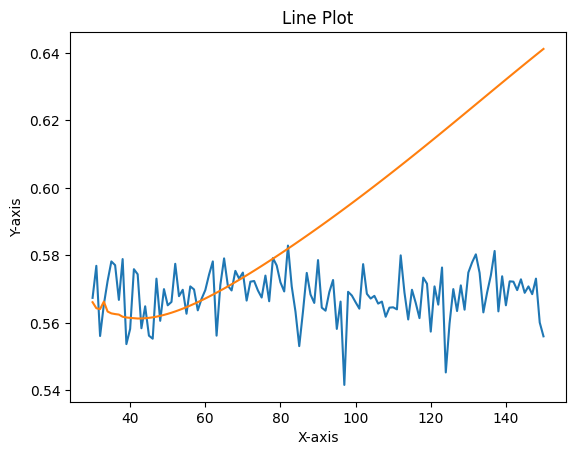

(4, 6)
30
1/1 [==============================] - 0s 30ms/step
31
1/1 [==============================] - 0s 29ms/step
32
1/1 [==============================] - 0s 27ms/step
33
1/1 [==============================] - 0s 27ms/step
34
1/1 [==============================] - 0s 29ms/step
35
1/1 [==============================] - 0s 32ms/step
36
1/1 [==============================] - 0s 27ms/step
37
1/1 [==============================] - 0s 56ms/step
38
1/1 [==============================] - 0s 29ms/step
39
1/1 [==============================] - 0s 26ms/step
40
1/1 [==============================] - 0s 29ms/step
41
1/1 [==============================] - 0s 32ms/step
42
1/1 [==============================] - 0s 27ms/step
43
1/1 [==============================] - 0s 28ms/step
44
1/1 [==============================] - 0s 28ms/step
45
1/1 [==============================] - 0s 28ms/step
46
1/1 [==============================] - 0s 29ms/step
47
1/1 [==============================] - 0s 28ms/step
48


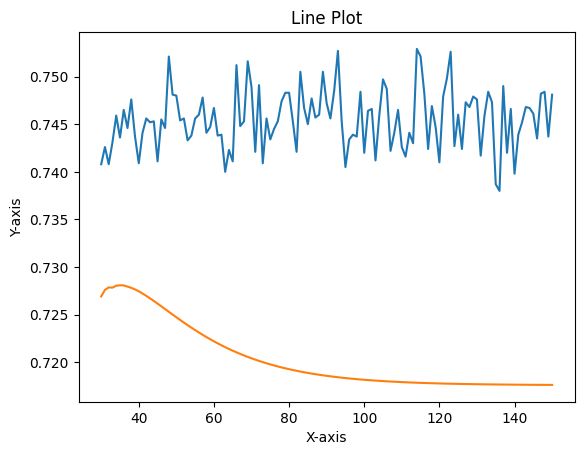

(4, 6)
30
1/1 [==============================] - 0s 27ms/step
31
1/1 [==============================] - 0s 38ms/step
32
1/1 [==============================] - 0s 29ms/step
33
1/1 [==============================] - 0s 27ms/step
34
1/1 [==============================] - 0s 29ms/step
35
1/1 [==============================] - 0s 28ms/step
36
1/1 [==============================] - 0s 28ms/step
37
1/1 [==============================] - 0s 49ms/step
38
1/1 [==============================] - 0s 45ms/step
39
1/1 [==============================] - 0s 39ms/step
40
1/1 [==============================] - 0s 28ms/step
41
1/1 [==============================] - 0s 27ms/step
42
1/1 [==============================] - 0s 27ms/step
43
1/1 [==============================] - 0s 28ms/step
44
1/1 [==============================] - 0s 29ms/step
45
1/1 [==============================] - 0s 31ms/step
46
1/1 [==============================] - 0s 27ms/step
47
1/1 [==============================] - 0s 26ms/step
48


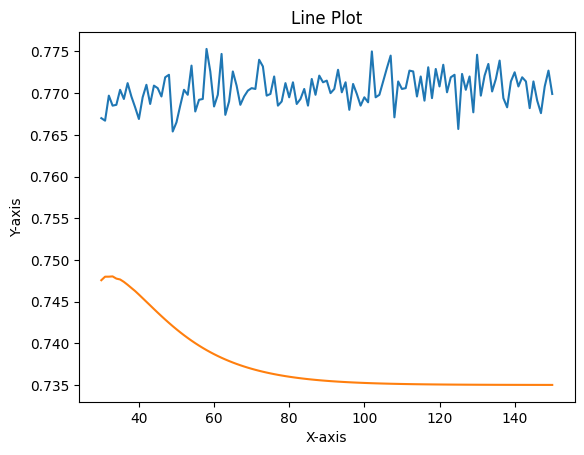

(4, 6)
30
1/1 [==============================] - 0s 34ms/step
31
1/1 [==============================] - 0s 54ms/step
32
1/1 [==============================] - 0s 57ms/step
33
1/1 [==============================] - 0s 55ms/step
34
1/1 [==============================] - 0s 56ms/step
35
1/1 [==============================] - 0s 44ms/step
36
1/1 [==============================] - 0s 60ms/step
37
1/1 [==============================] - 0s 31ms/step
38
1/1 [==============================] - 0s 61ms/step
39
1/1 [==============================] - 0s 30ms/step
40
1/1 [==============================] - 0s 29ms/step
41
1/1 [==============================] - 0s 68ms/step
42
1/1 [==============================] - 0s 40ms/step
43
1/1 [==============================] - 0s 43ms/step
44
1/1 [==============================] - 0s 44ms/step
45
1/1 [==============================] - 0s 44ms/step
46
1/1 [==============================] - 0s 42ms/step
47
1/1 [==============================] - 0s 34ms/step
48


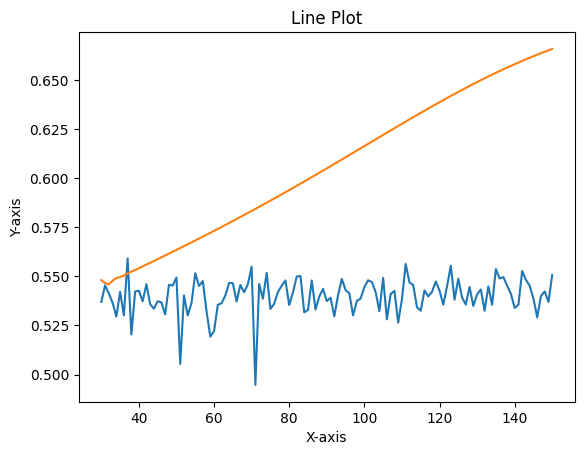

(4, 6)
30
1/1 [==============================] - 0s 28ms/step
31
1/1 [==============================] - 0s 28ms/step
32
1/1 [==============================] - 0s 28ms/step
33
1/1 [==============================] - 0s 29ms/step
34
1/1 [==============================] - 0s 41ms/step
35
1/1 [==============================] - 0s 59ms/step
36
1/1 [==============================] - 0s 61ms/step
37
1/1 [==============================] - 0s 28ms/step
38
1/1 [==============================] - 0s 27ms/step
39
1/1 [==============================] - 0s 32ms/step
40
1/1 [==============================] - 0s 29ms/step
41
1/1 [==============================] - 0s 27ms/step
42
1/1 [==============================] - 0s 29ms/step
43
1/1 [==============================] - 0s 30ms/step
44
1/1 [==============================] - 0s 29ms/step
45
1/1 [==============================] - 0s 31ms/step
46
1/1 [==============================] - 0s 29ms/step
47
1/1 [==============================] - 0s 28ms/step
48


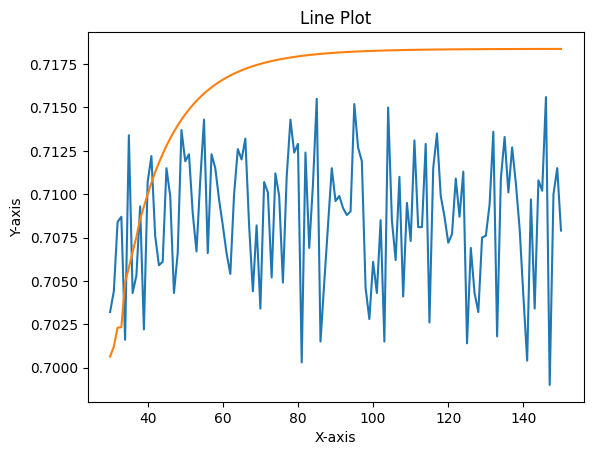

(4, 6)
30
1/1 [==============================] - 0s 29ms/step
31
1/1 [==============================] - 0s 26ms/step
32
1/1 [==============================] - 0s 31ms/step
33
1/1 [==============================] - 0s 27ms/step
34
1/1 [==============================] - 0s 32ms/step
35
1/1 [==============================] - 0s 28ms/step
36
1/1 [==============================] - 0s 29ms/step
37
1/1 [==============================] - 0s 66ms/step
38
1/1 [==============================] - 0s 42ms/step
39
1/1 [==============================] - 0s 34ms/step
40
1/1 [==============================] - 0s 28ms/step
41
1/1 [==============================] - 0s 30ms/step
42
1/1 [==============================] - 0s 29ms/step
43
1/1 [==============================] - 0s 28ms/step
44
1/1 [==============================] - 0s 28ms/step
45
1/1 [==============================] - 0s 29ms/step
46
1/1 [==============================] - 0s 28ms/step
47
1/1 [==============================] - 0s 30ms/step
48


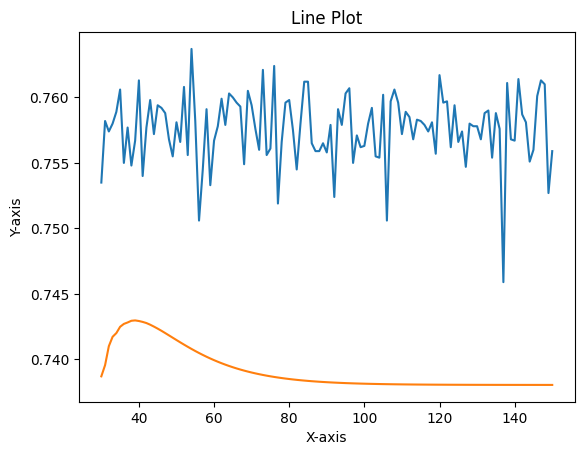

(4, 6)
30
1/1 [==============================] - 0s 29ms/step
31
1/1 [==============================] - 0s 28ms/step
32
1/1 [==============================] - 0s 31ms/step
33
1/1 [==============================] - 0s 31ms/step
34
1/1 [==============================] - 0s 27ms/step
35
1/1 [==============================] - 0s 29ms/step
36
1/1 [==============================] - 0s 27ms/step
37
1/1 [==============================] - 0s 45ms/step
38
1/1 [==============================] - 0s 57ms/step
39
1/1 [==============================] - 0s 36ms/step
40
1/1 [==============================] - 0s 27ms/step
41
1/1 [==============================] - 0s 29ms/step
42
1/1 [==============================] - 0s 29ms/step
43
1/1 [==============================] - 0s 29ms/step
44
1/1 [==============================] - 0s 28ms/step
45
1/1 [==============================] - 0s 27ms/step
46
1/1 [==============================] - 0s 31ms/step
47
1/1 [==============================] - 0s 28ms/step
48


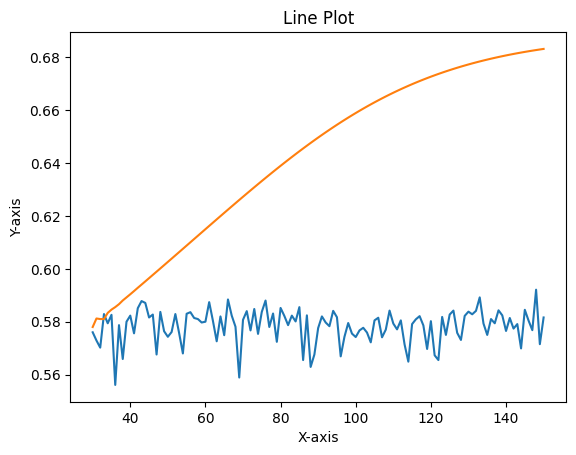

(4, 6)
30
1/1 [==============================] - 0s 63ms/step
31
1/1 [==============================] - 0s 50ms/step
32
1/1 [==============================] - 0s 61ms/step
33
1/1 [==============================] - 0s 44ms/step
34
1/1 [==============================] - 0s 61ms/step
35
1/1 [==============================] - 0s 49ms/step
36
1/1 [==============================] - 0s 40ms/step
37
1/1 [==============================] - 0s 42ms/step
38
1/1 [==============================] - 0s 58ms/step
39
1/1 [==============================] - 0s 65ms/step
40
1/1 [==============================] - 0s 67ms/step
41
1/1 [==============================] - 0s 49ms/step
42
1/1 [==============================] - 0s 43ms/step
43
1/1 [==============================] - 0s 28ms/step
44
1/1 [==============================] - 0s 29ms/step
45
1/1 [==============================] - 0s 29ms/step
46
1/1 [==============================] - 0s 43ms/step
47
1/1 [==============================] - 0s 30ms/step
48


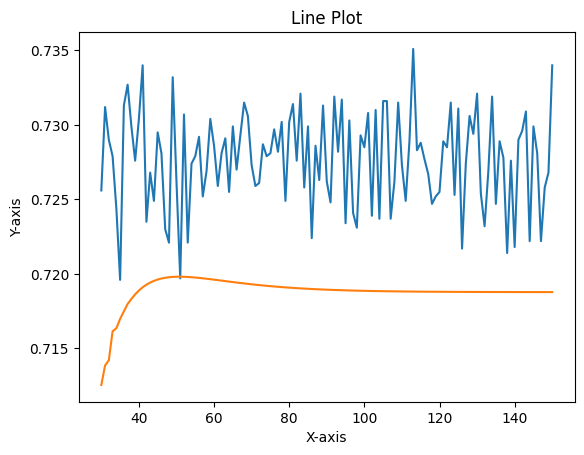

(4, 6)
30
1/1 [==============================] - 0s 34ms/step
31
1/1 [==============================] - 0s 55ms/step
32
1/1 [==============================] - 0s 59ms/step
33
1/1 [==============================] - 0s 35ms/step
34
1/1 [==============================] - 0s 28ms/step
35
1/1 [==============================] - 0s 30ms/step
36
1/1 [==============================] - 0s 48ms/step
37
1/1 [==============================] - 0s 56ms/step
38
1/1 [==============================] - 0s 33ms/step
39
1/1 [==============================] - 0s 33ms/step
40
1/1 [==============================] - 0s 30ms/step
41
1/1 [==============================] - 0s 63ms/step
42
1/1 [==============================] - 0s 46ms/step
43
1/1 [==============================] - 0s 61ms/step
44
1/1 [==============================] - 0s 41ms/step
45
1/1 [==============================] - 0s 29ms/step
46
1/1 [==============================] - 0s 29ms/step
47
1/1 [==============================] - 0s 27ms/step
48


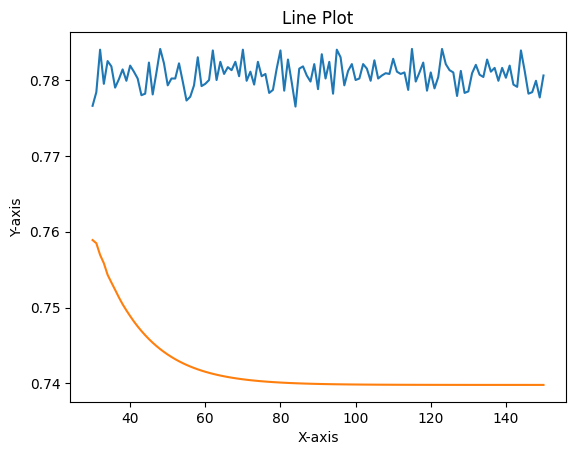

(4, 6)
30
1/1 [==============================] - 0s 39ms/step
31
1/1 [==============================] - 0s 80ms/step
32
1/1 [==============================] - 0s 47ms/step
33
1/1 [==============================] - 0s 37ms/step
34
1/1 [==============================] - 0s 42ms/step
35
1/1 [==============================] - 0s 40ms/step
36
1/1 [==============================] - 0s 41ms/step
37
1/1 [==============================] - 0s 43ms/step
38
1/1 [==============================] - 0s 39ms/step
39
1/1 [==============================] - 0s 38ms/step
40
1/1 [==============================] - 0s 34ms/step
41
1/1 [==============================] - 0s 40ms/step
42
1/1 [==============================] - 0s 41ms/step
43
1/1 [==============================] - 0s 57ms/step
44
1/1 [==============================] - 0s 43ms/step
45
1/1 [==============================] - 0s 38ms/step
46
1/1 [==============================] - 0s 38ms/step
47
1/1 [==============================] - 0s 39ms/step
48


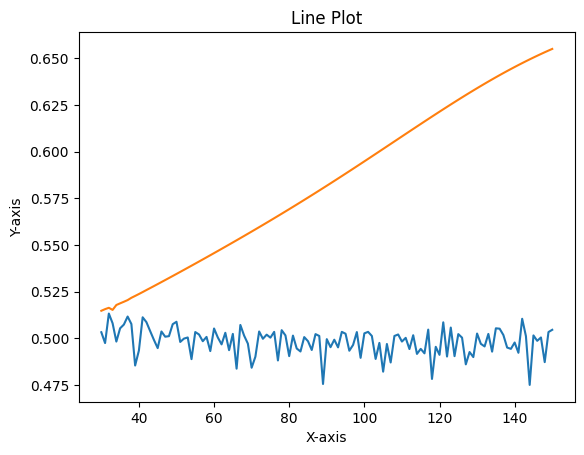

(4, 6)
30
1/1 [==============================] - 0s 42ms/step
31
1/1 [==============================] - 0s 35ms/step
32
1/1 [==============================] - 0s 37ms/step
33
1/1 [==============================] - 0s 38ms/step
34
1/1 [==============================] - 0s 32ms/step
35
1/1 [==============================] - 0s 27ms/step
36
1/1 [==============================] - 0s 27ms/step
37
1/1 [==============================] - 0s 28ms/step
38
1/1 [==============================] - 0s 28ms/step
39
1/1 [==============================] - 0s 28ms/step
40
1/1 [==============================] - 0s 27ms/step
41
1/1 [==============================] - 0s 29ms/step
42
1/1 [==============================] - 0s 28ms/step
43
1/1 [==============================] - 0s 39ms/step
44
1/1 [==============================] - 0s 27ms/step
45
1/1 [==============================] - 0s 28ms/step
46
1/1 [==============================] - 0s 29ms/step
47
1/1 [==============================] - 0s 28ms/step
48


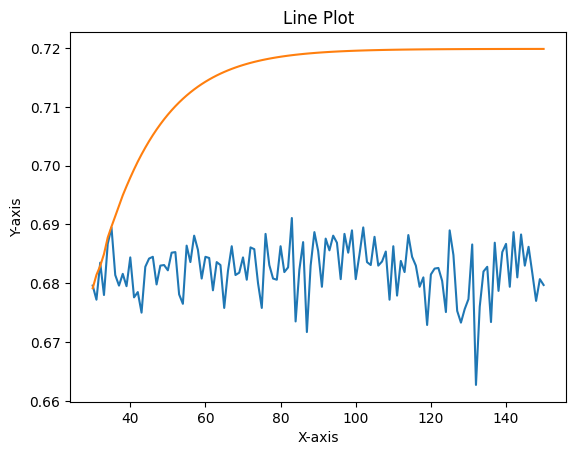

(4, 6)
30
1/1 [==============================] - 0s 27ms/step
31
1/1 [==============================] - 0s 63ms/step
32
1/1 [==============================] - 0s 45ms/step
33
1/1 [==============================] - 0s 30ms/step
34
1/1 [==============================] - 0s 28ms/step
35
1/1 [==============================] - 0s 31ms/step
36
1/1 [==============================] - 0s 46ms/step
37
1/1 [==============================] - 0s 28ms/step
38
1/1 [==============================] - 0s 29ms/step
39
1/1 [==============================] - 0s 29ms/step
40
1/1 [==============================] - 0s 27ms/step
41
1/1 [==============================] - 0s 32ms/step
42
1/1 [==============================] - 0s 29ms/step
43
1/1 [==============================] - 0s 28ms/step
44
1/1 [==============================] - 0s 29ms/step
45
1/1 [==============================] - 0s 32ms/step
46
1/1 [==============================] - 0s 49ms/step
47
1/1 [==============================] - 0s 55ms/step
48


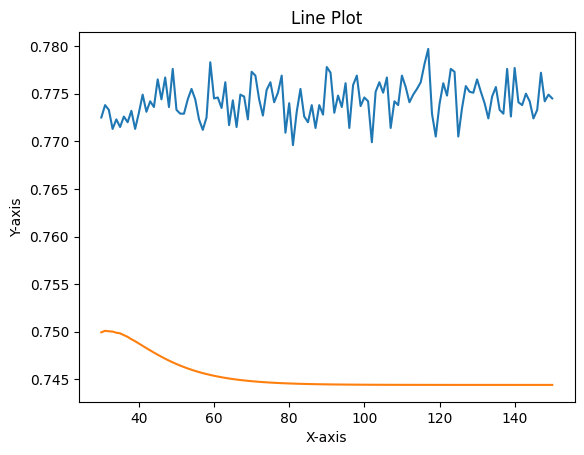

(4, 6)
30
1/1 [==============================] - 0s 39ms/step
31
1/1 [==============================] - 0s 34ms/step
32
1/1 [==============================] - 0s 29ms/step
33
1/1 [==============================] - 0s 27ms/step
34
1/1 [==============================] - 0s 28ms/step
35
1/1 [==============================] - 0s 63ms/step
36
1/1 [==============================] - 0s 47ms/step
37
1/1 [==============================] - 0s 49ms/step
38
1/1 [==============================] - 0s 34ms/step
39
1/1 [==============================] - 0s 50ms/step
40
1/1 [==============================] - 0s 62ms/step
41
1/1 [==============================] - 0s 61ms/step
42
1/1 [==============================] - 0s 65ms/step
43
1/1 [==============================] - 0s 38ms/step
44
1/1 [==============================] - 0s 36ms/step
45
1/1 [==============================] - 0s 28ms/step
46
1/1 [==============================] - 0s 28ms/step
47
1/1 [==============================] - 0s 26ms/step
48


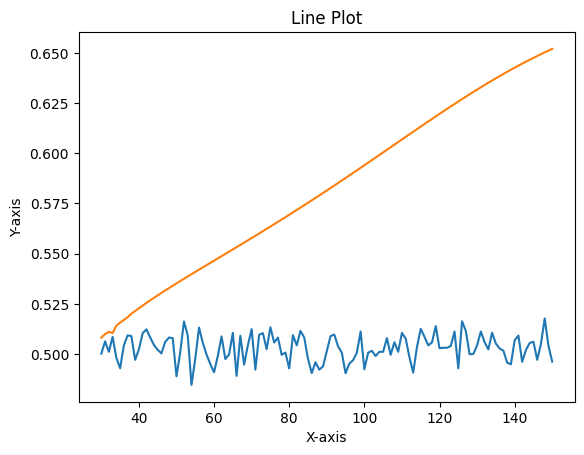

(4, 6)
30
1/1 [==============================] - 0s 63ms/step
31
1/1 [==============================] - 0s 61ms/step
32
1/1 [==============================] - 0s 57ms/step
33
1/1 [==============================] - 0s 32ms/step
34
1/1 [==============================] - 0s 26ms/step
35
1/1 [==============================] - 0s 27ms/step
36
1/1 [==============================] - 0s 60ms/step
37
1/1 [==============================] - 0s 32ms/step
38
1/1 [==============================] - 0s 30ms/step
39
1/1 [==============================] - 0s 44ms/step
40
1/1 [==============================] - 0s 70ms/step
41
1/1 [==============================] - 0s 34ms/step
42
1/1 [==============================] - 0s 29ms/step
43
1/1 [==============================] - 0s 38ms/step
44
1/1 [==============================] - 0s 42ms/step
45
1/1 [==============================] - 0s 32ms/step
46
1/1 [==============================] - 0s 51ms/step
47
1/1 [==============================] - 0s 44ms/step
48


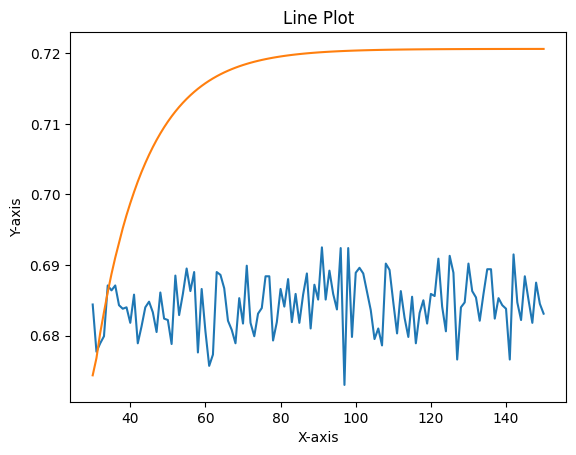

(4, 6)
30
1/1 [==============================] - 0s 28ms/step
31
1/1 [==============================] - 0s 27ms/step
32
1/1 [==============================] - 0s 30ms/step
33
1/1 [==============================] - 0s 28ms/step
34
1/1 [==============================] - 0s 29ms/step
35
1/1 [==============================] - 0s 29ms/step
36
1/1 [==============================] - 0s 31ms/step
37
1/1 [==============================] - 0s 27ms/step
38
1/1 [==============================] - 0s 27ms/step
39
1/1 [==============================] - 0s 29ms/step
40
1/1 [==============================] - 0s 29ms/step
41
1/1 [==============================] - 0s 29ms/step
42
1/1 [==============================] - 0s 29ms/step
43
1/1 [==============================] - 0s 30ms/step
44
1/1 [==============================] - 0s 28ms/step
45
1/1 [==============================] - 0s 58ms/step
46
1/1 [==============================] - 0s 35ms/step
47
1/1 [==============================] - 0s 28ms/step
48


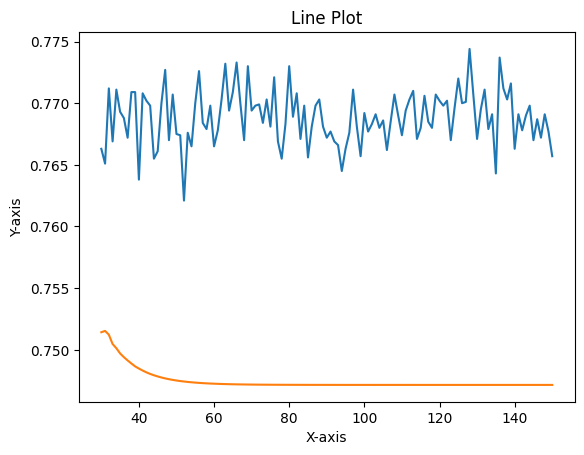

(4, 6)
30
1/1 [==============================] - 0s 36ms/step
31
1/1 [==============================] - 0s 27ms/step
32
1/1 [==============================] - 0s 29ms/step
33
1/1 [==============================] - 0s 31ms/step
34
1/1 [==============================] - 0s 28ms/step
35
1/1 [==============================] - 0s 27ms/step
36
1/1 [==============================] - 0s 58ms/step
37
1/1 [==============================] - 0s 42ms/step
38
1/1 [==============================] - 0s 28ms/step
39
1/1 [==============================] - 0s 29ms/step
40
1/1 [==============================] - 0s 28ms/step
41
1/1 [==============================] - 0s 32ms/step
42
1/1 [==============================] - 0s 26ms/step
43
1/1 [==============================] - 0s 26ms/step
44
1/1 [==============================] - 0s 29ms/step
45
1/1 [==============================] - 0s 26ms/step
46
1/1 [==============================] - 0s 30ms/step
47
1/1 [==============================] - 0s 31ms/step
48


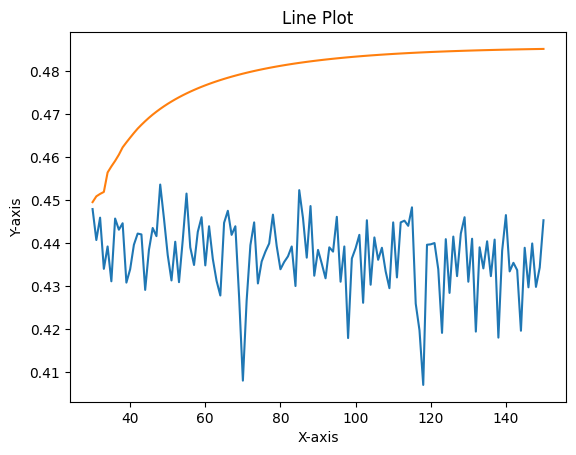

(4, 6)
30
1/1 [==============================] - 0s 32ms/step
31
1/1 [==============================] - 0s 28ms/step
32
1/1 [==============================] - 0s 29ms/step
33
1/1 [==============================] - 0s 28ms/step
34
1/1 [==============================] - 0s 31ms/step
35
1/1 [==============================] - 0s 29ms/step
36
1/1 [==============================] - 0s 28ms/step
37
1/1 [==============================] - 0s 57ms/step
38
1/1 [==============================] - 0s 32ms/step
39
1/1 [==============================] - 0s 42ms/step
40
1/1 [==============================] - 0s 38ms/step
41
1/1 [==============================] - 0s 50ms/step
42
1/1 [==============================] - 0s 30ms/step
43
1/1 [==============================] - 0s 30ms/step
44
1/1 [==============================] - 0s 31ms/step
45
1/1 [==============================] - 0s 30ms/step
46
1/1 [==============================] - 0s 27ms/step
47
1/1 [==============================] - 0s 36ms/step
48


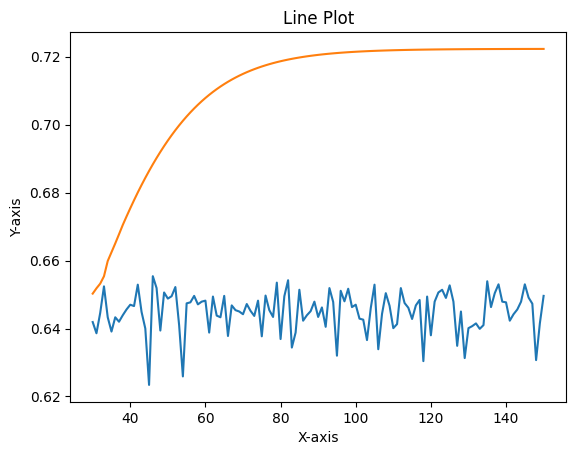

(4, 6)
30
1/1 [==============================] - 0s 48ms/step
31
1/1 [==============================] - 0s 57ms/step
32
1/1 [==============================] - 0s 63ms/step
33
1/1 [==============================] - 0s 47ms/step
34
1/1 [==============================] - 0s 44ms/step
35
1/1 [==============================] - 0s 45ms/step
36
1/1 [==============================] - 0s 46ms/step
37
1/1 [==============================] - 0s 59ms/step
38
1/1 [==============================] - 0s 51ms/step
39
1/1 [==============================] - 0s 38ms/step
40
1/1 [==============================] - 0s 65ms/step
41
1/1 [==============================] - 0s 57ms/step
42
1/1 [==============================] - 0s 59ms/step
43
1/1 [==============================] - 0s 44ms/step
44
1/1 [==============================] - 0s 42ms/step
45
1/1 [==============================] - 0s 43ms/step
46
1/1 [==============================] - 0s 58ms/step
47
1/1 [==============================] - 0s 47ms/step
48


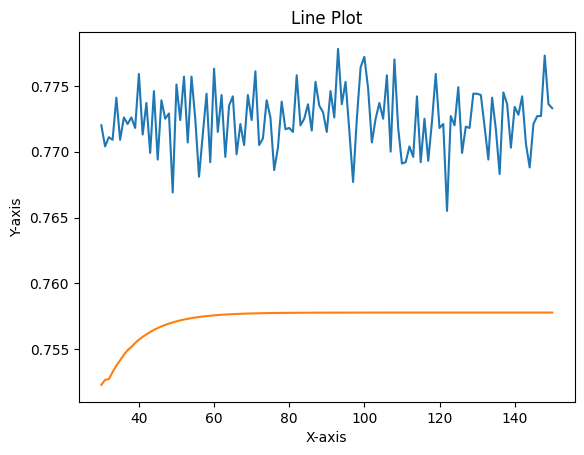

(4, 6)
30
1/1 [==============================] - 0s 31ms/step
31
1/1 [==============================] - 0s 41ms/step
32
1/1 [==============================] - 0s 52ms/step
33
1/1 [==============================] - 0s 42ms/step
34
1/1 [==============================] - 0s 32ms/step
35
1/1 [==============================] - 0s 29ms/step
36
1/1 [==============================] - 0s 46ms/step
37
1/1 [==============================] - 0s 57ms/step
38
1/1 [==============================] - 0s 43ms/step
39
1/1 [==============================] - 0s 35ms/step
40
1/1 [==============================] - 0s 39ms/step
41
1/1 [==============================] - 0s 36ms/step
42
1/1 [==============================] - 0s 60ms/step
43
1/1 [==============================] - 0s 69ms/step
44
1/1 [==============================] - 0s 67ms/step
45
1/1 [==============================] - 0s 57ms/step
46
1/1 [==============================] - 0s 45ms/step
47
1/1 [==============================] - 0s 42ms/step
48


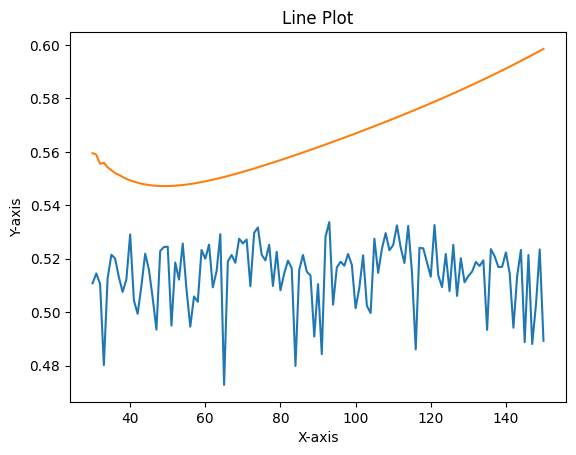

(4, 6)
30
1/1 [==============================] - 0s 30ms/step
31
1/1 [==============================] - 0s 27ms/step
32
1/1 [==============================] - 0s 28ms/step
33
1/1 [==============================] - 0s 41ms/step
34
1/1 [==============================] - 0s 54ms/step
35
1/1 [==============================] - 0s 35ms/step
36
1/1 [==============================] - 0s 28ms/step
37
1/1 [==============================] - 0s 28ms/step
38
1/1 [==============================] - 0s 29ms/step
39
1/1 [==============================] - 0s 30ms/step
40
1/1 [==============================] - 0s 31ms/step
41
1/1 [==============================] - 0s 26ms/step
42
1/1 [==============================] - 0s 27ms/step
43
1/1 [==============================] - 0s 27ms/step
44
1/1 [==============================] - 0s 32ms/step
45
1/1 [==============================] - 0s 27ms/step
46
1/1 [==============================] - 0s 34ms/step
47
1/1 [==============================] - 0s 30ms/step
48


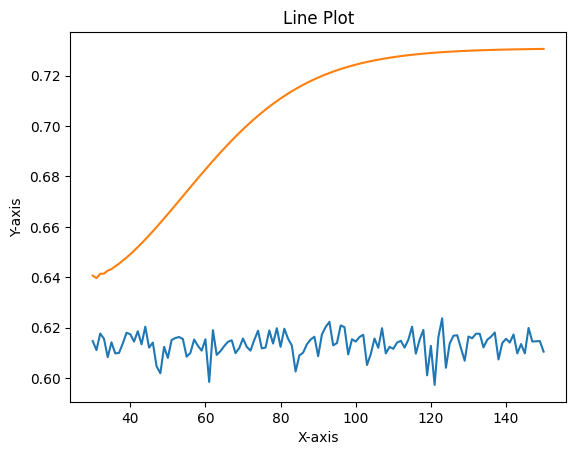

(4, 6)
30
1/1 [==============================] - 0s 35ms/step
31
1/1 [==============================] - 0s 33ms/step
32
1/1 [==============================] - 0s 36ms/step
33
1/1 [==============================] - 0s 36ms/step
34
1/1 [==============================] - 0s 42ms/step
35
1/1 [==============================] - 0s 35ms/step
36
1/1 [==============================] - 0s 32ms/step
37
1/1 [==============================] - 0s 36ms/step
38
1/1 [==============================] - 0s 33ms/step
39
1/1 [==============================] - 0s 75ms/step
40
1/1 [==============================] - 0s 48ms/step
41
1/1 [==============================] - 0s 35ms/step
42
1/1 [==============================] - 0s 34ms/step
43
1/1 [==============================] - 0s 33ms/step
44
1/1 [==============================] - 0s 37ms/step
45
1/1 [==============================] - 0s 33ms/step
46
1/1 [==============================] - 0s 44ms/step
47
1/1 [==============================] - 0s 38ms/step
48


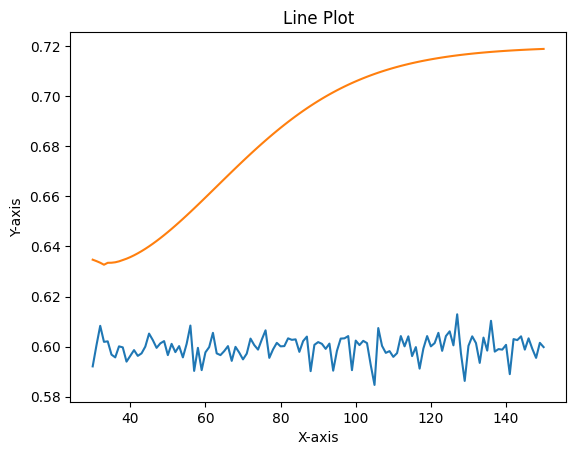

(4, 6)
30
1/1 [==============================] - 0s 41ms/step
31
1/1 [==============================] - 0s 38ms/step
32
1/1 [==============================] - 0s 41ms/step
33
1/1 [==============================] - 0s 36ms/step
34
1/1 [==============================] - 0s 37ms/step
35
1/1 [==============================] - 0s 43ms/step
36
1/1 [==============================] - 0s 75ms/step
37
1/1 [==============================] - 0s 34ms/step
38
1/1 [==============================] - 0s 32ms/step
39
1/1 [==============================] - 0s 34ms/step
40
1/1 [==============================] - 0s 40ms/step
41
1/1 [==============================] - 0s 33ms/step
42
1/1 [==============================] - 0s 35ms/step
43
1/1 [==============================] - 0s 34ms/step
44
1/1 [==============================] - 0s 33ms/step
45
1/1 [==============================] - 0s 32ms/step
46
1/1 [==============================] - 0s 38ms/step
47
1/1 [==============================] - 0s 34ms/step
48


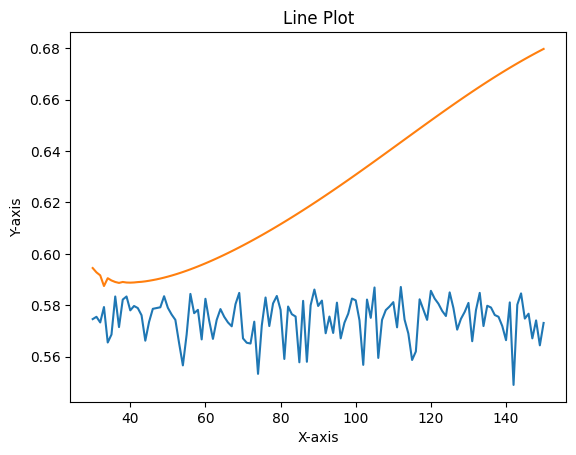

(4, 6)
60
1/1 [==============================] - 0s 36ms/step
61
1/1 [==============================] - 0s 45ms/step
62
1/1 [==============================] - 0s 55ms/step
63
1/1 [==============================] - 0s 55ms/step
64
1/1 [==============================] - 0s 62ms/step
65
1/1 [==============================] - 0s 47ms/step
66
1/1 [==============================] - 0s 74ms/step
67
1/1 [==============================] - 0s 44ms/step
68
1/1 [==============================] - 0s 42ms/step
69
1/1 [==============================] - 0s 54ms/step
70
1/1 [==============================] - 0s 45ms/step
71
1/1 [==============================] - 0s 25ms/step
72
1/1 [==============================] - 0s 49ms/step
73
1/1 [==============================] - 0s 33ms/step
74
1/1 [==============================] - 0s 31ms/step
75
1/1 [==============================] - 0s 29ms/step
76
1/1 [==============================] - 0s 31ms/step
77
1/1 [==============================] - 0s 31ms/step
78


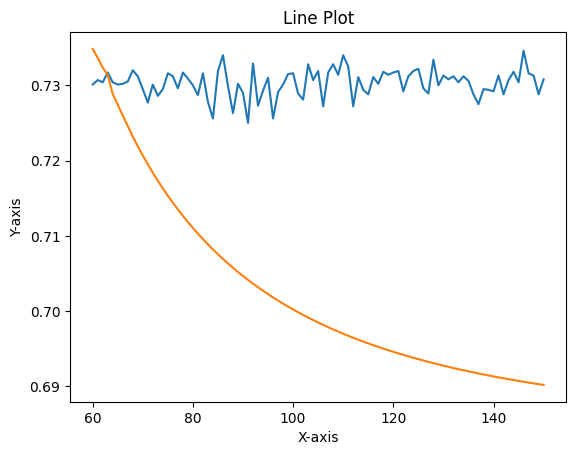

(4, 6)
60
1/1 [==============================] - 0s 34ms/step
61
1/1 [==============================] - 0s 30ms/step
62
1/1 [==============================] - 0s 28ms/step
63
1/1 [==============================] - 0s 30ms/step
64
1/1 [==============================] - 0s 27ms/step
65
1/1 [==============================] - 0s 42ms/step
66
1/1 [==============================] - 0s 40ms/step
67
1/1 [==============================] - 0s 44ms/step
68
1/1 [==============================] - 0s 30ms/step
69
1/1 [==============================] - 0s 30ms/step
70
1/1 [==============================] - 0s 30ms/step
71
1/1 [==============================] - 0s 32ms/step
72
1/1 [==============================] - 0s 27ms/step
73
1/1 [==============================] - 0s 30ms/step
74
1/1 [==============================] - 0s 29ms/step
75
1/1 [==============================] - 0s 41ms/step
76
1/1 [==============================] - 0s 32ms/step
77
1/1 [==============================] - 0s 31ms/step
78


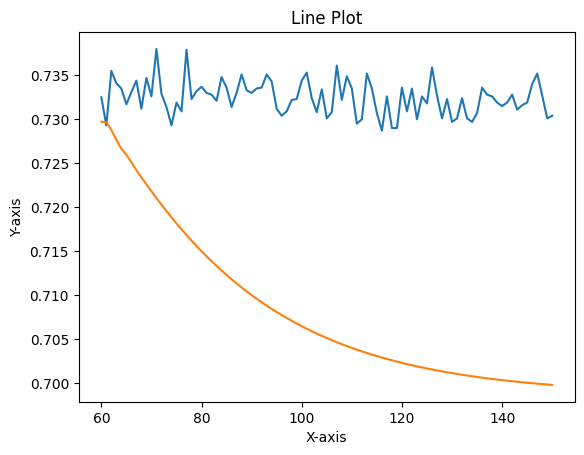

(4, 6)
60
1/1 [==============================] - 0s 34ms/step
61
1/1 [==============================] - 0s 28ms/step
62
1/1 [==============================] - 0s 27ms/step
63
1/1 [==============================] - 0s 29ms/step
64
1/1 [==============================] - 0s 30ms/step
65
1/1 [==============================] - 0s 28ms/step
66
1/1 [==============================] - 0s 29ms/step
67
1/1 [==============================] - 0s 28ms/step
68
1/1 [==============================] - 0s 38ms/step
69
1/1 [==============================] - 0s 28ms/step
70
1/1 [==============================] - 0s 29ms/step
71
1/1 [==============================] - 0s 29ms/step
72
1/1 [==============================] - 0s 28ms/step
73
1/1 [==============================] - 0s 27ms/step
74
1/1 [==============================] - 0s 29ms/step
75
1/1 [==============================] - 0s 65ms/step
76
1/1 [==============================] - 0s 33ms/step
77
1/1 [==============================] - 0s 34ms/step
78


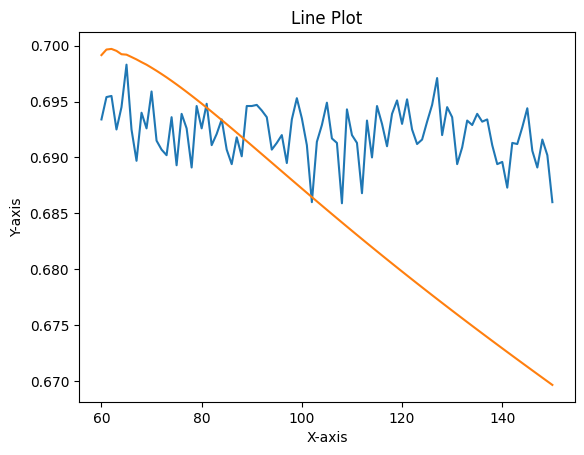

(4, 6)
60
1/1 [==============================] - 0s 56ms/step
61
1/1 [==============================] - 0s 40ms/step
62
1/1 [==============================] - 0s 44ms/step
63
1/1 [==============================] - 0s 62ms/step
64
1/1 [==============================] - 0s 43ms/step
65
1/1 [==============================] - 0s 54ms/step
66
1/1 [==============================] - 0s 59ms/step
67
1/1 [==============================] - 0s 44ms/step
68
1/1 [==============================] - 0s 60ms/step
69
1/1 [==============================] - 0s 42ms/step
70
1/1 [==============================] - 0s 55ms/step
71
1/1 [==============================] - 0s 45ms/step
72
1/1 [==============================] - 0s 39ms/step
73
1/1 [==============================] - 0s 49ms/step
74
1/1 [==============================] - 0s 43ms/step
75
1/1 [==============================] - 0s 38ms/step
76
1/1 [==============================] - 0s 61ms/step
77
1/1 [==============================] - 0s 58ms/step
78


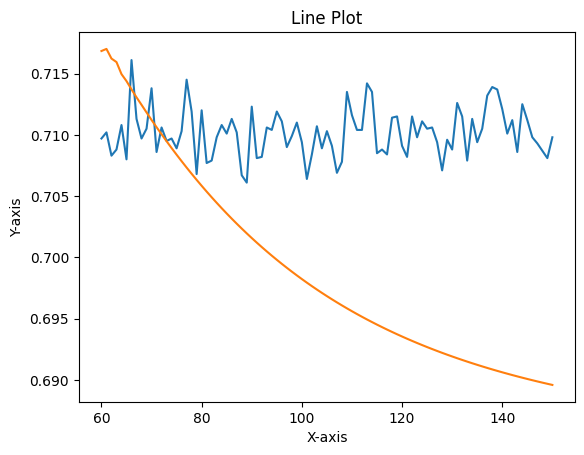

(4, 6)
60
1/1 [==============================] - 0s 60ms/step
61
1/1 [==============================] - 0s 52ms/step
62
1/1 [==============================] - 0s 36ms/step
63
1/1 [==============================] - 0s 31ms/step
64
1/1 [==============================] - 0s 29ms/step
65
1/1 [==============================] - 0s 30ms/step
66
1/1 [==============================] - 0s 30ms/step
67
1/1 [==============================] - 0s 33ms/step
68
1/1 [==============================] - 0s 31ms/step
69
1/1 [==============================] - 0s 29ms/step
70
1/1 [==============================] - 0s 26ms/step
71
1/1 [==============================] - 0s 28ms/step
72
1/1 [==============================] - 0s 36ms/step
73
1/1 [==============================] - 0s 31ms/step
74
1/1 [==============================] - 0s 30ms/step
75
1/1 [==============================] - 0s 70ms/step
76
1/1 [==============================] - 0s 60ms/step
77
1/1 [==============================] - 0s 27ms/step
78


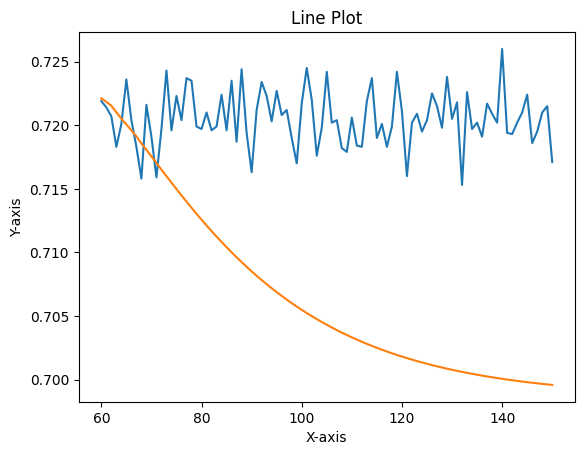

(4, 6)
60
1/1 [==============================] - 0s 53ms/step
61
1/1 [==============================] - 0s 58ms/step
62
1/1 [==============================] - 0s 42ms/step
63
1/1 [==============================] - 0s 59ms/step
64
1/1 [==============================] - 0s 55ms/step
65
1/1 [==============================] - 0s 44ms/step
66
1/1 [==============================] - 0s 42ms/step
67
1/1 [==============================] - 0s 42ms/step
68
1/1 [==============================] - 0s 61ms/step
69
1/1 [==============================] - 0s 57ms/step
70
1/1 [==============================] - 0s 64ms/step
71
1/1 [==============================] - 0s 46ms/step
72
1/1 [==============================] - 0s 48ms/step
73
1/1 [==============================] - 0s 34ms/step
74
1/1 [==============================] - 0s 57ms/step
75
1/1 [==============================] - 0s 45ms/step
76
1/1 [==============================] - 0s 54ms/step
77
1/1 [==============================] - 0s 60ms/step
78


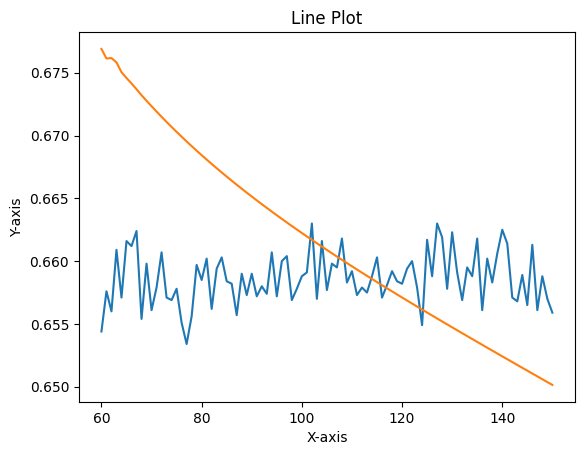

(4, 6)
60
1/1 [==============================] - 0s 30ms/step
61
1/1 [==============================] - 0s 56ms/step
62
1/1 [==============================] - 0s 40ms/step
63
1/1 [==============================] - 0s 57ms/step
64
1/1 [==============================] - 0s 31ms/step
65
1/1 [==============================] - 0s 28ms/step
66
1/1 [==============================] - 0s 29ms/step
67
1/1 [==============================] - 0s 29ms/step
68
1/1 [==============================] - 0s 27ms/step
69
1/1 [==============================] - 0s 28ms/step
70
1/1 [==============================] - 0s 27ms/step
71
1/1 [==============================] - 0s 30ms/step
72
1/1 [==============================] - 0s 30ms/step
73
1/1 [==============================] - 0s 30ms/step
74
1/1 [==============================] - 0s 31ms/step
75
1/1 [==============================] - 0s 29ms/step
76
1/1 [==============================] - 0s 28ms/step
77
1/1 [==============================] - 0s 28ms/step
78


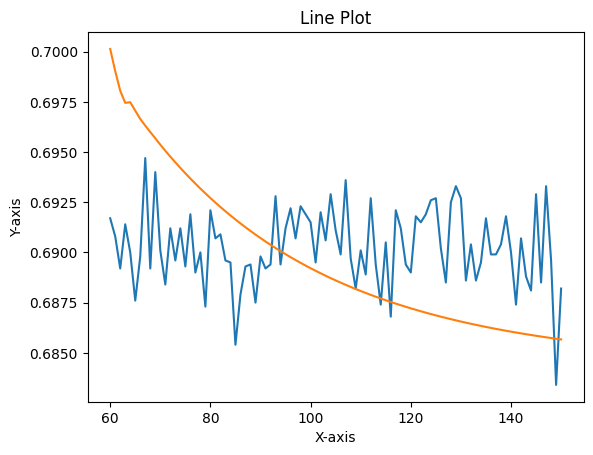

(4, 6)
60
1/1 [==============================] - 0s 60ms/step
61
1/1 [==============================] - 0s 44ms/step
62
1/1 [==============================] - 0s 33ms/step
63
1/1 [==============================] - 0s 33ms/step
64
1/1 [==============================] - 0s 43ms/step
65
1/1 [==============================] - 0s 25ms/step
66
1/1 [==============================] - 0s 27ms/step
67
1/1 [==============================] - 0s 30ms/step
68
1/1 [==============================] - 0s 35ms/step
69
1/1 [==============================] - 0s 26ms/step
70
1/1 [==============================] - 0s 27ms/step
71
1/1 [==============================] - 0s 27ms/step
72
1/1 [==============================] - 0s 37ms/step
73
1/1 [==============================] - 0s 58ms/step
74
1/1 [==============================] - 0s 47ms/step
75
1/1 [==============================] - 0s 28ms/step
76
1/1 [==============================] - 0s 31ms/step
77
1/1 [==============================] - 0s 27ms/step
78


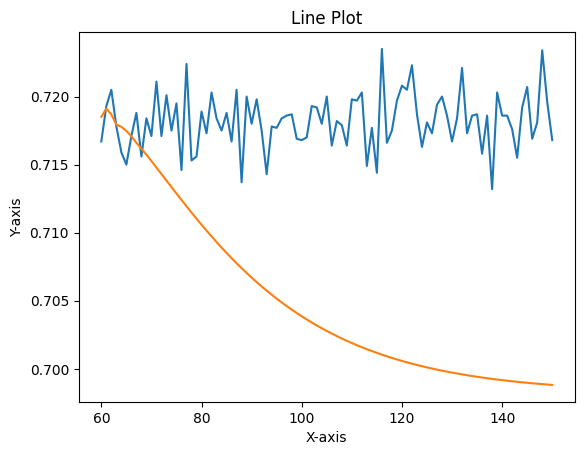

(4, 6)
60
1/1 [==============================] - 0s 27ms/step
61
1/1 [==============================] - 0s 28ms/step
62
1/1 [==============================] - 0s 36ms/step
63
1/1 [==============================] - 0s 27ms/step
64
1/1 [==============================] - 0s 27ms/step
65
1/1 [==============================] - 0s 27ms/step
66
1/1 [==============================] - 0s 40ms/step
67
1/1 [==============================] - 0s 28ms/step
68
1/1 [==============================] - 0s 57ms/step
69
1/1 [==============================] - 0s 36ms/step
70
1/1 [==============================] - 0s 29ms/step
71
1/1 [==============================] - 0s 29ms/step
72
1/1 [==============================] - 0s 30ms/step
73
1/1 [==============================] - 0s 30ms/step
74
1/1 [==============================] - 0s 28ms/step
75
1/1 [==============================] - 0s 28ms/step
76
1/1 [==============================] - 0s 29ms/step
77
1/1 [==============================] - 0s 36ms/step
78


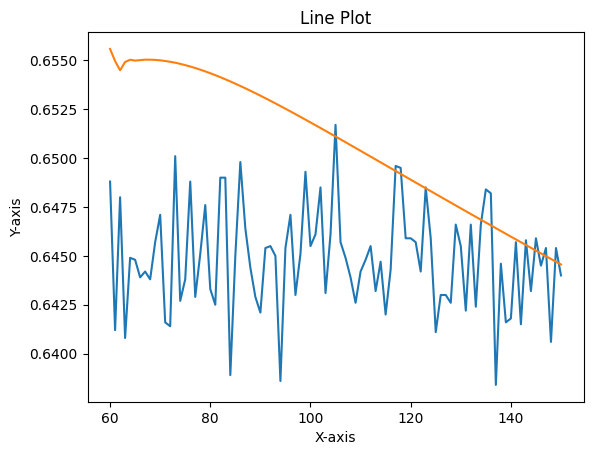

(4, 6)
60
1/1 [==============================] - 0s 64ms/step
61
1/1 [==============================] - 0s 33ms/step
62
1/1 [==============================] - 0s 28ms/step
63
1/1 [==============================] - 0s 28ms/step
64
1/1 [==============================] - 0s 29ms/step
65
1/1 [==============================] - 0s 29ms/step
66
1/1 [==============================] - 0s 28ms/step
67
1/1 [==============================] - 0s 27ms/step
68
1/1 [==============================] - 0s 27ms/step
69
1/1 [==============================] - 0s 40ms/step
70
1/1 [==============================] - 0s 36ms/step
71
1/1 [==============================] - 0s 33ms/step
72
1/1 [==============================] - 0s 30ms/step
73
1/1 [==============================] - 0s 31ms/step
74
1/1 [==============================] - 0s 33ms/step
75
1/1 [==============================] - 0s 37ms/step
76
1/1 [==============================] - 0s 60ms/step
77
1/1 [==============================] - 0s 56ms/step
78


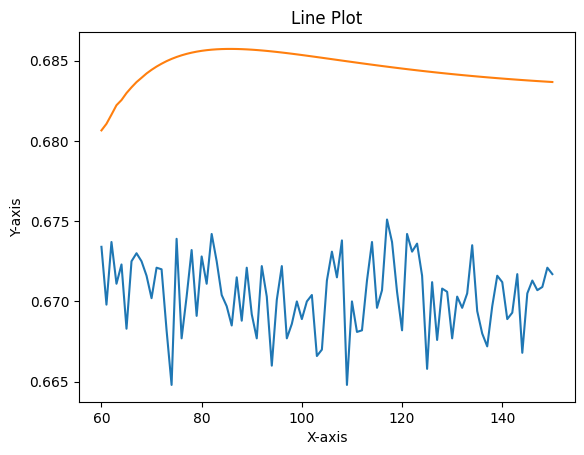

(4, 6)
60
1/1 [==============================] - 0s 34ms/step
61
1/1 [==============================] - 0s 42ms/step
62
1/1 [==============================] - 0s 33ms/step
63
1/1 [==============================] - 0s 54ms/step
64
1/1 [==============================] - 0s 44ms/step
65
1/1 [==============================] - 0s 41ms/step
66
1/1 [==============================] - 0s 48ms/step
67
1/1 [==============================] - 0s 54ms/step
68
1/1 [==============================] - 0s 46ms/step
69
1/1 [==============================] - 0s 62ms/step
70
1/1 [==============================] - 0s 64ms/step
71
1/1 [==============================] - 0s 63ms/step
72
1/1 [==============================] - 0s 34ms/step
73
1/1 [==============================] - 0s 65ms/step
74
1/1 [==============================] - 0s 56ms/step
75
1/1 [==============================] - 0s 54ms/step
76
1/1 [==============================] - 0s 44ms/step
77
1/1 [==============================] - 0s 55ms/step
78


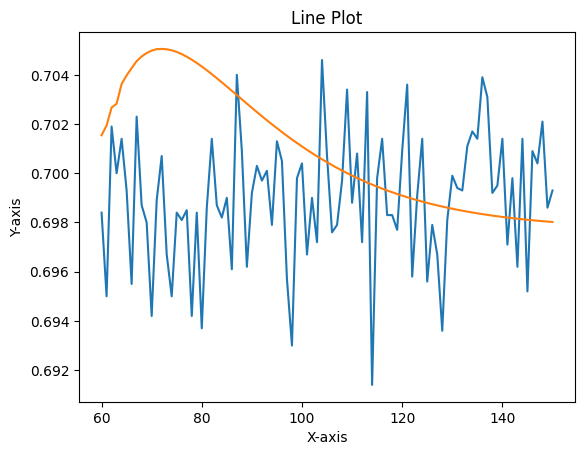

(4, 6)
60
1/1 [==============================] - 0s 38ms/step
61
1/1 [==============================] - 0s 28ms/step
62
1/1 [==============================] - 0s 26ms/step
63
1/1 [==============================] - 0s 29ms/step
64
1/1 [==============================] - 0s 27ms/step
65
1/1 [==============================] - 0s 28ms/step
66
1/1 [==============================] - 0s 37ms/step
67
1/1 [==============================] - 0s 50ms/step
68
1/1 [==============================] - 0s 38ms/step
69
1/1 [==============================] - 0s 31ms/step
70
1/1 [==============================] - 0s 33ms/step
71
1/1 [==============================] - 0s 33ms/step
72
1/1 [==============================] - 0s 32ms/step
73
1/1 [==============================] - 0s 30ms/step
74
1/1 [==============================] - 0s 27ms/step
75
1/1 [==============================] - 0s 31ms/step
76
1/1 [==============================] - 0s 30ms/step
77
1/1 [==============================] - 0s 31ms/step
78


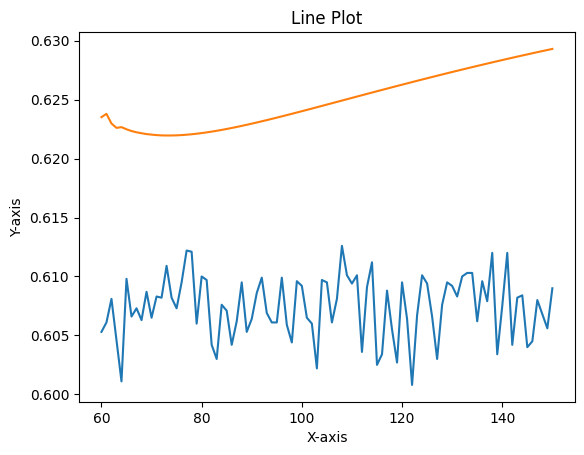

(4, 6)
60
1/1 [==============================] - 0s 35ms/step
61
1/1 [==============================] - 0s 66ms/step
62
1/1 [==============================] - 0s 43ms/step
63
1/1 [==============================] - 0s 55ms/step
64
1/1 [==============================] - 0s 37ms/step
65
1/1 [==============================] - 0s 74ms/step
66
1/1 [==============================] - 0s 34ms/step
67
1/1 [==============================] - 0s 42ms/step
68
1/1 [==============================] - 0s 52ms/step
69
1/1 [==============================] - 0s 49ms/step
70
1/1 [==============================] - 0s 46ms/step
71
1/1 [==============================] - 0s 31ms/step
72
1/1 [==============================] - 0s 28ms/step
73
1/1 [==============================] - 0s 27ms/step
74
1/1 [==============================] - 0s 27ms/step
75
1/1 [==============================] - 0s 30ms/step
76
1/1 [==============================] - 0s 30ms/step
77
1/1 [==============================] - 0s 32ms/step
78


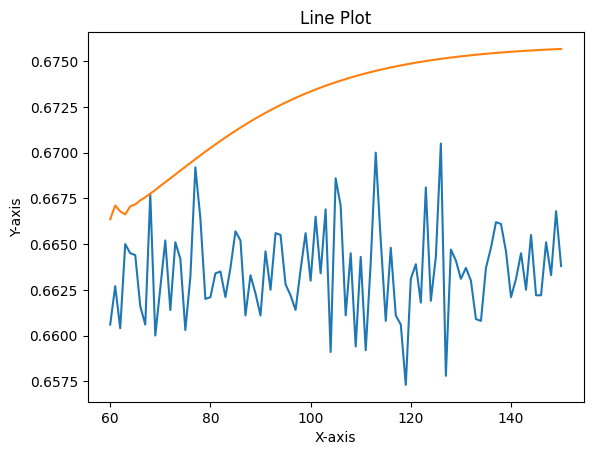

(4, 6)
60
1/1 [==============================] - 0s 35ms/step
61
1/1 [==============================] - 0s 60ms/step
62
1/1 [==============================] - 0s 56ms/step
63
1/1 [==============================] - 0s 42ms/step
64
1/1 [==============================] - 0s 38ms/step
65
1/1 [==============================] - 0s 39ms/step
66
1/1 [==============================] - 0s 46ms/step
67
1/1 [==============================] - 0s 47ms/step
68
1/1 [==============================] - 0s 47ms/step
69
1/1 [==============================] - 0s 48ms/step
70
1/1 [==============================] - 0s 78ms/step
71
1/1 [==============================] - 0s 36ms/step
72
1/1 [==============================] - 0s 46ms/step
73
1/1 [==============================] - 0s 90ms/step
74
1/1 [==============================] - 0s 47ms/step
75
1/1 [==============================] - 0s 61ms/step
76
1/1 [==============================] - 0s 40ms/step
77
1/1 [==============================] - 0s 53ms/step
78


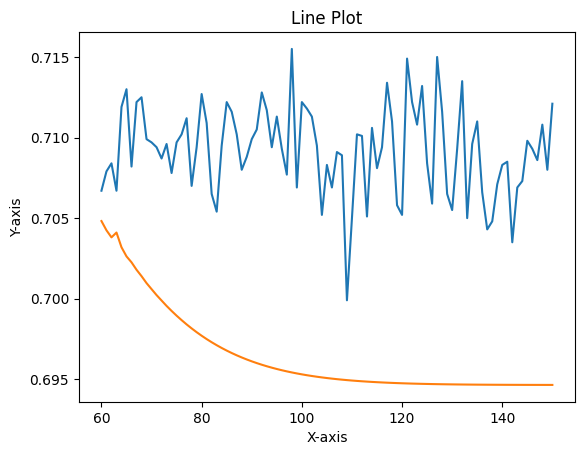

(4, 6)
60
1/1 [==============================] - 0s 32ms/step
61
1/1 [==============================] - 0s 30ms/step
62
1/1 [==============================] - 0s 28ms/step
63
1/1 [==============================] - 0s 35ms/step
64
1/1 [==============================] - 0s 30ms/step
65
1/1 [==============================] - 0s 30ms/step
66
1/1 [==============================] - 0s 29ms/step
67
1/1 [==============================] - 0s 30ms/step
68
1/1 [==============================] - 0s 29ms/step
69
1/1 [==============================] - 0s 29ms/step
70
1/1 [==============================] - 0s 30ms/step
71
1/1 [==============================] - 0s 47ms/step
72
1/1 [==============================] - 0s 30ms/step
73
1/1 [==============================] - 0s 34ms/step
74
1/1 [==============================] - 0s 31ms/step
75
1/1 [==============================] - 0s 33ms/step
76
1/1 [==============================] - 0s 30ms/step
77
1/1 [==============================] - 0s 30ms/step
78


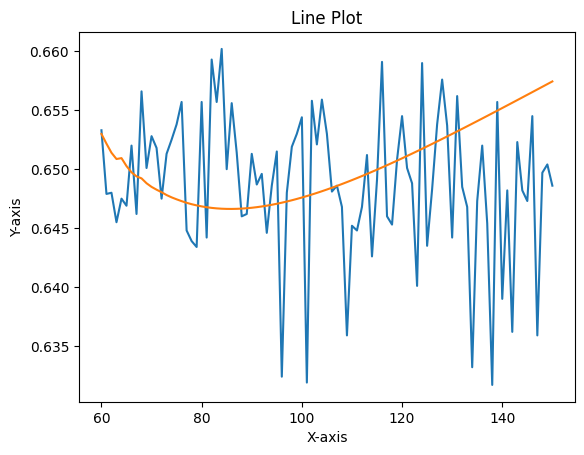

(4, 6)
60
1/1 [==============================] - 0s 56ms/step
61
1/1 [==============================] - 0s 65ms/step
62
1/1 [==============================] - 0s 32ms/step
63
1/1 [==============================] - 0s 56ms/step
64
1/1 [==============================] - 0s 31ms/step
65
1/1 [==============================] - 0s 62ms/step
66
1/1 [==============================] - 0s 50ms/step
67
1/1 [==============================] - 0s 66ms/step
68
1/1 [==============================] - 0s 51ms/step
69
1/1 [==============================] - 0s 44ms/step
70
1/1 [==============================] - 0s 43ms/step
71
1/1 [==============================] - 0s 41ms/step
72
1/1 [==============================] - 0s 46ms/step
73
1/1 [==============================] - 0s 42ms/step
74
1/1 [==============================] - 0s 30ms/step
75
1/1 [==============================] - 0s 31ms/step
76
1/1 [==============================] - 0s 30ms/step
77
1/1 [==============================] - 0s 30ms/step
78


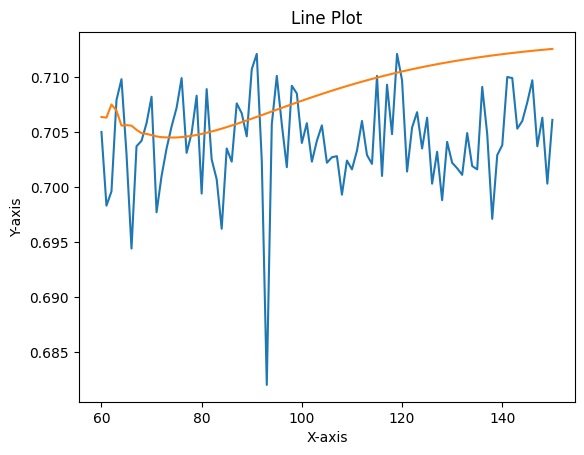

(4, 6)
60
1/1 [==============================] - 0s 38ms/step
61
1/1 [==============================] - 0s 30ms/step
62
1/1 [==============================] - 0s 28ms/step
63
1/1 [==============================] - 0s 30ms/step
64
1/1 [==============================] - 0s 35ms/step
65
1/1 [==============================] - 0s 29ms/step
66
1/1 [==============================] - 0s 30ms/step
67
1/1 [==============================] - 0s 34ms/step
68
1/1 [==============================] - 0s 34ms/step
69
1/1 [==============================] - 0s 29ms/step
70
1/1 [==============================] - 0s 28ms/step
71
1/1 [==============================] - 0s 27ms/step
72
1/1 [==============================] - 0s 26ms/step
73
1/1 [==============================] - 0s 28ms/step
74
1/1 [==============================] - 0s 29ms/step
75
1/1 [==============================] - 0s 28ms/step
76
1/1 [==============================] - 0s 41ms/step
77
1/1 [==============================] - 0s 45ms/step
78


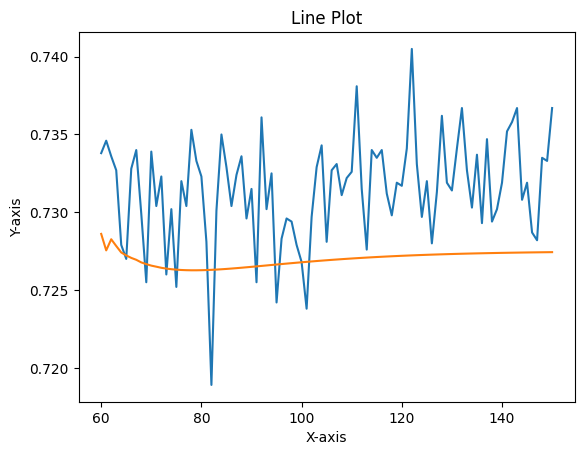

(4, 6)
60
1/1 [==============================] - 0s 29ms/step
61
1/1 [==============================] - 0s 27ms/step
62
1/1 [==============================] - 0s 29ms/step
63
1/1 [==============================] - 0s 62ms/step
64
1/1 [==============================] - 0s 42ms/step
65
1/1 [==============================] - 0s 40ms/step
66
1/1 [==============================] - 0s 28ms/step
67
1/1 [==============================] - 0s 26ms/step
68
1/1 [==============================] - 0s 29ms/step
69
1/1 [==============================] - 0s 29ms/step
70
1/1 [==============================] - 0s 30ms/step
71
1/1 [==============================] - 0s 30ms/step
72
1/1 [==============================] - 0s 27ms/step
73
1/1 [==============================] - 0s 27ms/step
74
1/1 [==============================] - 0s 29ms/step
75
1/1 [==============================] - 0s 30ms/step
76
1/1 [==============================] - 0s 30ms/step
77
1/1 [==============================] - 0s 37ms/step
78


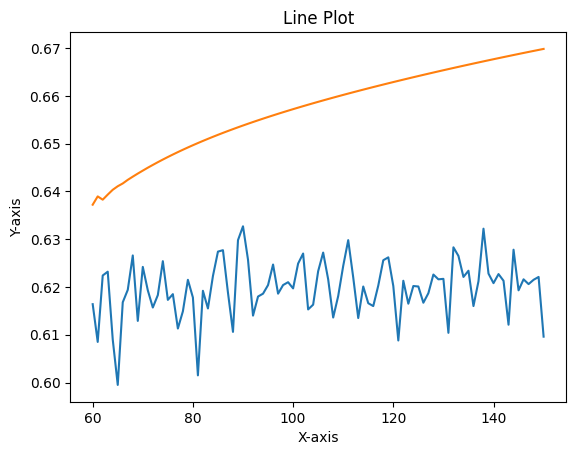

(4, 6)
60
1/1 [==============================] - 0s 34ms/step
61
1/1 [==============================] - 0s 38ms/step
62
1/1 [==============================] - 0s 36ms/step
63
1/1 [==============================] - 0s 36ms/step
64
1/1 [==============================] - 0s 40ms/step
65
1/1 [==============================] - 0s 37ms/step
66
1/1 [==============================] - 0s 41ms/step
67
1/1 [==============================] - 0s 46ms/step
68
1/1 [==============================] - 0s 45ms/step
69
1/1 [==============================] - 0s 57ms/step
70
1/1 [==============================] - 0s 44ms/step
71
1/1 [==============================] - 0s 42ms/step
72
1/1 [==============================] - 0s 47ms/step
73
1/1 [==============================] - 0s 54ms/step
74
1/1 [==============================] - 0s 35ms/step
75
1/1 [==============================] - 0s 60ms/step
76
1/1 [==============================] - 0s 34ms/step
77
1/1 [==============================] - 0s 34ms/step
78


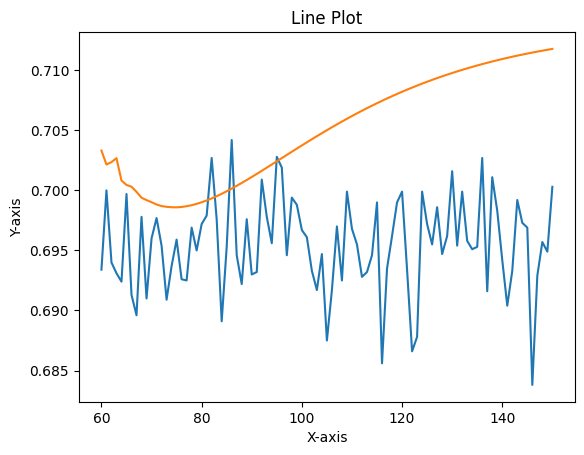

(4, 6)
60
1/1 [==============================] - 0s 27ms/step
61
1/1 [==============================] - 0s 27ms/step
62
1/1 [==============================] - 0s 26ms/step
63
1/1 [==============================] - 0s 32ms/step
64
1/1 [==============================] - 0s 41ms/step
65
1/1 [==============================] - 0s 58ms/step
66
1/1 [==============================] - 0s 27ms/step
67
1/1 [==============================] - 0s 29ms/step
68
1/1 [==============================] - 0s 28ms/step
69
1/1 [==============================] - 0s 30ms/step
70
1/1 [==============================] - 0s 28ms/step
71
1/1 [==============================] - 0s 29ms/step
72
1/1 [==============================] - 0s 29ms/step
73
1/1 [==============================] - 0s 26ms/step
74
1/1 [==============================] - 0s 27ms/step
75
1/1 [==============================] - 0s 27ms/step
76
1/1 [==============================] - 0s 31ms/step
77
1/1 [==============================] - 0s 28ms/step
78


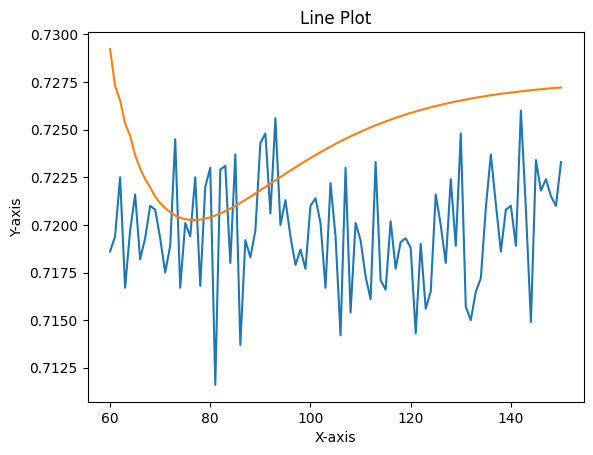

(4, 6)
60
1/1 [==============================] - 0s 29ms/step
61
1/1 [==============================] - 0s 44ms/step
62
1/1 [==============================] - 0s 32ms/step
63
1/1 [==============================] - 0s 31ms/step
64
1/1 [==============================] - 0s 29ms/step
65
1/1 [==============================] - 0s 33ms/step
66
1/1 [==============================] - 0s 30ms/step
67
1/1 [==============================] - 0s 32ms/step
68
1/1 [==============================] - 0s 59ms/step
69
1/1 [==============================] - 0s 51ms/step
70
1/1 [==============================] - 0s 31ms/step
71
1/1 [==============================] - 0s 31ms/step
72
1/1 [==============================] - 0s 35ms/step
73
1/1 [==============================] - 0s 49ms/step
74
1/1 [==============================] - 0s 42ms/step
75
1/1 [==============================] - 0s 70ms/step
76
1/1 [==============================] - 0s 32ms/step
77
1/1 [==============================] - 0s 33ms/step
78


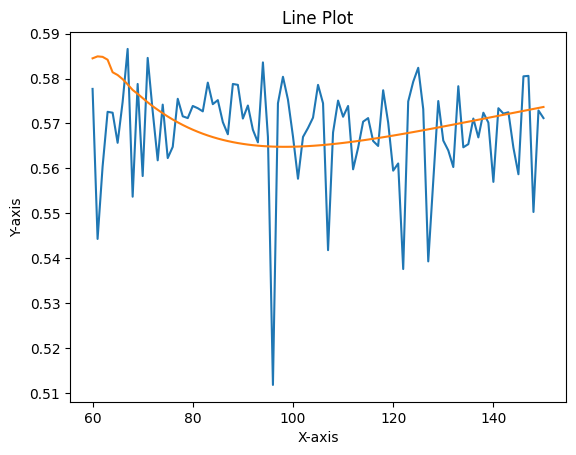

(4, 6)
60
1/1 [==============================] - 0s 31ms/step
61
1/1 [==============================] - 0s 27ms/step
62
1/1 [==============================] - 0s 27ms/step
63
1/1 [==============================] - 0s 30ms/step
64
1/1 [==============================] - 0s 29ms/step
65
1/1 [==============================] - 0s 59ms/step
66
1/1 [==============================] - 0s 32ms/step
67
1/1 [==============================] - 0s 28ms/step
68
1/1 [==============================] - 0s 32ms/step
69
1/1 [==============================] - 0s 36ms/step
70
1/1 [==============================] - 0s 28ms/step
71
1/1 [==============================] - 0s 29ms/step
72
1/1 [==============================] - 0s 28ms/step
73
1/1 [==============================] - 0s 29ms/step
74
1/1 [==============================] - 0s 28ms/step
75
1/1 [==============================] - 0s 27ms/step
76
1/1 [==============================] - 0s 27ms/step
77
1/1 [==============================] - 0s 38ms/step
78


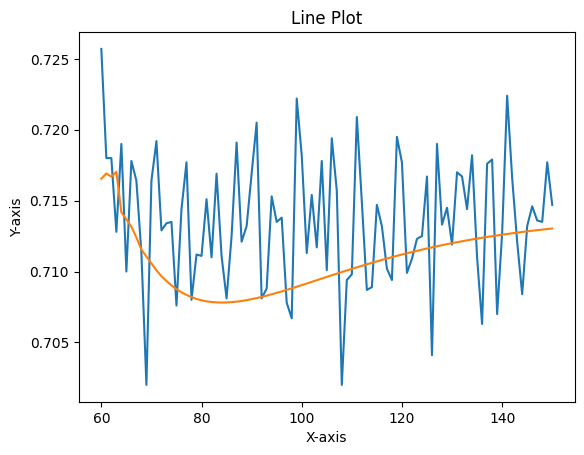

(4, 6)
60
1/1 [==============================] - 0s 30ms/step
61
1/1 [==============================] - 0s 29ms/step
62
1/1 [==============================] - 0s 36ms/step
63
1/1 [==============================] - 0s 32ms/step
64
1/1 [==============================] - 0s 43ms/step
65
1/1 [==============================] - 0s 26ms/step
66
1/1 [==============================] - 0s 27ms/step
67
1/1 [==============================] - 0s 39ms/step
68
1/1 [==============================] - 0s 29ms/step
69
1/1 [==============================] - 0s 27ms/step
70
1/1 [==============================] - 0s 26ms/step
71
1/1 [==============================] - 0s 28ms/step
72
1/1 [==============================] - 0s 27ms/step
73
1/1 [==============================] - 0s 34ms/step
74
1/1 [==============================] - 0s 29ms/step
75
1/1 [==============================] - 0s 29ms/step
76
1/1 [==============================] - 0s 31ms/step
77
1/1 [==============================] - 0s 30ms/step
78


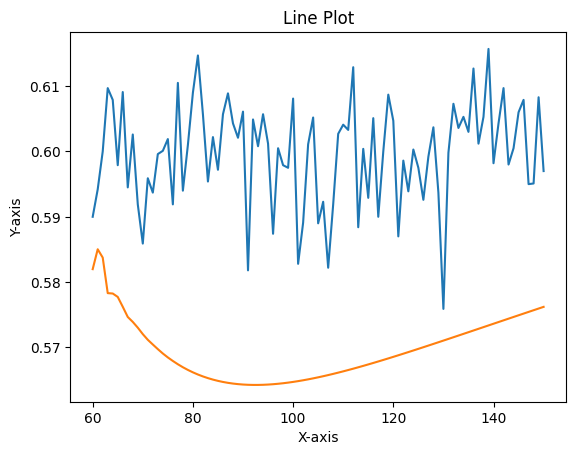

(4, 6)
60
1/1 [==============================] - 0s 56ms/step
61
1/1 [==============================] - 0s 30ms/step
62
1/1 [==============================] - 0s 51ms/step
63
1/1 [==============================] - 0s 73ms/step
64
1/1 [==============================] - 0s 61ms/step
65
1/1 [==============================] - 0s 54ms/step
66
1/1 [==============================] - 0s 36ms/step
67
1/1 [==============================] - 0s 38ms/step
68
1/1 [==============================] - 0s 58ms/step
69
1/1 [==============================] - 0s 45ms/step
70
1/1 [==============================] - 0s 59ms/step
71
1/1 [==============================] - 0s 49ms/step
72
1/1 [==============================] - 0s 54ms/step
73
1/1 [==============================] - 0s 45ms/step
74
1/1 [==============================] - 0s 44ms/step
75
1/1 [==============================] - 0s 71ms/step
76
1/1 [==============================] - 0s 56ms/step
77
1/1 [==============================] - 0s 57ms/step
78


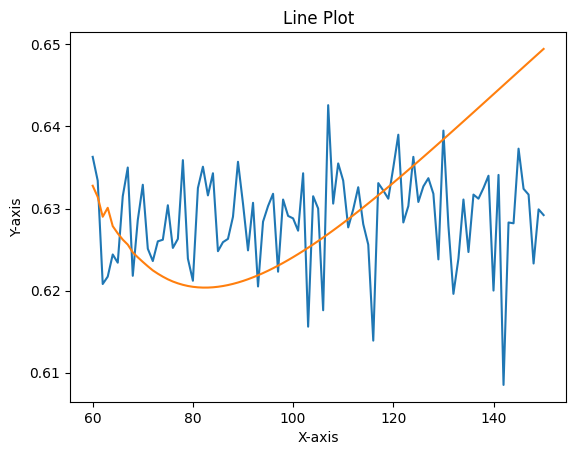

(4, 6)
60
1/1 [==============================] - 0s 30ms/step
61
1/1 [==============================] - 0s 26ms/step
62
1/1 [==============================] - 0s 28ms/step
63
1/1 [==============================] - 0s 32ms/step
64
1/1 [==============================] - 0s 30ms/step
65
1/1 [==============================] - 0s 27ms/step
66
1/1 [==============================] - 0s 28ms/step
67
1/1 [==============================] - 0s 31ms/step
68
1/1 [==============================] - 0s 28ms/step
69
1/1 [==============================] - 0s 26ms/step
70
1/1 [==============================] - 0s 28ms/step
71
1/1 [==============================] - 0s 42ms/step
72
1/1 [==============================] - 0s 59ms/step
73
1/1 [==============================] - 0s 33ms/step
74
1/1 [==============================] - 0s 34ms/step
75
1/1 [==============================] - 0s 30ms/step
76
1/1 [==============================] - 0s 29ms/step
77
1/1 [==============================] - 0s 36ms/step
78


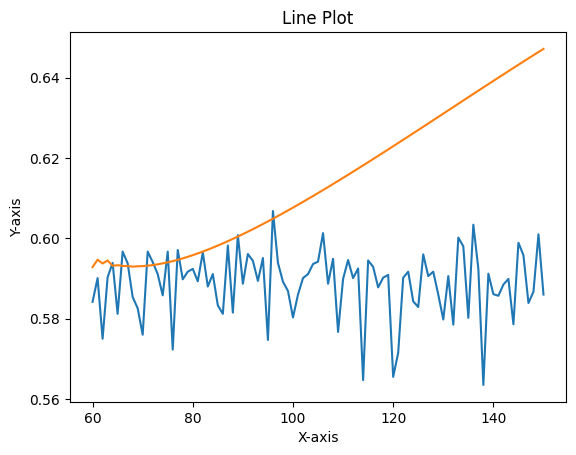

(4, 6)
60
1/1 [==============================] - 0s 36ms/step
61
1/1 [==============================] - 0s 68ms/step
62
1/1 [==============================] - 0s 49ms/step
63
1/1 [==============================] - 0s 60ms/step
64
1/1 [==============================] - 0s 45ms/step
65
1/1 [==============================] - 0s 64ms/step
66
1/1 [==============================] - 0s 44ms/step
67
1/1 [==============================] - 0s 35ms/step
68
1/1 [==============================] - 0s 36ms/step
69
1/1 [==============================] - 0s 60ms/step
70
1/1 [==============================] - 0s 59ms/step
71
1/1 [==============================] - 0s 60ms/step
72
1/1 [==============================] - 0s 49ms/step
73
1/1 [==============================] - 0s 46ms/step
74
1/1 [==============================] - 0s 34ms/step
75
1/1 [==============================] - 0s 61ms/step
76
1/1 [==============================] - 0s 60ms/step
77
1/1 [==============================] - 0s 64ms/step
78


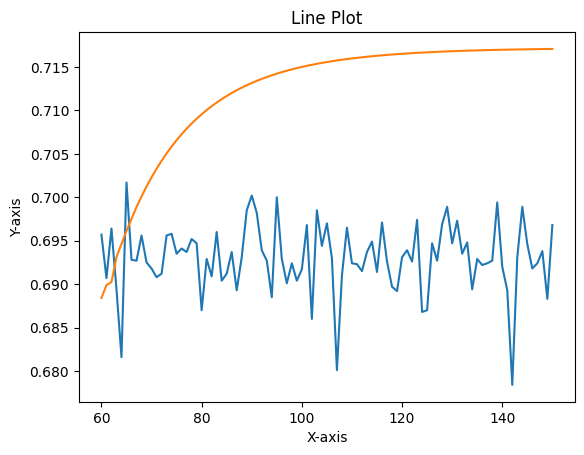

(4, 6)
60
1/1 [==============================] - 0s 31ms/step
61
1/1 [==============================] - 0s 48ms/step
62
1/1 [==============================] - 0s 43ms/step
63
1/1 [==============================] - 0s 27ms/step
64
1/1 [==============================] - 0s 28ms/step
65
1/1 [==============================] - 0s 30ms/step
66
1/1 [==============================] - 0s 34ms/step
67
1/1 [==============================] - 0s 45ms/step
68
1/1 [==============================] - 0s 32ms/step
69
1/1 [==============================] - 0s 29ms/step
70
1/1 [==============================] - 0s 26ms/step
71
1/1 [==============================] - 0s 27ms/step
72
1/1 [==============================] - 0s 28ms/step
73
1/1 [==============================] - 0s 35ms/step
74
1/1 [==============================] - 0s 29ms/step
75
1/1 [==============================] - 0s 31ms/step
76
1/1 [==============================] - 0s 28ms/step
77
1/1 [==============================] - 0s 29ms/step
78


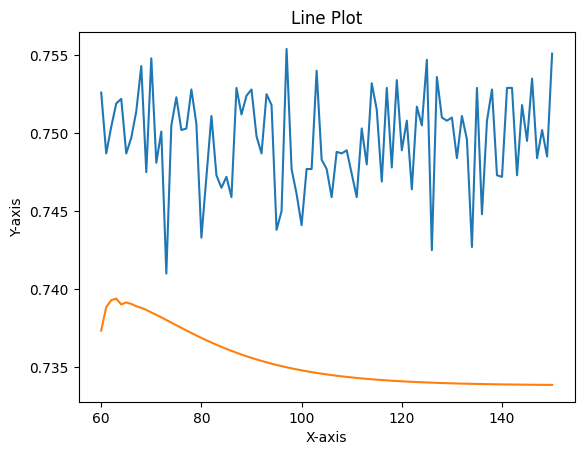

(4, 6)
60
1/1 [==============================] - 0s 36ms/step
61
1/1 [==============================] - 0s 31ms/step
62
1/1 [==============================] - 0s 30ms/step
63
1/1 [==============================] - 0s 30ms/step
64
1/1 [==============================] - 0s 32ms/step
65
1/1 [==============================] - 0s 31ms/step
66
1/1 [==============================] - 0s 35ms/step
67
1/1 [==============================] - 0s 65ms/step
68
1/1 [==============================] - 0s 55ms/step
69
1/1 [==============================] - 0s 31ms/step
70
1/1 [==============================] - 0s 28ms/step
71
1/1 [==============================] - 0s 32ms/step
72
1/1 [==============================] - 0s 35ms/step
73
1/1 [==============================] - 0s 27ms/step
74
1/1 [==============================] - 0s 31ms/step
75
1/1 [==============================] - 0s 26ms/step
76
1/1 [==============================] - 0s 47ms/step
77
1/1 [==============================] - 0s 27ms/step
78


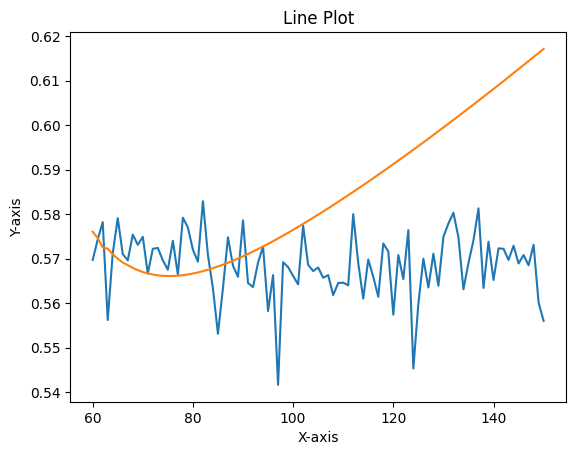

(4, 6)
60
1/1 [==============================] - 0s 55ms/step
61
1/1 [==============================] - 0s 49ms/step
62
1/1 [==============================] - 0s 39ms/step
63
1/1 [==============================] - 0s 41ms/step
64
1/1 [==============================] - 0s 43ms/step
65
1/1 [==============================] - 0s 41ms/step
66
1/1 [==============================] - 0s 47ms/step
67
1/1 [==============================] - 0s 66ms/step
68
1/1 [==============================] - 0s 54ms/step
69
1/1 [==============================] - 0s 42ms/step
70
1/1 [==============================] - 0s 68ms/step
71
1/1 [==============================] - 0s 50ms/step
72
1/1 [==============================] - 0s 37ms/step
73
1/1 [==============================] - 0s 54ms/step
74
1/1 [==============================] - 0s 68ms/step
75
1/1 [==============================] - 0s 56ms/step
76
1/1 [==============================] - 0s 68ms/step
77
1/1 [==============================] - 0s 73ms/step
78


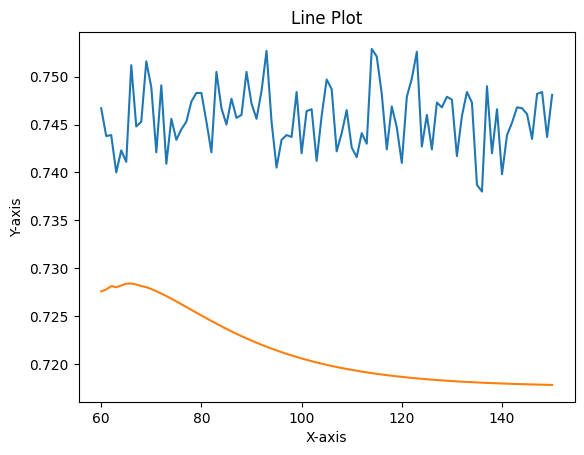

(4, 6)
60
1/1 [==============================] - 0s 34ms/step
61
1/1 [==============================] - 0s 45ms/step
62
1/1 [==============================] - 0s 33ms/step
63
1/1 [==============================] - 0s 37ms/step
64
1/1 [==============================] - 0s 34ms/step
65
1/1 [==============================] - 0s 36ms/step
66
1/1 [==============================] - 0s 35ms/step
67
1/1 [==============================] - 0s 33ms/step
68
1/1 [==============================] - 0s 35ms/step
69
1/1 [==============================] - 0s 34ms/step
70
1/1 [==============================] - 0s 34ms/step
71
1/1 [==============================] - 0s 32ms/step
72
1/1 [==============================] - 0s 32ms/step
73
1/1 [==============================] - 0s 52ms/step
74
1/1 [==============================] - 0s 39ms/step
75
1/1 [==============================] - 0s 44ms/step
76
1/1 [==============================] - 0s 62ms/step
77
1/1 [==============================] - 0s 36ms/step
78


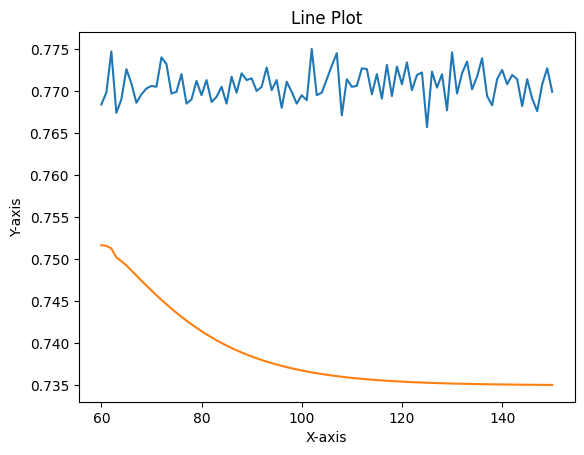

(4, 6)
60
1/1 [==============================] - 0s 27ms/step
61
1/1 [==============================] - 0s 28ms/step
62
1/1 [==============================] - 0s 29ms/step
63
1/1 [==============================] - 0s 28ms/step
64
1/1 [==============================] - 0s 30ms/step
65
1/1 [==============================] - 0s 27ms/step
66
1/1 [==============================] - 0s 44ms/step
67
1/1 [==============================] - 0s 28ms/step
68
1/1 [==============================] - 0s 29ms/step
69
1/1 [==============================] - 0s 31ms/step
70
1/1 [==============================] - 0s 31ms/step
71
1/1 [==============================] - 0s 28ms/step
72
1/1 [==============================] - 0s 26ms/step
73
1/1 [==============================] - 0s 29ms/step
74
1/1 [==============================] - 0s 26ms/step
75
1/1 [==============================] - 0s 65ms/step
76
1/1 [==============================] - 0s 62ms/step
77
1/1 [==============================] - 0s 38ms/step
78


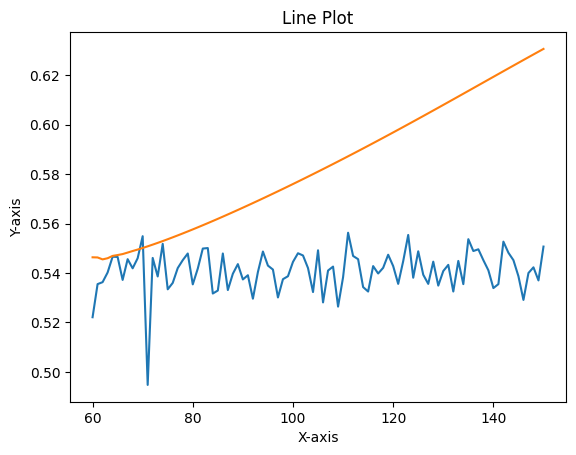

(4, 6)
60
1/1 [==============================] - 0s 29ms/step
61
1/1 [==============================] - 0s 29ms/step
62
1/1 [==============================] - 0s 26ms/step
63
1/1 [==============================] - 0s 60ms/step
64
1/1 [==============================] - 0s 55ms/step
65
1/1 [==============================] - 0s 40ms/step
66
1/1 [==============================] - 0s 28ms/step
67
1/1 [==============================] - 0s 34ms/step
68
1/1 [==============================] - 0s 30ms/step
69
1/1 [==============================] - 0s 28ms/step
70
1/1 [==============================] - 0s 27ms/step
71
1/1 [==============================] - 0s 31ms/step
72
1/1 [==============================] - 0s 35ms/step
73
1/1 [==============================] - 0s 35ms/step
74
1/1 [==============================] - 0s 56ms/step
75
1/1 [==============================] - 0s 39ms/step
76
1/1 [==============================] - 0s 32ms/step
77
1/1 [==============================] - 0s 59ms/step
78


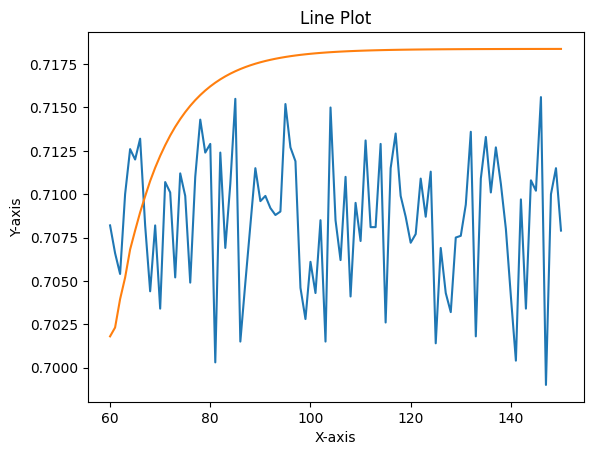

(4, 6)
60
1/1 [==============================] - 0s 30ms/step
61
1/1 [==============================] - 0s 30ms/step
62
1/1 [==============================] - 0s 31ms/step
63
1/1 [==============================] - 0s 31ms/step
64
1/1 [==============================] - 0s 34ms/step
65
1/1 [==============================] - 0s 29ms/step
66
1/1 [==============================] - 0s 38ms/step
67
1/1 [==============================] - 0s 29ms/step
68
1/1 [==============================] - 0s 32ms/step
69
1/1 [==============================] - 0s 29ms/step
70
1/1 [==============================] - 0s 31ms/step
71
1/1 [==============================] - 0s 27ms/step
72
1/1 [==============================] - 0s 29ms/step
73
1/1 [==============================] - 0s 30ms/step
74
1/1 [==============================] - 0s 28ms/step
75
1/1 [==============================] - 0s 28ms/step
76
1/1 [==============================] - 0s 29ms/step
77
1/1 [==============================] - 0s 29ms/step
78


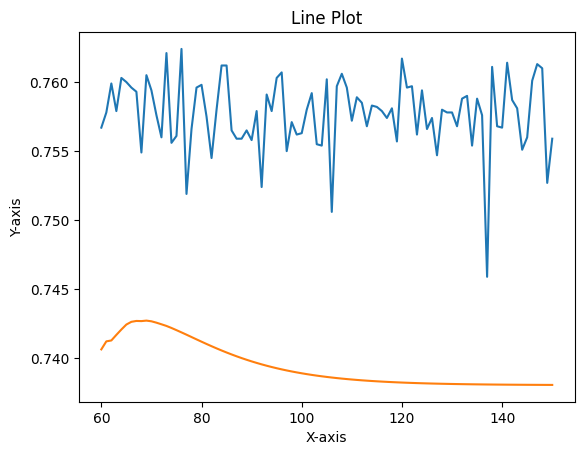

(4, 6)
60
1/1 [==============================] - 0s 38ms/step
61
1/1 [==============================] - 0s 39ms/step
62
1/1 [==============================] - 0s 46ms/step
63
1/1 [==============================] - 0s 41ms/step
64
1/1 [==============================] - 0s 65ms/step
65
1/1 [==============================] - 0s 35ms/step
66
1/1 [==============================] - 0s 65ms/step
67
1/1 [==============================] - 0s 44ms/step
68
1/1 [==============================] - 0s 62ms/step
69
1/1 [==============================] - 0s 48ms/step
70
1/1 [==============================] - 0s 49ms/step
71
1/1 [==============================] - 0s 51ms/step
72
1/1 [==============================] - 0s 46ms/step
73
1/1 [==============================] - 0s 35ms/step
74
1/1 [==============================] - 0s 63ms/step
75
1/1 [==============================] - 0s 68ms/step
76
1/1 [==============================] - 0s 48ms/step
77
1/1 [==============================] - 0s 32ms/step
78


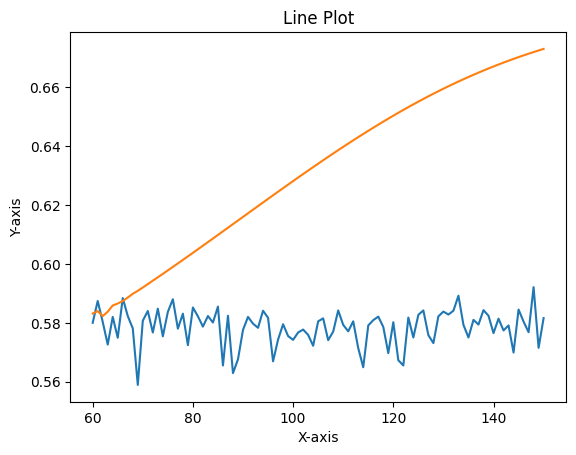

(4, 6)
60
1/1 [==============================] - 0s 31ms/step
61
1/1 [==============================] - 0s 32ms/step
62
1/1 [==============================] - 0s 32ms/step
63
1/1 [==============================] - 0s 30ms/step
64
1/1 [==============================] - 0s 33ms/step
65
1/1 [==============================] - 0s 34ms/step
66
1/1 [==============================] - 0s 32ms/step
67
1/1 [==============================] - 0s 28ms/step
68
1/1 [==============================] - 0s 31ms/step
69
1/1 [==============================] - 0s 43ms/step
70
1/1 [==============================] - 0s 62ms/step
71
1/1 [==============================] - 0s 35ms/step
72
1/1 [==============================] - 0s 34ms/step
73
1/1 [==============================] - 0s 29ms/step
74
1/1 [==============================] - 0s 33ms/step
75
1/1 [==============================] - 0s 33ms/step
76
1/1 [==============================] - 0s 33ms/step
77
1/1 [==============================] - 0s 27ms/step
78


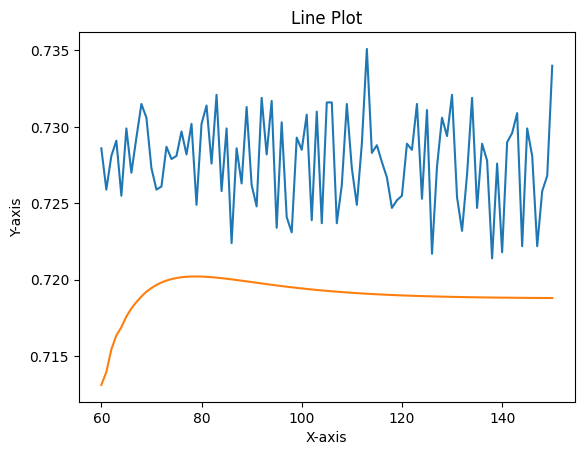

(4, 6)
60
1/1 [==============================] - 0s 56ms/step
61
1/1 [==============================] - 0s 53ms/step
62
1/1 [==============================] - 0s 76ms/step
63
1/1 [==============================] - 0s 42ms/step
64
1/1 [==============================] - 0s 42ms/step
65
1/1 [==============================] - 0s 33ms/step
66
1/1 [==============================] - 0s 59ms/step
67
1/1 [==============================] - 0s 45ms/step
68
1/1 [==============================] - 0s 42ms/step
69
1/1 [==============================] - 0s 35ms/step
70
1/1 [==============================] - 0s 29ms/step
71
1/1 [==============================] - 0s 29ms/step
72
1/1 [==============================] - 0s 46ms/step
73
1/1 [==============================] - 0s 28ms/step
74
1/1 [==============================] - 0s 35ms/step
75
1/1 [==============================] - 0s 27ms/step
76
1/1 [==============================] - 0s 31ms/step
77
1/1 [==============================] - 0s 29ms/step
78


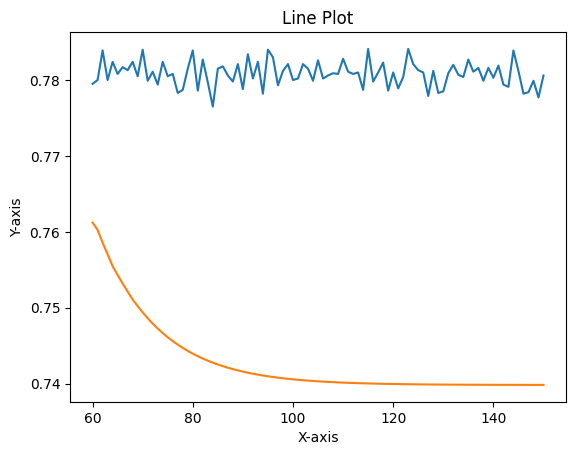

(4, 6)
60
1/1 [==============================] - 0s 32ms/step
61
1/1 [==============================] - 0s 31ms/step
62
1/1 [==============================] - 0s 43ms/step
63
1/1 [==============================] - 0s 41ms/step
64
1/1 [==============================] - 0s 32ms/step
65
1/1 [==============================] - 0s 34ms/step
66
1/1 [==============================] - 0s 31ms/step
67
1/1 [==============================] - 0s 31ms/step
68
1/1 [==============================] - 0s 30ms/step
69
1/1 [==============================] - 0s 31ms/step
70
1/1 [==============================] - 0s 32ms/step
71
1/1 [==============================] - 0s 32ms/step
72
1/1 [==============================] - 0s 30ms/step
73
1/1 [==============================] - 0s 28ms/step
74
1/1 [==============================] - 0s 34ms/step
75
1/1 [==============================] - 0s 35ms/step
76
1/1 [==============================] - 0s 37ms/step
77
1/1 [==============================] - 0s 29ms/step
78


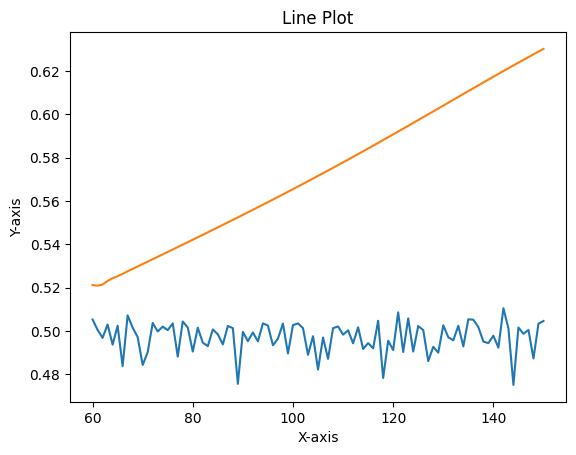

(4, 6)
60
1/1 [==============================] - 0s 30ms/step
61
1/1 [==============================] - 0s 28ms/step
62
1/1 [==============================] - 0s 32ms/step
63
1/1 [==============================] - 0s 27ms/step
64
1/1 [==============================] - 0s 36ms/step
65
1/1 [==============================] - 0s 60ms/step
66
1/1 [==============================] - 0s 61ms/step
67
1/1 [==============================] - 0s 33ms/step
68
1/1 [==============================] - 0s 29ms/step
69
1/1 [==============================] - 0s 33ms/step
70
1/1 [==============================] - 0s 29ms/step
71
1/1 [==============================] - 0s 29ms/step
72
1/1 [==============================] - 0s 30ms/step
73
1/1 [==============================] - 0s 30ms/step
74
1/1 [==============================] - 0s 28ms/step
75
1/1 [==============================] - 0s 32ms/step
76
1/1 [==============================] - 0s 31ms/step
77
1/1 [==============================] - 0s 29ms/step
78


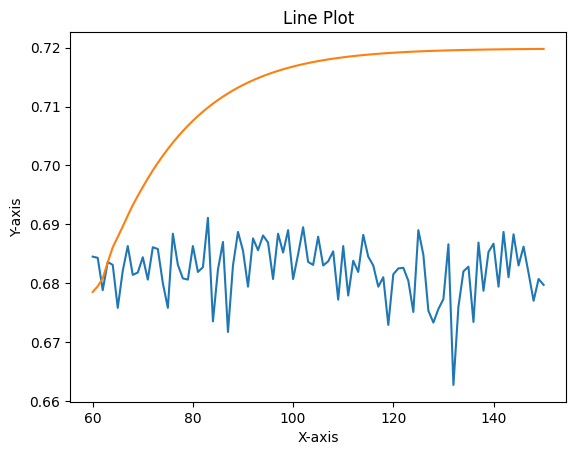

(4, 6)
60
1/1 [==============================] - 0s 30ms/step
61
1/1 [==============================] - 0s 34ms/step
62
1/1 [==============================] - 0s 31ms/step
63
1/1 [==============================] - 0s 28ms/step
64
1/1 [==============================] - 0s 33ms/step
65
1/1 [==============================] - 0s 27ms/step
66
1/1 [==============================] - 0s 30ms/step
67
1/1 [==============================] - 0s 30ms/step
68
1/1 [==============================] - 0s 34ms/step
69
1/1 [==============================] - 0s 30ms/step
70
1/1 [==============================] - 0s 31ms/step
71
1/1 [==============================] - 0s 30ms/step
72
1/1 [==============================] - 0s 29ms/step
73
1/1 [==============================] - 0s 40ms/step
74
1/1 [==============================] - 0s 44ms/step
75
1/1 [==============================] - 0s 57ms/step
76
1/1 [==============================] - 0s 31ms/step
77
1/1 [==============================] - 0s 61ms/step
78


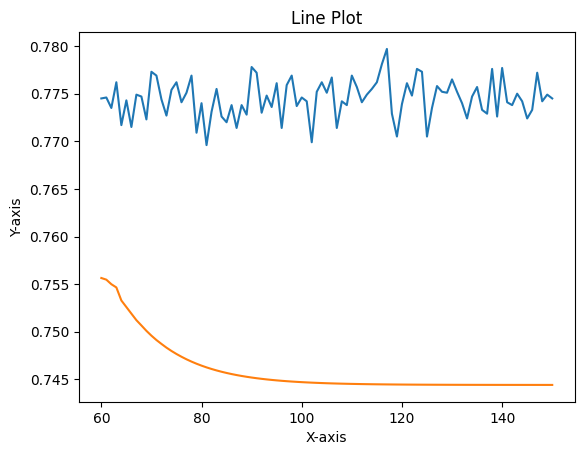

(4, 6)
60
1/1 [==============================] - 0s 30ms/step
61
1/1 [==============================] - 0s 36ms/step
62
1/1 [==============================] - 0s 43ms/step
63
1/1 [==============================] - 0s 50ms/step
64
1/1 [==============================] - 0s 28ms/step
65
1/1 [==============================] - 0s 29ms/step
66
1/1 [==============================] - 0s 26ms/step
67
1/1 [==============================] - 0s 28ms/step
68
1/1 [==============================] - 0s 28ms/step
69
1/1 [==============================] - 0s 28ms/step
70
1/1 [==============================] - 0s 27ms/step
71
1/1 [==============================] - 0s 29ms/step
72
1/1 [==============================] - 0s 44ms/step
73
1/1 [==============================] - 0s 29ms/step
74
1/1 [==============================] - 0s 27ms/step
75
1/1 [==============================] - 0s 28ms/step
76
1/1 [==============================] - 0s 31ms/step
77
1/1 [==============================] - 0s 27ms/step
78


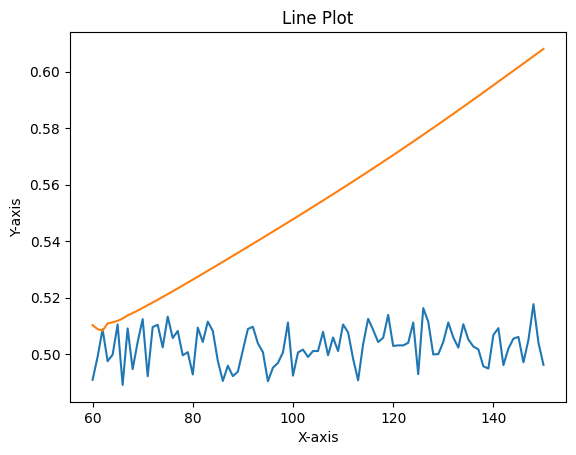

(4, 6)
60
1/1 [==============================] - 0s 58ms/step
61
1/1 [==============================] - 0s 56ms/step
62
1/1 [==============================] - 0s 35ms/step
63
1/1 [==============================] - 0s 48ms/step
64
1/1 [==============================] - 0s 58ms/step
65
1/1 [==============================] - 0s 44ms/step
66
1/1 [==============================] - 0s 50ms/step
67
1/1 [==============================] - 0s 62ms/step
68
1/1 [==============================] - 0s 59ms/step
69
1/1 [==============================] - 0s 58ms/step
70
1/1 [==============================] - 0s 59ms/step
71
1/1 [==============================] - 0s 59ms/step
72
1/1 [==============================] - 0s 40ms/step
73
1/1 [==============================] - 0s 44ms/step
74
1/1 [==============================] - 0s 65ms/step
75
1/1 [==============================] - 0s 39ms/step
76
1/1 [==============================] - 0s 37ms/step
77
1/1 [==============================] - 0s 38ms/step
78


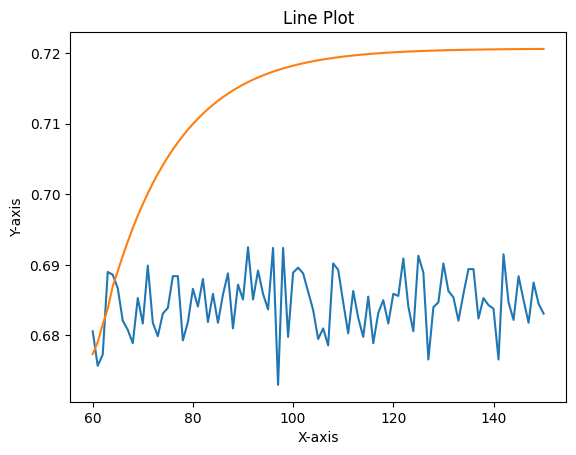

(4, 6)
60
1/1 [==============================] - 0s 31ms/step
61
1/1 [==============================] - 0s 29ms/step
62
1/1 [==============================] - 0s 29ms/step
63
1/1 [==============================] - 0s 32ms/step
64
1/1 [==============================] - 0s 35ms/step
65
1/1 [==============================] - 0s 35ms/step
66
1/1 [==============================] - 0s 43ms/step
67
1/1 [==============================] - 0s 47ms/step
68
1/1 [==============================] - 0s 45ms/step
69
1/1 [==============================] - 0s 37ms/step
70
1/1 [==============================] - 0s 30ms/step
71
1/1 [==============================] - 0s 33ms/step
72
1/1 [==============================] - 0s 30ms/step
73
1/1 [==============================] - 0s 28ms/step
74
1/1 [==============================] - 0s 30ms/step
75
1/1 [==============================] - 0s 26ms/step
76
1/1 [==============================] - 0s 28ms/step
77
1/1 [==============================] - 0s 29ms/step
78


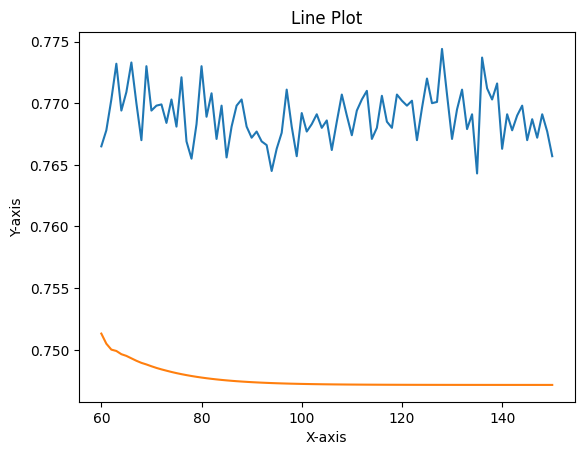

(4, 6)
60
1/1 [==============================] - 0s 31ms/step
61
1/1 [==============================] - 0s 40ms/step
62
1/1 [==============================] - 0s 28ms/step
63
1/1 [==============================] - 0s 28ms/step
64
1/1 [==============================] - 0s 27ms/step
65
1/1 [==============================] - 0s 33ms/step
66
1/1 [==============================] - 0s 29ms/step
67
1/1 [==============================] - 0s 26ms/step
68
1/1 [==============================] - 0s 27ms/step
69
1/1 [==============================] - 0s 26ms/step
70
1/1 [==============================] - 0s 28ms/step
71
1/1 [==============================] - 0s 34ms/step
72
1/1 [==============================] - 0s 47ms/step
73
1/1 [==============================] - 0s 32ms/step
74
1/1 [==============================] - 0s 29ms/step
75
1/1 [==============================] - 0s 31ms/step
76
1/1 [==============================] - 0s 31ms/step
77
1/1 [==============================] - 0s 26ms/step
78


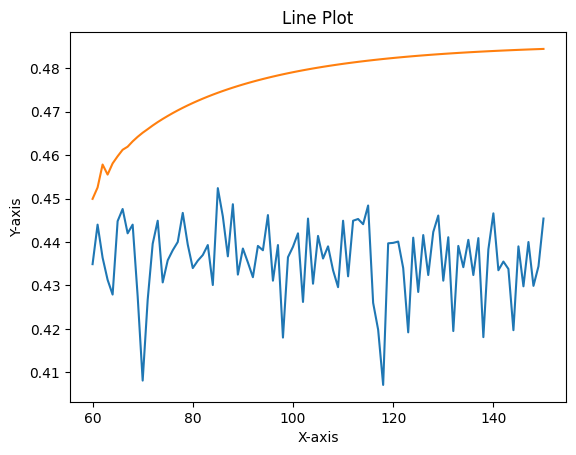

(4, 6)
60
1/1 [==============================] - 0s 62ms/step
61
1/1 [==============================] - 0s 43ms/step
62
1/1 [==============================] - 0s 83ms/step
63
1/1 [==============================] - 0s 65ms/step
64
1/1 [==============================] - 0s 74ms/step
65
1/1 [==============================] - 0s 83ms/step
66
1/1 [==============================] - 0s 71ms/step
67
1/1 [==============================] - 0s 56ms/step
68
1/1 [==============================] - 0s 58ms/step
69
1/1 [==============================] - 0s 48ms/step
70
1/1 [==============================] - 0s 71ms/step
71
1/1 [==============================] - 0s 77ms/step
72
1/1 [==============================] - 0s 39ms/step
73
1/1 [==============================] - 0s 52ms/step
74
1/1 [==============================] - 0s 77ms/step
75
1/1 [==============================] - 0s 70ms/step
76
1/1 [==============================] - 0s 75ms/step
77
1/1 [==============================] - 0s 78ms/step
78


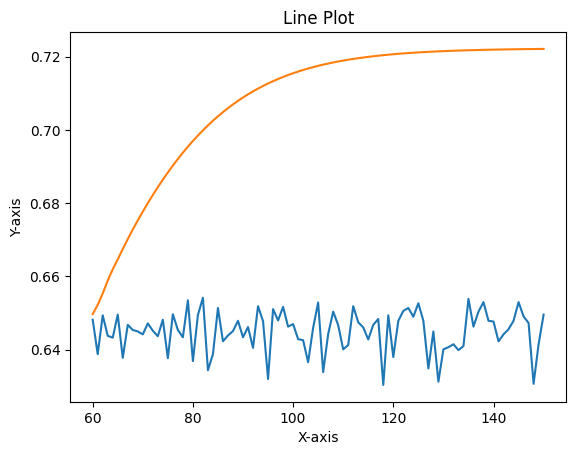

(4, 6)
60
1/1 [==============================] - 0s 31ms/step
61
1/1 [==============================] - 0s 30ms/step
62
1/1 [==============================] - 0s 34ms/step
63
1/1 [==============================] - 0s 29ms/step
64
1/1 [==============================] - 0s 28ms/step
65
1/1 [==============================] - 0s 28ms/step
66
1/1 [==============================] - 0s 28ms/step
67
1/1 [==============================] - 0s 33ms/step
68
1/1 [==============================] - 0s 28ms/step
69
1/1 [==============================] - 0s 44ms/step
70
1/1 [==============================] - 0s 57ms/step
71
1/1 [==============================] - 0s 33ms/step
72
1/1 [==============================] - 0s 29ms/step
73
1/1 [==============================] - 0s 29ms/step
74
1/1 [==============================] - 0s 30ms/step
75
1/1 [==============================] - 0s 28ms/step
76
1/1 [==============================] - 0s 32ms/step
77
1/1 [==============================] - 0s 28ms/step
78


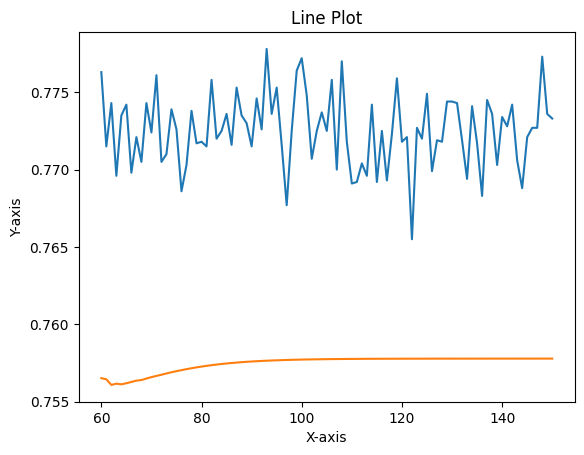

(4, 6)
60
1/1 [==============================] - 0s 52ms/step
61
1/1 [==============================] - 0s 62ms/step
62
1/1 [==============================] - 0s 63ms/step
63
1/1 [==============================] - 0s 78ms/step
64
1/1 [==============================] - 0s 40ms/step
65
1/1 [==============================] - 0s 30ms/step
66
1/1 [==============================] - 0s 30ms/step
67
1/1 [==============================] - 0s 29ms/step
68
1/1 [==============================] - 0s 29ms/step
69
1/1 [==============================] - 0s 44ms/step
70
1/1 [==============================] - 0s 63ms/step
71
1/1 [==============================] - 0s 45ms/step
72
1/1 [==============================] - 0s 31ms/step
73
1/1 [==============================] - 0s 29ms/step
74
1/1 [==============================] - 0s 29ms/step
75
1/1 [==============================] - 0s 29ms/step
76
1/1 [==============================] - 0s 28ms/step
77
1/1 [==============================] - 0s 29ms/step
78


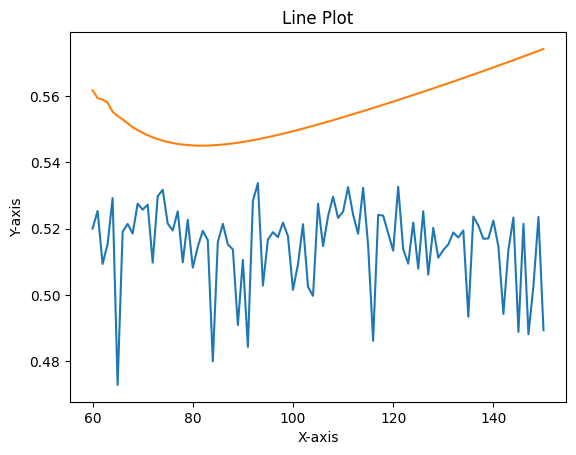

(4, 6)
60
1/1 [==============================] - 0s 38ms/step
61
1/1 [==============================] - 0s 57ms/step
62
1/1 [==============================] - 0s 56ms/step
63
1/1 [==============================] - 0s 30ms/step
64
1/1 [==============================] - 0s 28ms/step
65
1/1 [==============================] - 0s 27ms/step
66
1/1 [==============================] - 0s 28ms/step
67
1/1 [==============================] - 0s 35ms/step
68
1/1 [==============================] - 0s 28ms/step
69
1/1 [==============================] - 0s 26ms/step
70
1/1 [==============================] - 0s 29ms/step
71
1/1 [==============================] - 0s 28ms/step
72
1/1 [==============================] - 0s 27ms/step
73
1/1 [==============================] - 0s 27ms/step
74
1/1 [==============================] - 0s 27ms/step
75
1/1 [==============================] - 0s 27ms/step
76
1/1 [==============================] - 0s 28ms/step
77
1/1 [==============================] - 0s 27ms/step
78


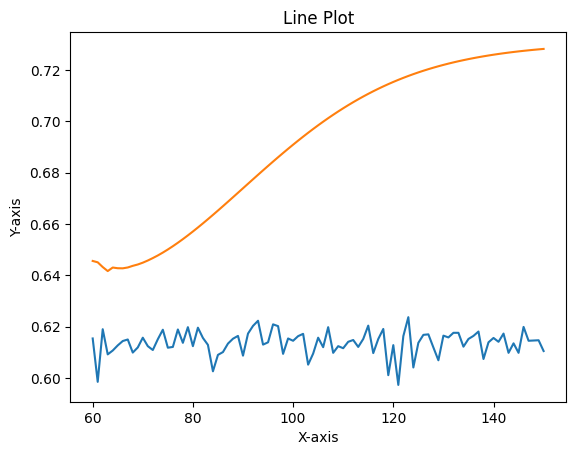

(4, 6)
60
1/1 [==============================] - 0s 29ms/step
61
1/1 [==============================] - 0s 32ms/step
62
1/1 [==============================] - 0s 31ms/step
63
1/1 [==============================] - 0s 29ms/step
64
1/1 [==============================] - 0s 28ms/step
65
1/1 [==============================] - 0s 29ms/step
66
1/1 [==============================] - 0s 30ms/step
67
1/1 [==============================] - 0s 28ms/step
68
1/1 [==============================] - 0s 30ms/step
69
1/1 [==============================] - 0s 28ms/step
70
1/1 [==============================] - 0s 29ms/step
71
1/1 [==============================] - 0s 27ms/step
72
1/1 [==============================] - 0s 43ms/step
73
1/1 [==============================] - 0s 28ms/step
74
1/1 [==============================] - 0s 28ms/step
75
1/1 [==============================] - 0s 31ms/step
76
1/1 [==============================] - 0s 46ms/step
77
1/1 [==============================] - 0s 39ms/step
78


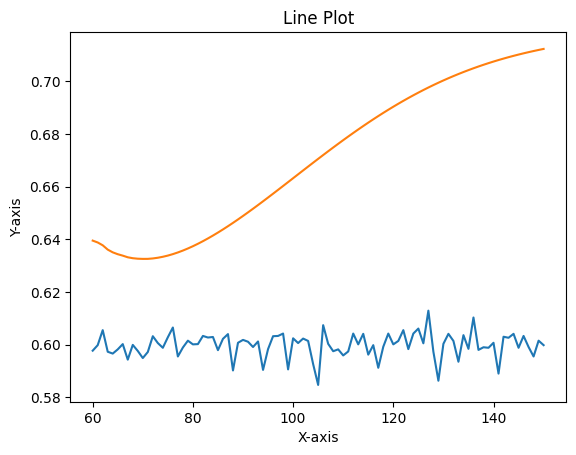

(4, 6)
60
1/1 [==============================] - 0s 54ms/step
61
1/1 [==============================] - 0s 70ms/step
62
1/1 [==============================] - 0s 47ms/step
63
1/1 [==============================] - 0s 41ms/step
64
1/1 [==============================] - 0s 45ms/step
65
1/1 [==============================] - 0s 65ms/step
66
1/1 [==============================] - 0s 69ms/step
67
1/1 [==============================] - 0s 57ms/step
68
1/1 [==============================] - 0s 64ms/step
69
1/1 [==============================] - 0s 32ms/step
70
1/1 [==============================] - 0s 66ms/step
71
1/1 [==============================] - 0s 38ms/step
72
1/1 [==============================] - 0s 58ms/step
73
1/1 [==============================] - 0s 39ms/step
74
1/1 [==============================] - 0s 41ms/step
75
1/1 [==============================] - 0s 30ms/step
76
1/1 [==============================] - 0s 58ms/step
77
1/1 [==============================] - 0s 65ms/step
78


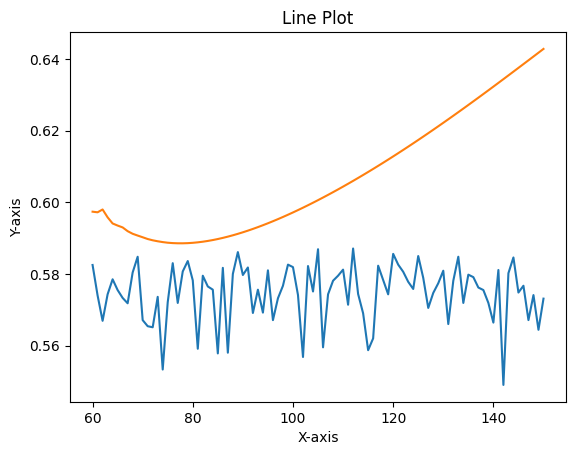

[(5, 150, 2.3162452102184297), (10, 150, 2.2961814697265623), (20, 150, 2.141207390832901), (30, 150, 1.994996822166443), (60, 150, 1.7205921051979063)]


In [71]:
combinations=[(5, 150), (10, 150), (20, 150), (30, 150), (60, 150)]
result=[]
for E,M in combinations:
  error=0
  for index,row in test_df.iterrows():
    error+=create_test_data(E,M,row,loaded_model)
  result.append((E,M,error))
  
print(result)